In [1]:
!pip install scikit-optimize

In [2]:
!pip install statsmodels

In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

import statsmodels.stats.api as sms
from matplotlib import style
style.use('seaborn')
%matplotlib inline
#graphs in svg look clearer
%config InlineBackend.figure_format = 'svg' 

In [4]:
import warnings
warnings.filterwarnings("ignore")

# Functions

In [5]:
from sklearn import metrics

def mae(y_gt, Y_pr):
    return metrics.mean_absolute_error(y_gt, Y_pr)

def mse(y_gt, Y_pr):
    return metrics.mean_squared_error(y_gt, Y_pr)

def rmse(y_gt, Y_pr):
    my_mse = mse(y_gt, Y_pr)
    return np.sqrt(my_mse)

def medae(y_gt, Y_pr):
    return metrics.median_absolute_error(y_gt, Y_pr)

def R2(y_gt, Y_pr):
    return metrics.r2_score(y_gt, Y_pr)

def calc_metrics(true, pred):

    mse1 = mse(true, pred)

    rmse1 = rmse(true, pred)

    mae1 = mae(true, pred)

    medae1 = medae(true, pred)

    R21 = R2(true, pred)

    print('*** VAL **: ')
    print("MSE:   {}\nRMSE:  {}\nR2:    {}\nMAE:   {}\nMedAE: {}".format(mse1, rmse1, R21, mae1, medae1))
    print('-'*30)

In [6]:
def target_distr_linear(train_label, test_label, predicted_dv): 
    sns.kdeplot(train_label, label='train')
    sns.kdeplot(test_label, label='test')
    sns.kdeplot(predicted_dv, label='pred')
    plt.legend()
    plt.show()

    sns.scatterplot(test_label, predicted_dv, color='blueviolet')
    plt.title('Linear model')
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.show()

In [7]:
from scipy.stats import norm

def draw_histogram(data):
    f,ax_hist = plt.subplots(1)
    sns.distplot(data, hist=True,  kde=True, rug=True, bins=10, fit=norm, ax=ax_hist);
    plt.xlabel("values")
    plt.title("Distribution") 

    mean=data.mean()

    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()

    plt.show()

In [8]:
def draw_res_analys(errors, pred):
    sns.scatterplot(list(range(len(errors))),errors);
    plt.title("Distibution of errors")
    plt.ylabel('Error');
    plt.xlabel('Index');
    plt.show();

    sns.scatterplot(pred,errors);
    plt.title('Relationship of true value vs error (resudual analysis)')
    plt.ylabel('Error');
    plt.xlabel('True value');
    plt.show();

In [9]:
def get_feature_imp(model, X_train):
    imp = model.get_feature_importance(data=X_train)
    fig, axes = plt.subplots(1, 1, figsize=(12, 8))
    axes.barh(width=imp, y=model.feature_names_)
    axes.set_title('Finetuned Catboost feature importance')
    plt.show()

# Unhashing

In [10]:
genre_mapping = {'0ef0aa70-f86c-4141-8054-8b39af97867d': 'Biography',
                '287a1485-7a88-4c2f-bc94-ca418b6c47a1': 'Cartoons',
                '66fad8c3-d84f-458d-a8bf-5b4f154969e0': 'Show',
                '7b7c97f6-1adb-4b43-bfe8-9455812fac0b': 'Theater',
                '9fa28b61-a257-4a3e-945b-a9ef76a146d6': 'Fantasy',
                'b0836a1d-635f-4d89-bcc5-25d10ba56642': 'Anime',
                'd7214feb-8c11-4aea-aabb-ac98a8d56fd5': 'History',
                'dc65dbc8-34ba-4df1-b32c-4f895e10bff8': 'Shorts',
                'eb001d27-5be3-4d42-9d88-90d593f2627d': 'War_movies',
                '364fdc2e-bdfe-40be-b2c5-d30f43ec432e': 'Crime'}

In [11]:
types_mapping = {'1f22ccf1-288a-4e6e-b39a-7502799e7125': 'Лекции',
    '6d640e04-be3a-4c8c-852e-4e9b12449d5d': 'Концерты',
    '7b7c97f6-1adb-4b43-bfe8-9455812fac0b': 'Театр',
    '2f7908cc-e2fd-43cf-b626-ec1aef436160': 'Курсы' }

In [12]:
import pickle

with open('./income_target.pkl', 'rb') as f:
    df = pickle.load(f, encoding='utf-8')

In [13]:
df.shape

(6036, 21)

In [14]:
all_genres = []

for item_genres in df['genre']:
    all_genres.extend(item_genres)

In [15]:
all_unique_genres = set(all_genres)

In [16]:
len(all_unique_genres)

27

In [17]:
all_unique_genres

{'0ef0aa70-f86c-4141-8054-8b39af97867d',
 '287a1485-7a88-4c2f-bc94-ca418b6c47a1',
 '364fdc2e-bdfe-40be-b2c5-d30f43ec432e',
 '3e6e08b4-2bb0-46d6-aee7-98780e394c86',
 '5c403894-146a-47a4-ae75-9f1956a30dbb',
 '7b7c97f6-1adb-4b43-bfe8-9455812fac0b',
 '9fa28b61-a257-4a3e-945b-a9ef76a146d6',
 'Action',
 'Adventure',
 'ArtHouse',
 'Comedy',
 'Detective',
 'Documentary',
 'Drama',
 'Family',
 'ForKids',
 'Horror',
 'Humor',
 'Melodrama',
 'Music',
 'Sci-Fi',
 'Sport',
 'Thriller',
 'b0836a1d-635f-4d89-bcc5-25d10ba56642',
 'd7214feb-8c11-4aea-aabb-ac98a8d56fd5',
 'dc65dbc8-34ba-4df1-b32c-4f895e10bff8',
 'eb001d27-5be3-4d42-9d88-90d593f2627d'}

In [18]:
decoded_genres = [genre_mapping.get(genre, genre) for genre in all_unique_genres]

In [19]:
decoded_genres

['Crime',
 'Thriller',
 'Melodrama',
 'War_movies',
 'Horror',
 'Drama',
 '3e6e08b4-2bb0-46d6-aee7-98780e394c86',
 'Fantasy',
 'Theater',
 'Music',
 'ArtHouse',
 'Cartoons',
 'Sci-Fi',
 'History',
 'Biography',
 'Anime',
 '5c403894-146a-47a4-ae75-9f1956a30dbb',
 'Comedy',
 'Documentary',
 'Family',
 'Sport',
 'ForKids',
 'Humor',
 'Detective',
 'Adventure',
 'Shorts',
 'Action']

In [20]:
all_genres = []

for col in ['actor', 'country', 'genre', 'director']:
    print(f'======{col}======')
    all_values = []
    for i, item_values in enumerate(df[col]):
        try:
            all_values.extend(item_values)
        except:
            print(i, item_values)
    all_values = set(all_values)
    print('Len:', len(all_values))
    # print(all_values)

======actor======
Len: 19196
======country======
Len: 98
======genre======
Len: 27
======director======
Len: 4178


# Preprocessing

In [21]:
prep_df = df.copy(deep=True)

In [22]:
prep_df.shape

(6036, 21)

In [23]:
prep_df.head(1).T

,0
availability,[SUBSCRIPTION]
actor,"[cff3362f-ad91-498d-80b3-ea3ab8ec65cf, a51b376..."
age_access_type,0
country,"[usa, canada]"
average_rating,6.21
duration,4860000
type,MOVIE
name,Большое путешествие
release_year,2006
genre,"[Family, 287a1485-7a88-4c2f-bc94-ca418b6c47a1]"


### filter by year

In [28]:
prep_df = prep_df[prep_df['release_year'] >= 2000]

In [27]:
ddd = prep_df[prep_df['release_year'] >= 2020]

ddd.shape

(814, 21)

In [26]:
ddd = prep_df[prep_df['release_year'] >= 2021]

ddd.shape

(328, 21)

### ohe

In [29]:
def add_topN_feature(df, col, n: int):
    items = []
    
    for i in df[col]:
        items.extend(i)

    topN = [x[0] for x in Counter(items).most_common()][:n]
    df[f'top{n}{col}'] = df[col].apply(lambda x: [int(item in x) for item in topN])
    df.drop(col, axis=1, inplace=True)
    return topN, f'top{n}{col}'

def ohe_topN_features(df, topN, cat):
    for i in range(len(topN)):
        df[f'{topN[i]}'] = [item[i] for item in df[cat]]
    df.drop(cat, axis=1, inplace=True)
    return df

In [30]:
top10genres, name = add_topN_feature(prep_df, 'genre', 10)
prep_df = ohe_topN_features(prep_df, top10genres, name)

top10actors, name = add_topN_feature(prep_df, 'actor', 10)
prep_df = ohe_topN_features(prep_df, top10actors, name)

top3directors, name = add_topN_feature(prep_df, 'director', 3)
prep_df = ohe_topN_features(prep_df, top3directors, name)

top5countries, name = add_topN_feature(prep_df, 'country', 5)
prep_df = ohe_topN_features(prep_df, top5countries, name)

In [31]:
prep_df.columns

Index(['age_access_type', 'average_rating', 'duration', 'type', 'name',
       'release_year', 'element_uid', 'subscription_only', 'av_rate_x',
       'av_rate_y', 'users_number_x', 'users_number_y', 'user_count_3months',
       'av_ratings_3months', 'min_ts', 'price', 'Drama', 'Comedy', 'Thriller',
       'Action', 'Adventure', 'Horror', 'Sci-Fi', 'Family',
       '364fdc2e-bdfe-40be-b2c5-d30f43ec432e', 'Melodrama',
       'fd401c6b-3e00-4f7f-aea7-5512df6b91e0',
       '5463b4bc-e332-415c-aca8-11c0f217a9eb',
       'fbdae856-85b9-4d4a-96dd-cc383571a488',
       '9703b641-2566-4e58-aebb-8d140805c0f3',
       'b6a30330-1dcb-4093-b6a9-ce0f779874c2',
       '586f8d5a-2f17-42a3-b066-667f7c26a842',
       '2ab01676-2af6-4abb-8dde-dc51e7e22372',
       'dfd861c4-d2de-4bb6-bc6e-bae3f92a18a9',
       '0715c765-eb7d-4138-bed7-e515a04619e8',
       '7f890e13-4be1-4873-9df7-d144bdd91e50',
       'f7ded2b9-7c98-47ab-bfc4-57fb60bf946c',
       '799561d3-10b0-420d-93be-8138a07ac693',
       '98f07d1

In [32]:
cols = ['age_access_type', 'average_rating',
        'duration', 'type',
       'price', 'Drama', 'Comedy', 'Thriller',
       'Action', 'Adventure', 'Horror', 'Sci-Fi', 'Family',
       '364fdc2e-bdfe-40be-b2c5-d30f43ec432e', 'Melodrama',
       'fd401c6b-3e00-4f7f-aea7-5512df6b91e0',
       '5463b4bc-e332-415c-aca8-11c0f217a9eb',
       'fbdae856-85b9-4d4a-96dd-cc383571a488',
       '9703b641-2566-4e58-aebb-8d140805c0f3',
       'b6a30330-1dcb-4093-b6a9-ce0f779874c2',
       '586f8d5a-2f17-42a3-b066-667f7c26a842',
       '2ab01676-2af6-4abb-8dde-dc51e7e22372',
       'dfd861c4-d2de-4bb6-bc6e-bae3f92a18a9',
       '0715c765-eb7d-4138-bed7-e515a04619e8',
       '7f890e13-4be1-4873-9df7-d144bdd91e50',
       'f7ded2b9-7c98-47ab-bfc4-57fb60bf946c',
       '799561d3-10b0-420d-93be-8138a07ac693',
       '98f07d1e-d498-49b3-8ac8-30a5fc1dabfc', 'usa', 'russia',
       'great-britain', 'france', 'germany']

In [33]:
prep_df = prep_df[cols]

In [34]:
num_features = ['average_rating', 'duration']
skewed_num_features = ['duration'] 

In [35]:
from collections import Counter
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
from sklearn.model_selection import train_test_split
# from spacy.tokenizer import Tokenizer
# from spacy.lang.en import English
# nlp = English()
import pandas as pd

class Preprocesser:
    def __init__(self, 
#                 mulpiple_cat_features: list,
                skewed_num_features: list,
               # text_features: list,
               # release_year_feature: str,
#                 mltpl_cat_n_top: dict
                ):
#         self.mulpiple_cat_features = mulpiple_cat_features
        self.skewed_num_features = skewed_num_features
        #self.text_features = text_features
#         self.mltpl_cat_n_top = mltpl_cat_n_top
       # self.release_year_feature = release_year_feature
        # self.tokenizer = Tokenizer(nlp.vocab)
        
    def __get_top_n_mltpl_cat_features(self, df_pr, col):
        all_cats = []
        for element_values in df_pr[col]:
            all_cats.extend(element_values)
        return Counter(all_cats).most_common(self.mltpl_cat_n_top[col])
            
    def __preprocess_mulpiple_cat_features(self, df_pr):
        for col in self.mulpiple_cat_features:
            feature_number = self.mltpl_cat_n_top[col]
            df_pr[[f'{col}_{i}' for i in range(feature_number)]] = pd.DataFrame(np.full((len(df), feature_number), np.nan))
            for i in df_pr.index:
                names = df_pr.loc[i, col]
                for k, name in enumerate(names[:int(feature_number)]):
                    df_pr.loc[i, f'{col}_{k}'] = name
            df_pr.drop(col, axis=1, inplace=True)

        return df_pr
    
    def __preprocess_skewed_num_features(self, df_pr):
        for col in self.skewed_num_features:
            df_pr[col] = df_pr[col].apply(lambda x: np.log1p(x))
        return df_pr
    
    def __preprocess_text_features(self, df_pr):
        for col in self.text_features:
            df_pr[col] = df_pr[col].apply(lambda x: self.tokenizer(x))
        return df_pr
            
    def preprocess(self,
                   df: pd.DataFrame):
        df_pr = df.copy()
#         df_pr = self.__preprocess_mulpiple_cat_features(df_pr)
        df_pr = self.__preprocess_skewed_num_features(df_pr)
        # df_pr = self.__preprocess_text_features(df_pr)
        
        return df_pr
        

In [36]:
preprocesser = Preprocesser(
#     mltpl_cat_features,
            skewed_num_features,
            #text_features,
#             mltpl_cat_n_top
)

In [37]:
df_pr = preprocesser.preprocess(prep_df)

In [38]:
df_pr.head().T

,0,1,5,6,7
age_access_type,0,16,12,16,16
average_rating,6.21,NaN,6.78,7.75,6.0
duration,15.396549,15.479437,15.384127,15.846287,15.576811
type,MOVIE,MOVIE,MOVIE,MOVIE,MOVIE
price,56468.0,114578.0,346649.0,341701.0,108865.0
Drama,0,1,0,0,0
Comedy,0,1,0,0,0
Thriller,0,0,0,1,1
Action,0,0,0,1,1
Adventure,0,0,0,1,1


In [39]:
df_pr.isnull().sum()

age_access_type                           0
average_rating                          178
duration                                  0
type                                      0
price                                     0
Drama                                     0
Comedy                                    0
Thriller                                  0
Action                                    0
Adventure                                 0
Horror                                    0
Sci-Fi                                    0
Family                                    0
364fdc2e-bdfe-40be-b2c5-d30f43ec432e      0
Melodrama                                 0
fd401c6b-3e00-4f7f-aea7-5512df6b91e0      0
5463b4bc-e332-415c-aca8-11c0f217a9eb      0
fbdae856-85b9-4d4a-96dd-cc383571a488      0
9703b641-2566-4e58-aebb-8d140805c0f3      0
b6a30330-1dcb-4093-b6a9-ce0f779874c2      0
586f8d5a-2f17-42a3-b066-667f7c26a842      0
2ab01676-2af6-4abb-8dde-dc51e7e22372      0
dfd861c4-d2de-4bb6-bc6e-bae3f92a

In [41]:
df_pr['average_rating'] = df_pr['average_rating'].astype(float)
# data['age_access_type'] =data['age_access_type'].astype(int)

## Split

In [106]:
X, y = df_pr.drop('price', axis=1), df_pr['price']

y = y.apply(lambda x: np.log1p(x))

In [107]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, shuffle=False)

In [108]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42, shuffle=False)

In [109]:
X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape

((4048, 32), (450, 32), (500, 32), (4048,), (450,), (500,))

### OHE

In [110]:
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(dtype='int8', handle_unknown='ignore')

enc_train = enc.fit_transform(X_train[['age_access_type', 'type']])

In [111]:
enc_train = pd.DataFrame(enc_train.toarray())

enc_train.columns = enc.get_feature_names_out(['age_access_type', 'type'])

X_train.drop(['age_access_type', 'type'], axis=1, inplace=True)
X_train = X_train.merge(enc_train, on=X_train.index, how='left', sort=False)

In [112]:
enc_test = enc.transform(X_test[['age_access_type', 'type']])

enc_test = pd.DataFrame(enc_test.toarray())

enc_test.columns = enc.get_feature_names_out(['age_access_type', 'type'])

X_test.drop(['age_access_type', 'type'], axis=1, inplace=True)
X_test = X_test.merge(enc_test, on=X_test.index, how='left', sort=False)

In [113]:
enc_val = enc.transform(X_val[['age_access_type', 'type']])

enc_val = pd.DataFrame(enc_val.toarray())

enc_val.columns = enc.get_feature_names_out(['age_access_type', 'type'])

X_val.drop(['age_access_type', 'type'], axis=1, inplace=True)
X_val = X_val.merge(enc_val, on=X_val.index, how='left', sort=False)

### Model

In [114]:
import catboost as cat
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

from scipy.stats import uniform, randint

In [115]:
X_train.head(1)

,key_0,average_rating,duration,Drama,Comedy,Thriller,Action,Adventure,Horror,Sci-Fi,...,russia,great-britain,france,germany,age_access_type_0,age_access_type_6,age_access_type_12,age_access_type_16,age_access_type_18,type_MOVIE
0,0,6.21,15.396549,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1


In [116]:
X_train.drop('key_0', inplace=True, axis=1)
X_test.drop('key_0', inplace=True, axis=1)
X_val.drop('key_0', inplace=True, axis=1)

In [117]:
train_dataset = cat.Pool(data=X_train,
                        label=y_train,
#                          cat_features=cat_features
                        )

test_dataset = cat.Pool(data=X_test, 
                        label=y_test,
#                          cat_features=cat_features
                       )

val_dataset = cat.Pool(X_val, y_val,
#                        cat_features=cat_features
                      )

cat_params = {
    'loss_function': 'RMSE',
    'eval_metric': 'MAE',
    'verbose': True,
    'random_seed': 321,
    'allow_writing_files': False, 
#     'cat_features': cat_features
}

cat_model = cat.CatBoostRegressor(**cat_params)

cat_model.fit(
    train_dataset,
    eval_set=val_dataset,
    early_stopping_rounds=500,
    verbose=100,
    plot=False
)

Learning rate set to 0.063421
0:	learn: 1.9518699	test: 2.1606732	best: 2.1606732 (0)	total: 5.08ms	remaining: 5.07s
100:	learn: 1.6896527	test: 1.8711180	best: 1.8709721 (98)	total: 123ms	remaining: 1.1s
200:	learn: 1.6158531	test: 1.8497955	best: 1.8493039 (199)	total: 253ms	remaining: 1s
300:	learn: 1.5584808	test: 1.8459019	best: 1.8459019 (300)	total: 375ms	remaining: 871ms
400:	learn: 1.5057021	test: 1.8463515	best: 1.8440953 (313)	total: 508ms	remaining: 759ms
500:	learn: 1.4609935	test: 1.8531248	best: 1.8440953 (313)	total: 627ms	remaining: 624ms
600:	learn: 1.4190131	test: 1.8520714	best: 1.8440953 (313)	total: 744ms	remaining: 494ms
700:	learn: 1.3800197	test: 1.8601395	best: 1.8440953 (313)	total: 866ms	remaining: 369ms
800:	learn: 1.3407553	test: 1.8625431	best: 1.8440953 (313)	total: 988ms	remaining: 245ms
Stopped by overfitting detector  (500 iterations wait)

bestTest = 1.844095274
bestIteration = 313

Shrink model to first 314 iterations.


In [118]:
y_pred = cat_model.predict(test_dataset)

In [119]:
def inverse_transform(feature):
    return np.expm1(feature)

calc_metrics(inverse_transform(y_test), inverse_transform(y_pred))

*** VAL **: 
MSE:   158318137270.4417
RMSE:  397892.117627934
R2:    -0.035137769712101585
MAE:   134892.95076107417
MedAE: 27025.008422805975
------------------------------


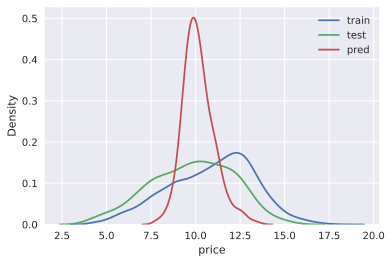

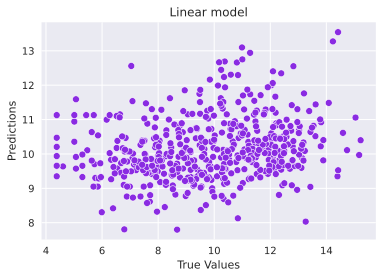

In [120]:
target_distr_linear(y_train, y_test, y_pred)   

In [121]:
cat_model.save_model('cat_reg_income_ohe')

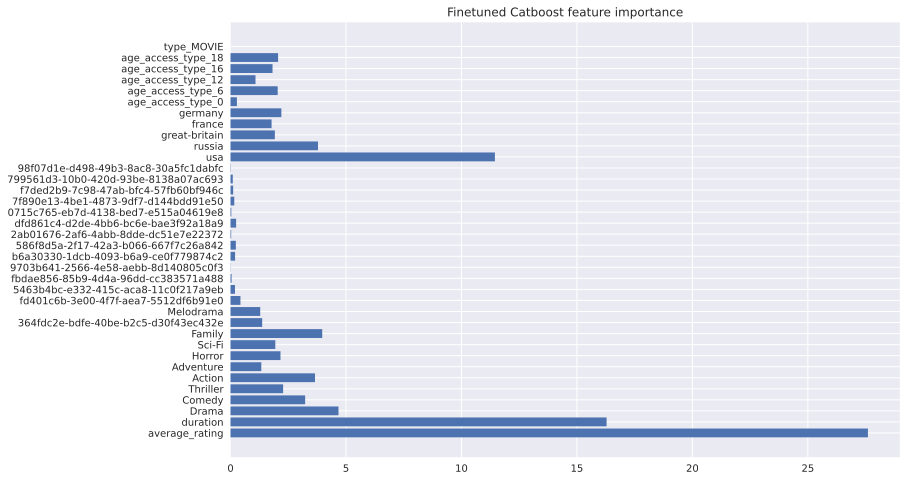

In [122]:
get_feature_imp(cat_model, train_dataset)

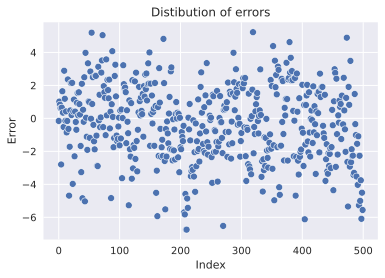

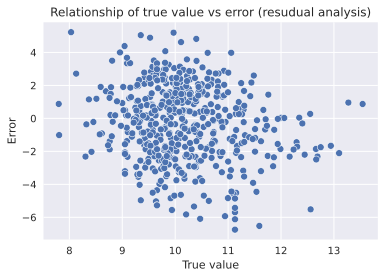

In [123]:
errors = y_test - y_pred
draw_res_analys(errors, y_pred)

# Tuning

In [124]:
train_dataset = cat.Pool(X_train, 
                         y_train,
#                          cat_features=cat_features
                        )

test_dataset = cat.Pool(X_test, 
                        y_test,
#                         cat_features=cat_features
                       )

cat_params = {
    'loss_function': 'RMSE',
    'eval_metric': 'MAE',
    'verbose': True,
    'random_seed': 321,
    'allow_writing_files': False, 
#     'cat_features': cat_features
}

In [125]:
parameters_distr = {'depth': randint(3, 7),
              'learning_rate': uniform(0.01, 0.1),
              'iterations': [100, 1000, 5000]
             }

cat_model = cat.CatBoostRegressor(**cat_params)
grid = RandomizedSearchCV(estimator=cat_model, param_distributions=parameters_distr, 
                            cv=5, 
#                           n_jobs=-1,
                          verbose=3)

grid.fit(X_train, y_train)

import pickle
with open('bestimator_income_tune', 'wb') as f:
    pickle.dump(grid.best_estimator_, f)
grid.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits
0:	learn: 1.9643628	total: 2.13ms	remaining: 211ms
1:	learn: 1.9569100	total: 19.8ms	remaining: 972ms
2:	learn: 1.9488238	total: 20.7ms	remaining: 670ms
3:	learn: 1.9416969	total: 21.5ms	remaining: 515ms
4:	learn: 1.9348924	total: 22.2ms	remaining: 422ms
5:	learn: 1.9282664	total: 23.1ms	remaining: 361ms
6:	learn: 1.9213938	total: 23.7ms	remaining: 315ms
7:	learn: 1.9150620	total: 24.6ms	remaining: 283ms
8:	learn: 1.9088698	total: 25.3ms	remaining: 256ms
9:	learn: 1.9029924	total: 26ms	remaining: 234ms
10:	learn: 1.8980882	total: 26.7ms	remaining: 216ms
11:	learn: 1.8932434	total: 27.5ms	remaining: 201ms
12:	learn: 1.8884225	total: 28.2ms	remaining: 189ms
13:	learn: 1.8832700	total: 29ms	remaining: 178ms
14:	learn: 1.8777900	total: 29.8ms	remaining: 169ms
15:	learn: 1.8730176	total: 30.5ms	remaining: 160ms
16:	learn: 1.8691596	total: 31.2ms	remaining: 152ms
17:	learn: 1.8644783	total: 31.9ms	remaining: 145ms
18:	learn: 1.8598

74:	learn: 1.7644555	total: 61.1ms	remaining: 20.4ms
75:	learn: 1.7639194	total: 62ms	remaining: 19.6ms
76:	learn: 1.7631264	total: 62.8ms	remaining: 18.8ms
77:	learn: 1.7622652	total: 63.6ms	remaining: 17.9ms
78:	learn: 1.7611437	total: 64.4ms	remaining: 17.1ms
79:	learn: 1.7602500	total: 65.2ms	remaining: 16.3ms
80:	learn: 1.7594565	total: 66.5ms	remaining: 15.6ms
81:	learn: 1.7587910	total: 67.4ms	remaining: 14.8ms
82:	learn: 1.7582471	total: 68.1ms	remaining: 13.9ms
83:	learn: 1.7577306	total: 68.8ms	remaining: 13.1ms
84:	learn: 1.7563744	total: 69.6ms	remaining: 12.3ms
85:	learn: 1.7553604	total: 70.4ms	remaining: 11.5ms
86:	learn: 1.7551112	total: 71.1ms	remaining: 10.6ms
87:	learn: 1.7545373	total: 71.8ms	remaining: 9.79ms
88:	learn: 1.7540037	total: 72.5ms	remaining: 8.96ms
89:	learn: 1.7537777	total: 73.5ms	remaining: 8.16ms
90:	learn: 1.7533537	total: 74.2ms	remaining: 7.34ms
91:	learn: 1.7521108	total: 75ms	remaining: 6.52ms
92:	learn: 1.7514186	total: 75.7ms	remaining: 5.7m

1:	learn: 1.9300395	total: 2.08ms	remaining: 1.04s
2:	learn: 1.9108658	total: 2.86ms	remaining: 949ms
3:	learn: 1.8945636	total: 3.62ms	remaining: 901ms
4:	learn: 1.8804382	total: 4.37ms	remaining: 870ms
5:	learn: 1.8681422	total: 5.2ms	remaining: 861ms
6:	learn: 1.8563757	total: 5.89ms	remaining: 835ms
7:	learn: 1.8458366	total: 6.59ms	remaining: 817ms
8:	learn: 1.8374935	total: 7.3ms	remaining: 804ms
9:	learn: 1.8286448	total: 8.04ms	remaining: 796ms
10:	learn: 1.8210899	total: 8.89ms	remaining: 799ms
11:	learn: 1.8148457	total: 9.57ms	remaining: 788ms
12:	learn: 1.8085859	total: 10.3ms	remaining: 779ms
13:	learn: 1.8035516	total: 11.5ms	remaining: 813ms
14:	learn: 1.7973554	total: 12.2ms	remaining: 801ms
15:	learn: 1.7930670	total: 12.9ms	remaining: 791ms
16:	learn: 1.7903363	total: 13.5ms	remaining: 783ms
17:	learn: 1.7849213	total: 14.3ms	remaining: 778ms
18:	learn: 1.7810618	total: 14.9ms	remaining: 771ms
19:	learn: 1.7774724	total: 15.6ms	remaining: 764ms
20:	learn: 1.7752477	to

265:	learn: 1.5504788	total: 198ms	remaining: 545ms
266:	learn: 1.5502994	total: 198ms	remaining: 545ms
267:	learn: 1.5495719	total: 199ms	remaining: 544ms
268:	learn: 1.5492365	total: 200ms	remaining: 543ms
269:	learn: 1.5487906	total: 201ms	remaining: 542ms
270:	learn: 1.5486296	total: 201ms	remaining: 541ms
271:	learn: 1.5477671	total: 202ms	remaining: 540ms
272:	learn: 1.5477282	total: 203ms	remaining: 540ms
273:	learn: 1.5471105	total: 203ms	remaining: 539ms
274:	learn: 1.5459177	total: 204ms	remaining: 538ms
275:	learn: 1.5455761	total: 205ms	remaining: 537ms
276:	learn: 1.5448474	total: 206ms	remaining: 536ms
277:	learn: 1.5440996	total: 206ms	remaining: 536ms
278:	learn: 1.5434191	total: 207ms	remaining: 535ms
279:	learn: 1.5426902	total: 208ms	remaining: 534ms
280:	learn: 1.5425602	total: 208ms	remaining: 533ms
281:	learn: 1.5418331	total: 209ms	remaining: 532ms
282:	learn: 1.5412291	total: 210ms	remaining: 531ms
283:	learn: 1.5406192	total: 210ms	remaining: 531ms
284:	learn: 

519:	learn: 1.4258710	total: 393ms	remaining: 363ms
520:	learn: 1.4255618	total: 395ms	remaining: 363ms
521:	learn: 1.4247265	total: 395ms	remaining: 362ms
522:	learn: 1.4243058	total: 396ms	remaining: 361ms
523:	learn: 1.4238795	total: 397ms	remaining: 361ms
524:	learn: 1.4237033	total: 398ms	remaining: 360ms
525:	learn: 1.4233233	total: 400ms	remaining: 361ms
526:	learn: 1.4228669	total: 402ms	remaining: 360ms
527:	learn: 1.4225959	total: 403ms	remaining: 360ms
528:	learn: 1.4219364	total: 404ms	remaining: 359ms
529:	learn: 1.4213500	total: 405ms	remaining: 359ms
530:	learn: 1.4212128	total: 406ms	remaining: 359ms
531:	learn: 1.4210151	total: 407ms	remaining: 358ms
532:	learn: 1.4208315	total: 408ms	remaining: 357ms
533:	learn: 1.4208275	total: 409ms	remaining: 357ms
534:	learn: 1.4199991	total: 410ms	remaining: 356ms
535:	learn: 1.4197072	total: 410ms	remaining: 355ms
536:	learn: 1.4191092	total: 411ms	remaining: 354ms
537:	learn: 1.4187846	total: 412ms	remaining: 354ms
538:	learn: 

773:	learn: 1.3343048	total: 589ms	remaining: 172ms
774:	learn: 1.3339805	total: 590ms	remaining: 171ms
775:	learn: 1.3332660	total: 591ms	remaining: 171ms
776:	learn: 1.3330146	total: 592ms	remaining: 170ms
777:	learn: 1.3326787	total: 593ms	remaining: 169ms
778:	learn: 1.3323134	total: 594ms	remaining: 168ms
779:	learn: 1.3320954	total: 594ms	remaining: 168ms
780:	learn: 1.3316852	total: 595ms	remaining: 167ms
781:	learn: 1.3312644	total: 596ms	remaining: 166ms
782:	learn: 1.3310094	total: 596ms	remaining: 165ms
783:	learn: 1.3308486	total: 597ms	remaining: 164ms
784:	learn: 1.3302050	total: 598ms	remaining: 164ms
785:	learn: 1.3299201	total: 598ms	remaining: 163ms
786:	learn: 1.3291638	total: 599ms	remaining: 162ms
787:	learn: 1.3290760	total: 600ms	remaining: 161ms
788:	learn: 1.3285491	total: 600ms	remaining: 161ms
789:	learn: 1.3282560	total: 601ms	remaining: 160ms
790:	learn: 1.3277193	total: 601ms	remaining: 159ms
791:	learn: 1.3273585	total: 602ms	remaining: 158ms
792:	learn: 

9:	learn: 1.8321797	total: 9.77ms	remaining: 967ms
10:	learn: 1.8250784	total: 10.6ms	remaining: 957ms
11:	learn: 1.8181491	total: 15.3ms	remaining: 1.26s
12:	learn: 1.8104709	total: 16ms	remaining: 1.22s
13:	learn: 1.8046715	total: 16.7ms	remaining: 1.18s
14:	learn: 1.8000889	total: 17.5ms	remaining: 1.15s
15:	learn: 1.7956358	total: 18.2ms	remaining: 1.12s
16:	learn: 1.7912771	total: 18.9ms	remaining: 1.09s
17:	learn: 1.7863191	total: 19.6ms	remaining: 1.07s
18:	learn: 1.7823300	total: 20.3ms	remaining: 1.05s
19:	learn: 1.7792194	total: 21ms	remaining: 1.03s
20:	learn: 1.7758633	total: 21.7ms	remaining: 1.01s
21:	learn: 1.7721371	total: 22.4ms	remaining: 997ms
22:	learn: 1.7706222	total: 23.1ms	remaining: 982ms
23:	learn: 1.7685747	total: 23.8ms	remaining: 967ms
24:	learn: 1.7658640	total: 24.4ms	remaining: 953ms
25:	learn: 1.7627282	total: 25.1ms	remaining: 942ms
26:	learn: 1.7610238	total: 25.8ms	remaining: 931ms
27:	learn: 1.7599284	total: 26.5ms	remaining: 921ms
28:	learn: 1.7587

249:	learn: 1.5549860	total: 204ms	remaining: 611ms
250:	learn: 1.5544742	total: 205ms	remaining: 611ms
251:	learn: 1.5537459	total: 206ms	remaining: 610ms
252:	learn: 1.5535850	total: 207ms	remaining: 610ms
253:	learn: 1.5528753	total: 208ms	remaining: 610ms
254:	learn: 1.5524634	total: 209ms	remaining: 609ms
255:	learn: 1.5521177	total: 209ms	remaining: 608ms
256:	learn: 1.5515542	total: 210ms	remaining: 608ms
257:	learn: 1.5513993	total: 211ms	remaining: 606ms
258:	learn: 1.5512006	total: 212ms	remaining: 606ms
259:	learn: 1.5509448	total: 212ms	remaining: 604ms
260:	learn: 1.5497188	total: 213ms	remaining: 604ms
261:	learn: 1.5490366	total: 214ms	remaining: 603ms
262:	learn: 1.5484785	total: 215ms	remaining: 602ms
263:	learn: 1.5482329	total: 216ms	remaining: 601ms
264:	learn: 1.5478908	total: 216ms	remaining: 600ms
265:	learn: 1.5475632	total: 217ms	remaining: 599ms
266:	learn: 1.5473176	total: 218ms	remaining: 598ms
267:	learn: 1.5469661	total: 219ms	remaining: 597ms
268:	learn: 

504:	learn: 1.4302089	total: 399ms	remaining: 391ms
505:	learn: 1.4297028	total: 400ms	remaining: 391ms
506:	learn: 1.4295991	total: 402ms	remaining: 391ms
507:	learn: 1.4290896	total: 403ms	remaining: 390ms
508:	learn: 1.4283110	total: 404ms	remaining: 389ms
509:	learn: 1.4276125	total: 405ms	remaining: 389ms
510:	learn: 1.4275671	total: 406ms	remaining: 388ms
511:	learn: 1.4273812	total: 407ms	remaining: 388ms
512:	learn: 1.4269203	total: 408ms	remaining: 387ms
513:	learn: 1.4263173	total: 409ms	remaining: 387ms
514:	learn: 1.4258370	total: 409ms	remaining: 386ms
515:	learn: 1.4253478	total: 411ms	remaining: 385ms
516:	learn: 1.4252345	total: 411ms	remaining: 384ms
517:	learn: 1.4243141	total: 413ms	remaining: 384ms
518:	learn: 1.4237526	total: 414ms	remaining: 384ms
519:	learn: 1.4234193	total: 416ms	remaining: 384ms
520:	learn: 1.4232711	total: 417ms	remaining: 383ms
521:	learn: 1.4231864	total: 419ms	remaining: 383ms
522:	learn: 1.4226366	total: 420ms	remaining: 383ms
523:	learn: 

755:	learn: 1.3328606	total: 595ms	remaining: 192ms
756:	learn: 1.3325987	total: 595ms	remaining: 191ms
757:	learn: 1.3319326	total: 596ms	remaining: 190ms
758:	learn: 1.3318645	total: 597ms	remaining: 190ms
759:	learn: 1.3314140	total: 598ms	remaining: 189ms
760:	learn: 1.3309310	total: 598ms	remaining: 188ms
761:	learn: 1.3306768	total: 599ms	remaining: 187ms
762:	learn: 1.3306348	total: 600ms	remaining: 186ms
763:	learn: 1.3300327	total: 601ms	remaining: 186ms
764:	learn: 1.3296563	total: 601ms	remaining: 185ms
765:	learn: 1.3292339	total: 602ms	remaining: 184ms
766:	learn: 1.3286708	total: 603ms	remaining: 183ms
767:	learn: 1.3283766	total: 603ms	remaining: 182ms
768:	learn: 1.3283112	total: 604ms	remaining: 181ms
769:	learn: 1.3282845	total: 605ms	remaining: 181ms
770:	learn: 1.3281520	total: 606ms	remaining: 180ms
771:	learn: 1.3274577	total: 606ms	remaining: 179ms
772:	learn: 1.3269902	total: 607ms	remaining: 178ms
773:	learn: 1.3268721	total: 608ms	remaining: 177ms
774:	learn: 

[CV 2/5] END depth=5, iterations=1000, learning_rate=0.08606183522518289;, score=0.175 total time=   0.8s
0:	learn: 1.9624877	total: 12.6ms	remaining: 12.6s
1:	learn: 1.9404937	total: 13.3ms	remaining: 6.65s
2:	learn: 1.9248886	total: 14ms	remaining: 4.67s
3:	learn: 1.9092530	total: 14.7ms	remaining: 3.67s
4:	learn: 1.8960858	total: 15.4ms	remaining: 3.06s
5:	learn: 1.8841752	total: 16.2ms	remaining: 2.68s
6:	learn: 1.8734327	total: 17ms	remaining: 2.4s
7:	learn: 1.8617886	total: 17.6ms	remaining: 2.19s
8:	learn: 1.8537858	total: 18.4ms	remaining: 2.02s
9:	learn: 1.8461485	total: 19.1ms	remaining: 1.89s
10:	learn: 1.8381885	total: 19.7ms	remaining: 1.77s
11:	learn: 1.8294857	total: 20.4ms	remaining: 1.68s
12:	learn: 1.8218819	total: 21.2ms	remaining: 1.61s
13:	learn: 1.8175503	total: 21.9ms	remaining: 1.54s
14:	learn: 1.8127217	total: 22.6ms	remaining: 1.48s
15:	learn: 1.8077084	total: 23.3ms	remaining: 1.43s
16:	learn: 1.8043269	total: 23.9ms	remaining: 1.38s
17:	learn: 1.7993918	tota

232:	learn: 1.5907503	total: 190ms	remaining: 625ms
233:	learn: 1.5906832	total: 191ms	remaining: 625ms
234:	learn: 1.5891168	total: 192ms	remaining: 625ms
235:	learn: 1.5888984	total: 193ms	remaining: 624ms
236:	learn: 1.5883519	total: 193ms	remaining: 623ms
237:	learn: 1.5881504	total: 194ms	remaining: 621ms
238:	learn: 1.5873456	total: 195ms	remaining: 622ms
239:	learn: 1.5870464	total: 196ms	remaining: 621ms
240:	learn: 1.5868236	total: 197ms	remaining: 619ms
241:	learn: 1.5859104	total: 197ms	remaining: 618ms
242:	learn: 1.5851616	total: 198ms	remaining: 617ms
243:	learn: 1.5843590	total: 199ms	remaining: 616ms
244:	learn: 1.5838024	total: 200ms	remaining: 615ms
245:	learn: 1.5827362	total: 201ms	remaining: 615ms
246:	learn: 1.5827051	total: 201ms	remaining: 613ms
247:	learn: 1.5810896	total: 202ms	remaining: 612ms
248:	learn: 1.5807606	total: 203ms	remaining: 611ms
249:	learn: 1.5801303	total: 203ms	remaining: 610ms
250:	learn: 1.5800833	total: 204ms	remaining: 609ms
251:	learn: 

486:	learn: 1.4581975	total: 386ms	remaining: 406ms
487:	learn: 1.4575566	total: 387ms	remaining: 406ms
488:	learn: 1.4567204	total: 387ms	remaining: 405ms
489:	learn: 1.4562047	total: 388ms	remaining: 404ms
490:	learn: 1.4552952	total: 389ms	remaining: 403ms
491:	learn: 1.4549953	total: 389ms	remaining: 402ms
492:	learn: 1.4544079	total: 390ms	remaining: 401ms
493:	learn: 1.4537276	total: 391ms	remaining: 400ms
494:	learn: 1.4533305	total: 392ms	remaining: 400ms
495:	learn: 1.4525138	total: 392ms	remaining: 399ms
496:	learn: 1.4524945	total: 393ms	remaining: 398ms
497:	learn: 1.4522874	total: 394ms	remaining: 397ms
498:	learn: 1.4519122	total: 395ms	remaining: 396ms
499:	learn: 1.4512723	total: 395ms	remaining: 395ms
500:	learn: 1.4508064	total: 396ms	remaining: 395ms
501:	learn: 1.4505722	total: 397ms	remaining: 394ms
502:	learn: 1.4500669	total: 398ms	remaining: 393ms
503:	learn: 1.4493548	total: 398ms	remaining: 392ms
504:	learn: 1.4490134	total: 399ms	remaining: 391ms
505:	learn: 

749:	learn: 1.3458205	total: 581ms	remaining: 194ms
750:	learn: 1.3457816	total: 581ms	remaining: 193ms
751:	learn: 1.3454401	total: 582ms	remaining: 192ms
752:	learn: 1.3451436	total: 583ms	remaining: 191ms
753:	learn: 1.3450113	total: 584ms	remaining: 190ms
754:	learn: 1.3445113	total: 585ms	remaining: 190ms
755:	learn: 1.3439282	total: 585ms	remaining: 189ms
756:	learn: 1.3438889	total: 586ms	remaining: 188ms
757:	learn: 1.3434340	total: 587ms	remaining: 187ms
758:	learn: 1.3433758	total: 587ms	remaining: 186ms
759:	learn: 1.3430039	total: 588ms	remaining: 186ms
760:	learn: 1.3426338	total: 589ms	remaining: 185ms
761:	learn: 1.3421243	total: 589ms	remaining: 184ms
762:	learn: 1.3421210	total: 590ms	remaining: 183ms
763:	learn: 1.3419631	total: 591ms	remaining: 182ms
764:	learn: 1.3415834	total: 591ms	remaining: 182ms
765:	learn: 1.3414223	total: 592ms	remaining: 181ms
766:	learn: 1.3412440	total: 593ms	remaining: 180ms
767:	learn: 1.3406316	total: 593ms	remaining: 179ms
768:	learn: 

[CV 3/5] END depth=5, iterations=1000, learning_rate=0.08606183522518289;, score=0.101 total time=   0.8s
0:	learn: 1.9874023	total: 3.73ms	remaining: 3.73s
1:	learn: 1.9657725	total: 4.46ms	remaining: 2.22s
2:	learn: 1.9481252	total: 5.15ms	remaining: 1.71s
3:	learn: 1.9316333	total: 5.85ms	remaining: 1.46s
4:	learn: 1.9175549	total: 6.53ms	remaining: 1.3s
5:	learn: 1.9044182	total: 7.23ms	remaining: 1.2s
6:	learn: 1.8936549	total: 7.93ms	remaining: 1.12s
7:	learn: 1.8816006	total: 11.2ms	remaining: 1.39s
8:	learn: 1.8704146	total: 12.7ms	remaining: 1.4s
9:	learn: 1.8604104	total: 13.9ms	remaining: 1.38s
10:	learn: 1.8512628	total: 14.9ms	remaining: 1.34s
11:	learn: 1.8423488	total: 15.7ms	remaining: 1.29s
12:	learn: 1.8358077	total: 16.4ms	remaining: 1.25s
13:	learn: 1.8306716	total: 17.2ms	remaining: 1.21s
14:	learn: 1.8248274	total: 17.9ms	remaining: 1.18s
15:	learn: 1.8195611	total: 18.6ms	remaining: 1.15s
16:	learn: 1.8151463	total: 19.5ms	remaining: 1.12s
17:	learn: 1.8105192	to

230:	learn: 1.6046139	total: 190ms	remaining: 634ms
231:	learn: 1.6034722	total: 191ms	remaining: 633ms
232:	learn: 1.6028131	total: 192ms	remaining: 632ms
233:	learn: 1.6021450	total: 193ms	remaining: 631ms
234:	learn: 1.6013417	total: 194ms	remaining: 630ms
235:	learn: 1.6008672	total: 195ms	remaining: 630ms
236:	learn: 1.6001842	total: 195ms	remaining: 629ms
237:	learn: 1.5987675	total: 196ms	remaining: 628ms
238:	learn: 1.5979193	total: 197ms	remaining: 627ms
239:	learn: 1.5969098	total: 198ms	remaining: 626ms
240:	learn: 1.5958914	total: 198ms	remaining: 625ms
241:	learn: 1.5945164	total: 199ms	remaining: 623ms
242:	learn: 1.5939608	total: 200ms	remaining: 622ms
243:	learn: 1.5931482	total: 207ms	remaining: 641ms
244:	learn: 1.5923933	total: 208ms	remaining: 642ms
245:	learn: 1.5914791	total: 209ms	remaining: 641ms
246:	learn: 1.5905002	total: 210ms	remaining: 640ms
247:	learn: 1.5898539	total: 211ms	remaining: 638ms
248:	learn: 1.5895692	total: 211ms	remaining: 638ms
249:	learn: 

466:	learn: 1.4759546	total: 387ms	remaining: 442ms
467:	learn: 1.4752760	total: 388ms	remaining: 441ms
468:	learn: 1.4751629	total: 390ms	remaining: 441ms
469:	learn: 1.4747063	total: 390ms	remaining: 440ms
470:	learn: 1.4740417	total: 392ms	remaining: 441ms
471:	learn: 1.4734477	total: 393ms	remaining: 440ms
472:	learn: 1.4730068	total: 394ms	remaining: 439ms
473:	learn: 1.4724492	total: 394ms	remaining: 438ms
474:	learn: 1.4722725	total: 396ms	remaining: 437ms
475:	learn: 1.4717075	total: 397ms	remaining: 437ms
476:	learn: 1.4715641	total: 398ms	remaining: 436ms
477:	learn: 1.4711390	total: 398ms	remaining: 435ms
478:	learn: 1.4707703	total: 399ms	remaining: 434ms
479:	learn: 1.4701514	total: 400ms	remaining: 433ms
480:	learn: 1.4698126	total: 400ms	remaining: 432ms
481:	learn: 1.4694910	total: 401ms	remaining: 431ms
482:	learn: 1.4692649	total: 402ms	remaining: 430ms
483:	learn: 1.4687854	total: 402ms	remaining: 429ms
484:	learn: 1.4683254	total: 403ms	remaining: 428ms
485:	learn: 

714:	learn: 1.3767253	total: 584ms	remaining: 233ms
715:	learn: 1.3764033	total: 585ms	remaining: 232ms
716:	learn: 1.3757356	total: 585ms	remaining: 231ms
717:	learn: 1.3753252	total: 586ms	remaining: 230ms
718:	learn: 1.3746656	total: 587ms	remaining: 229ms
719:	learn: 1.3740057	total: 587ms	remaining: 228ms
720:	learn: 1.3732284	total: 588ms	remaining: 228ms
721:	learn: 1.3728724	total: 589ms	remaining: 227ms
722:	learn: 1.3727707	total: 589ms	remaining: 226ms
723:	learn: 1.3725616	total: 590ms	remaining: 225ms
724:	learn: 1.3724974	total: 591ms	remaining: 224ms
725:	learn: 1.3720954	total: 592ms	remaining: 223ms
726:	learn: 1.3717197	total: 592ms	remaining: 222ms
727:	learn: 1.3714662	total: 593ms	remaining: 222ms
728:	learn: 1.3707381	total: 594ms	remaining: 221ms
729:	learn: 1.3705813	total: 594ms	remaining: 220ms
730:	learn: 1.3696569	total: 595ms	remaining: 219ms
731:	learn: 1.3693174	total: 596ms	remaining: 218ms
732:	learn: 1.3692206	total: 596ms	remaining: 217ms
733:	learn: 

992:	learn: 1.2826751	total: 779ms	remaining: 5.49ms
993:	learn: 1.2826269	total: 780ms	remaining: 4.71ms
994:	learn: 1.2823263	total: 781ms	remaining: 3.92ms
995:	learn: 1.2813304	total: 781ms	remaining: 3.14ms
996:	learn: 1.2812630	total: 782ms	remaining: 2.35ms
997:	learn: 1.2811633	total: 783ms	remaining: 1.57ms
998:	learn: 1.2810394	total: 783ms	remaining: 784us
999:	learn: 1.2808991	total: 784ms	remaining: 0us
[CV 4/5] END depth=5, iterations=1000, learning_rate=0.08606183522518289;, score=0.113 total time=   0.8s
0:	learn: 1.8734541	total: 789us	remaining: 789ms
1:	learn: 1.8571734	total: 1.48ms	remaining: 738ms
2:	learn: 1.8437649	total: 2.14ms	remaining: 712ms
3:	learn: 1.8339334	total: 2.85ms	remaining: 710ms
4:	learn: 1.8204957	total: 6.42ms	remaining: 1.28s
5:	learn: 1.8100156	total: 7.14ms	remaining: 1.18s
6:	learn: 1.8019815	total: 7.89ms	remaining: 1.12s
7:	learn: 1.7940317	total: 8.69ms	remaining: 1.08s
8:	learn: 1.7859251	total: 9.48ms	remaining: 1.04s
9:	learn: 1.7802

190:	learn: 1.5638129	total: 164ms	remaining: 696ms
191:	learn: 1.5627794	total: 166ms	remaining: 697ms
192:	learn: 1.5612813	total: 167ms	remaining: 697ms
193:	learn: 1.5599306	total: 167ms	remaining: 696ms
194:	learn: 1.5588987	total: 168ms	remaining: 694ms
195:	learn: 1.5583287	total: 169ms	remaining: 693ms
196:	learn: 1.5577371	total: 170ms	remaining: 692ms
197:	learn: 1.5566779	total: 171ms	remaining: 691ms
198:	learn: 1.5558776	total: 171ms	remaining: 689ms
199:	learn: 1.5551378	total: 172ms	remaining: 688ms
200:	learn: 1.5547076	total: 173ms	remaining: 687ms
201:	learn: 1.5543502	total: 173ms	remaining: 685ms
202:	learn: 1.5539205	total: 174ms	remaining: 684ms
203:	learn: 1.5528876	total: 175ms	remaining: 683ms
204:	learn: 1.5524722	total: 176ms	remaining: 682ms
205:	learn: 1.5514292	total: 177ms	remaining: 684ms
206:	learn: 1.5504117	total: 178ms	remaining: 683ms
207:	learn: 1.5497974	total: 179ms	remaining: 681ms
208:	learn: 1.5483696	total: 180ms	remaining: 680ms
209:	learn: 

441:	learn: 1.4111670	total: 361ms	remaining: 455ms
442:	learn: 1.4105956	total: 361ms	remaining: 454ms
443:	learn: 1.4102065	total: 362ms	remaining: 453ms
444:	learn: 1.4097796	total: 363ms	remaining: 452ms
445:	learn: 1.4091351	total: 364ms	remaining: 452ms
446:	learn: 1.4085689	total: 364ms	remaining: 451ms
447:	learn: 1.4081233	total: 365ms	remaining: 450ms
448:	learn: 1.4075602	total: 366ms	remaining: 449ms
449:	learn: 1.4070053	total: 367ms	remaining: 448ms
450:	learn: 1.4063798	total: 368ms	remaining: 447ms
451:	learn: 1.4060652	total: 368ms	remaining: 447ms
452:	learn: 1.4054064	total: 369ms	remaining: 446ms
453:	learn: 1.4050609	total: 370ms	remaining: 445ms
454:	learn: 1.4047334	total: 371ms	remaining: 444ms
455:	learn: 1.4045455	total: 371ms	remaining: 443ms
456:	learn: 1.4036739	total: 372ms	remaining: 442ms
457:	learn: 1.4033116	total: 373ms	remaining: 441ms
458:	learn: 1.4027065	total: 374ms	remaining: 440ms
459:	learn: 1.4022862	total: 374ms	remaining: 439ms
460:	learn: 

685:	learn: 1.3103825	total: 556ms	remaining: 254ms
686:	learn: 1.3096166	total: 557ms	remaining: 254ms
687:	learn: 1.3091499	total: 558ms	remaining: 253ms
688:	learn: 1.3088092	total: 559ms	remaining: 252ms
689:	learn: 1.3086095	total: 560ms	remaining: 252ms
690:	learn: 1.3080865	total: 561ms	remaining: 251ms
691:	learn: 1.3078556	total: 561ms	remaining: 250ms
692:	learn: 1.3075733	total: 562ms	remaining: 249ms
693:	learn: 1.3071915	total: 563ms	remaining: 248ms
694:	learn: 1.3069945	total: 563ms	remaining: 247ms
695:	learn: 1.3068061	total: 564ms	remaining: 246ms
696:	learn: 1.3063070	total: 565ms	remaining: 246ms
697:	learn: 1.3059922	total: 566ms	remaining: 245ms
698:	learn: 1.3055962	total: 567ms	remaining: 244ms
699:	learn: 1.3052227	total: 567ms	remaining: 243ms
700:	learn: 1.3047689	total: 568ms	remaining: 242ms
701:	learn: 1.3040178	total: 569ms	remaining: 241ms
702:	learn: 1.3039958	total: 570ms	remaining: 241ms
703:	learn: 1.3035796	total: 570ms	remaining: 240ms
704:	learn: 

933:	learn: 1.2288108	total: 751ms	remaining: 53.1ms
934:	learn: 1.2283909	total: 752ms	remaining: 52.3ms
935:	learn: 1.2281817	total: 753ms	remaining: 51.5ms
936:	learn: 1.2278133	total: 754ms	remaining: 50.7ms
937:	learn: 1.2275249	total: 755ms	remaining: 49.9ms
938:	learn: 1.2272920	total: 755ms	remaining: 49.1ms
939:	learn: 1.2271120	total: 756ms	remaining: 48.3ms
940:	learn: 1.2268239	total: 757ms	remaining: 47.5ms
941:	learn: 1.2264166	total: 758ms	remaining: 46.7ms
942:	learn: 1.2262186	total: 759ms	remaining: 45.8ms
943:	learn: 1.2260082	total: 759ms	remaining: 45ms
944:	learn: 1.2259736	total: 760ms	remaining: 44.2ms
945:	learn: 1.2256372	total: 761ms	remaining: 43.4ms
946:	learn: 1.2251822	total: 761ms	remaining: 42.6ms
947:	learn: 1.2248995	total: 762ms	remaining: 41.8ms
948:	learn: 1.2248104	total: 763ms	remaining: 41ms
949:	learn: 1.2244545	total: 763ms	remaining: 40.2ms
950:	learn: 1.2242227	total: 764ms	remaining: 39.4ms
951:	learn: 1.2239648	total: 765ms	remaining: 38.6

191:	learn: 1.7424912	total: 109ms	remaining: 458ms
192:	learn: 1.7420981	total: 109ms	remaining: 457ms
193:	learn: 1.7418800	total: 110ms	remaining: 457ms
194:	learn: 1.7416978	total: 111ms	remaining: 456ms
195:	learn: 1.7415265	total: 111ms	remaining: 456ms
196:	learn: 1.7414271	total: 112ms	remaining: 455ms
197:	learn: 1.7411436	total: 112ms	remaining: 455ms
198:	learn: 1.7406897	total: 113ms	remaining: 455ms
199:	learn: 1.7404680	total: 114ms	remaining: 455ms
200:	learn: 1.7402648	total: 114ms	remaining: 454ms
201:	learn: 1.7400740	total: 115ms	remaining: 453ms
202:	learn: 1.7398660	total: 116ms	remaining: 455ms
203:	learn: 1.7397313	total: 117ms	remaining: 456ms
204:	learn: 1.7394899	total: 118ms	remaining: 458ms
205:	learn: 1.7391167	total: 119ms	remaining: 459ms
206:	learn: 1.7388093	total: 120ms	remaining: 462ms
207:	learn: 1.7385756	total: 121ms	remaining: 461ms
208:	learn: 1.7382667	total: 122ms	remaining: 460ms
209:	learn: 1.7382289	total: 122ms	remaining: 460ms
210:	learn: 

522:	learn: 1.6730355	total: 305ms	remaining: 278ms
523:	learn: 1.6728089	total: 306ms	remaining: 278ms
524:	learn: 1.6725974	total: 307ms	remaining: 278ms
525:	learn: 1.6723172	total: 307ms	remaining: 277ms
526:	learn: 1.6722248	total: 308ms	remaining: 276ms
527:	learn: 1.6718795	total: 309ms	remaining: 276ms
528:	learn: 1.6718357	total: 310ms	remaining: 276ms
529:	learn: 1.6716978	total: 310ms	remaining: 275ms
530:	learn: 1.6715179	total: 311ms	remaining: 275ms
531:	learn: 1.6713814	total: 312ms	remaining: 274ms
532:	learn: 1.6713024	total: 312ms	remaining: 274ms
533:	learn: 1.6712072	total: 313ms	remaining: 273ms
534:	learn: 1.6707223	total: 313ms	remaining: 272ms
535:	learn: 1.6705810	total: 314ms	remaining: 272ms
536:	learn: 1.6704975	total: 315ms	remaining: 271ms
537:	learn: 1.6703160	total: 315ms	remaining: 271ms
538:	learn: 1.6702092	total: 316ms	remaining: 270ms
539:	learn: 1.6699646	total: 316ms	remaining: 269ms
540:	learn: 1.6696633	total: 317ms	remaining: 269ms
541:	learn: 

847:	learn: 1.6216591	total: 500ms	remaining: 89.6ms
848:	learn: 1.6215032	total: 501ms	remaining: 89.1ms
849:	learn: 1.6213994	total: 501ms	remaining: 88.5ms
850:	learn: 1.6212317	total: 502ms	remaining: 87.9ms
851:	learn: 1.6212034	total: 502ms	remaining: 87.3ms
852:	learn: 1.6210515	total: 503ms	remaining: 86.7ms
853:	learn: 1.6209197	total: 504ms	remaining: 86.1ms
854:	learn: 1.6208056	total: 504ms	remaining: 85.5ms
855:	learn: 1.6206951	total: 505ms	remaining: 85ms
856:	learn: 1.6206041	total: 506ms	remaining: 84.4ms
857:	learn: 1.6205145	total: 506ms	remaining: 83.8ms
858:	learn: 1.6204598	total: 507ms	remaining: 83.2ms
859:	learn: 1.6203800	total: 507ms	remaining: 82.6ms
860:	learn: 1.6200876	total: 508ms	remaining: 82ms
861:	learn: 1.6199669	total: 508ms	remaining: 81.4ms
862:	learn: 1.6198456	total: 509ms	remaining: 80.8ms
863:	learn: 1.6196307	total: 510ms	remaining: 80.3ms
864:	learn: 1.6194086	total: 511ms	remaining: 79.7ms
865:	learn: 1.6192532	total: 511ms	remaining: 79.1

148:	learn: 1.7567688	total: 90.6ms	remaining: 517ms
149:	learn: 1.7563143	total: 91.2ms	remaining: 517ms
150:	learn: 1.7559391	total: 91.7ms	remaining: 516ms
151:	learn: 1.7556098	total: 93.1ms	remaining: 519ms
152:	learn: 1.7551340	total: 94.2ms	remaining: 521ms
153:	learn: 1.7548402	total: 94.9ms	remaining: 521ms
154:	learn: 1.7544062	total: 95.5ms	remaining: 520ms
155:	learn: 1.7541524	total: 96ms	remaining: 519ms
156:	learn: 1.7538536	total: 96.7ms	remaining: 519ms
157:	learn: 1.7536088	total: 97.8ms	remaining: 521ms
158:	learn: 1.7533440	total: 98.5ms	remaining: 521ms
159:	learn: 1.7529962	total: 101ms	remaining: 532ms
160:	learn: 1.7523606	total: 102ms	remaining: 531ms
161:	learn: 1.7520707	total: 102ms	remaining: 530ms
162:	learn: 1.7516649	total: 103ms	remaining: 529ms
163:	learn: 1.7514182	total: 104ms	remaining: 528ms
164:	learn: 1.7511688	total: 104ms	remaining: 527ms
165:	learn: 1.7507817	total: 105ms	remaining: 526ms
166:	learn: 1.7505213	total: 105ms	remaining: 526ms
167

461:	learn: 1.6812217	total: 286ms	remaining: 333ms
462:	learn: 1.6809746	total: 286ms	remaining: 332ms
463:	learn: 1.6808626	total: 287ms	remaining: 332ms
464:	learn: 1.6806733	total: 288ms	remaining: 331ms
465:	learn: 1.6801495	total: 288ms	remaining: 330ms
466:	learn: 1.6800359	total: 289ms	remaining: 330ms
467:	learn: 1.6799402	total: 289ms	remaining: 329ms
468:	learn: 1.6798506	total: 290ms	remaining: 328ms
469:	learn: 1.6796764	total: 291ms	remaining: 328ms
470:	learn: 1.6794848	total: 291ms	remaining: 327ms
471:	learn: 1.6792319	total: 292ms	remaining: 326ms
472:	learn: 1.6791292	total: 292ms	remaining: 326ms
473:	learn: 1.6789949	total: 293ms	remaining: 325ms
474:	learn: 1.6787676	total: 294ms	remaining: 324ms
475:	learn: 1.6785247	total: 294ms	remaining: 324ms
476:	learn: 1.6783912	total: 295ms	remaining: 323ms
477:	learn: 1.6782829	total: 295ms	remaining: 322ms
478:	learn: 1.6780728	total: 296ms	remaining: 322ms
479:	learn: 1.6779467	total: 296ms	remaining: 321ms
480:	learn: 

767:	learn: 1.6279725	total: 481ms	remaining: 145ms
768:	learn: 1.6277580	total: 482ms	remaining: 145ms
769:	learn: 1.6276328	total: 482ms	remaining: 144ms
770:	learn: 1.6275334	total: 483ms	remaining: 143ms
771:	learn: 1.6273778	total: 485ms	remaining: 143ms
772:	learn: 1.6272252	total: 486ms	remaining: 143ms
773:	learn: 1.6271063	total: 489ms	remaining: 143ms
774:	learn: 1.6268678	total: 489ms	remaining: 142ms
775:	learn: 1.6268029	total: 490ms	remaining: 141ms
776:	learn: 1.6267565	total: 490ms	remaining: 141ms
777:	learn: 1.6266714	total: 491ms	remaining: 140ms
778:	learn: 1.6265232	total: 491ms	remaining: 139ms
779:	learn: 1.6264402	total: 492ms	remaining: 139ms
780:	learn: 1.6262716	total: 493ms	remaining: 138ms
781:	learn: 1.6260889	total: 493ms	remaining: 137ms
782:	learn: 1.6260318	total: 494ms	remaining: 137ms
783:	learn: 1.6258964	total: 494ms	remaining: 136ms
784:	learn: 1.6257699	total: 495ms	remaining: 136ms
785:	learn: 1.6256752	total: 495ms	remaining: 135ms
786:	learn: 

2:	learn: 1.9701326	total: 8.18ms	remaining: 2.72s
3:	learn: 1.9641789	total: 9.75ms	remaining: 2.43s
4:	learn: 1.9581174	total: 11.5ms	remaining: 2.28s
5:	learn: 1.9533097	total: 12.2ms	remaining: 2.01s
6:	learn: 1.9479207	total: 12.7ms	remaining: 1.8s
7:	learn: 1.9429679	total: 13.3ms	remaining: 1.64s
8:	learn: 1.9383966	total: 14ms	remaining: 1.55s
9:	learn: 1.9343742	total: 14.7ms	remaining: 1.46s
10:	learn: 1.9301657	total: 15.3ms	remaining: 1.38s
11:	learn: 1.9258137	total: 16ms	remaining: 1.32s
12:	learn: 1.9214027	total: 16.5ms	remaining: 1.25s
13:	learn: 1.9172698	total: 17.1ms	remaining: 1.2s
14:	learn: 1.9132865	total: 17.7ms	remaining: 1.16s
15:	learn: 1.9097260	total: 18.2ms	remaining: 1.12s
16:	learn: 1.9060810	total: 18.9ms	remaining: 1.09s
17:	learn: 1.9024113	total: 19.4ms	remaining: 1.06s
18:	learn: 1.8989176	total: 20.9ms	remaining: 1.08s
19:	learn: 1.8957897	total: 21.6ms	remaining: 1.06s
20:	learn: 1.8930347	total: 22.2ms	remaining: 1.03s
21:	learn: 1.8899996	total

299:	learn: 1.7314868	total: 204ms	remaining: 475ms
300:	learn: 1.7313452	total: 204ms	remaining: 474ms
301:	learn: 1.7313013	total: 205ms	remaining: 473ms
302:	learn: 1.7310446	total: 205ms	remaining: 472ms
303:	learn: 1.7308763	total: 206ms	remaining: 471ms
304:	learn: 1.7305688	total: 207ms	remaining: 471ms
305:	learn: 1.7302686	total: 207ms	remaining: 470ms
306:	learn: 1.7301232	total: 208ms	remaining: 470ms
307:	learn: 1.7299335	total: 209ms	remaining: 470ms
308:	learn: 1.7297167	total: 211ms	remaining: 471ms
309:	learn: 1.7294015	total: 212ms	remaining: 473ms
310:	learn: 1.7293040	total: 214ms	remaining: 473ms
311:	learn: 1.7290047	total: 215ms	remaining: 474ms
312:	learn: 1.7288972	total: 215ms	remaining: 473ms
313:	learn: 1.7284307	total: 216ms	remaining: 472ms
314:	learn: 1.7279863	total: 217ms	remaining: 471ms
315:	learn: 1.7276666	total: 217ms	remaining: 470ms
316:	learn: 1.7275038	total: 218ms	remaining: 469ms
317:	learn: 1.7274275	total: 218ms	remaining: 468ms
318:	learn: 

581:	learn: 1.6760342	total: 399ms	remaining: 287ms
582:	learn: 1.6756576	total: 400ms	remaining: 286ms
583:	learn: 1.6755101	total: 401ms	remaining: 285ms
584:	learn: 1.6753026	total: 401ms	remaining: 285ms
585:	learn: 1.6751412	total: 402ms	remaining: 284ms
586:	learn: 1.6749952	total: 402ms	remaining: 283ms
587:	learn: 1.6748669	total: 403ms	remaining: 282ms
588:	learn: 1.6747003	total: 403ms	remaining: 282ms
589:	learn: 1.6746691	total: 404ms	remaining: 281ms
590:	learn: 1.6743812	total: 405ms	remaining: 280ms
591:	learn: 1.6741055	total: 405ms	remaining: 279ms
592:	learn: 1.6739101	total: 406ms	remaining: 278ms
593:	learn: 1.6734711	total: 406ms	remaining: 278ms
594:	learn: 1.6732962	total: 407ms	remaining: 277ms
595:	learn: 1.6732313	total: 407ms	remaining: 276ms
596:	learn: 1.6730927	total: 408ms	remaining: 275ms
597:	learn: 1.6727808	total: 409ms	remaining: 275ms
598:	learn: 1.6727168	total: 409ms	remaining: 274ms
599:	learn: 1.6726576	total: 410ms	remaining: 273ms
600:	learn: 

896:	learn: 1.6318052	total: 597ms	remaining: 68.5ms
897:	learn: 1.6316589	total: 598ms	remaining: 67.9ms
898:	learn: 1.6315872	total: 598ms	remaining: 67.2ms
899:	learn: 1.6315341	total: 600ms	remaining: 66.7ms
900:	learn: 1.6314510	total: 601ms	remaining: 66ms
901:	learn: 1.6313501	total: 602ms	remaining: 65.4ms
902:	learn: 1.6312378	total: 602ms	remaining: 64.7ms
903:	learn: 1.6309874	total: 603ms	remaining: 64ms
904:	learn: 1.6308651	total: 603ms	remaining: 63.3ms
905:	learn: 1.6305435	total: 604ms	remaining: 62.7ms
906:	learn: 1.6303318	total: 604ms	remaining: 62ms
907:	learn: 1.6302399	total: 605ms	remaining: 61.3ms
908:	learn: 1.6301176	total: 605ms	remaining: 60.6ms
909:	learn: 1.6300848	total: 606ms	remaining: 59.9ms
910:	learn: 1.6300068	total: 607ms	remaining: 59.3ms
911:	learn: 1.6299483	total: 607ms	remaining: 58.6ms
912:	learn: 1.6298017	total: 608ms	remaining: 57.9ms
913:	learn: 1.6296369	total: 608ms	remaining: 57.2ms
914:	learn: 1.6296035	total: 609ms	remaining: 56.6ms

156:	learn: 1.7774456	total: 115ms	remaining: 617ms
157:	learn: 1.7769465	total: 116ms	remaining: 617ms
158:	learn: 1.7767465	total: 116ms	remaining: 615ms
159:	learn: 1.7766169	total: 117ms	remaining: 614ms
160:	learn: 1.7759660	total: 118ms	remaining: 613ms
161:	learn: 1.7757359	total: 118ms	remaining: 611ms
162:	learn: 1.7755098	total: 119ms	remaining: 610ms
163:	learn: 1.7753685	total: 119ms	remaining: 608ms
164:	learn: 1.7748650	total: 120ms	remaining: 607ms
165:	learn: 1.7745804	total: 120ms	remaining: 605ms
166:	learn: 1.7742053	total: 121ms	remaining: 606ms
167:	learn: 1.7739456	total: 122ms	remaining: 605ms
168:	learn: 1.7737000	total: 123ms	remaining: 603ms
169:	learn: 1.7735347	total: 123ms	remaining: 602ms
170:	learn: 1.7733454	total: 124ms	remaining: 600ms
171:	learn: 1.7732282	total: 124ms	remaining: 599ms
172:	learn: 1.7724733	total: 125ms	remaining: 597ms
173:	learn: 1.7723419	total: 126ms	remaining: 596ms
174:	learn: 1.7721525	total: 126ms	remaining: 594ms
175:	learn: 

421:	learn: 1.7209799	total: 311ms	remaining: 426ms
422:	learn: 1.7207892	total: 312ms	remaining: 425ms
423:	learn: 1.7206149	total: 312ms	remaining: 424ms
424:	learn: 1.7204015	total: 313ms	remaining: 423ms
425:	learn: 1.7199022	total: 313ms	remaining: 422ms
426:	learn: 1.7197845	total: 314ms	remaining: 421ms
427:	learn: 1.7196334	total: 315ms	remaining: 420ms
428:	learn: 1.7195540	total: 315ms	remaining: 419ms
429:	learn: 1.7194293	total: 316ms	remaining: 418ms
430:	learn: 1.7193054	total: 316ms	remaining: 418ms
431:	learn: 1.7192044	total: 317ms	remaining: 417ms
432:	learn: 1.7188596	total: 317ms	remaining: 416ms
433:	learn: 1.7188168	total: 318ms	remaining: 415ms
434:	learn: 1.7185954	total: 319ms	remaining: 414ms
435:	learn: 1.7185121	total: 319ms	remaining: 413ms
436:	learn: 1.7184282	total: 320ms	remaining: 412ms
437:	learn: 1.7182564	total: 321ms	remaining: 411ms
438:	learn: 1.7181827	total: 321ms	remaining: 410ms
439:	learn: 1.7180269	total: 322ms	remaining: 410ms
440:	learn: 

754:	learn: 1.6635298	total: 506ms	remaining: 164ms
755:	learn: 1.6633569	total: 507ms	remaining: 164ms
756:	learn: 1.6632968	total: 507ms	remaining: 163ms
757:	learn: 1.6632822	total: 508ms	remaining: 162ms
758:	learn: 1.6631728	total: 509ms	remaining: 162ms
759:	learn: 1.6631418	total: 509ms	remaining: 161ms
760:	learn: 1.6629314	total: 510ms	remaining: 160ms
761:	learn: 1.6628410	total: 511ms	remaining: 160ms
762:	learn: 1.6628051	total: 512ms	remaining: 159ms
763:	learn: 1.6627305	total: 514ms	remaining: 159ms
764:	learn: 1.6625644	total: 515ms	remaining: 158ms
765:	learn: 1.6623482	total: 515ms	remaining: 157ms
766:	learn: 1.6619762	total: 517ms	remaining: 157ms
767:	learn: 1.6618937	total: 517ms	remaining: 156ms
768:	learn: 1.6616526	total: 519ms	remaining: 156ms
769:	learn: 1.6615709	total: 520ms	remaining: 155ms
770:	learn: 1.6615345	total: 521ms	remaining: 155ms
771:	learn: 1.6613798	total: 521ms	remaining: 154ms
772:	learn: 1.6612673	total: 522ms	remaining: 153ms
773:	learn: 

18:	learn: 1.8272745	total: 22.2ms	remaining: 1.15s
19:	learn: 1.8244486	total: 23.1ms	remaining: 1.13s
20:	learn: 1.8220581	total: 24.4ms	remaining: 1.14s
21:	learn: 1.8198033	total: 25.2ms	remaining: 1.12s
22:	learn: 1.8172281	total: 26.2ms	remaining: 1.11s
23:	learn: 1.8150087	total: 26.9ms	remaining: 1.09s
24:	learn: 1.8126997	total: 27.6ms	remaining: 1.07s
25:	learn: 1.8108610	total: 28.1ms	remaining: 1.05s
26:	learn: 1.8086714	total: 28.8ms	remaining: 1.04s
27:	learn: 1.8068086	total: 29.9ms	remaining: 1.04s
28:	learn: 1.8042676	total: 31.1ms	remaining: 1.04s
29:	learn: 1.8026050	total: 32.7ms	remaining: 1.06s
30:	learn: 1.8007385	total: 33.8ms	remaining: 1.06s
31:	learn: 1.7990883	total: 34.5ms	remaining: 1.04s
32:	learn: 1.7970620	total: 35.1ms	remaining: 1.03s
33:	learn: 1.7953674	total: 35.7ms	remaining: 1.01s
34:	learn: 1.7938158	total: 36.3ms	remaining: 1s
35:	learn: 1.7921639	total: 36.9ms	remaining: 987ms
36:	learn: 1.7905530	total: 37.4ms	remaining: 974ms
37:	learn: 1.78

316:	learn: 1.6842923	total: 217ms	remaining: 468ms
317:	learn: 1.6840498	total: 218ms	remaining: 468ms
318:	learn: 1.6839829	total: 219ms	remaining: 467ms
319:	learn: 1.6835642	total: 219ms	remaining: 466ms
320:	learn: 1.6834681	total: 220ms	remaining: 465ms
321:	learn: 1.6833981	total: 220ms	remaining: 464ms
322:	learn: 1.6832518	total: 221ms	remaining: 463ms
323:	learn: 1.6831389	total: 222ms	remaining: 463ms
324:	learn: 1.6829708	total: 222ms	remaining: 462ms
325:	learn: 1.6827287	total: 223ms	remaining: 461ms
326:	learn: 1.6825955	total: 224ms	remaining: 460ms
327:	learn: 1.6824324	total: 224ms	remaining: 459ms
328:	learn: 1.6821389	total: 225ms	remaining: 459ms
329:	learn: 1.6819924	total: 225ms	remaining: 458ms
330:	learn: 1.6817974	total: 226ms	remaining: 457ms
331:	learn: 1.6815592	total: 227ms	remaining: 456ms
332:	learn: 1.6814955	total: 227ms	remaining: 456ms
333:	learn: 1.6813186	total: 228ms	remaining: 455ms
334:	learn: 1.6810659	total: 229ms	remaining: 454ms
335:	learn: 

616:	learn: 1.6269522	total: 413ms	remaining: 257ms
617:	learn: 1.6267242	total: 414ms	remaining: 256ms
618:	learn: 1.6264374	total: 415ms	remaining: 255ms
619:	learn: 1.6262605	total: 415ms	remaining: 254ms
620:	learn: 1.6259936	total: 416ms	remaining: 254ms
621:	learn: 1.6258650	total: 416ms	remaining: 253ms
622:	learn: 1.6254976	total: 417ms	remaining: 252ms
623:	learn: 1.6253442	total: 417ms	remaining: 251ms
624:	learn: 1.6252706	total: 418ms	remaining: 251ms
625:	learn: 1.6252189	total: 418ms	remaining: 250ms
626:	learn: 1.6249186	total: 419ms	remaining: 249ms
627:	learn: 1.6247063	total: 420ms	remaining: 249ms
628:	learn: 1.6245417	total: 420ms	remaining: 248ms
629:	learn: 1.6244081	total: 421ms	remaining: 247ms
630:	learn: 1.6243094	total: 421ms	remaining: 246ms
631:	learn: 1.6240890	total: 422ms	remaining: 246ms
632:	learn: 1.6238329	total: 422ms	remaining: 245ms
633:	learn: 1.6237101	total: 423ms	remaining: 244ms
634:	learn: 1.6234370	total: 423ms	remaining: 243ms
635:	learn: 

903:	learn: 1.5783643	total: 611ms	remaining: 64.9ms
904:	learn: 1.5782547	total: 613ms	remaining: 64.3ms
905:	learn: 1.5780594	total: 613ms	remaining: 63.6ms
906:	learn: 1.5779135	total: 614ms	remaining: 63ms
907:	learn: 1.5778847	total: 615ms	remaining: 62.3ms
908:	learn: 1.5777696	total: 615ms	remaining: 61.6ms
909:	learn: 1.5776271	total: 616ms	remaining: 60.9ms
910:	learn: 1.5774220	total: 616ms	remaining: 60.2ms
911:	learn: 1.5773050	total: 617ms	remaining: 59.5ms
912:	learn: 1.5771658	total: 618ms	remaining: 58.9ms
913:	learn: 1.5769880	total: 618ms	remaining: 58.2ms
914:	learn: 1.5768558	total: 619ms	remaining: 57.5ms
915:	learn: 1.5766893	total: 620ms	remaining: 56.8ms
916:	learn: 1.5766737	total: 620ms	remaining: 56.1ms
917:	learn: 1.5765770	total: 621ms	remaining: 55.4ms
918:	learn: 1.5765178	total: 621ms	remaining: 54.8ms
919:	learn: 1.5763270	total: 622ms	remaining: 54.1ms
920:	learn: 1.5762306	total: 622ms	remaining: 53.4ms
921:	learn: 1.5760994	total: 623ms	remaining: 52

97:	learn: 1.7762549	total: 103ms	remaining: 5.17s
98:	learn: 1.7757456	total: 106ms	remaining: 5.25s
99:	learn: 1.7752543	total: 107ms	remaining: 5.24s
100:	learn: 1.7745706	total: 108ms	remaining: 5.24s
101:	learn: 1.7739479	total: 109ms	remaining: 5.24s
102:	learn: 1.7731212	total: 110ms	remaining: 5.23s
103:	learn: 1.7724705	total: 111ms	remaining: 5.23s
104:	learn: 1.7716224	total: 112ms	remaining: 5.23s
105:	learn: 1.7708041	total: 113ms	remaining: 5.22s
106:	learn: 1.7704993	total: 114ms	remaining: 5.2s
107:	learn: 1.7699235	total: 114ms	remaining: 5.18s
108:	learn: 1.7694632	total: 115ms	remaining: 5.17s
109:	learn: 1.7690747	total: 116ms	remaining: 5.17s
110:	learn: 1.7682695	total: 117ms	remaining: 5.16s
111:	learn: 1.7676991	total: 118ms	remaining: 5.16s
112:	learn: 1.7670042	total: 119ms	remaining: 5.15s
113:	learn: 1.7664624	total: 120ms	remaining: 5.15s
114:	learn: 1.7658189	total: 121ms	remaining: 5.15s
115:	learn: 1.7651909	total: 122ms	remaining: 5.14s
116:	learn: 1.76

259:	learn: 1.7120782	total: 301ms	remaining: 5.49s
260:	learn: 1.7118370	total: 302ms	remaining: 5.48s
261:	learn: 1.7116265	total: 303ms	remaining: 5.48s
262:	learn: 1.7113106	total: 304ms	remaining: 5.48s
263:	learn: 1.7110189	total: 305ms	remaining: 5.48s
264:	learn: 1.7107570	total: 307ms	remaining: 5.48s
265:	learn: 1.7105729	total: 308ms	remaining: 5.47s
266:	learn: 1.7103361	total: 308ms	remaining: 5.47s
267:	learn: 1.7101196	total: 309ms	remaining: 5.46s
268:	learn: 1.7099430	total: 310ms	remaining: 5.46s
269:	learn: 1.7095567	total: 312ms	remaining: 5.46s
270:	learn: 1.7093965	total: 313ms	remaining: 5.45s
271:	learn: 1.7091321	total: 313ms	remaining: 5.45s
272:	learn: 1.7089339	total: 314ms	remaining: 5.44s
273:	learn: 1.7087117	total: 316ms	remaining: 5.45s
274:	learn: 1.7084637	total: 318ms	remaining: 5.46s
275:	learn: 1.7080637	total: 319ms	remaining: 5.47s
276:	learn: 1.7078497	total: 321ms	remaining: 5.47s
277:	learn: 1.7075945	total: 322ms	remaining: 5.46s
278:	learn: 

437:	learn: 1.6720269	total: 499ms	remaining: 5.2s
438:	learn: 1.6719324	total: 500ms	remaining: 5.19s
439:	learn: 1.6717348	total: 501ms	remaining: 5.19s
440:	learn: 1.6716444	total: 502ms	remaining: 5.19s
441:	learn: 1.6714263	total: 503ms	remaining: 5.19s
442:	learn: 1.6713588	total: 504ms	remaining: 5.18s
443:	learn: 1.6709928	total: 505ms	remaining: 5.18s
444:	learn: 1.6707609	total: 506ms	remaining: 5.18s
445:	learn: 1.6703846	total: 507ms	remaining: 5.17s
446:	learn: 1.6700204	total: 508ms	remaining: 5.17s
447:	learn: 1.6699693	total: 509ms	remaining: 5.17s
448:	learn: 1.6696602	total: 510ms	remaining: 5.17s
449:	learn: 1.6694506	total: 511ms	remaining: 5.16s
450:	learn: 1.6693906	total: 512ms	remaining: 5.16s
451:	learn: 1.6692158	total: 512ms	remaining: 5.16s
452:	learn: 1.6690776	total: 513ms	remaining: 5.15s
453:	learn: 1.6689124	total: 514ms	remaining: 5.15s
454:	learn: 1.6687184	total: 515ms	remaining: 5.15s
455:	learn: 1.6685290	total: 517ms	remaining: 5.15s
456:	learn: 1

609:	learn: 1.6362162	total: 697ms	remaining: 5.02s
610:	learn: 1.6361431	total: 699ms	remaining: 5.02s
611:	learn: 1.6359181	total: 700ms	remaining: 5.02s
612:	learn: 1.6356913	total: 701ms	remaining: 5.02s
613:	learn: 1.6354934	total: 702ms	remaining: 5.02s
614:	learn: 1.6352949	total: 704ms	remaining: 5.02s
615:	learn: 1.6350573	total: 705ms	remaining: 5.02s
616:	learn: 1.6345091	total: 706ms	remaining: 5.02s
617:	learn: 1.6339867	total: 708ms	remaining: 5.02s
618:	learn: 1.6338549	total: 709ms	remaining: 5.02s
619:	learn: 1.6336759	total: 710ms	remaining: 5.01s
620:	learn: 1.6334316	total: 711ms	remaining: 5.01s
621:	learn: 1.6330075	total: 712ms	remaining: 5.01s
622:	learn: 1.6328487	total: 713ms	remaining: 5.01s
623:	learn: 1.6326910	total: 714ms	remaining: 5.01s
624:	learn: 1.6324159	total: 716ms	remaining: 5.01s
625:	learn: 1.6322086	total: 718ms	remaining: 5.02s
626:	learn: 1.6320787	total: 719ms	remaining: 5.02s
627:	learn: 1.6319115	total: 720ms	remaining: 5.01s
628:	learn: 

790:	learn: 1.5978953	total: 894ms	remaining: 4.76s
791:	learn: 1.5975148	total: 896ms	remaining: 4.76s
792:	learn: 1.5972617	total: 898ms	remaining: 4.76s
793:	learn: 1.5970984	total: 899ms	remaining: 4.76s
794:	learn: 1.5970458	total: 905ms	remaining: 4.79s
795:	learn: 1.5969776	total: 907ms	remaining: 4.79s
796:	learn: 1.5968327	total: 908ms	remaining: 4.79s
797:	learn: 1.5965011	total: 909ms	remaining: 4.79s
798:	learn: 1.5962417	total: 910ms	remaining: 4.78s
799:	learn: 1.5960323	total: 911ms	remaining: 4.78s
800:	learn: 1.5956679	total: 912ms	remaining: 4.78s
801:	learn: 1.5955640	total: 913ms	remaining: 4.78s
802:	learn: 1.5953628	total: 914ms	remaining: 4.77s
803:	learn: 1.5950979	total: 915ms	remaining: 4.77s
804:	learn: 1.5948858	total: 915ms	remaining: 4.77s
805:	learn: 1.5947785	total: 916ms	remaining: 4.77s
806:	learn: 1.5946655	total: 917ms	remaining: 4.77s
807:	learn: 1.5945411	total: 919ms	remaining: 4.77s
808:	learn: 1.5944207	total: 921ms	remaining: 4.77s
809:	learn: 

971:	learn: 1.5689418	total: 1.09s	remaining: 4.52s
972:	learn: 1.5688720	total: 1.09s	remaining: 4.52s
973:	learn: 1.5687367	total: 1.09s	remaining: 4.52s
974:	learn: 1.5685386	total: 1.09s	remaining: 4.52s
975:	learn: 1.5682496	total: 1.09s	remaining: 4.52s
976:	learn: 1.5681600	total: 1.1s	remaining: 4.51s
977:	learn: 1.5679787	total: 1.1s	remaining: 4.51s
978:	learn: 1.5676652	total: 1.1s	remaining: 4.51s
979:	learn: 1.5675013	total: 1.1s	remaining: 4.51s
980:	learn: 1.5674415	total: 1.1s	remaining: 4.51s
981:	learn: 1.5673091	total: 1.1s	remaining: 4.51s
982:	learn: 1.5671192	total: 1.1s	remaining: 4.5s
983:	learn: 1.5669166	total: 1.1s	remaining: 4.5s
984:	learn: 1.5666526	total: 1.1s	remaining: 4.5s
985:	learn: 1.5664648	total: 1.1s	remaining: 4.5s
986:	learn: 1.5663341	total: 1.11s	remaining: 4.5s
987:	learn: 1.5662760	total: 1.11s	remaining: 4.5s
988:	learn: 1.5659712	total: 1.11s	remaining: 4.49s
989:	learn: 1.5656509	total: 1.11s	remaining: 4.49s
990:	learn: 1.5655748	total:

1152:	learn: 1.5421482	total: 1.29s	remaining: 4.3s
1153:	learn: 1.5420444	total: 1.29s	remaining: 4.3s
1154:	learn: 1.5418910	total: 1.29s	remaining: 4.3s
1155:	learn: 1.5418232	total: 1.29s	remaining: 4.29s
1156:	learn: 1.5416908	total: 1.29s	remaining: 4.29s
1157:	learn: 1.5415330	total: 1.29s	remaining: 4.29s
1158:	learn: 1.5412073	total: 1.29s	remaining: 4.29s
1159:	learn: 1.5409901	total: 1.3s	remaining: 4.29s
1160:	learn: 1.5409390	total: 1.3s	remaining: 4.29s
1161:	learn: 1.5409127	total: 1.3s	remaining: 4.29s
1162:	learn: 1.5406803	total: 1.3s	remaining: 4.29s
1163:	learn: 1.5406228	total: 1.3s	remaining: 4.28s
1164:	learn: 1.5404140	total: 1.3s	remaining: 4.28s
1165:	learn: 1.5402011	total: 1.3s	remaining: 4.28s
1166:	learn: 1.5401476	total: 1.3s	remaining: 4.28s
1167:	learn: 1.5399861	total: 1.3s	remaining: 4.28s
1168:	learn: 1.5398013	total: 1.3s	remaining: 4.28s
1169:	learn: 1.5395827	total: 1.31s	remaining: 4.28s
1170:	learn: 1.5393416	total: 1.31s	remaining: 4.28s
1171:	

1321:	learn: 1.5164884	total: 1.49s	remaining: 4.13s
1322:	learn: 1.5164415	total: 1.49s	remaining: 4.14s
1323:	learn: 1.5163864	total: 1.49s	remaining: 4.14s
1324:	learn: 1.5163193	total: 1.49s	remaining: 4.14s
1325:	learn: 1.5161848	total: 1.49s	remaining: 4.14s
1326:	learn: 1.5159682	total: 1.49s	remaining: 4.13s
1327:	learn: 1.5157778	total: 1.5s	remaining: 4.13s
1328:	learn: 1.5156939	total: 1.5s	remaining: 4.13s
1329:	learn: 1.5156083	total: 1.5s	remaining: 4.13s
1330:	learn: 1.5154442	total: 1.5s	remaining: 4.13s
1331:	learn: 1.5154007	total: 1.5s	remaining: 4.13s
1332:	learn: 1.5153603	total: 1.5s	remaining: 4.13s
1333:	learn: 1.5152599	total: 1.5s	remaining: 4.13s
1334:	learn: 1.5151854	total: 1.5s	remaining: 4.12s
1335:	learn: 1.5150927	total: 1.5s	remaining: 4.12s
1336:	learn: 1.5147639	total: 1.5s	remaining: 4.12s
1337:	learn: 1.5147550	total: 1.5s	remaining: 4.12s
1338:	learn: 1.5146449	total: 1.5s	remaining: 4.12s
1339:	learn: 1.5144926	total: 1.51s	remaining: 4.12s
1340:

1498:	learn: 1.4937373	total: 1.68s	remaining: 3.93s
1499:	learn: 1.4936340	total: 1.68s	remaining: 3.93s
1500:	learn: 1.4934961	total: 1.69s	remaining: 3.93s
1501:	learn: 1.4933850	total: 1.69s	remaining: 3.93s
1502:	learn: 1.4933486	total: 1.69s	remaining: 3.93s
1503:	learn: 1.4930823	total: 1.69s	remaining: 3.92s
1504:	learn: 1.4928935	total: 1.69s	remaining: 3.92s
1505:	learn: 1.4928167	total: 1.69s	remaining: 3.92s
1506:	learn: 1.4926396	total: 1.69s	remaining: 3.92s
1507:	learn: 1.4924804	total: 1.69s	remaining: 3.92s
1508:	learn: 1.4922787	total: 1.69s	remaining: 3.92s
1509:	learn: 1.4920003	total: 1.69s	remaining: 3.92s
1510:	learn: 1.4919552	total: 1.7s	remaining: 3.92s
1511:	learn: 1.4918677	total: 1.7s	remaining: 3.91s
1512:	learn: 1.4917978	total: 1.7s	remaining: 3.91s
1513:	learn: 1.4916750	total: 1.7s	remaining: 3.91s
1514:	learn: 1.4914949	total: 1.7s	remaining: 3.91s
1515:	learn: 1.4913423	total: 1.7s	remaining: 3.91s
1516:	learn: 1.4911939	total: 1.7s	remaining: 3.91s


1688:	learn: 1.4701850	total: 1.88s	remaining: 3.69s
1689:	learn: 1.4700935	total: 1.88s	remaining: 3.69s
1690:	learn: 1.4700087	total: 1.88s	remaining: 3.69s
1691:	learn: 1.4697864	total: 1.88s	remaining: 3.69s
1692:	learn: 1.4697445	total: 1.89s	remaining: 3.68s
1693:	learn: 1.4696216	total: 1.89s	remaining: 3.68s
1694:	learn: 1.4694878	total: 1.89s	remaining: 3.68s
1695:	learn: 1.4692775	total: 1.89s	remaining: 3.68s
1696:	learn: 1.4690564	total: 1.89s	remaining: 3.68s
1697:	learn: 1.4688534	total: 1.89s	remaining: 3.68s
1698:	learn: 1.4687623	total: 1.89s	remaining: 3.68s
1699:	learn: 1.4685692	total: 1.89s	remaining: 3.68s
1700:	learn: 1.4683996	total: 1.89s	remaining: 3.67s
1701:	learn: 1.4683288	total: 1.9s	remaining: 3.67s
1702:	learn: 1.4681938	total: 1.9s	remaining: 3.67s
1703:	learn: 1.4681476	total: 1.9s	remaining: 3.67s
1704:	learn: 1.4679009	total: 1.9s	remaining: 3.67s
1705:	learn: 1.4678250	total: 1.9s	remaining: 3.67s
1706:	learn: 1.4677204	total: 1.9s	remaining: 3.67s

1873:	learn: 1.4462347	total: 2.08s	remaining: 3.47s
1874:	learn: 1.4461820	total: 2.08s	remaining: 3.47s
1875:	learn: 1.4460830	total: 2.08s	remaining: 3.47s
1876:	learn: 1.4459650	total: 2.08s	remaining: 3.46s
1877:	learn: 1.4457815	total: 2.08s	remaining: 3.46s
1878:	learn: 1.4457091	total: 2.08s	remaining: 3.46s
1879:	learn: 1.4455926	total: 2.09s	remaining: 3.47s
1880:	learn: 1.4454813	total: 2.09s	remaining: 3.47s
1881:	learn: 1.4453937	total: 2.09s	remaining: 3.47s
1882:	learn: 1.4453242	total: 2.1s	remaining: 3.47s
1883:	learn: 1.4451771	total: 2.1s	remaining: 3.47s
1884:	learn: 1.4449721	total: 2.1s	remaining: 3.47s
1885:	learn: 1.4447872	total: 2.1s	remaining: 3.47s
1886:	learn: 1.4447404	total: 2.1s	remaining: 3.47s
1887:	learn: 1.4447145	total: 2.1s	remaining: 3.46s
1888:	learn: 1.4445413	total: 2.1s	remaining: 3.46s
1889:	learn: 1.4443672	total: 2.1s	remaining: 3.46s
1890:	learn: 1.4442098	total: 2.1s	remaining: 3.46s
1891:	learn: 1.4440112	total: 2.11s	remaining: 3.46s
18

2053:	learn: 1.4250177	total: 2.27s	remaining: 3.26s
2054:	learn: 1.4248850	total: 2.28s	remaining: 3.26s
2055:	learn: 1.4248061	total: 2.28s	remaining: 3.26s
2056:	learn: 1.4247813	total: 2.28s	remaining: 3.26s
2057:	learn: 1.4246237	total: 2.28s	remaining: 3.26s
2058:	learn: 1.4245649	total: 2.28s	remaining: 3.26s
2059:	learn: 1.4244321	total: 2.28s	remaining: 3.26s
2060:	learn: 1.4242907	total: 2.28s	remaining: 3.26s
2061:	learn: 1.4241903	total: 2.28s	remaining: 3.25s
2062:	learn: 1.4241147	total: 2.29s	remaining: 3.25s
2063:	learn: 1.4240932	total: 2.29s	remaining: 3.25s
2064:	learn: 1.4240783	total: 2.29s	remaining: 3.25s
2065:	learn: 1.4239822	total: 2.29s	remaining: 3.25s
2066:	learn: 1.4238268	total: 2.29s	remaining: 3.25s
2067:	learn: 1.4237049	total: 2.29s	remaining: 3.25s
2068:	learn: 1.4235728	total: 2.29s	remaining: 3.25s
2069:	learn: 1.4235343	total: 2.29s	remaining: 3.25s
2070:	learn: 1.4234463	total: 2.29s	remaining: 3.24s
2071:	learn: 1.4232855	total: 2.29s	remaining:

2226:	learn: 1.4066967	total: 2.47s	remaining: 3.08s
2227:	learn: 1.4066346	total: 2.47s	remaining: 3.08s
2228:	learn: 1.4065267	total: 2.48s	remaining: 3.08s
2229:	learn: 1.4064378	total: 2.48s	remaining: 3.08s
2230:	learn: 1.4063388	total: 2.48s	remaining: 3.08s
2231:	learn: 1.4063325	total: 2.48s	remaining: 3.08s
2232:	learn: 1.4060928	total: 2.48s	remaining: 3.08s
2233:	learn: 1.4059835	total: 2.49s	remaining: 3.08s
2234:	learn: 1.4058536	total: 2.49s	remaining: 3.08s
2235:	learn: 1.4057799	total: 2.49s	remaining: 3.08s
2236:	learn: 1.4057249	total: 2.49s	remaining: 3.08s
2237:	learn: 1.4056268	total: 2.49s	remaining: 3.08s
2238:	learn: 1.4055743	total: 2.49s	remaining: 3.07s
2239:	learn: 1.4054703	total: 2.49s	remaining: 3.07s
2240:	learn: 1.4053738	total: 2.5s	remaining: 3.07s
2241:	learn: 1.4053040	total: 2.5s	remaining: 3.07s
2242:	learn: 1.4051157	total: 2.5s	remaining: 3.07s
2243:	learn: 1.4050375	total: 2.5s	remaining: 3.07s
2244:	learn: 1.4049262	total: 2.5s	remaining: 3.07

2402:	learn: 1.3866681	total: 2.67s	remaining: 2.88s
2403:	learn: 1.3866276	total: 2.67s	remaining: 2.88s
2404:	learn: 1.3866129	total: 2.67s	remaining: 2.88s
2405:	learn: 1.3864449	total: 2.67s	remaining: 2.88s
2406:	learn: 1.3863757	total: 2.67s	remaining: 2.88s
2407:	learn: 1.3862281	total: 2.68s	remaining: 2.88s
2408:	learn: 1.3861330	total: 2.68s	remaining: 2.88s
2409:	learn: 1.3860272	total: 2.68s	remaining: 2.88s
2410:	learn: 1.3859773	total: 2.68s	remaining: 2.88s
2411:	learn: 1.3859081	total: 2.68s	remaining: 2.88s
2412:	learn: 1.3858477	total: 2.68s	remaining: 2.87s
2413:	learn: 1.3857806	total: 2.68s	remaining: 2.87s
2414:	learn: 1.3855633	total: 2.68s	remaining: 2.87s
2415:	learn: 1.3855546	total: 2.68s	remaining: 2.87s
2416:	learn: 1.3855267	total: 2.68s	remaining: 2.87s
2417:	learn: 1.3854945	total: 2.69s	remaining: 2.87s
2418:	learn: 1.3854450	total: 2.69s	remaining: 2.87s
2419:	learn: 1.3853183	total: 2.69s	remaining: 2.87s
2420:	learn: 1.3852743	total: 2.69s	remaining:

2592:	learn: 1.3684433	total: 2.87s	remaining: 2.66s
2593:	learn: 1.3683979	total: 2.87s	remaining: 2.66s
2594:	learn: 1.3682323	total: 2.87s	remaining: 2.66s
2595:	learn: 1.3681531	total: 2.87s	remaining: 2.66s
2596:	learn: 1.3680690	total: 2.87s	remaining: 2.65s
2597:	learn: 1.3680242	total: 2.87s	remaining: 2.65s
2598:	learn: 1.3679632	total: 2.87s	remaining: 2.65s
2599:	learn: 1.3678529	total: 2.87s	remaining: 2.65s
2600:	learn: 1.3678074	total: 2.87s	remaining: 2.65s
2601:	learn: 1.3676635	total: 2.88s	remaining: 2.65s
2602:	learn: 1.3675632	total: 2.88s	remaining: 2.65s
2603:	learn: 1.3674816	total: 2.88s	remaining: 2.65s
2604:	learn: 1.3674344	total: 2.88s	remaining: 2.65s
2605:	learn: 1.3673882	total: 2.88s	remaining: 2.65s
2606:	learn: 1.3673803	total: 2.88s	remaining: 2.64s
2607:	learn: 1.3672836	total: 2.88s	remaining: 2.64s
2608:	learn: 1.3671371	total: 2.88s	remaining: 2.64s
2609:	learn: 1.3670988	total: 2.88s	remaining: 2.64s
2610:	learn: 1.3670281	total: 2.89s	remaining:

2759:	learn: 1.3533273	total: 3.06s	remaining: 2.49s
2760:	learn: 1.3532314	total: 3.06s	remaining: 2.48s
2761:	learn: 1.3531826	total: 3.06s	remaining: 2.48s
2762:	learn: 1.3530598	total: 3.07s	remaining: 2.48s
2763:	learn: 1.3528421	total: 3.07s	remaining: 2.48s
2764:	learn: 1.3527179	total: 3.07s	remaining: 2.48s
2765:	learn: 1.3526487	total: 3.07s	remaining: 2.48s
2766:	learn: 1.3525710	total: 3.07s	remaining: 2.48s
2767:	learn: 1.3523999	total: 3.07s	remaining: 2.48s
2768:	learn: 1.3523122	total: 3.07s	remaining: 2.48s
2769:	learn: 1.3522605	total: 3.07s	remaining: 2.47s
2770:	learn: 1.3521824	total: 3.08s	remaining: 2.47s
2771:	learn: 1.3521148	total: 3.08s	remaining: 2.47s
2772:	learn: 1.3520258	total: 3.08s	remaining: 2.47s
2773:	learn: 1.3519448	total: 3.08s	remaining: 2.47s
2774:	learn: 1.3518433	total: 3.08s	remaining: 2.47s
2775:	learn: 1.3516690	total: 3.08s	remaining: 2.47s
2776:	learn: 1.3515451	total: 3.08s	remaining: 2.47s
2777:	learn: 1.3514337	total: 3.08s	remaining:

2927:	learn: 1.3364299	total: 3.26s	remaining: 2.31s
2928:	learn: 1.3363420	total: 3.26s	remaining: 2.31s
2929:	learn: 1.3362182	total: 3.27s	remaining: 2.31s
2930:	learn: 1.3361708	total: 3.27s	remaining: 2.31s
2931:	learn: 1.3360694	total: 3.27s	remaining: 2.3s
2932:	learn: 1.3360184	total: 3.27s	remaining: 2.3s
2933:	learn: 1.3359994	total: 3.27s	remaining: 2.3s
2934:	learn: 1.3358473	total: 3.27s	remaining: 2.3s
2935:	learn: 1.3356942	total: 3.27s	remaining: 2.3s
2936:	learn: 1.3355978	total: 3.27s	remaining: 2.3s
2937:	learn: 1.3355120	total: 3.27s	remaining: 2.3s
2938:	learn: 1.3353511	total: 3.27s	remaining: 2.3s
2939:	learn: 1.3352253	total: 3.27s	remaining: 2.29s
2940:	learn: 1.3350981	total: 3.28s	remaining: 2.29s
2941:	learn: 1.3350435	total: 3.28s	remaining: 2.29s
2942:	learn: 1.3349336	total: 3.28s	remaining: 2.29s
2943:	learn: 1.3348818	total: 3.28s	remaining: 2.29s
2944:	learn: 1.3347762	total: 3.28s	remaining: 2.29s
2945:	learn: 1.3347165	total: 3.28s	remaining: 2.29s
2

3117:	learn: 1.3179375	total: 3.46s	remaining: 2.09s
3118:	learn: 1.3178826	total: 3.46s	remaining: 2.08s
3119:	learn: 1.3177488	total: 3.46s	remaining: 2.08s
3120:	learn: 1.3175683	total: 3.46s	remaining: 2.08s
3121:	learn: 1.3172655	total: 3.46s	remaining: 2.08s
3122:	learn: 1.3171269	total: 3.46s	remaining: 2.08s
3123:	learn: 1.3170788	total: 3.46s	remaining: 2.08s
3124:	learn: 1.3169753	total: 3.46s	remaining: 2.08s
3125:	learn: 1.3169379	total: 3.47s	remaining: 2.08s
3126:	learn: 1.3167523	total: 3.47s	remaining: 2.08s
3127:	learn: 1.3167082	total: 3.47s	remaining: 2.08s
3128:	learn: 1.3166869	total: 3.47s	remaining: 2.07s
3129:	learn: 1.3166207	total: 3.47s	remaining: 2.07s
3130:	learn: 1.3165220	total: 3.47s	remaining: 2.07s
3131:	learn: 1.3164333	total: 3.47s	remaining: 2.07s
3132:	learn: 1.3163746	total: 3.48s	remaining: 2.07s
3133:	learn: 1.3162912	total: 3.48s	remaining: 2.07s
3134:	learn: 1.3161895	total: 3.48s	remaining: 2.07s
3135:	learn: 1.3160484	total: 3.48s	remaining:

3304:	learn: 1.3028349	total: 3.65s	remaining: 1.87s
3305:	learn: 1.3027377	total: 3.65s	remaining: 1.87s
3306:	learn: 1.3026541	total: 3.66s	remaining: 1.87s
3307:	learn: 1.3024609	total: 3.66s	remaining: 1.87s
3308:	learn: 1.3024263	total: 3.66s	remaining: 1.87s
3309:	learn: 1.3022980	total: 3.66s	remaining: 1.87s
3310:	learn: 1.3022082	total: 3.66s	remaining: 1.87s
3311:	learn: 1.3021682	total: 3.66s	remaining: 1.86s
3312:	learn: 1.3020751	total: 3.66s	remaining: 1.86s
3313:	learn: 1.3019635	total: 3.66s	remaining: 1.86s
3314:	learn: 1.3018281	total: 3.66s	remaining: 1.86s
3315:	learn: 1.3015804	total: 3.67s	remaining: 1.86s
3316:	learn: 1.3014463	total: 3.67s	remaining: 1.86s
3317:	learn: 1.3013071	total: 3.67s	remaining: 1.86s
3318:	learn: 1.3011341	total: 3.67s	remaining: 1.86s
3319:	learn: 1.3011108	total: 3.67s	remaining: 1.86s
3320:	learn: 1.3010857	total: 3.67s	remaining: 1.86s
3321:	learn: 1.3010628	total: 3.67s	remaining: 1.85s
3322:	learn: 1.3010046	total: 3.67s	remaining:

3483:	learn: 1.2878738	total: 3.85s	remaining: 1.68s
3484:	learn: 1.2878237	total: 3.85s	remaining: 1.68s
3485:	learn: 1.2876991	total: 3.85s	remaining: 1.67s
3486:	learn: 1.2875337	total: 3.85s	remaining: 1.67s
3487:	learn: 1.2875257	total: 3.86s	remaining: 1.67s
3488:	learn: 1.2873350	total: 3.86s	remaining: 1.67s
3489:	learn: 1.2872873	total: 3.86s	remaining: 1.67s
3490:	learn: 1.2872715	total: 3.86s	remaining: 1.67s
3491:	learn: 1.2871751	total: 3.86s	remaining: 1.67s
3492:	learn: 1.2871191	total: 3.86s	remaining: 1.67s
3493:	learn: 1.2870345	total: 3.86s	remaining: 1.66s
3494:	learn: 1.2869075	total: 3.86s	remaining: 1.66s
3495:	learn: 1.2868917	total: 3.86s	remaining: 1.66s
3496:	learn: 1.2868135	total: 3.87s	remaining: 1.66s
3497:	learn: 1.2866820	total: 3.87s	remaining: 1.66s
3498:	learn: 1.2865249	total: 3.87s	remaining: 1.66s
3499:	learn: 1.2864988	total: 3.87s	remaining: 1.66s
3500:	learn: 1.2864322	total: 3.87s	remaining: 1.66s
3501:	learn: 1.2862601	total: 3.87s	remaining:

3660:	learn: 1.2732777	total: 4.05s	remaining: 1.48s
3661:	learn: 1.2732174	total: 4.05s	remaining: 1.48s
3662:	learn: 1.2731438	total: 4.05s	remaining: 1.48s
3663:	learn: 1.2730546	total: 4.05s	remaining: 1.48s
3664:	learn: 1.2730474	total: 4.05s	remaining: 1.48s
3665:	learn: 1.2729500	total: 4.05s	remaining: 1.48s
3666:	learn: 1.2728660	total: 4.06s	remaining: 1.47s
3667:	learn: 1.2727014	total: 4.06s	remaining: 1.47s
3668:	learn: 1.2725426	total: 4.06s	remaining: 1.47s
3669:	learn: 1.2724409	total: 4.06s	remaining: 1.47s
3670:	learn: 1.2723482	total: 4.06s	remaining: 1.47s
3671:	learn: 1.2722353	total: 4.06s	remaining: 1.47s
3672:	learn: 1.2721688	total: 4.06s	remaining: 1.47s
3673:	learn: 1.2719614	total: 4.07s	remaining: 1.47s
3674:	learn: 1.2718562	total: 4.07s	remaining: 1.47s
3675:	learn: 1.2717268	total: 4.07s	remaining: 1.47s
3676:	learn: 1.2716618	total: 4.07s	remaining: 1.46s
3677:	learn: 1.2716298	total: 4.07s	remaining: 1.46s
3678:	learn: 1.2715805	total: 4.07s	remaining:

3830:	learn: 1.2589921	total: 4.25s	remaining: 1.29s
3831:	learn: 1.2589630	total: 4.25s	remaining: 1.29s
3832:	learn: 1.2589126	total: 4.25s	remaining: 1.29s
3833:	learn: 1.2588364	total: 4.25s	remaining: 1.29s
3834:	learn: 1.2587413	total: 4.25s	remaining: 1.29s
3835:	learn: 1.2586861	total: 4.25s	remaining: 1.29s
3836:	learn: 1.2586337	total: 4.25s	remaining: 1.29s
3837:	learn: 1.2585693	total: 4.25s	remaining: 1.29s
3838:	learn: 1.2584475	total: 4.25s	remaining: 1.29s
3839:	learn: 1.2583249	total: 4.25s	remaining: 1.28s
3840:	learn: 1.2582640	total: 4.26s	remaining: 1.28s
3841:	learn: 1.2580687	total: 4.26s	remaining: 1.28s
3842:	learn: 1.2579148	total: 4.26s	remaining: 1.28s
3843:	learn: 1.2578916	total: 4.26s	remaining: 1.28s
3844:	learn: 1.2578712	total: 4.26s	remaining: 1.28s
3845:	learn: 1.2578078	total: 4.26s	remaining: 1.28s
3846:	learn: 1.2577067	total: 4.26s	remaining: 1.28s
3847:	learn: 1.2575859	total: 4.26s	remaining: 1.28s
3848:	learn: 1.2575329	total: 4.27s	remaining:

4163:	learn: 1.2331535	total: 4.64s	remaining: 931ms
4164:	learn: 1.2331501	total: 4.64s	remaining: 930ms
4165:	learn: 1.2331187	total: 4.64s	remaining: 929ms
4166:	learn: 1.2330307	total: 4.64s	remaining: 928ms
4167:	learn: 1.2329861	total: 4.64s	remaining: 927ms
4168:	learn: 1.2328825	total: 4.64s	remaining: 926ms
4169:	learn: 1.2328630	total: 4.64s	remaining: 925ms
4170:	learn: 1.2328213	total: 4.65s	remaining: 924ms
4171:	learn: 1.2327640	total: 4.65s	remaining: 923ms
4172:	learn: 1.2327110	total: 4.65s	remaining: 922ms
4173:	learn: 1.2326909	total: 4.65s	remaining: 921ms
4174:	learn: 1.2325940	total: 4.65s	remaining: 919ms
4175:	learn: 1.2325323	total: 4.65s	remaining: 918ms
4176:	learn: 1.2324592	total: 4.65s	remaining: 917ms
4177:	learn: 1.2323943	total: 4.66s	remaining: 916ms
4178:	learn: 1.2323262	total: 4.66s	remaining: 915ms
4179:	learn: 1.2322707	total: 4.66s	remaining: 914ms
4180:	learn: 1.2321722	total: 4.66s	remaining: 913ms
4181:	learn: 1.2320314	total: 4.66s	remaining:

4336:	learn: 1.2203186	total: 4.83s	remaining: 739ms
4337:	learn: 1.2201581	total: 4.84s	remaining: 738ms
4338:	learn: 1.2201298	total: 4.84s	remaining: 737ms
4339:	learn: 1.2200663	total: 4.84s	remaining: 736ms
4340:	learn: 1.2199920	total: 4.84s	remaining: 735ms
4341:	learn: 1.2199496	total: 4.84s	remaining: 734ms
4342:	learn: 1.2198686	total: 4.84s	remaining: 733ms
4343:	learn: 1.2198216	total: 4.84s	remaining: 731ms
4344:	learn: 1.2198018	total: 4.84s	remaining: 730ms
4345:	learn: 1.2197207	total: 4.84s	remaining: 729ms
4346:	learn: 1.2196082	total: 4.85s	remaining: 728ms
4347:	learn: 1.2195323	total: 4.85s	remaining: 727ms
4348:	learn: 1.2194910	total: 4.85s	remaining: 726ms
4349:	learn: 1.2194249	total: 4.85s	remaining: 725ms
4350:	learn: 1.2193499	total: 4.85s	remaining: 723ms
4351:	learn: 1.2192278	total: 4.85s	remaining: 722ms
4352:	learn: 1.2191424	total: 4.85s	remaining: 721ms
4353:	learn: 1.2190376	total: 4.85s	remaining: 720ms
4354:	learn: 1.2189846	total: 4.85s	remaining:

4493:	learn: 1.2092012	total: 5.03s	remaining: 567ms
4494:	learn: 1.2091456	total: 5.04s	remaining: 566ms
4495:	learn: 1.2090793	total: 5.04s	remaining: 565ms
4496:	learn: 1.2090775	total: 5.04s	remaining: 563ms
4497:	learn: 1.2089387	total: 5.04s	remaining: 562ms
4498:	learn: 1.2088580	total: 5.04s	remaining: 561ms
4499:	learn: 1.2087117	total: 5.04s	remaining: 560ms
4500:	learn: 1.2086157	total: 5.04s	remaining: 559ms
4501:	learn: 1.2085701	total: 5.04s	remaining: 558ms
4502:	learn: 1.2084708	total: 5.04s	remaining: 557ms
4503:	learn: 1.2084308	total: 5.04s	remaining: 556ms
4504:	learn: 1.2083617	total: 5.04s	remaining: 554ms
4505:	learn: 1.2082575	total: 5.05s	remaining: 553ms
4506:	learn: 1.2082004	total: 5.05s	remaining: 552ms
4507:	learn: 1.2081392	total: 5.05s	remaining: 551ms
4508:	learn: 1.2079939	total: 5.05s	remaining: 550ms
4509:	learn: 1.2079248	total: 5.05s	remaining: 549ms
4510:	learn: 1.2078582	total: 5.05s	remaining: 548ms
4511:	learn: 1.2077750	total: 5.05s	remaining:

4664:	learn: 1.1975151	total: 5.23s	remaining: 376ms
4665:	learn: 1.1974639	total: 5.23s	remaining: 374ms
4666:	learn: 1.1974099	total: 5.23s	remaining: 373ms
4667:	learn: 1.1973642	total: 5.23s	remaining: 372ms
4668:	learn: 1.1973393	total: 5.23s	remaining: 371ms
4669:	learn: 1.1972668	total: 5.24s	remaining: 370ms
4670:	learn: 1.1972206	total: 5.24s	remaining: 369ms
4671:	learn: 1.1971028	total: 5.24s	remaining: 368ms
4672:	learn: 1.1969712	total: 5.24s	remaining: 367ms
4673:	learn: 1.1969247	total: 5.24s	remaining: 365ms
4674:	learn: 1.1968771	total: 5.24s	remaining: 364ms
4675:	learn: 1.1967209	total: 5.24s	remaining: 363ms
4676:	learn: 1.1966623	total: 5.24s	remaining: 362ms
4677:	learn: 1.1966191	total: 5.24s	remaining: 361ms
4678:	learn: 1.1966009	total: 5.25s	remaining: 360ms
4679:	learn: 1.1964930	total: 5.25s	remaining: 359ms
4680:	learn: 1.1964585	total: 5.25s	remaining: 358ms
4681:	learn: 1.1963701	total: 5.25s	remaining: 357ms
4682:	learn: 1.1962515	total: 5.25s	remaining:

4835:	learn: 1.1854952	total: 5.43s	remaining: 184ms
4836:	learn: 1.1853813	total: 5.43s	remaining: 183ms
4837:	learn: 1.1853296	total: 5.43s	remaining: 182ms
4838:	learn: 1.1852547	total: 5.43s	remaining: 181ms
4839:	learn: 1.1851767	total: 5.43s	remaining: 180ms
4840:	learn: 1.1850881	total: 5.43s	remaining: 178ms
4841:	learn: 1.1850224	total: 5.43s	remaining: 177ms
4842:	learn: 1.1849991	total: 5.43s	remaining: 176ms
4843:	learn: 1.1849390	total: 5.43s	remaining: 175ms
4844:	learn: 1.1848375	total: 5.44s	remaining: 174ms
4845:	learn: 1.1847771	total: 5.44s	remaining: 173ms
4846:	learn: 1.1846781	total: 5.44s	remaining: 172ms
4847:	learn: 1.1846156	total: 5.44s	remaining: 171ms
4848:	learn: 1.1844749	total: 5.44s	remaining: 169ms
4849:	learn: 1.1844054	total: 5.44s	remaining: 168ms
4850:	learn: 1.1843340	total: 5.44s	remaining: 167ms
4851:	learn: 1.1842896	total: 5.44s	remaining: 166ms
4852:	learn: 1.1842014	total: 5.44s	remaining: 165ms
4853:	learn: 1.1841409	total: 5.45s	remaining:

4989:	learn: 1.1754710	total: 5.62s	remaining: 11.3ms
4990:	learn: 1.1753196	total: 5.62s	remaining: 10.1ms
4991:	learn: 1.1752523	total: 5.63s	remaining: 9.02ms
4992:	learn: 1.1751259	total: 5.63s	remaining: 7.89ms
4993:	learn: 1.1750764	total: 5.63s	remaining: 6.76ms
4994:	learn: 1.1749765	total: 5.63s	remaining: 5.63ms
4995:	learn: 1.1749514	total: 5.63s	remaining: 4.51ms
4996:	learn: 1.1748433	total: 5.63s	remaining: 3.38ms
4997:	learn: 1.1748097	total: 5.63s	remaining: 2.25ms
4998:	learn: 1.1747765	total: 5.63s	remaining: 1.13ms
4999:	learn: 1.1746353	total: 5.63s	remaining: 0us
[CV 1/5] END depth=6, iterations=5000, learning_rate=0.015060743341470288;, score=0.122 total time=   5.8s
0:	learn: 1.9641577	total: 3.28ms	remaining: 16.4s
1:	learn: 1.9602264	total: 4.65ms	remaining: 11.6s
2:	learn: 1.9561653	total: 6.29ms	remaining: 10.5s
3:	learn: 1.9526289	total: 8.31ms	remaining: 10.4s
4:	learn: 1.9491127	total: 9.54ms	remaining: 9.53s
5:	learn: 1.9456492	total: 11.7ms	remaining: 9.

242:	learn: 1.7163276	total: 303ms	remaining: 5.93s
243:	learn: 1.7160900	total: 306ms	remaining: 5.96s
244:	learn: 1.7158944	total: 307ms	remaining: 5.96s
245:	learn: 1.7157702	total: 308ms	remaining: 5.96s
246:	learn: 1.7154805	total: 309ms	remaining: 5.95s
247:	learn: 1.7151813	total: 310ms	remaining: 5.95s
248:	learn: 1.7147589	total: 318ms	remaining: 6.06s
249:	learn: 1.7142117	total: 319ms	remaining: 6.05s
250:	learn: 1.7139304	total: 319ms	remaining: 6.04s
251:	learn: 1.7136483	total: 321ms	remaining: 6.05s
252:	learn: 1.7132730	total: 330ms	remaining: 6.19s
253:	learn: 1.7129640	total: 331ms	remaining: 6.19s
254:	learn: 1.7126470	total: 332ms	remaining: 6.18s
255:	learn: 1.7123273	total: 334ms	remaining: 6.18s
256:	learn: 1.7121533	total: 335ms	remaining: 6.18s
257:	learn: 1.7120506	total: 336ms	remaining: 6.17s
258:	learn: 1.7118192	total: 337ms	remaining: 6.16s
259:	learn: 1.7116415	total: 338ms	remaining: 6.15s
260:	learn: 1.7113443	total: 339ms	remaining: 6.15s
261:	learn: 

417:	learn: 1.6748062	total: 499ms	remaining: 5.47s
418:	learn: 1.6746017	total: 500ms	remaining: 5.47s
419:	learn: 1.6745910	total: 501ms	remaining: 5.46s
420:	learn: 1.6744207	total: 502ms	remaining: 5.46s
421:	learn: 1.6743076	total: 503ms	remaining: 5.46s
422:	learn: 1.6741185	total: 504ms	remaining: 5.45s
423:	learn: 1.6739450	total: 505ms	remaining: 5.45s
424:	learn: 1.6736533	total: 506ms	remaining: 5.44s
425:	learn: 1.6734557	total: 507ms	remaining: 5.44s
426:	learn: 1.6733459	total: 508ms	remaining: 5.43s
427:	learn: 1.6730725	total: 508ms	remaining: 5.43s
428:	learn: 1.6728874	total: 509ms	remaining: 5.43s
429:	learn: 1.6725804	total: 510ms	remaining: 5.42s
430:	learn: 1.6722681	total: 511ms	remaining: 5.42s
431:	learn: 1.6720198	total: 512ms	remaining: 5.42s
432:	learn: 1.6719217	total: 513ms	remaining: 5.41s
433:	learn: 1.6718112	total: 514ms	remaining: 5.41s
434:	learn: 1.6716059	total: 515ms	remaining: 5.41s
435:	learn: 1.6713359	total: 516ms	remaining: 5.4s
436:	learn: 1

612:	learn: 1.6330809	total: 696ms	remaining: 4.98s
613:	learn: 1.6329392	total: 698ms	remaining: 4.98s
614:	learn: 1.6326692	total: 698ms	remaining: 4.98s
615:	learn: 1.6322866	total: 699ms	remaining: 4.98s
616:	learn: 1.6320582	total: 700ms	remaining: 4.97s
617:	learn: 1.6315603	total: 701ms	remaining: 4.97s
618:	learn: 1.6314125	total: 703ms	remaining: 4.97s
619:	learn: 1.6311594	total: 704ms	remaining: 4.97s
620:	learn: 1.6309642	total: 705ms	remaining: 4.97s
621:	learn: 1.6308509	total: 706ms	remaining: 4.97s
622:	learn: 1.6306172	total: 707ms	remaining: 4.96s
623:	learn: 1.6303486	total: 708ms	remaining: 4.96s
624:	learn: 1.6302478	total: 709ms	remaining: 4.96s
625:	learn: 1.6300263	total: 710ms	remaining: 4.96s
626:	learn: 1.6295957	total: 711ms	remaining: 4.96s
627:	learn: 1.6294084	total: 711ms	remaining: 4.95s
628:	learn: 1.6292382	total: 712ms	remaining: 4.95s
629:	learn: 1.6286739	total: 713ms	remaining: 4.95s
630:	learn: 1.6285096	total: 714ms	remaining: 4.95s
631:	learn: 

786:	learn: 1.5941491	total: 893ms	remaining: 4.78s
787:	learn: 1.5939087	total: 894ms	remaining: 4.78s
788:	learn: 1.5938200	total: 895ms	remaining: 4.78s
789:	learn: 1.5936972	total: 896ms	remaining: 4.78s
790:	learn: 1.5935151	total: 897ms	remaining: 4.78s
791:	learn: 1.5933951	total: 898ms	remaining: 4.77s
792:	learn: 1.5932003	total: 899ms	remaining: 4.77s
793:	learn: 1.5931289	total: 900ms	remaining: 4.77s
794:	learn: 1.5930415	total: 901ms	remaining: 4.77s
795:	learn: 1.5929656	total: 902ms	remaining: 4.76s
796:	learn: 1.5927762	total: 903ms	remaining: 4.76s
797:	learn: 1.5924648	total: 904ms	remaining: 4.76s
798:	learn: 1.5921452	total: 905ms	remaining: 4.76s
799:	learn: 1.5919446	total: 906ms	remaining: 4.76s
800:	learn: 1.5918421	total: 907ms	remaining: 4.75s
801:	learn: 1.5916749	total: 908ms	remaining: 4.75s
802:	learn: 1.5913208	total: 909ms	remaining: 4.75s
803:	learn: 1.5910654	total: 910ms	remaining: 4.75s
804:	learn: 1.5908545	total: 911ms	remaining: 4.74s
805:	learn: 

972:	learn: 1.5605672	total: 1.09s	remaining: 4.52s
973:	learn: 1.5604856	total: 1.09s	remaining: 4.52s
974:	learn: 1.5604261	total: 1.09s	remaining: 4.51s
975:	learn: 1.5602552	total: 1.09s	remaining: 4.51s
976:	learn: 1.5600638	total: 1.09s	remaining: 4.51s
977:	learn: 1.5598961	total: 1.1s	remaining: 4.51s
978:	learn: 1.5596980	total: 1.1s	remaining: 4.51s
979:	learn: 1.5596304	total: 1.1s	remaining: 4.51s
980:	learn: 1.5594314	total: 1.1s	remaining: 4.51s
981:	learn: 1.5593515	total: 1.1s	remaining: 4.5s
982:	learn: 1.5591408	total: 1.1s	remaining: 4.5s
983:	learn: 1.5588724	total: 1.1s	remaining: 4.5s
984:	learn: 1.5588489	total: 1.1s	remaining: 4.5s
985:	learn: 1.5585897	total: 1.1s	remaining: 4.5s
986:	learn: 1.5583707	total: 1.11s	remaining: 4.5s
987:	learn: 1.5582642	total: 1.11s	remaining: 4.5s
988:	learn: 1.5582524	total: 1.11s	remaining: 4.49s
989:	learn: 1.5580484	total: 1.11s	remaining: 4.49s
990:	learn: 1.5579032	total: 1.11s	remaining: 4.5s
991:	learn: 1.5576486	total: 

1163:	learn: 1.5329884	total: 1.29s	remaining: 4.24s
1164:	learn: 1.5328103	total: 1.29s	remaining: 4.24s
1165:	learn: 1.5325731	total: 1.29s	remaining: 4.24s
1166:	learn: 1.5325068	total: 1.29s	remaining: 4.24s
1167:	learn: 1.5323953	total: 1.29s	remaining: 4.24s
1168:	learn: 1.5323222	total: 1.29s	remaining: 4.24s
1169:	learn: 1.5322050	total: 1.29s	remaining: 4.24s
1170:	learn: 1.5321010	total: 1.29s	remaining: 4.23s
1171:	learn: 1.5320719	total: 1.29s	remaining: 4.23s
1172:	learn: 1.5319013	total: 1.3s	remaining: 4.23s
1173:	learn: 1.5317405	total: 1.3s	remaining: 4.23s
1174:	learn: 1.5316823	total: 1.3s	remaining: 4.23s
1175:	learn: 1.5315181	total: 1.3s	remaining: 4.23s
1176:	learn: 1.5313136	total: 1.3s	remaining: 4.22s
1177:	learn: 1.5312434	total: 1.3s	remaining: 4.22s
1178:	learn: 1.5311921	total: 1.3s	remaining: 4.22s
1179:	learn: 1.5310128	total: 1.3s	remaining: 4.22s
1180:	learn: 1.5307091	total: 1.3s	remaining: 4.22s
1181:	learn: 1.5306912	total: 1.3s	remaining: 4.21s
118

1343:	learn: 1.5073918	total: 1.48s	remaining: 4.04s
1344:	learn: 1.5073259	total: 1.48s	remaining: 4.03s
1345:	learn: 1.5073189	total: 1.49s	remaining: 4.03s
1346:	learn: 1.5071526	total: 1.49s	remaining: 4.03s
1347:	learn: 1.5071210	total: 1.49s	remaining: 4.03s
1348:	learn: 1.5070949	total: 1.49s	remaining: 4.03s
1349:	learn: 1.5070388	total: 1.49s	remaining: 4.03s
1350:	learn: 1.5068835	total: 1.49s	remaining: 4.03s
1351:	learn: 1.5066053	total: 1.49s	remaining: 4.02s
1352:	learn: 1.5065154	total: 1.49s	remaining: 4.02s
1353:	learn: 1.5063945	total: 1.49s	remaining: 4.02s
1354:	learn: 1.5062247	total: 1.49s	remaining: 4.02s
1355:	learn: 1.5060780	total: 1.5s	remaining: 4.02s
1356:	learn: 1.5058287	total: 1.5s	remaining: 4.02s
1357:	learn: 1.5055337	total: 1.5s	remaining: 4.02s
1358:	learn: 1.5053319	total: 1.5s	remaining: 4.01s
1359:	learn: 1.5051794	total: 1.5s	remaining: 4.01s
1360:	learn: 1.5051174	total: 1.5s	remaining: 4.01s
1361:	learn: 1.5050206	total: 1.5s	remaining: 4.01s


1531:	learn: 1.4819785	total: 1.68s	remaining: 3.8s
1532:	learn: 1.4817753	total: 1.68s	remaining: 3.8s
1533:	learn: 1.4817684	total: 1.68s	remaining: 3.8s
1534:	learn: 1.4817633	total: 1.68s	remaining: 3.8s
1535:	learn: 1.4815035	total: 1.68s	remaining: 3.8s
1536:	learn: 1.4814475	total: 1.69s	remaining: 3.8s
1537:	learn: 1.4812112	total: 1.69s	remaining: 3.8s
1538:	learn: 1.4809652	total: 1.69s	remaining: 3.79s
1539:	learn: 1.4807545	total: 1.69s	remaining: 3.79s
1540:	learn: 1.4806791	total: 1.69s	remaining: 3.79s
1541:	learn: 1.4805262	total: 1.69s	remaining: 3.79s
1542:	learn: 1.4804354	total: 1.69s	remaining: 3.79s
1543:	learn: 1.4802301	total: 1.7s	remaining: 3.79s
1544:	learn: 1.4801992	total: 1.7s	remaining: 3.79s
1545:	learn: 1.4800084	total: 1.7s	remaining: 3.79s
1546:	learn: 1.4798674	total: 1.7s	remaining: 3.79s
1547:	learn: 1.4796472	total: 1.7s	remaining: 3.79s
1548:	learn: 1.4795907	total: 1.7s	remaining: 3.79s
1549:	learn: 1.4793229	total: 1.7s	remaining: 3.79s
1550:	l

1710:	learn: 1.4569591	total: 1.88s	remaining: 3.6s
1711:	learn: 1.4567412	total: 1.88s	remaining: 3.6s
1712:	learn: 1.4564849	total: 1.88s	remaining: 3.6s
1713:	learn: 1.4563344	total: 1.88s	remaining: 3.6s
1714:	learn: 1.4561829	total: 1.88s	remaining: 3.6s
1715:	learn: 1.4560099	total: 1.88s	remaining: 3.6s
1716:	learn: 1.4558003	total: 1.88s	remaining: 3.6s
1717:	learn: 1.4557324	total: 1.88s	remaining: 3.6s
1718:	learn: 1.4555121	total: 1.88s	remaining: 3.6s
1719:	learn: 1.4553606	total: 1.89s	remaining: 3.6s
1720:	learn: 1.4552727	total: 1.89s	remaining: 3.59s
1721:	learn: 1.4550952	total: 1.89s	remaining: 3.59s
1722:	learn: 1.4550176	total: 1.89s	remaining: 3.59s
1723:	learn: 1.4548365	total: 1.89s	remaining: 3.59s
1724:	learn: 1.4548082	total: 1.89s	remaining: 3.59s
1725:	learn: 1.4546881	total: 1.89s	remaining: 3.59s
1726:	learn: 1.4546544	total: 1.89s	remaining: 3.59s
1727:	learn: 1.4545590	total: 1.89s	remaining: 3.58s
1728:	learn: 1.4543666	total: 1.9s	remaining: 3.58s
1729

1893:	learn: 1.4323685	total: 2.07s	remaining: 3.4s
1894:	learn: 1.4322007	total: 2.08s	remaining: 3.4s
1895:	learn: 1.4321363	total: 2.08s	remaining: 3.4s
1896:	learn: 1.4319784	total: 2.08s	remaining: 3.4s
1897:	learn: 1.4317783	total: 2.08s	remaining: 3.4s
1898:	learn: 1.4316683	total: 2.08s	remaining: 3.4s
1899:	learn: 1.4316134	total: 2.08s	remaining: 3.4s
1900:	learn: 1.4314676	total: 2.08s	remaining: 3.4s
1901:	learn: 1.4313738	total: 2.08s	remaining: 3.4s
1902:	learn: 1.4312934	total: 2.09s	remaining: 3.4s
1903:	learn: 1.4311915	total: 2.09s	remaining: 3.4s
1904:	learn: 1.4311594	total: 2.09s	remaining: 3.39s
1905:	learn: 1.4311562	total: 2.09s	remaining: 3.39s
1906:	learn: 1.4310514	total: 2.09s	remaining: 3.39s
1907:	learn: 1.4309051	total: 2.09s	remaining: 3.39s
1908:	learn: 1.4308941	total: 2.09s	remaining: 3.39s
1909:	learn: 1.4308571	total: 2.09s	remaining: 3.39s
1910:	learn: 1.4307954	total: 2.1s	remaining: 3.39s
1911:	learn: 1.4307257	total: 2.1s	remaining: 3.38s
1912:	

2069:	learn: 1.4128044	total: 2.27s	remaining: 3.21s
2070:	learn: 1.4127584	total: 2.27s	remaining: 3.21s
2071:	learn: 1.4126750	total: 2.27s	remaining: 3.21s
2072:	learn: 1.4125531	total: 2.27s	remaining: 3.21s
2073:	learn: 1.4124590	total: 2.27s	remaining: 3.21s
2074:	learn: 1.4123688	total: 2.27s	remaining: 3.21s
2075:	learn: 1.4122697	total: 2.28s	remaining: 3.21s
2076:	learn: 1.4121191	total: 2.28s	remaining: 3.21s
2077:	learn: 1.4119133	total: 2.28s	remaining: 3.2s
2078:	learn: 1.4118706	total: 2.28s	remaining: 3.2s
2079:	learn: 1.4117786	total: 2.28s	remaining: 3.2s
2080:	learn: 1.4116772	total: 2.28s	remaining: 3.2s
2081:	learn: 1.4116228	total: 2.28s	remaining: 3.2s
2082:	learn: 1.4115595	total: 2.28s	remaining: 3.2s
2083:	learn: 1.4114740	total: 2.28s	remaining: 3.2s
2084:	learn: 1.4113039	total: 2.29s	remaining: 3.19s
2085:	learn: 1.4112281	total: 2.29s	remaining: 3.19s
2086:	learn: 1.4111725	total: 2.29s	remaining: 3.19s
2087:	learn: 1.4110508	total: 2.29s	remaining: 3.19s


2269:	learn: 1.3897231	total: 2.47s	remaining: 2.97s
2270:	learn: 1.3896120	total: 2.47s	remaining: 2.97s
2271:	learn: 1.3895606	total: 2.47s	remaining: 2.96s
2272:	learn: 1.3895213	total: 2.47s	remaining: 2.96s
2273:	learn: 1.3894531	total: 2.47s	remaining: 2.96s
2274:	learn: 1.3894070	total: 2.47s	remaining: 2.96s
2275:	learn: 1.3892490	total: 2.47s	remaining: 2.96s
2276:	learn: 1.3891205	total: 2.47s	remaining: 2.96s
2277:	learn: 1.3890444	total: 2.48s	remaining: 2.96s
2278:	learn: 1.3889587	total: 2.48s	remaining: 2.96s
2279:	learn: 1.3887664	total: 2.48s	remaining: 2.96s
2280:	learn: 1.3885925	total: 2.48s	remaining: 2.95s
2281:	learn: 1.3883761	total: 2.48s	remaining: 2.95s
2282:	learn: 1.3881492	total: 2.48s	remaining: 2.95s
2283:	learn: 1.3880297	total: 2.48s	remaining: 2.95s
2284:	learn: 1.3879292	total: 2.48s	remaining: 2.95s
2285:	learn: 1.3878379	total: 2.48s	remaining: 2.95s
2286:	learn: 1.3877582	total: 2.48s	remaining: 2.95s
2287:	learn: 1.3876574	total: 2.48s	remaining:

2458:	learn: 1.3677996	total: 2.66s	remaining: 2.75s
2459:	learn: 1.3676474	total: 2.67s	remaining: 2.75s
2460:	learn: 1.3675904	total: 2.67s	remaining: 2.75s
2461:	learn: 1.3673868	total: 2.67s	remaining: 2.75s
2462:	learn: 1.3673280	total: 2.67s	remaining: 2.75s
2463:	learn: 1.3672256	total: 2.67s	remaining: 2.75s
2464:	learn: 1.3671488	total: 2.67s	remaining: 2.75s
2465:	learn: 1.3670236	total: 2.67s	remaining: 2.74s
2466:	learn: 1.3669401	total: 2.67s	remaining: 2.74s
2467:	learn: 1.3668424	total: 2.67s	remaining: 2.74s
2468:	learn: 1.3667077	total: 2.67s	remaining: 2.74s
2469:	learn: 1.3665954	total: 2.67s	remaining: 2.74s
2470:	learn: 1.3665417	total: 2.67s	remaining: 2.74s
2471:	learn: 1.3664372	total: 2.68s	remaining: 2.74s
2472:	learn: 1.3664253	total: 2.68s	remaining: 2.73s
2473:	learn: 1.3663463	total: 2.68s	remaining: 2.73s
2474:	learn: 1.3662284	total: 2.68s	remaining: 2.73s
2475:	learn: 1.3662025	total: 2.68s	remaining: 2.73s
2476:	learn: 1.3661303	total: 2.68s	remaining:

2646:	learn: 1.3488525	total: 2.86s	remaining: 2.54s
2647:	learn: 1.3488102	total: 2.86s	remaining: 2.54s
2648:	learn: 1.3486559	total: 2.86s	remaining: 2.54s
2649:	learn: 1.3485208	total: 2.86s	remaining: 2.54s
2650:	learn: 1.3485130	total: 2.87s	remaining: 2.54s
2651:	learn: 1.3484201	total: 2.87s	remaining: 2.54s
2652:	learn: 1.3483508	total: 2.87s	remaining: 2.54s
2653:	learn: 1.3483496	total: 2.87s	remaining: 2.54s
2654:	learn: 1.3482272	total: 2.87s	remaining: 2.53s
2655:	learn: 1.3481548	total: 2.87s	remaining: 2.53s
2656:	learn: 1.3481510	total: 2.87s	remaining: 2.53s
2657:	learn: 1.3480323	total: 2.87s	remaining: 2.53s
2658:	learn: 1.3479922	total: 2.87s	remaining: 2.53s
2659:	learn: 1.3478960	total: 2.88s	remaining: 2.53s
2660:	learn: 1.3477020	total: 2.88s	remaining: 2.53s
2661:	learn: 1.3474759	total: 2.88s	remaining: 2.53s
2662:	learn: 1.3474093	total: 2.88s	remaining: 2.52s
2663:	learn: 1.3472528	total: 2.88s	remaining: 2.52s
2664:	learn: 1.3472506	total: 2.88s	remaining:

2817:	learn: 1.3343262	total: 3.06s	remaining: 2.37s
2818:	learn: 1.3342808	total: 3.06s	remaining: 2.37s
2819:	learn: 1.3342328	total: 3.06s	remaining: 2.37s
2820:	learn: 1.3340857	total: 3.06s	remaining: 2.36s
2821:	learn: 1.3340227	total: 3.06s	remaining: 2.36s
2822:	learn: 1.3339638	total: 3.06s	remaining: 2.36s
2823:	learn: 1.3338781	total: 3.06s	remaining: 2.36s
2824:	learn: 1.3338151	total: 3.06s	remaining: 2.36s
2825:	learn: 1.3337854	total: 3.07s	remaining: 2.36s
2826:	learn: 1.3337186	total: 3.07s	remaining: 2.36s
2827:	learn: 1.3336733	total: 3.07s	remaining: 2.36s
2828:	learn: 1.3335664	total: 3.07s	remaining: 2.35s
2829:	learn: 1.3334526	total: 3.07s	remaining: 2.35s
2830:	learn: 1.3334043	total: 3.07s	remaining: 2.35s
2831:	learn: 1.3333028	total: 3.07s	remaining: 2.35s
2832:	learn: 1.3332242	total: 3.07s	remaining: 2.35s
2833:	learn: 1.3331199	total: 3.07s	remaining: 2.35s
2834:	learn: 1.3329821	total: 3.08s	remaining: 2.35s
2835:	learn: 1.3329366	total: 3.08s	remaining:

3000:	learn: 1.3168759	total: 3.26s	remaining: 2.17s
3001:	learn: 1.3168197	total: 3.26s	remaining: 2.17s
3002:	learn: 1.3167252	total: 3.26s	remaining: 2.17s
3003:	learn: 1.3165798	total: 3.26s	remaining: 2.17s
3004:	learn: 1.3165515	total: 3.26s	remaining: 2.17s
3005:	learn: 1.3165465	total: 3.26s	remaining: 2.16s
3006:	learn: 1.3164403	total: 3.26s	remaining: 2.16s
3007:	learn: 1.3163259	total: 3.27s	remaining: 2.16s
3008:	learn: 1.3162111	total: 3.27s	remaining: 2.16s
3009:	learn: 1.3160816	total: 3.27s	remaining: 2.16s
3010:	learn: 1.3159984	total: 3.27s	remaining: 2.16s
3011:	learn: 1.3158754	total: 3.27s	remaining: 2.16s
3012:	learn: 1.3157416	total: 3.27s	remaining: 2.16s
3013:	learn: 1.3155934	total: 3.27s	remaining: 2.16s
3014:	learn: 1.3154292	total: 3.27s	remaining: 2.15s
3015:	learn: 1.3153962	total: 3.27s	remaining: 2.15s
3016:	learn: 1.3153382	total: 3.27s	remaining: 2.15s
3017:	learn: 1.3152739	total: 3.28s	remaining: 2.15s
3018:	learn: 1.3151218	total: 3.28s	remaining:

3175:	learn: 1.3003925	total: 3.45s	remaining: 1.98s
3176:	learn: 1.3003179	total: 3.46s	remaining: 1.98s
3177:	learn: 1.3002517	total: 3.46s	remaining: 1.98s
3178:	learn: 1.3000251	total: 3.46s	remaining: 1.98s
3179:	learn: 1.2999738	total: 3.46s	remaining: 1.98s
3180:	learn: 1.2999062	total: 3.46s	remaining: 1.98s
3181:	learn: 1.2999014	total: 3.46s	remaining: 1.98s
3182:	learn: 1.2998488	total: 3.46s	remaining: 1.98s
3183:	learn: 1.2998383	total: 3.46s	remaining: 1.98s
3184:	learn: 1.2997167	total: 3.46s	remaining: 1.97s
3185:	learn: 1.2995780	total: 3.46s	remaining: 1.97s
3186:	learn: 1.2994141	total: 3.47s	remaining: 1.97s
3187:	learn: 1.2993548	total: 3.47s	remaining: 1.97s
3188:	learn: 1.2993114	total: 3.47s	remaining: 1.97s
3189:	learn: 1.2991889	total: 3.47s	remaining: 1.97s
3190:	learn: 1.2991103	total: 3.47s	remaining: 1.97s
3191:	learn: 1.2989422	total: 3.47s	remaining: 1.97s
3192:	learn: 1.2988646	total: 3.47s	remaining: 1.97s
3193:	learn: 1.2988054	total: 3.47s	remaining:

3361:	learn: 1.2842178	total: 3.65s	remaining: 1.78s
3362:	learn: 1.2841745	total: 3.65s	remaining: 1.78s
3363:	learn: 1.2841443	total: 3.65s	remaining: 1.78s
3364:	learn: 1.2841322	total: 3.65s	remaining: 1.77s
3365:	learn: 1.2839795	total: 3.65s	remaining: 1.77s
3366:	learn: 1.2838968	total: 3.66s	remaining: 1.77s
3367:	learn: 1.2837872	total: 3.66s	remaining: 1.77s
3368:	learn: 1.2836773	total: 3.66s	remaining: 1.77s
3369:	learn: 1.2835815	total: 3.66s	remaining: 1.77s
3370:	learn: 1.2835269	total: 3.66s	remaining: 1.77s
3371:	learn: 1.2833991	total: 3.66s	remaining: 1.77s
3372:	learn: 1.2831818	total: 3.66s	remaining: 1.77s
3373:	learn: 1.2830887	total: 3.66s	remaining: 1.76s
3374:	learn: 1.2830034	total: 3.66s	remaining: 1.76s
3375:	learn: 1.2829944	total: 3.67s	remaining: 1.76s
3376:	learn: 1.2829110	total: 3.67s	remaining: 1.76s
3377:	learn: 1.2827439	total: 3.67s	remaining: 1.76s
3378:	learn: 1.2825966	total: 3.67s	remaining: 1.76s
3379:	learn: 1.2823782	total: 3.67s	remaining:

3553:	learn: 1.2671416	total: 3.85s	remaining: 1.56s
3554:	learn: 1.2670769	total: 3.85s	remaining: 1.56s
3555:	learn: 1.2669272	total: 3.85s	remaining: 1.56s
3556:	learn: 1.2668345	total: 3.85s	remaining: 1.56s
3557:	learn: 1.2667317	total: 3.85s	remaining: 1.56s
3558:	learn: 1.2666755	total: 3.85s	remaining: 1.56s
3559:	learn: 1.2665888	total: 3.85s	remaining: 1.56s
3560:	learn: 1.2665067	total: 3.85s	remaining: 1.56s
3561:	learn: 1.2664045	total: 3.86s	remaining: 1.56s
3562:	learn: 1.2663570	total: 3.86s	remaining: 1.55s
3563:	learn: 1.2663093	total: 3.86s	remaining: 1.55s
3564:	learn: 1.2662609	total: 3.86s	remaining: 1.55s
3565:	learn: 1.2661842	total: 3.86s	remaining: 1.55s
3566:	learn: 1.2660472	total: 3.86s	remaining: 1.55s
3567:	learn: 1.2659636	total: 3.86s	remaining: 1.55s
3568:	learn: 1.2658765	total: 3.86s	remaining: 1.55s
3569:	learn: 1.2657780	total: 3.86s	remaining: 1.55s
3570:	learn: 1.2657009	total: 3.87s	remaining: 1.55s
3571:	learn: 1.2656070	total: 3.87s	remaining:

3736:	learn: 1.2515992	total: 4.04s	remaining: 1.37s
3737:	learn: 1.2515633	total: 4.04s	remaining: 1.36s
3738:	learn: 1.2514845	total: 4.05s	remaining: 1.36s
3739:	learn: 1.2514373	total: 4.05s	remaining: 1.36s
3740:	learn: 1.2513249	total: 4.05s	remaining: 1.36s
3741:	learn: 1.2512092	total: 4.05s	remaining: 1.36s
3742:	learn: 1.2511385	total: 4.05s	remaining: 1.36s
3743:	learn: 1.2510516	total: 4.05s	remaining: 1.36s
3744:	learn: 1.2510052	total: 4.05s	remaining: 1.36s
3745:	learn: 1.2509044	total: 4.05s	remaining: 1.36s
3746:	learn: 1.2507920	total: 4.05s	remaining: 1.35s
3747:	learn: 1.2506654	total: 4.05s	remaining: 1.35s
3748:	learn: 1.2505655	total: 4.06s	remaining: 1.35s
3749:	learn: 1.2505086	total: 4.06s	remaining: 1.35s
3750:	learn: 1.2503480	total: 4.06s	remaining: 1.35s
3751:	learn: 1.2502307	total: 4.06s	remaining: 1.35s
3752:	learn: 1.2500041	total: 4.06s	remaining: 1.35s
3753:	learn: 1.2498869	total: 4.06s	remaining: 1.35s
3754:	learn: 1.2497887	total: 4.06s	remaining:

3908:	learn: 1.2369213	total: 4.24s	remaining: 1.18s
3909:	learn: 1.2367937	total: 4.24s	remaining: 1.18s
3910:	learn: 1.2366438	total: 4.24s	remaining: 1.18s
3911:	learn: 1.2365644	total: 4.25s	remaining: 1.18s
3912:	learn: 1.2364521	total: 4.25s	remaining: 1.18s
3913:	learn: 1.2363884	total: 4.25s	remaining: 1.18s
3914:	learn: 1.2363441	total: 4.25s	remaining: 1.18s
3915:	learn: 1.2362281	total: 4.25s	remaining: 1.18s
3916:	learn: 1.2361624	total: 4.25s	remaining: 1.18s
3917:	learn: 1.2360415	total: 4.25s	remaining: 1.17s
3918:	learn: 1.2359714	total: 4.25s	remaining: 1.17s
3919:	learn: 1.2358585	total: 4.25s	remaining: 1.17s
3920:	learn: 1.2357235	total: 4.26s	remaining: 1.17s
3921:	learn: 1.2356329	total: 4.26s	remaining: 1.17s
3922:	learn: 1.2355211	total: 4.26s	remaining: 1.17s
3923:	learn: 1.2354353	total: 4.26s	remaining: 1.17s
3924:	learn: 1.2353838	total: 4.26s	remaining: 1.17s
3925:	learn: 1.2353092	total: 4.26s	remaining: 1.17s
3926:	learn: 1.2352191	total: 4.26s	remaining:

4184:	learn: 1.2158658	total: 4.63s	remaining: 903ms
4185:	learn: 1.2157914	total: 4.64s	remaining: 902ms
4186:	learn: 1.2156683	total: 4.64s	remaining: 901ms
4187:	learn: 1.2155836	total: 4.64s	remaining: 899ms
4188:	learn: 1.2154383	total: 4.64s	remaining: 898ms
4189:	learn: 1.2152763	total: 4.64s	remaining: 897ms
4190:	learn: 1.2151887	total: 4.64s	remaining: 896ms
4191:	learn: 1.2151635	total: 4.64s	remaining: 895ms
4192:	learn: 1.2151037	total: 4.64s	remaining: 894ms
4193:	learn: 1.2150071	total: 4.64s	remaining: 893ms
4194:	learn: 1.2149590	total: 4.65s	remaining: 892ms
4195:	learn: 1.2149551	total: 4.65s	remaining: 890ms
4196:	learn: 1.2148543	total: 4.65s	remaining: 889ms
4197:	learn: 1.2148506	total: 4.65s	remaining: 888ms
4198:	learn: 1.2148392	total: 4.65s	remaining: 887ms
4199:	learn: 1.2146647	total: 4.65s	remaining: 886ms
4200:	learn: 1.2145662	total: 4.65s	remaining: 885ms
4201:	learn: 1.2144859	total: 4.65s	remaining: 884ms
4202:	learn: 1.2144475	total: 4.65s	remaining:

4370:	learn: 1.2025676	total: 4.83s	remaining: 695ms
4371:	learn: 1.2025343	total: 4.83s	remaining: 694ms
4372:	learn: 1.2024680	total: 4.83s	remaining: 693ms
4373:	learn: 1.2023906	total: 4.84s	remaining: 692ms
4374:	learn: 1.2023520	total: 4.84s	remaining: 691ms
4375:	learn: 1.2022236	total: 4.84s	remaining: 690ms
4376:	learn: 1.2022139	total: 4.84s	remaining: 689ms
4377:	learn: 1.2021229	total: 4.84s	remaining: 688ms
4378:	learn: 1.2020481	total: 4.84s	remaining: 687ms
4379:	learn: 1.2019892	total: 4.84s	remaining: 685ms
4380:	learn: 1.2019233	total: 4.84s	remaining: 684ms
4381:	learn: 1.2018504	total: 4.84s	remaining: 683ms
4382:	learn: 1.2017520	total: 4.84s	remaining: 682ms
4383:	learn: 1.2017357	total: 4.84s	remaining: 681ms
4384:	learn: 1.2017156	total: 4.85s	remaining: 680ms
4385:	learn: 1.2016659	total: 4.85s	remaining: 679ms
4386:	learn: 1.2016002	total: 4.85s	remaining: 677ms
4387:	learn: 1.2015522	total: 4.85s	remaining: 676ms
4388:	learn: 1.2015479	total: 4.85s	remaining:

4556:	learn: 1.1900538	total: 5.03s	remaining: 489ms
4557:	learn: 1.1899399	total: 5.03s	remaining: 488ms
4558:	learn: 1.1898306	total: 5.03s	remaining: 487ms
4559:	learn: 1.1898307	total: 5.03s	remaining: 486ms
4560:	learn: 1.1897137	total: 5.03s	remaining: 484ms
4561:	learn: 1.1896434	total: 5.03s	remaining: 483ms
4562:	learn: 1.1895590	total: 5.04s	remaining: 482ms
4563:	learn: 1.1895318	total: 5.04s	remaining: 481ms
4564:	learn: 1.1894723	total: 5.04s	remaining: 480ms
4565:	learn: 1.1893592	total: 5.04s	remaining: 479ms
4566:	learn: 1.1893249	total: 5.04s	remaining: 478ms
4567:	learn: 1.1892761	total: 5.04s	remaining: 477ms
4568:	learn: 1.1892580	total: 5.04s	remaining: 476ms
4569:	learn: 1.1892149	total: 5.04s	remaining: 475ms
4570:	learn: 1.1891851	total: 5.04s	remaining: 473ms
4571:	learn: 1.1891139	total: 5.04s	remaining: 472ms
4572:	learn: 1.1890118	total: 5.04s	remaining: 471ms
4573:	learn: 1.1889337	total: 5.05s	remaining: 470ms
4574:	learn: 1.1888508	total: 5.05s	remaining:

4740:	learn: 1.1775931	total: 5.22s	remaining: 285ms
4741:	learn: 1.1775911	total: 5.23s	remaining: 284ms
4742:	learn: 1.1774685	total: 5.23s	remaining: 283ms
4743:	learn: 1.1773912	total: 5.23s	remaining: 282ms
4744:	learn: 1.1773155	total: 5.23s	remaining: 281ms
4745:	learn: 1.1772562	total: 5.23s	remaining: 280ms
4746:	learn: 1.1772078	total: 5.23s	remaining: 279ms
4747:	learn: 1.1771318	total: 5.24s	remaining: 278ms
4748:	learn: 1.1770504	total: 5.24s	remaining: 277ms
4749:	learn: 1.1769663	total: 5.24s	remaining: 276ms
4750:	learn: 1.1768832	total: 5.24s	remaining: 275ms
4751:	learn: 1.1768364	total: 5.24s	remaining: 273ms
4752:	learn: 1.1766755	total: 5.24s	remaining: 272ms
4753:	learn: 1.1766451	total: 5.24s	remaining: 271ms
4754:	learn: 1.1766377	total: 5.24s	remaining: 270ms
4755:	learn: 1.1765371	total: 5.24s	remaining: 269ms
4756:	learn: 1.1765184	total: 5.24s	remaining: 268ms
4757:	learn: 1.1764246	total: 5.24s	remaining: 267ms
4758:	learn: 1.1763533	total: 5.25s	remaining:

4923:	learn: 1.1645893	total: 5.42s	remaining: 83.7ms
4924:	learn: 1.1645865	total: 5.42s	remaining: 82.6ms
4925:	learn: 1.1645135	total: 5.42s	remaining: 81.5ms
4926:	learn: 1.1643739	total: 5.42s	remaining: 80.4ms
4927:	learn: 1.1643621	total: 5.43s	remaining: 79.3ms
4928:	learn: 1.1643090	total: 5.43s	remaining: 78.2ms
4929:	learn: 1.1642699	total: 5.43s	remaining: 77.1ms
4930:	learn: 1.1642000	total: 5.43s	remaining: 76ms
4931:	learn: 1.1640440	total: 5.43s	remaining: 74.9ms
4932:	learn: 1.1640002	total: 5.43s	remaining: 73.8ms
4933:	learn: 1.1639471	total: 5.44s	remaining: 72.7ms
4934:	learn: 1.1638951	total: 5.44s	remaining: 71.6ms
4935:	learn: 1.1638449	total: 5.44s	remaining: 70.5ms
4936:	learn: 1.1637425	total: 5.44s	remaining: 69.4ms
4937:	learn: 1.1636649	total: 5.44s	remaining: 68.3ms
4938:	learn: 1.1636028	total: 5.44s	remaining: 67.2ms
4939:	learn: 1.1635197	total: 5.45s	remaining: 66.1ms
4940:	learn: 1.1634262	total: 5.45s	remaining: 65ms
4941:	learn: 1.1633902	total: 5.

186:	learn: 1.7459720	total: 234ms	remaining: 6.02s
187:	learn: 1.7456483	total: 235ms	remaining: 6.01s
188:	learn: 1.7453424	total: 236ms	remaining: 6.01s
189:	learn: 1.7451050	total: 237ms	remaining: 6.01s
190:	learn: 1.7445754	total: 239ms	remaining: 6s
191:	learn: 1.7440772	total: 239ms	remaining: 6s
192:	learn: 1.7437773	total: 241ms	remaining: 5.99s
193:	learn: 1.7435460	total: 242ms	remaining: 5.99s
194:	learn: 1.7432436	total: 243ms	remaining: 5.98s
195:	learn: 1.7425621	total: 244ms	remaining: 5.97s
196:	learn: 1.7422345	total: 245ms	remaining: 5.96s
197:	learn: 1.7419317	total: 246ms	remaining: 5.96s
198:	learn: 1.7416016	total: 247ms	remaining: 5.95s
199:	learn: 1.7412580	total: 248ms	remaining: 5.94s
200:	learn: 1.7410607	total: 249ms	remaining: 5.93s
201:	learn: 1.7405844	total: 249ms	remaining: 5.92s
202:	learn: 1.7402381	total: 250ms	remaining: 5.92s
203:	learn: 1.7399744	total: 252ms	remaining: 5.92s
204:	learn: 1.7395779	total: 253ms	remaining: 5.92s
205:	learn: 1.7393

361:	learn: 1.7024852	total: 432ms	remaining: 5.54s
362:	learn: 1.7023089	total: 433ms	remaining: 5.54s
363:	learn: 1.7021228	total: 434ms	remaining: 5.53s
364:	learn: 1.7018631	total: 436ms	remaining: 5.53s
365:	learn: 1.7015965	total: 437ms	remaining: 5.53s
366:	learn: 1.7013982	total: 438ms	remaining: 5.53s
367:	learn: 1.7011761	total: 439ms	remaining: 5.53s
368:	learn: 1.7011304	total: 440ms	remaining: 5.53s
369:	learn: 1.7007685	total: 441ms	remaining: 5.52s
370:	learn: 1.7004378	total: 443ms	remaining: 5.52s
371:	learn: 1.7003273	total: 444ms	remaining: 5.52s
372:	learn: 1.7001261	total: 445ms	remaining: 5.51s
373:	learn: 1.6999590	total: 446ms	remaining: 5.51s
374:	learn: 1.6996396	total: 447ms	remaining: 5.51s
375:	learn: 1.6992986	total: 448ms	remaining: 5.5s
376:	learn: 1.6991120	total: 449ms	remaining: 5.5s
377:	learn: 1.6990710	total: 451ms	remaining: 5.51s
378:	learn: 1.6988876	total: 453ms	remaining: 5.52s
379:	learn: 1.6985630	total: 454ms	remaining: 5.52s
380:	learn: 1.

541:	learn: 1.6661815	total: 629ms	remaining: 5.17s
542:	learn: 1.6660491	total: 631ms	remaining: 5.18s
543:	learn: 1.6658484	total: 632ms	remaining: 5.18s
544:	learn: 1.6656620	total: 633ms	remaining: 5.17s
545:	learn: 1.6655988	total: 634ms	remaining: 5.17s
546:	learn: 1.6651435	total: 635ms	remaining: 5.17s
547:	learn: 1.6649404	total: 636ms	remaining: 5.17s
548:	learn: 1.6648273	total: 637ms	remaining: 5.16s
549:	learn: 1.6646664	total: 638ms	remaining: 5.16s
550:	learn: 1.6646396	total: 639ms	remaining: 5.16s
551:	learn: 1.6642467	total: 640ms	remaining: 5.16s
552:	learn: 1.6640637	total: 641ms	remaining: 5.15s
553:	learn: 1.6636019	total: 642ms	remaining: 5.15s
554:	learn: 1.6635777	total: 643ms	remaining: 5.15s
555:	learn: 1.6634535	total: 644ms	remaining: 5.15s
556:	learn: 1.6632815	total: 646ms	remaining: 5.15s
557:	learn: 1.6631409	total: 647ms	remaining: 5.15s
558:	learn: 1.6629462	total: 648ms	remaining: 5.15s
559:	learn: 1.6628692	total: 649ms	remaining: 5.15s
560:	learn: 

703:	learn: 1.6350865	total: 827ms	remaining: 5.04s
704:	learn: 1.6349221	total: 828ms	remaining: 5.04s
705:	learn: 1.6346435	total: 829ms	remaining: 5.04s
706:	learn: 1.6344375	total: 830ms	remaining: 5.04s
707:	learn: 1.6340617	total: 831ms	remaining: 5.04s
708:	learn: 1.6337537	total: 832ms	remaining: 5.03s
709:	learn: 1.6334359	total: 833ms	remaining: 5.03s
710:	learn: 1.6333416	total: 834ms	remaining: 5.03s
711:	learn: 1.6332647	total: 835ms	remaining: 5.03s
712:	learn: 1.6331357	total: 836ms	remaining: 5.02s
713:	learn: 1.6330917	total: 837ms	remaining: 5.02s
714:	learn: 1.6326932	total: 838ms	remaining: 5.02s
715:	learn: 1.6325877	total: 839ms	remaining: 5.02s
716:	learn: 1.6323474	total: 840ms	remaining: 5.02s
717:	learn: 1.6321862	total: 841ms	remaining: 5.02s
718:	learn: 1.6320003	total: 842ms	remaining: 5.01s
719:	learn: 1.6317237	total: 843ms	remaining: 5.01s
720:	learn: 1.6316173	total: 844ms	remaining: 5.01s
721:	learn: 1.6315168	total: 845ms	remaining: 5.01s
722:	learn: 

1017:	learn: 1.5784485	total: 1.22s	remaining: 4.77s
1018:	learn: 1.5783204	total: 1.22s	remaining: 4.78s
1019:	learn: 1.5781869	total: 1.23s	remaining: 4.78s
1020:	learn: 1.5780606	total: 1.23s	remaining: 4.78s
1021:	learn: 1.5779691	total: 1.23s	remaining: 4.8s
1022:	learn: 1.5778278	total: 1.23s	remaining: 4.8s
1023:	learn: 1.5776862	total: 1.24s	remaining: 4.8s
1024:	learn: 1.5776125	total: 1.24s	remaining: 4.8s
1025:	learn: 1.5774776	total: 1.24s	remaining: 4.8s
1026:	learn: 1.5773231	total: 1.24s	remaining: 4.8s
1027:	learn: 1.5772372	total: 1.24s	remaining: 4.79s
1028:	learn: 1.5771562	total: 1.24s	remaining: 4.79s
1029:	learn: 1.5769915	total: 1.24s	remaining: 4.79s
1030:	learn: 1.5767964	total: 1.24s	remaining: 4.79s
1031:	learn: 1.5766441	total: 1.25s	remaining: 4.79s
1032:	learn: 1.5764748	total: 1.25s	remaining: 4.79s
1033:	learn: 1.5762853	total: 1.25s	remaining: 4.79s
1034:	learn: 1.5761291	total: 1.25s	remaining: 4.78s
1035:	learn: 1.5758831	total: 1.25s	remaining: 4.78s

1296:	learn: 1.5392213	total: 1.62s	remaining: 4.62s
1297:	learn: 1.5391143	total: 1.62s	remaining: 4.62s
1298:	learn: 1.5389954	total: 1.62s	remaining: 4.61s
1299:	learn: 1.5388517	total: 1.62s	remaining: 4.61s
1300:	learn: 1.5386812	total: 1.62s	remaining: 4.62s
1301:	learn: 1.5386600	total: 1.63s	remaining: 4.62s
1302:	learn: 1.5385022	total: 1.63s	remaining: 4.61s
1303:	learn: 1.5384183	total: 1.63s	remaining: 4.62s
1304:	learn: 1.5382695	total: 1.63s	remaining: 4.62s
1305:	learn: 1.5381656	total: 1.63s	remaining: 4.61s
1306:	learn: 1.5380017	total: 1.63s	remaining: 4.61s
1307:	learn: 1.5379776	total: 1.63s	remaining: 4.61s
1308:	learn: 1.5378447	total: 1.63s	remaining: 4.61s
1309:	learn: 1.5375968	total: 1.64s	remaining: 4.61s
1310:	learn: 1.5375854	total: 1.64s	remaining: 4.6s
1311:	learn: 1.5375669	total: 1.64s	remaining: 4.6s
1312:	learn: 1.5374402	total: 1.64s	remaining: 4.6s
1313:	learn: 1.5372609	total: 1.64s	remaining: 4.6s
1314:	learn: 1.5371592	total: 1.64s	remaining: 4.5

1452:	learn: 1.5181289	total: 1.81s	remaining: 4.43s
1453:	learn: 1.5180755	total: 1.81s	remaining: 4.43s
1454:	learn: 1.5178736	total: 1.82s	remaining: 4.42s
1455:	learn: 1.5176974	total: 1.82s	remaining: 4.42s
1456:	learn: 1.5174347	total: 1.82s	remaining: 4.42s
1457:	learn: 1.5173394	total: 1.82s	remaining: 4.42s
1458:	learn: 1.5172162	total: 1.82s	remaining: 4.42s
1459:	learn: 1.5170754	total: 1.82s	remaining: 4.42s
1460:	learn: 1.5168570	total: 1.82s	remaining: 4.42s
1461:	learn: 1.5168147	total: 1.82s	remaining: 4.42s
1462:	learn: 1.5167179	total: 1.83s	remaining: 4.42s
1463:	learn: 1.5167063	total: 1.83s	remaining: 4.41s
1464:	learn: 1.5164798	total: 1.83s	remaining: 4.41s
1465:	learn: 1.5163720	total: 1.83s	remaining: 4.41s
1466:	learn: 1.5163410	total: 1.83s	remaining: 4.41s
1467:	learn: 1.5163047	total: 1.83s	remaining: 4.41s
1468:	learn: 1.5162965	total: 1.83s	remaining: 4.41s
1469:	learn: 1.5161525	total: 1.83s	remaining: 4.41s
1470:	learn: 1.5159656	total: 1.84s	remaining:

1636:	learn: 1.4942978	total: 2.01s	remaining: 4.13s
1637:	learn: 1.4941176	total: 2.01s	remaining: 4.13s
1638:	learn: 1.4939915	total: 2.01s	remaining: 4.13s
1639:	learn: 1.4938412	total: 2.01s	remaining: 4.12s
1640:	learn: 1.4938169	total: 2.01s	remaining: 4.12s
1641:	learn: 1.4938079	total: 2.02s	remaining: 4.12s
1642:	learn: 1.4937032	total: 2.02s	remaining: 4.12s
1643:	learn: 1.4935326	total: 2.02s	remaining: 4.12s
1644:	learn: 1.4935217	total: 2.02s	remaining: 4.12s
1645:	learn: 1.4933774	total: 2.02s	remaining: 4.12s
1646:	learn: 1.4932481	total: 2.02s	remaining: 4.11s
1647:	learn: 1.4930630	total: 2.02s	remaining: 4.11s
1648:	learn: 1.4929602	total: 2.02s	remaining: 4.11s
1649:	learn: 1.4928672	total: 2.02s	remaining: 4.11s
1650:	learn: 1.4928136	total: 2.02s	remaining: 4.11s
1651:	learn: 1.4928033	total: 2.02s	remaining: 4.11s
1652:	learn: 1.4927930	total: 2.03s	remaining: 4.1s
1653:	learn: 1.4926880	total: 2.03s	remaining: 4.1s
1654:	learn: 1.4926269	total: 2.03s	remaining: 4

1816:	learn: 1.4736650	total: 2.21s	remaining: 3.87s
1817:	learn: 1.4734475	total: 2.21s	remaining: 3.86s
1818:	learn: 1.4733955	total: 2.21s	remaining: 3.86s
1819:	learn: 1.4732874	total: 2.21s	remaining: 3.86s
1820:	learn: 1.4731794	total: 2.21s	remaining: 3.86s
1821:	learn: 1.4729818	total: 2.21s	remaining: 3.86s
1822:	learn: 1.4728433	total: 2.21s	remaining: 3.86s
1823:	learn: 1.4727356	total: 2.21s	remaining: 3.85s
1824:	learn: 1.4726866	total: 2.21s	remaining: 3.85s
1825:	learn: 1.4724930	total: 2.21s	remaining: 3.85s
1826:	learn: 1.4722590	total: 2.22s	remaining: 3.85s
1827:	learn: 1.4721803	total: 2.22s	remaining: 3.85s
1828:	learn: 1.4720485	total: 2.22s	remaining: 3.85s
1829:	learn: 1.4719396	total: 2.22s	remaining: 3.85s
1830:	learn: 1.4719286	total: 2.22s	remaining: 3.84s
1831:	learn: 1.4719173	total: 2.22s	remaining: 3.84s
1832:	learn: 1.4718825	total: 2.22s	remaining: 3.84s
1833:	learn: 1.4717228	total: 2.22s	remaining: 3.84s
1834:	learn: 1.4714828	total: 2.23s	remaining:

1994:	learn: 1.4517422	total: 2.4s	remaining: 3.62s
1995:	learn: 1.4515891	total: 2.41s	remaining: 3.62s
1996:	learn: 1.4514925	total: 2.41s	remaining: 3.62s
1997:	learn: 1.4513863	total: 2.41s	remaining: 3.62s
1998:	learn: 1.4512758	total: 2.41s	remaining: 3.62s
1999:	learn: 1.4510511	total: 2.41s	remaining: 3.62s
2000:	learn: 1.4508824	total: 2.41s	remaining: 3.62s
2001:	learn: 1.4508700	total: 2.41s	remaining: 3.62s
2002:	learn: 1.4507038	total: 2.42s	remaining: 3.61s
2003:	learn: 1.4504160	total: 2.42s	remaining: 3.61s
2004:	learn: 1.4504047	total: 2.42s	remaining: 3.61s
2005:	learn: 1.4501894	total: 2.42s	remaining: 3.61s
2006:	learn: 1.4500909	total: 2.42s	remaining: 3.61s
2007:	learn: 1.4499858	total: 2.42s	remaining: 3.61s
2008:	learn: 1.4497839	total: 2.42s	remaining: 3.6s
2009:	learn: 1.4496236	total: 2.42s	remaining: 3.6s
2010:	learn: 1.4494953	total: 2.42s	remaining: 3.6s
2011:	learn: 1.4493901	total: 2.42s	remaining: 3.6s
2012:	learn: 1.4492351	total: 2.43s	remaining: 3.6s

2163:	learn: 1.4325021	total: 2.6s	remaining: 3.41s
2164:	learn: 1.4324320	total: 2.6s	remaining: 3.41s
2165:	learn: 1.4323556	total: 2.6s	remaining: 3.41s
2166:	learn: 1.4321388	total: 2.61s	remaining: 3.41s
2167:	learn: 1.4321304	total: 2.61s	remaining: 3.41s
2168:	learn: 1.4321153	total: 2.61s	remaining: 3.4s
2169:	learn: 1.4320834	total: 2.61s	remaining: 3.4s
2170:	learn: 1.4319157	total: 2.61s	remaining: 3.4s
2171:	learn: 1.4319068	total: 2.61s	remaining: 3.4s
2172:	learn: 1.4318543	total: 2.61s	remaining: 3.4s
2173:	learn: 1.4318387	total: 2.61s	remaining: 3.4s
2174:	learn: 1.4316994	total: 2.61s	remaining: 3.4s
2175:	learn: 1.4315097	total: 2.62s	remaining: 3.39s
2176:	learn: 1.4314472	total: 2.62s	remaining: 3.39s
2177:	learn: 1.4314399	total: 2.62s	remaining: 3.39s
2178:	learn: 1.4312660	total: 2.62s	remaining: 3.39s
2179:	learn: 1.4309825	total: 2.62s	remaining: 3.39s
2180:	learn: 1.4308324	total: 2.62s	remaining: 3.39s
2181:	learn: 1.4308170	total: 2.62s	remaining: 3.38s
218

2354:	learn: 1.4119507	total: 2.8s	remaining: 3.15s
2355:	learn: 1.4118018	total: 2.8s	remaining: 3.15s
2356:	learn: 1.4117954	total: 2.8s	remaining: 3.14s
2357:	learn: 1.4117843	total: 2.81s	remaining: 3.14s
2358:	learn: 1.4116116	total: 2.81s	remaining: 3.14s
2359:	learn: 1.4114825	total: 2.81s	remaining: 3.14s
2360:	learn: 1.4112686	total: 2.81s	remaining: 3.14s
2361:	learn: 1.4111920	total: 2.81s	remaining: 3.14s
2362:	learn: 1.4109392	total: 2.81s	remaining: 3.14s
2363:	learn: 1.4107603	total: 2.81s	remaining: 3.14s
2364:	learn: 1.4107535	total: 2.81s	remaining: 3.13s
2365:	learn: 1.4107268	total: 2.81s	remaining: 3.13s
2366:	learn: 1.4105192	total: 2.82s	remaining: 3.13s
2367:	learn: 1.4103876	total: 2.82s	remaining: 3.13s
2368:	learn: 1.4102676	total: 2.82s	remaining: 3.13s
2369:	learn: 1.4101633	total: 2.82s	remaining: 3.13s
2370:	learn: 1.4099682	total: 2.82s	remaining: 3.13s
2371:	learn: 1.4097979	total: 2.82s	remaining: 3.13s
2372:	learn: 1.4096659	total: 2.82s	remaining: 3.

2537:	learn: 1.3915045	total: 3s	remaining: 2.91s
2538:	learn: 1.3913785	total: 3s	remaining: 2.91s
2539:	learn: 1.3912250	total: 3s	remaining: 2.91s
2540:	learn: 1.3912225	total: 3s	remaining: 2.91s
2541:	learn: 1.3910345	total: 3s	remaining: 2.9s
2542:	learn: 1.3908618	total: 3s	remaining: 2.9s
2543:	learn: 1.3908609	total: 3.01s	remaining: 2.9s
2544:	learn: 1.3907087	total: 3.01s	remaining: 2.9s
2545:	learn: 1.3906805	total: 3.01s	remaining: 2.9s
2546:	learn: 1.3904857	total: 3.01s	remaining: 2.9s
2547:	learn: 1.3904810	total: 3.01s	remaining: 2.9s
2548:	learn: 1.3903835	total: 3.01s	remaining: 2.9s
2549:	learn: 1.3903126	total: 3.01s	remaining: 2.89s
2550:	learn: 1.3903081	total: 3.01s	remaining: 2.89s
2551:	learn: 1.3902182	total: 3.02s	remaining: 2.89s
2552:	learn: 1.3901625	total: 3.02s	remaining: 2.89s
2553:	learn: 1.3900340	total: 3.02s	remaining: 2.89s
2554:	learn: 1.3899619	total: 3.02s	remaining: 2.89s
2555:	learn: 1.3896627	total: 3.02s	remaining: 2.89s
2556:	learn: 1.3895

2710:	learn: 1.3748859	total: 3.19s	remaining: 2.7s
2711:	learn: 1.3746936	total: 3.19s	remaining: 2.7s
2712:	learn: 1.3746140	total: 3.2s	remaining: 2.69s
2713:	learn: 1.3744726	total: 3.2s	remaining: 2.69s
2714:	learn: 1.3744662	total: 3.2s	remaining: 2.69s
2715:	learn: 1.3742607	total: 3.2s	remaining: 2.69s
2716:	learn: 1.3741591	total: 3.2s	remaining: 2.69s
2717:	learn: 1.3740051	total: 3.2s	remaining: 2.69s
2718:	learn: 1.3739226	total: 3.2s	remaining: 2.69s
2719:	learn: 1.3737996	total: 3.2s	remaining: 2.69s
2720:	learn: 1.3737711	total: 3.21s	remaining: 2.68s
2721:	learn: 1.3736274	total: 3.21s	remaining: 2.68s
2722:	learn: 1.3734588	total: 3.21s	remaining: 2.68s
2723:	learn: 1.3732121	total: 3.21s	remaining: 2.68s
2724:	learn: 1.3731520	total: 3.21s	remaining: 2.68s
2725:	learn: 1.3731084	total: 3.21s	remaining: 2.68s
2726:	learn: 1.3729570	total: 3.21s	remaining: 2.68s
2727:	learn: 1.3728549	total: 3.21s	remaining: 2.67s
2728:	learn: 1.3728496	total: 3.21s	remaining: 2.67s
272

2890:	learn: 1.3579562	total: 3.39s	remaining: 2.47s
2891:	learn: 1.3578796	total: 3.39s	remaining: 2.47s
2892:	learn: 1.3578011	total: 3.39s	remaining: 2.47s
2893:	learn: 1.3576465	total: 3.4s	remaining: 2.47s
2894:	learn: 1.3575966	total: 3.4s	remaining: 2.47s
2895:	learn: 1.3575939	total: 3.4s	remaining: 2.47s
2896:	learn: 1.3575113	total: 3.4s	remaining: 2.47s
2897:	learn: 1.3574653	total: 3.4s	remaining: 2.47s
2898:	learn: 1.3573851	total: 3.4s	remaining: 2.47s
2899:	learn: 1.3572344	total: 3.4s	remaining: 2.47s
2900:	learn: 1.3570853	total: 3.41s	remaining: 2.46s
2901:	learn: 1.3570048	total: 3.41s	remaining: 2.46s
2902:	learn: 1.3568885	total: 3.41s	remaining: 2.46s
2903:	learn: 1.3568229	total: 3.41s	remaining: 2.46s
2904:	learn: 1.3568191	total: 3.41s	remaining: 2.46s
2905:	learn: 1.3567718	total: 3.41s	remaining: 2.46s
2906:	learn: 1.3566938	total: 3.41s	remaining: 2.46s
2907:	learn: 1.3566892	total: 3.41s	remaining: 2.46s
2908:	learn: 1.3564871	total: 3.41s	remaining: 2.45s


3198:	learn: 1.3292440	total: 3.79s	remaining: 2.13s
3199:	learn: 1.3291246	total: 3.79s	remaining: 2.13s
3200:	learn: 1.3289637	total: 3.79s	remaining: 2.13s
3201:	learn: 1.3288608	total: 3.79s	remaining: 2.13s
3202:	learn: 1.3287643	total: 3.79s	remaining: 2.13s
3203:	learn: 1.3285707	total: 3.79s	remaining: 2.13s
3204:	learn: 1.3284818	total: 3.8s	remaining: 2.13s
3205:	learn: 1.3284800	total: 3.8s	remaining: 2.13s
3206:	learn: 1.3282875	total: 3.8s	remaining: 2.12s
3207:	learn: 1.3282289	total: 3.8s	remaining: 2.12s
3208:	learn: 1.3281960	total: 3.8s	remaining: 2.12s
3209:	learn: 1.3281100	total: 3.8s	remaining: 2.12s
3210:	learn: 1.3279538	total: 3.81s	remaining: 2.12s
3211:	learn: 1.3278608	total: 3.81s	remaining: 2.12s
3212:	learn: 1.3277257	total: 3.81s	remaining: 2.12s
3213:	learn: 1.3276669	total: 3.81s	remaining: 2.12s
3214:	learn: 1.3275364	total: 3.81s	remaining: 2.12s
3215:	learn: 1.3275324	total: 3.81s	remaining: 2.11s
3216:	learn: 1.3275292	total: 3.81s	remaining: 2.11s

3381:	learn: 1.3127837	total: 3.99s	remaining: 1.91s
3382:	learn: 1.3127031	total: 3.99s	remaining: 1.91s
3383:	learn: 1.3127017	total: 3.99s	remaining: 1.9s
3384:	learn: 1.3125852	total: 3.99s	remaining: 1.9s
3385:	learn: 1.3125040	total: 3.99s	remaining: 1.9s
3386:	learn: 1.3123220	total: 3.99s	remaining: 1.9s
3387:	learn: 1.3123024	total: 3.99s	remaining: 1.9s
3388:	learn: 1.3121855	total: 3.99s	remaining: 1.9s
3389:	learn: 1.3120836	total: 4s	remaining: 1.9s
3390:	learn: 1.3119447	total: 4s	remaining: 1.9s
3391:	learn: 1.3118252	total: 4s	remaining: 1.89s
3392:	learn: 1.3117389	total: 4s	remaining: 1.89s
3393:	learn: 1.3117300	total: 4s	remaining: 1.89s
3394:	learn: 1.3116013	total: 4s	remaining: 1.89s
3395:	learn: 1.3115576	total: 4s	remaining: 1.89s
3396:	learn: 1.3115282	total: 4s	remaining: 1.89s
3397:	learn: 1.3113574	total: 4s	remaining: 1.89s
3398:	learn: 1.3112667	total: 4s	remaining: 1.89s
3399:	learn: 1.3111904	total: 4s	remaining: 1.88s
3400:	learn: 1.3111187	total: 4s	r

3558:	learn: 1.2967886	total: 4.18s	remaining: 1.69s
3559:	learn: 1.2967362	total: 4.18s	remaining: 1.69s
3560:	learn: 1.2967124	total: 4.19s	remaining: 1.69s
3561:	learn: 1.2966172	total: 4.19s	remaining: 1.69s
3562:	learn: 1.2964412	total: 4.19s	remaining: 1.69s
3563:	learn: 1.2963959	total: 4.19s	remaining: 1.69s
3564:	learn: 1.2962453	total: 4.19s	remaining: 1.69s
3565:	learn: 1.2961786	total: 4.19s	remaining: 1.69s
3566:	learn: 1.2960405	total: 4.19s	remaining: 1.68s
3567:	learn: 1.2959722	total: 4.19s	remaining: 1.68s
3568:	learn: 1.2959487	total: 4.19s	remaining: 1.68s
3569:	learn: 1.2958775	total: 4.19s	remaining: 1.68s
3570:	learn: 1.2957511	total: 4.2s	remaining: 1.68s
3571:	learn: 1.2955934	total: 4.2s	remaining: 1.68s
3572:	learn: 1.2955390	total: 4.2s	remaining: 1.68s
3573:	learn: 1.2954575	total: 4.2s	remaining: 1.68s
3574:	learn: 1.2954557	total: 4.2s	remaining: 1.67s
3575:	learn: 1.2953223	total: 4.2s	remaining: 1.67s
3576:	learn: 1.2951730	total: 4.2s	remaining: 1.67s


3747:	learn: 1.2795642	total: 4.38s	remaining: 1.46s
3748:	learn: 1.2794122	total: 4.38s	remaining: 1.46s
3749:	learn: 1.2793512	total: 4.38s	remaining: 1.46s
3750:	learn: 1.2792835	total: 4.38s	remaining: 1.46s
3751:	learn: 1.2792000	total: 4.38s	remaining: 1.46s
3752:	learn: 1.2790646	total: 4.39s	remaining: 1.46s
3753:	learn: 1.2789802	total: 4.39s	remaining: 1.46s
3754:	learn: 1.2788749	total: 4.39s	remaining: 1.46s
3755:	learn: 1.2787620	total: 4.39s	remaining: 1.45s
3756:	learn: 1.2786570	total: 4.39s	remaining: 1.45s
3757:	learn: 1.2785601	total: 4.39s	remaining: 1.45s
3758:	learn: 1.2784965	total: 4.39s	remaining: 1.45s
3759:	learn: 1.2783291	total: 4.39s	remaining: 1.45s
3760:	learn: 1.2782531	total: 4.4s	remaining: 1.45s
3761:	learn: 1.2781727	total: 4.4s	remaining: 1.45s
3762:	learn: 1.2781187	total: 4.4s	remaining: 1.45s
3763:	learn: 1.2780522	total: 4.4s	remaining: 1.44s
3764:	learn: 1.2779870	total: 4.4s	remaining: 1.44s
3765:	learn: 1.2778757	total: 4.4s	remaining: 1.44s

3925:	learn: 1.2648750	total: 4.58s	remaining: 1.25s
3926:	learn: 1.2647962	total: 4.58s	remaining: 1.25s
3927:	learn: 1.2647152	total: 4.58s	remaining: 1.25s
3928:	learn: 1.2647100	total: 4.58s	remaining: 1.25s
3929:	learn: 1.2646803	total: 4.58s	remaining: 1.25s
3930:	learn: 1.2646271	total: 4.58s	remaining: 1.25s
3931:	learn: 1.2644859	total: 4.58s	remaining: 1.25s
3932:	learn: 1.2644139	total: 4.58s	remaining: 1.24s
3933:	learn: 1.2643798	total: 4.58s	remaining: 1.24s
3934:	learn: 1.2641453	total: 4.59s	remaining: 1.24s
3935:	learn: 1.2641010	total: 4.59s	remaining: 1.24s
3936:	learn: 1.2641005	total: 4.59s	remaining: 1.24s
3937:	learn: 1.2640213	total: 4.59s	remaining: 1.24s
3938:	learn: 1.2639615	total: 4.59s	remaining: 1.24s
3939:	learn: 1.2638830	total: 4.59s	remaining: 1.24s
3940:	learn: 1.2637703	total: 4.59s	remaining: 1.23s
3941:	learn: 1.2637348	total: 4.59s	remaining: 1.23s
3942:	learn: 1.2636336	total: 4.59s	remaining: 1.23s
3943:	learn: 1.2635139	total: 4.59s	remaining:

4089:	learn: 1.2505068	total: 4.77s	remaining: 1.06s
4090:	learn: 1.2504484	total: 4.78s	remaining: 1.06s
4091:	learn: 1.2503523	total: 4.78s	remaining: 1.06s
4092:	learn: 1.2501945	total: 4.78s	remaining: 1.06s
4093:	learn: 1.2501066	total: 4.78s	remaining: 1.06s
4094:	learn: 1.2500960	total: 4.78s	remaining: 1.06s
4095:	learn: 1.2500346	total: 4.78s	remaining: 1.05s
4096:	learn: 1.2499978	total: 4.78s	remaining: 1.05s
4097:	learn: 1.2498885	total: 4.78s	remaining: 1.05s
4098:	learn: 1.2496832	total: 4.78s	remaining: 1.05s
4099:	learn: 1.2495734	total: 4.79s	remaining: 1.05s
4100:	learn: 1.2494761	total: 4.79s	remaining: 1.05s
4101:	learn: 1.2493609	total: 4.79s	remaining: 1.05s
4102:	learn: 1.2492903	total: 4.79s	remaining: 1.05s
4103:	learn: 1.2492901	total: 4.79s	remaining: 1.04s
4104:	learn: 1.2492227	total: 4.79s	remaining: 1.04s
4105:	learn: 1.2492007	total: 4.79s	remaining: 1.04s
4106:	learn: 1.2491582	total: 4.79s	remaining: 1.04s
4107:	learn: 1.2490872	total: 4.79s	remaining:

4274:	learn: 1.2353866	total: 4.97s	remaining: 843ms
4275:	learn: 1.2352594	total: 4.97s	remaining: 842ms
4276:	learn: 1.2351972	total: 4.97s	remaining: 841ms
4277:	learn: 1.2350838	total: 4.97s	remaining: 839ms
4278:	learn: 1.2350508	total: 4.97s	remaining: 838ms
4279:	learn: 1.2349570	total: 4.97s	remaining: 837ms
4280:	learn: 1.2349533	total: 4.98s	remaining: 836ms
4281:	learn: 1.2347884	total: 4.98s	remaining: 835ms
4282:	learn: 1.2346388	total: 4.98s	remaining: 833ms
4283:	learn: 1.2346138	total: 4.98s	remaining: 832ms
4284:	learn: 1.2345207	total: 4.98s	remaining: 831ms
4285:	learn: 1.2344143	total: 4.98s	remaining: 830ms
4286:	learn: 1.2342381	total: 4.98s	remaining: 829ms
4287:	learn: 1.2341819	total: 4.98s	remaining: 827ms
4288:	learn: 1.2341261	total: 4.98s	remaining: 826ms
4289:	learn: 1.2340436	total: 4.99s	remaining: 825ms
4290:	learn: 1.2339670	total: 4.99s	remaining: 824ms
4291:	learn: 1.2338242	total: 4.99s	remaining: 823ms
4292:	learn: 1.2338065	total: 4.99s	remaining:

4460:	learn: 1.2196361	total: 5.17s	remaining: 624ms
4461:	learn: 1.2195240	total: 5.17s	remaining: 623ms
4462:	learn: 1.2194350	total: 5.17s	remaining: 622ms
4463:	learn: 1.2193996	total: 5.17s	remaining: 621ms
4464:	learn: 1.2193275	total: 5.17s	remaining: 620ms
4465:	learn: 1.2192574	total: 5.18s	remaining: 619ms
4466:	learn: 1.2191935	total: 5.18s	remaining: 618ms
4467:	learn: 1.2191238	total: 5.18s	remaining: 617ms
4468:	learn: 1.2190948	total: 5.18s	remaining: 615ms
4469:	learn: 1.2190024	total: 5.18s	remaining: 614ms
4470:	learn: 1.2189347	total: 5.18s	remaining: 613ms
4471:	learn: 1.2189313	total: 5.18s	remaining: 612ms
4472:	learn: 1.2187568	total: 5.18s	remaining: 611ms
4473:	learn: 1.2186763	total: 5.18s	remaining: 610ms
4474:	learn: 1.2186419	total: 5.18s	remaining: 608ms
4475:	learn: 1.2184916	total: 5.19s	remaining: 607ms
4476:	learn: 1.2183596	total: 5.19s	remaining: 606ms
4477:	learn: 1.2182835	total: 5.19s	remaining: 605ms
4478:	learn: 1.2182121	total: 5.19s	remaining:

4633:	learn: 1.2059770	total: 5.37s	remaining: 424ms
4634:	learn: 1.2059755	total: 5.37s	remaining: 423ms
4635:	learn: 1.2058546	total: 5.37s	remaining: 422ms
4636:	learn: 1.2058263	total: 5.37s	remaining: 420ms
4637:	learn: 1.2057308	total: 5.37s	remaining: 419ms
4638:	learn: 1.2056566	total: 5.37s	remaining: 418ms
4639:	learn: 1.2055250	total: 5.38s	remaining: 417ms
4640:	learn: 1.2054764	total: 5.38s	remaining: 416ms
4641:	learn: 1.2054190	total: 5.38s	remaining: 415ms
4642:	learn: 1.2052569	total: 5.38s	remaining: 414ms
4643:	learn: 1.2051594	total: 5.38s	remaining: 412ms
4644:	learn: 1.2050687	total: 5.38s	remaining: 411ms
4645:	learn: 1.2049309	total: 5.38s	remaining: 410ms
4646:	learn: 1.2048999	total: 5.38s	remaining: 409ms
4647:	learn: 1.2048439	total: 5.38s	remaining: 408ms
4648:	learn: 1.2047451	total: 5.38s	remaining: 407ms
4649:	learn: 1.2046804	total: 5.39s	remaining: 405ms
4650:	learn: 1.2046530	total: 5.39s	remaining: 404ms
4651:	learn: 1.2046264	total: 5.39s	remaining:

4802:	learn: 1.1931996	total: 5.57s	remaining: 228ms
4803:	learn: 1.1931255	total: 5.57s	remaining: 227ms
4804:	learn: 1.1930649	total: 5.57s	remaining: 226ms
4805:	learn: 1.1930301	total: 5.57s	remaining: 225ms
4806:	learn: 1.1929653	total: 5.57s	remaining: 224ms
4807:	learn: 1.1928426	total: 5.57s	remaining: 222ms
4808:	learn: 1.1927753	total: 5.57s	remaining: 221ms
4809:	learn: 1.1927239	total: 5.57s	remaining: 220ms
4810:	learn: 1.1926854	total: 5.57s	remaining: 219ms
4811:	learn: 1.1926128	total: 5.58s	remaining: 218ms
4812:	learn: 1.1924845	total: 5.58s	remaining: 217ms
4813:	learn: 1.1923630	total: 5.58s	remaining: 215ms
4814:	learn: 1.1922703	total: 5.58s	remaining: 214ms
4815:	learn: 1.1921376	total: 5.58s	remaining: 213ms
4816:	learn: 1.1920456	total: 5.58s	remaining: 212ms
4817:	learn: 1.1919997	total: 5.58s	remaining: 211ms
4818:	learn: 1.1919203	total: 5.58s	remaining: 210ms
4819:	learn: 1.1918345	total: 5.58s	remaining: 208ms
4820:	learn: 1.1917696	total: 5.58s	remaining:

4972:	learn: 1.1801485	total: 5.76s	remaining: 31.3ms
4973:	learn: 1.1801234	total: 5.76s	remaining: 30.1ms
4974:	learn: 1.1800263	total: 5.76s	remaining: 29ms
4975:	learn: 1.1799617	total: 5.76s	remaining: 27.8ms
4976:	learn: 1.1799321	total: 5.77s	remaining: 26.6ms
4977:	learn: 1.1798003	total: 5.77s	remaining: 25.5ms
4978:	learn: 1.1796932	total: 5.77s	remaining: 24.3ms
4979:	learn: 1.1796279	total: 5.77s	remaining: 23.2ms
4980:	learn: 1.1796245	total: 5.77s	remaining: 22ms
4981:	learn: 1.1795676	total: 5.77s	remaining: 20.9ms
4982:	learn: 1.1794566	total: 5.77s	remaining: 19.7ms
4983:	learn: 1.1794527	total: 5.77s	remaining: 18.5ms
4984:	learn: 1.1792900	total: 5.77s	remaining: 17.4ms
4985:	learn: 1.1791391	total: 5.78s	remaining: 16.2ms
4986:	learn: 1.1790611	total: 5.78s	remaining: 15.1ms
4987:	learn: 1.1789929	total: 5.78s	remaining: 13.9ms
4988:	learn: 1.1789591	total: 5.78s	remaining: 12.7ms
4989:	learn: 1.1789460	total: 5.78s	remaining: 11.6ms
4990:	learn: 1.1788856	total: 5.

270:	learn: 1.7331915	total: 313ms	remaining: 5.47s
271:	learn: 1.7328903	total: 314ms	remaining: 5.46s
272:	learn: 1.7327108	total: 315ms	remaining: 5.46s
273:	learn: 1.7324207	total: 316ms	remaining: 5.46s
274:	learn: 1.7322977	total: 318ms	remaining: 5.46s
275:	learn: 1.7321031	total: 318ms	remaining: 5.45s
276:	learn: 1.7319972	total: 319ms	remaining: 5.45s
277:	learn: 1.7316144	total: 320ms	remaining: 5.44s
278:	learn: 1.7313093	total: 321ms	remaining: 5.44s
279:	learn: 1.7310330	total: 322ms	remaining: 5.43s
280:	learn: 1.7307477	total: 324ms	remaining: 5.43s
281:	learn: 1.7305667	total: 325ms	remaining: 5.44s
282:	learn: 1.7303186	total: 326ms	remaining: 5.44s
283:	learn: 1.7298346	total: 328ms	remaining: 5.44s
284:	learn: 1.7295829	total: 329ms	remaining: 5.44s
285:	learn: 1.7293596	total: 330ms	remaining: 5.44s
286:	learn: 1.7289189	total: 331ms	remaining: 5.44s
287:	learn: 1.7288558	total: 332ms	remaining: 5.43s
288:	learn: 1.7285203	total: 333ms	remaining: 5.42s
289:	learn: 

441:	learn: 1.6966653	total: 510ms	remaining: 5.26s
442:	learn: 1.6964379	total: 511ms	remaining: 5.26s
443:	learn: 1.6963402	total: 512ms	remaining: 5.26s
444:	learn: 1.6962342	total: 514ms	remaining: 5.26s
445:	learn: 1.6960785	total: 515ms	remaining: 5.25s
446:	learn: 1.6959029	total: 515ms	remaining: 5.25s
447:	learn: 1.6957877	total: 516ms	remaining: 5.25s
448:	learn: 1.6956051	total: 517ms	remaining: 5.24s
449:	learn: 1.6953180	total: 518ms	remaining: 5.24s
450:	learn: 1.6952026	total: 519ms	remaining: 5.24s
451:	learn: 1.6948957	total: 520ms	remaining: 5.23s
452:	learn: 1.6947231	total: 521ms	remaining: 5.23s
453:	learn: 1.6944951	total: 522ms	remaining: 5.23s
454:	learn: 1.6941109	total: 523ms	remaining: 5.22s
455:	learn: 1.6940293	total: 524ms	remaining: 5.22s
456:	learn: 1.6939963	total: 525ms	remaining: 5.21s
457:	learn: 1.6938292	total: 526ms	remaining: 5.21s
458:	learn: 1.6936609	total: 527ms	remaining: 5.21s
459:	learn: 1.6935396	total: 528ms	remaining: 5.21s
460:	learn: 

624:	learn: 1.6596254	total: 709ms	remaining: 4.96s
625:	learn: 1.6594221	total: 711ms	remaining: 4.97s
626:	learn: 1.6591914	total: 712ms	remaining: 4.96s
627:	learn: 1.6589854	total: 713ms	remaining: 4.96s
628:	learn: 1.6588443	total: 714ms	remaining: 4.96s
629:	learn: 1.6587317	total: 715ms	remaining: 4.96s
630:	learn: 1.6583301	total: 716ms	remaining: 4.96s
631:	learn: 1.6580467	total: 717ms	remaining: 4.96s
632:	learn: 1.6579214	total: 718ms	remaining: 4.95s
633:	learn: 1.6577907	total: 719ms	remaining: 4.95s
634:	learn: 1.6576725	total: 720ms	remaining: 4.95s
635:	learn: 1.6572813	total: 721ms	remaining: 4.95s
636:	learn: 1.6570982	total: 722ms	remaining: 4.95s
637:	learn: 1.6568533	total: 724ms	remaining: 4.95s
638:	learn: 1.6566490	total: 724ms	remaining: 4.94s
639:	learn: 1.6564875	total: 725ms	remaining: 4.94s
640:	learn: 1.6563390	total: 726ms	remaining: 4.94s
641:	learn: 1.6562373	total: 727ms	remaining: 4.94s
642:	learn: 1.6561399	total: 728ms	remaining: 4.93s
643:	learn: 

805:	learn: 1.6231050	total: 906ms	remaining: 4.71s
806:	learn: 1.6229908	total: 907ms	remaining: 4.71s
807:	learn: 1.6227893	total: 908ms	remaining: 4.71s
808:	learn: 1.6226350	total: 909ms	remaining: 4.71s
809:	learn: 1.6224892	total: 910ms	remaining: 4.71s
810:	learn: 1.6222266	total: 911ms	remaining: 4.71s
811:	learn: 1.6219409	total: 912ms	remaining: 4.7s
812:	learn: 1.6217729	total: 913ms	remaining: 4.7s
813:	learn: 1.6216972	total: 914ms	remaining: 4.7s
814:	learn: 1.6216131	total: 915ms	remaining: 4.7s
815:	learn: 1.6212688	total: 916ms	remaining: 4.7s
816:	learn: 1.6211611	total: 917ms	remaining: 4.7s
817:	learn: 1.6209597	total: 918ms	remaining: 4.69s
818:	learn: 1.6205426	total: 919ms	remaining: 4.69s
819:	learn: 1.6204343	total: 920ms	remaining: 4.69s
820:	learn: 1.6202003	total: 921ms	remaining: 4.69s
821:	learn: 1.6200804	total: 922ms	remaining: 4.69s
822:	learn: 1.6198725	total: 923ms	remaining: 4.69s
823:	learn: 1.6195669	total: 924ms	remaining: 4.68s
824:	learn: 1.6192

985:	learn: 1.5900738	total: 1.1s	remaining: 4.49s
986:	learn: 1.5898790	total: 1.1s	remaining: 4.49s
987:	learn: 1.5897425	total: 1.11s	remaining: 4.49s
988:	learn: 1.5895633	total: 1.11s	remaining: 4.49s
989:	learn: 1.5895257	total: 1.11s	remaining: 4.49s
990:	learn: 1.5893958	total: 1.11s	remaining: 4.49s
991:	learn: 1.5891582	total: 1.11s	remaining: 4.48s
992:	learn: 1.5891445	total: 1.11s	remaining: 4.48s
993:	learn: 1.5889562	total: 1.11s	remaining: 4.48s
994:	learn: 1.5886524	total: 1.11s	remaining: 4.48s
995:	learn: 1.5883661	total: 1.11s	remaining: 4.48s
996:	learn: 1.5882401	total: 1.11s	remaining: 4.48s
997:	learn: 1.5880969	total: 1.12s	remaining: 4.48s
998:	learn: 1.5879137	total: 1.12s	remaining: 4.47s
999:	learn: 1.5877927	total: 1.12s	remaining: 4.48s
1000:	learn: 1.5877455	total: 1.12s	remaining: 4.48s
1001:	learn: 1.5874869	total: 1.12s	remaining: 4.48s
1002:	learn: 1.5872747	total: 1.12s	remaining: 4.48s
1003:	learn: 1.5870670	total: 1.12s	remaining: 4.47s
1004:	lear

1161:	learn: 1.5629802	total: 1.3s	remaining: 4.3s
1162:	learn: 1.5627821	total: 1.3s	remaining: 4.3s
1163:	learn: 1.5626782	total: 1.3s	remaining: 4.3s
1164:	learn: 1.5626736	total: 1.31s	remaining: 4.3s
1165:	learn: 1.5625062	total: 1.31s	remaining: 4.3s
1166:	learn: 1.5622748	total: 1.31s	remaining: 4.3s
1167:	learn: 1.5620765	total: 1.31s	remaining: 4.3s
1168:	learn: 1.5619768	total: 1.31s	remaining: 4.3s
1169:	learn: 1.5618105	total: 1.31s	remaining: 4.29s
1170:	learn: 1.5615743	total: 1.31s	remaining: 4.29s
1171:	learn: 1.5614609	total: 1.31s	remaining: 4.29s
1172:	learn: 1.5612748	total: 1.31s	remaining: 4.29s
1173:	learn: 1.5611333	total: 1.31s	remaining: 4.29s
1174:	learn: 1.5610810	total: 1.32s	remaining: 4.29s
1175:	learn: 1.5609656	total: 1.32s	remaining: 4.29s
1176:	learn: 1.5608124	total: 1.32s	remaining: 4.28s
1177:	learn: 1.5607369	total: 1.32s	remaining: 4.28s
1178:	learn: 1.5604867	total: 1.32s	remaining: 4.28s
1179:	learn: 1.5603896	total: 1.32s	remaining: 4.28s
1180

1344:	learn: 1.5359445	total: 1.5s	remaining: 4.08s
1345:	learn: 1.5357660	total: 1.5s	remaining: 4.08s
1346:	learn: 1.5357629	total: 1.5s	remaining: 4.08s
1347:	learn: 1.5354944	total: 1.51s	remaining: 4.08s
1348:	learn: 1.5354008	total: 1.51s	remaining: 4.08s
1349:	learn: 1.5353598	total: 1.51s	remaining: 4.08s
1350:	learn: 1.5352595	total: 1.51s	remaining: 4.08s
1351:	learn: 1.5351136	total: 1.51s	remaining: 4.07s
1352:	learn: 1.5349888	total: 1.51s	remaining: 4.07s
1353:	learn: 1.5349858	total: 1.51s	remaining: 4.07s
1354:	learn: 1.5348514	total: 1.51s	remaining: 4.07s
1355:	learn: 1.5345901	total: 1.51s	remaining: 4.07s
1356:	learn: 1.5343572	total: 1.51s	remaining: 4.07s
1357:	learn: 1.5341755	total: 1.52s	remaining: 4.07s
1358:	learn: 1.5340872	total: 1.52s	remaining: 4.07s
1359:	learn: 1.5340794	total: 1.52s	remaining: 4.06s
1360:	learn: 1.5337962	total: 1.52s	remaining: 4.06s
1361:	learn: 1.5336147	total: 1.52s	remaining: 4.06s
1362:	learn: 1.5335074	total: 1.52s	remaining: 4.

1507:	learn: 1.5135124	total: 1.7s	remaining: 3.94s
1508:	learn: 1.5134780	total: 1.7s	remaining: 3.93s
1509:	learn: 1.5133839	total: 1.7s	remaining: 3.93s
1510:	learn: 1.5132858	total: 1.7s	remaining: 3.93s
1511:	learn: 1.5131586	total: 1.7s	remaining: 3.93s
1512:	learn: 1.5130854	total: 1.7s	remaining: 3.93s
1513:	learn: 1.5130247	total: 1.71s	remaining: 3.93s
1514:	learn: 1.5129260	total: 1.71s	remaining: 3.92s
1515:	learn: 1.5128110	total: 1.71s	remaining: 3.92s
1516:	learn: 1.5127306	total: 1.71s	remaining: 3.92s
1517:	learn: 1.5126299	total: 1.71s	remaining: 3.92s
1518:	learn: 1.5123272	total: 1.71s	remaining: 3.92s
1519:	learn: 1.5121923	total: 1.71s	remaining: 3.92s
1520:	learn: 1.5120488	total: 1.71s	remaining: 3.92s
1521:	learn: 1.5119626	total: 1.71s	remaining: 3.92s
1522:	learn: 1.5118593	total: 1.71s	remaining: 3.91s
1523:	learn: 1.5116832	total: 1.72s	remaining: 3.91s
1524:	learn: 1.5115304	total: 1.72s	remaining: 3.91s
1525:	learn: 1.5113479	total: 1.72s	remaining: 3.91s

1687:	learn: 1.4902443	total: 1.9s	remaining: 3.72s
1688:	learn: 1.4901850	total: 1.9s	remaining: 3.72s
1689:	learn: 1.4900870	total: 1.9s	remaining: 3.72s
1690:	learn: 1.4899511	total: 1.9s	remaining: 3.72s
1691:	learn: 1.4898267	total: 1.9s	remaining: 3.72s
1692:	learn: 1.4897076	total: 1.9s	remaining: 3.71s
1693:	learn: 1.4895103	total: 1.9s	remaining: 3.71s
1694:	learn: 1.4893846	total: 1.9s	remaining: 3.71s
1695:	learn: 1.4892692	total: 1.9s	remaining: 3.71s
1696:	learn: 1.4890148	total: 1.91s	remaining: 3.71s
1697:	learn: 1.4888932	total: 1.91s	remaining: 3.71s
1698:	learn: 1.4888279	total: 1.91s	remaining: 3.71s
1699:	learn: 1.4885929	total: 1.91s	remaining: 3.7s
1700:	learn: 1.4885602	total: 1.91s	remaining: 3.7s
1701:	learn: 1.4884553	total: 1.91s	remaining: 3.7s
1702:	learn: 1.4884109	total: 1.91s	remaining: 3.7s
1703:	learn: 1.4881655	total: 1.92s	remaining: 3.7s
1704:	learn: 1.4879462	total: 1.92s	remaining: 3.7s
1705:	learn: 1.4878039	total: 1.92s	remaining: 3.71s
1706:	le

1859:	learn: 1.4681763	total: 2.1s	remaining: 3.55s
1860:	learn: 1.4681669	total: 2.1s	remaining: 3.55s
1861:	learn: 1.4679902	total: 2.11s	remaining: 3.55s
1862:	learn: 1.4678065	total: 2.11s	remaining: 3.55s
1863:	learn: 1.4677477	total: 2.11s	remaining: 3.55s
1864:	learn: 1.4675787	total: 2.11s	remaining: 3.54s
1865:	learn: 1.4674067	total: 2.11s	remaining: 3.54s
1866:	learn: 1.4671879	total: 2.11s	remaining: 3.54s
1867:	learn: 1.4670520	total: 2.11s	remaining: 3.54s
1868:	learn: 1.4668873	total: 2.11s	remaining: 3.54s
1869:	learn: 1.4666717	total: 2.12s	remaining: 3.54s
1870:	learn: 1.4665234	total: 2.12s	remaining: 3.54s
1871:	learn: 1.4664239	total: 2.12s	remaining: 3.54s
1872:	learn: 1.4662331	total: 2.12s	remaining: 3.54s
1873:	learn: 1.4659805	total: 2.12s	remaining: 3.53s
1874:	learn: 1.4658753	total: 2.12s	remaining: 3.53s
1875:	learn: 1.4656693	total: 2.12s	remaining: 3.53s
1876:	learn: 1.4656237	total: 2.12s	remaining: 3.53s
1877:	learn: 1.4655288	total: 2.12s	remaining: 3

2035:	learn: 1.4461873	total: 2.3s	remaining: 3.35s
2036:	learn: 1.4460904	total: 2.3s	remaining: 3.35s
2037:	learn: 1.4460857	total: 2.3s	remaining: 3.35s
2038:	learn: 1.4459787	total: 2.3s	remaining: 3.35s
2039:	learn: 1.4457854	total: 2.31s	remaining: 3.34s
2040:	learn: 1.4456801	total: 2.31s	remaining: 3.34s
2041:	learn: 1.4456573	total: 2.31s	remaining: 3.34s
2042:	learn: 1.4456448	total: 2.31s	remaining: 3.34s
2043:	learn: 1.4455962	total: 2.31s	remaining: 3.34s
2044:	learn: 1.4455698	total: 2.31s	remaining: 3.34s
2045:	learn: 1.4454631	total: 2.31s	remaining: 3.34s
2046:	learn: 1.4453424	total: 2.31s	remaining: 3.33s
2047:	learn: 1.4450907	total: 2.31s	remaining: 3.33s
2048:	learn: 1.4449596	total: 2.31s	remaining: 3.33s
2049:	learn: 1.4448233	total: 2.31s	remaining: 3.33s
2050:	learn: 1.4447665	total: 2.32s	remaining: 3.33s
2051:	learn: 1.4445845	total: 2.32s	remaining: 3.33s
2052:	learn: 1.4443510	total: 2.32s	remaining: 3.33s
2053:	learn: 1.4441705	total: 2.32s	remaining: 3.3

2210:	learn: 1.4265962	total: 2.5s	remaining: 3.15s
2211:	learn: 1.4265078	total: 2.5s	remaining: 3.15s
2212:	learn: 1.4264050	total: 2.5s	remaining: 3.15s
2213:	learn: 1.4263003	total: 2.5s	remaining: 3.15s
2214:	learn: 1.4261212	total: 2.5s	remaining: 3.15s
2215:	learn: 1.4259714	total: 2.5s	remaining: 3.14s
2216:	learn: 1.4259337	total: 2.5s	remaining: 3.14s
2217:	learn: 1.4258725	total: 2.5s	remaining: 3.14s
2218:	learn: 1.4257003	total: 2.51s	remaining: 3.14s
2219:	learn: 1.4256076	total: 2.51s	remaining: 3.14s
2220:	learn: 1.4255258	total: 2.51s	remaining: 3.14s
2221:	learn: 1.4253308	total: 2.51s	remaining: 3.14s
2222:	learn: 1.4252025	total: 2.51s	remaining: 3.13s
2223:	learn: 1.4251351	total: 2.51s	remaining: 3.13s
2224:	learn: 1.4250151	total: 2.51s	remaining: 3.13s
2225:	learn: 1.4249540	total: 2.51s	remaining: 3.13s
2226:	learn: 1.4249313	total: 2.51s	remaining: 3.13s
2227:	learn: 1.4248382	total: 2.52s	remaining: 3.13s
2228:	learn: 1.4246976	total: 2.52s	remaining: 3.13s
2

2385:	learn: 1.4074147	total: 2.69s	remaining: 2.95s
2386:	learn: 1.4073673	total: 2.69s	remaining: 2.95s
2387:	learn: 1.4072136	total: 2.7s	remaining: 2.95s
2388:	learn: 1.4071522	total: 2.7s	remaining: 2.95s
2389:	learn: 1.4071508	total: 2.7s	remaining: 2.95s
2390:	learn: 1.4069897	total: 2.7s	remaining: 2.95s
2391:	learn: 1.4068876	total: 2.7s	remaining: 2.94s
2392:	learn: 1.4067047	total: 2.7s	remaining: 2.94s
2393:	learn: 1.4065748	total: 2.7s	remaining: 2.94s
2394:	learn: 1.4063928	total: 2.7s	remaining: 2.94s
2395:	learn: 1.4063141	total: 2.71s	remaining: 2.94s
2396:	learn: 1.4060926	total: 2.71s	remaining: 2.94s
2397:	learn: 1.4059320	total: 2.71s	remaining: 2.94s
2398:	learn: 1.4057524	total: 2.71s	remaining: 2.94s
2399:	learn: 1.4055723	total: 2.71s	remaining: 2.93s
2400:	learn: 1.4054263	total: 2.71s	remaining: 2.93s
2401:	learn: 1.4053660	total: 2.71s	remaining: 2.93s
2402:	learn: 1.4052085	total: 2.71s	remaining: 2.93s
2403:	learn: 1.4050852	total: 2.71s	remaining: 2.93s
2

2550:	learn: 1.3890268	total: 2.89s	remaining: 2.78s
2551:	learn: 1.3888955	total: 2.89s	remaining: 2.77s
2552:	learn: 1.3886776	total: 2.89s	remaining: 2.77s
2553:	learn: 1.3886436	total: 2.9s	remaining: 2.77s
2554:	learn: 1.3885152	total: 2.9s	remaining: 2.77s
2555:	learn: 1.3884456	total: 2.9s	remaining: 2.77s
2556:	learn: 1.3882699	total: 2.9s	remaining: 2.77s
2557:	learn: 1.3881205	total: 2.9s	remaining: 2.77s
2558:	learn: 1.3879920	total: 2.9s	remaining: 2.77s
2559:	learn: 1.3879171	total: 2.9s	remaining: 2.77s
2560:	learn: 1.3878090	total: 2.9s	remaining: 2.76s
2561:	learn: 1.3876691	total: 2.9s	remaining: 2.76s
2562:	learn: 1.3875920	total: 2.9s	remaining: 2.76s
2563:	learn: 1.3873898	total: 2.91s	remaining: 2.76s
2564:	learn: 1.3873221	total: 2.91s	remaining: 2.76s
2565:	learn: 1.3872081	total: 2.91s	remaining: 2.76s
2566:	learn: 1.3871393	total: 2.91s	remaining: 2.76s
2567:	learn: 1.3870440	total: 2.91s	remaining: 2.76s
2568:	learn: 1.3869773	total: 2.91s	remaining: 2.76s
256

2722:	learn: 1.3712586	total: 3.09s	remaining: 2.58s
2723:	learn: 1.3711628	total: 3.09s	remaining: 2.58s
2724:	learn: 1.3710562	total: 3.09s	remaining: 2.58s
2725:	learn: 1.3709041	total: 3.09s	remaining: 2.58s
2726:	learn: 1.3707503	total: 3.1s	remaining: 2.58s
2727:	learn: 1.3706570	total: 3.1s	remaining: 2.58s
2728:	learn: 1.3706078	total: 3.1s	remaining: 2.58s
2729:	learn: 1.3704956	total: 3.1s	remaining: 2.58s
2730:	learn: 1.3703723	total: 3.1s	remaining: 2.58s
2731:	learn: 1.3702386	total: 3.1s	remaining: 2.57s
2732:	learn: 1.3701581	total: 3.1s	remaining: 2.57s
2733:	learn: 1.3700447	total: 3.1s	remaining: 2.57s
2734:	learn: 1.3699615	total: 3.1s	remaining: 2.57s
2735:	learn: 1.3698945	total: 3.11s	remaining: 2.57s
2736:	learn: 1.3697829	total: 3.11s	remaining: 2.57s
2737:	learn: 1.3697219	total: 3.11s	remaining: 2.57s
2738:	learn: 1.3695502	total: 3.11s	remaining: 2.57s
2739:	learn: 1.3693999	total: 3.11s	remaining: 2.56s
2740:	learn: 1.3693947	total: 3.11s	remaining: 2.56s
27

2900:	learn: 1.3531807	total: 3.29s	remaining: 2.38s
2901:	learn: 1.3530724	total: 3.29s	remaining: 2.38s
2902:	learn: 1.3530709	total: 3.29s	remaining: 2.38s
2903:	learn: 1.3529484	total: 3.29s	remaining: 2.38s
2904:	learn: 1.3528496	total: 3.29s	remaining: 2.37s
2905:	learn: 1.3527597	total: 3.29s	remaining: 2.37s
2906:	learn: 1.3527271	total: 3.29s	remaining: 2.37s
2907:	learn: 1.3525539	total: 3.3s	remaining: 2.37s
2908:	learn: 1.3523977	total: 3.3s	remaining: 2.37s
2909:	learn: 1.3523512	total: 3.3s	remaining: 2.37s
2910:	learn: 1.3522992	total: 3.3s	remaining: 2.37s
2911:	learn: 1.3522089	total: 3.3s	remaining: 2.37s
2912:	learn: 1.3521931	total: 3.3s	remaining: 2.37s
2913:	learn: 1.3520437	total: 3.3s	remaining: 2.36s
2914:	learn: 1.3518476	total: 3.3s	remaining: 2.36s
2915:	learn: 1.3516680	total: 3.3s	remaining: 2.36s
2916:	learn: 1.3515231	total: 3.31s	remaining: 2.36s
2917:	learn: 1.3514436	total: 3.31s	remaining: 2.36s
2918:	learn: 1.3513858	total: 3.31s	remaining: 2.36s
29

3087:	learn: 1.3350502	total: 3.48s	remaining: 2.16s
3088:	learn: 1.3349867	total: 3.48s	remaining: 2.16s
3089:	learn: 1.3348884	total: 3.49s	remaining: 2.15s
3090:	learn: 1.3348464	total: 3.49s	remaining: 2.15s
3091:	learn: 1.3346953	total: 3.49s	remaining: 2.15s
3092:	learn: 1.3344909	total: 3.49s	remaining: 2.15s
3093:	learn: 1.3344122	total: 3.49s	remaining: 2.15s
3094:	learn: 1.3343682	total: 3.49s	remaining: 2.15s
3095:	learn: 1.3342513	total: 3.49s	remaining: 2.15s
3096:	learn: 1.3340429	total: 3.5s	remaining: 2.15s
3097:	learn: 1.3339308	total: 3.5s	remaining: 2.15s
3098:	learn: 1.3338362	total: 3.5s	remaining: 2.15s
3099:	learn: 1.3336964	total: 3.5s	remaining: 2.15s
3100:	learn: 1.3336248	total: 3.5s	remaining: 2.14s
3101:	learn: 1.3334941	total: 3.5s	remaining: 2.14s
3102:	learn: 1.3333286	total: 3.5s	remaining: 2.14s
3103:	learn: 1.3332945	total: 3.5s	remaining: 2.14s
3104:	learn: 1.3331613	total: 3.5s	remaining: 2.14s
3105:	learn: 1.3330896	total: 3.51s	remaining: 2.14s
31

3263:	learn: 1.3176519	total: 3.68s	remaining: 1.96s
3264:	learn: 1.3175845	total: 3.69s	remaining: 1.96s
3265:	learn: 1.3174703	total: 3.69s	remaining: 1.96s
3266:	learn: 1.3173949	total: 3.69s	remaining: 1.96s
3267:	learn: 1.3173468	total: 3.69s	remaining: 1.96s
3268:	learn: 1.3172807	total: 3.69s	remaining: 1.95s
3269:	learn: 1.3171816	total: 3.69s	remaining: 1.95s
3270:	learn: 1.3171059	total: 3.69s	remaining: 1.95s
3271:	learn: 1.3170299	total: 3.69s	remaining: 1.95s
3272:	learn: 1.3169167	total: 3.69s	remaining: 1.95s
3273:	learn: 1.3168624	total: 3.7s	remaining: 1.95s
3274:	learn: 1.3167956	total: 3.7s	remaining: 1.95s
3275:	learn: 1.3167798	total: 3.7s	remaining: 1.95s
3276:	learn: 1.3167664	total: 3.7s	remaining: 1.95s
3277:	learn: 1.3167124	total: 3.7s	remaining: 1.94s
3278:	learn: 1.3166401	total: 3.7s	remaining: 1.94s
3279:	learn: 1.3166146	total: 3.7s	remaining: 1.94s
3280:	learn: 1.3166026	total: 3.7s	remaining: 1.94s
3281:	learn: 1.3165239	total: 3.7s	remaining: 1.94s
32

3433:	learn: 1.3029246	total: 3.88s	remaining: 1.77s
3434:	learn: 1.3028266	total: 3.88s	remaining: 1.77s
3435:	learn: 1.3027329	total: 3.88s	remaining: 1.77s
3436:	learn: 1.3026065	total: 3.88s	remaining: 1.77s
3437:	learn: 1.3024947	total: 3.88s	remaining: 1.76s
3438:	learn: 1.3024152	total: 3.88s	remaining: 1.76s
3439:	learn: 1.3023477	total: 3.89s	remaining: 1.76s
3440:	learn: 1.3021833	total: 3.89s	remaining: 1.76s
3441:	learn: 1.3020728	total: 3.89s	remaining: 1.76s
3442:	learn: 1.3020375	total: 3.89s	remaining: 1.76s
3443:	learn: 1.3019428	total: 3.89s	remaining: 1.76s
3444:	learn: 1.3018972	total: 3.89s	remaining: 1.76s
3445:	learn: 1.3017315	total: 3.89s	remaining: 1.76s
3446:	learn: 1.3016806	total: 3.89s	remaining: 1.75s
3447:	learn: 1.3015816	total: 3.9s	remaining: 1.75s
3448:	learn: 1.3013897	total: 3.9s	remaining: 1.75s
3449:	learn: 1.3012685	total: 3.9s	remaining: 1.75s
3450:	learn: 1.3011945	total: 3.9s	remaining: 1.75s
3451:	learn: 1.3011439	total: 3.9s	remaining: 1.75

3623:	learn: 1.2867451	total: 4.08s	remaining: 1.55s
3624:	learn: 1.2866334	total: 4.08s	remaining: 1.55s
3625:	learn: 1.2865939	total: 4.08s	remaining: 1.54s
3626:	learn: 1.2864794	total: 4.08s	remaining: 1.54s
3627:	learn: 1.2864182	total: 4.08s	remaining: 1.54s
3628:	learn: 1.2863771	total: 4.08s	remaining: 1.54s
3629:	learn: 1.2862780	total: 4.08s	remaining: 1.54s
3630:	learn: 1.2862199	total: 4.08s	remaining: 1.54s
3631:	learn: 1.2861763	total: 4.08s	remaining: 1.54s
3632:	learn: 1.2860613	total: 4.09s	remaining: 1.54s
3633:	learn: 1.2859431	total: 4.09s	remaining: 1.54s
3634:	learn: 1.2857613	total: 4.09s	remaining: 1.53s
3635:	learn: 1.2856730	total: 4.09s	remaining: 1.53s
3636:	learn: 1.2856072	total: 4.09s	remaining: 1.53s
3637:	learn: 1.2855603	total: 4.09s	remaining: 1.53s
3638:	learn: 1.2855511	total: 4.09s	remaining: 1.53s
3639:	learn: 1.2855037	total: 4.09s	remaining: 1.53s
3640:	learn: 1.2853896	total: 4.09s	remaining: 1.53s
3641:	learn: 1.2853380	total: 4.09s	remaining:

3799:	learn: 1.2723950	total: 4.27s	remaining: 1.35s
3800:	learn: 1.2723156	total: 4.28s	remaining: 1.35s
3801:	learn: 1.2722523	total: 4.28s	remaining: 1.35s
3802:	learn: 1.2721333	total: 4.28s	remaining: 1.35s
3803:	learn: 1.2720346	total: 4.28s	remaining: 1.35s
3804:	learn: 1.2720035	total: 4.28s	remaining: 1.34s
3805:	learn: 1.2719145	total: 4.28s	remaining: 1.34s
3806:	learn: 1.2718625	total: 4.29s	remaining: 1.34s
3807:	learn: 1.2717582	total: 4.29s	remaining: 1.34s
3808:	learn: 1.2717049	total: 4.29s	remaining: 1.34s
3809:	learn: 1.2716351	total: 4.29s	remaining: 1.34s
3810:	learn: 1.2715184	total: 4.29s	remaining: 1.34s
3811:	learn: 1.2714982	total: 4.29s	remaining: 1.34s
3812:	learn: 1.2714355	total: 4.29s	remaining: 1.33s
3813:	learn: 1.2712639	total: 4.29s	remaining: 1.33s
3814:	learn: 1.2712192	total: 4.29s	remaining: 1.33s
3815:	learn: 1.2711782	total: 4.29s	remaining: 1.33s
3816:	learn: 1.2710779	total: 4.29s	remaining: 1.33s
3817:	learn: 1.2709721	total: 4.3s	remaining: 

3978:	learn: 1.2592135	total: 4.47s	remaining: 1.15s
3979:	learn: 1.2591355	total: 4.47s	remaining: 1.15s
3980:	learn: 1.2590848	total: 4.47s	remaining: 1.15s
3981:	learn: 1.2590053	total: 4.47s	remaining: 1.14s
3982:	learn: 1.2589885	total: 4.47s	remaining: 1.14s
3983:	learn: 1.2588455	total: 4.48s	remaining: 1.14s
3984:	learn: 1.2588235	total: 4.48s	remaining: 1.14s
3985:	learn: 1.2587490	total: 4.48s	remaining: 1.14s
3986:	learn: 1.2586854	total: 4.48s	remaining: 1.14s
3987:	learn: 1.2586646	total: 4.48s	remaining: 1.14s
3988:	learn: 1.2585006	total: 4.48s	remaining: 1.14s
3989:	learn: 1.2583155	total: 4.48s	remaining: 1.13s
3990:	learn: 1.2581654	total: 4.48s	remaining: 1.13s
3991:	learn: 1.2580603	total: 4.48s	remaining: 1.13s
3992:	learn: 1.2579966	total: 4.49s	remaining: 1.13s
3993:	learn: 1.2578264	total: 4.49s	remaining: 1.13s
3994:	learn: 1.2576644	total: 4.49s	remaining: 1.13s
3995:	learn: 1.2575624	total: 4.49s	remaining: 1.13s
3996:	learn: 1.2574286	total: 4.49s	remaining:

4161:	learn: 1.2452639	total: 4.67s	remaining: 940ms
4162:	learn: 1.2451834	total: 4.67s	remaining: 939ms
4163:	learn: 1.2450589	total: 4.67s	remaining: 938ms
4164:	learn: 1.2450187	total: 4.67s	remaining: 937ms
4165:	learn: 1.2449912	total: 4.67s	remaining: 936ms
4166:	learn: 1.2448315	total: 4.67s	remaining: 935ms
4167:	learn: 1.2447863	total: 4.68s	remaining: 933ms
4168:	learn: 1.2447178	total: 4.68s	remaining: 932ms
4169:	learn: 1.2447127	total: 4.68s	remaining: 931ms
4170:	learn: 1.2446635	total: 4.68s	remaining: 930ms
4171:	learn: 1.2446166	total: 4.68s	remaining: 929ms
4172:	learn: 1.2445523	total: 4.68s	remaining: 928ms
4173:	learn: 1.2445358	total: 4.68s	remaining: 927ms
4174:	learn: 1.2444647	total: 4.69s	remaining: 926ms
4175:	learn: 1.2444046	total: 4.69s	remaining: 925ms
4176:	learn: 1.2443784	total: 4.69s	remaining: 924ms
4177:	learn: 1.2442856	total: 4.69s	remaining: 923ms
4178:	learn: 1.2442533	total: 4.69s	remaining: 921ms
4179:	learn: 1.2441906	total: 4.69s	remaining:

4342:	learn: 1.2313079	total: 4.87s	remaining: 736ms
4343:	learn: 1.2312977	total: 4.87s	remaining: 735ms
4344:	learn: 1.2312458	total: 4.87s	remaining: 734ms
4345:	learn: 1.2311466	total: 4.87s	remaining: 733ms
4346:	learn: 1.2311086	total: 4.87s	remaining: 732ms
4347:	learn: 1.2310504	total: 4.87s	remaining: 731ms
4348:	learn: 1.2309329	total: 4.87s	remaining: 730ms
4349:	learn: 1.2308441	total: 4.88s	remaining: 728ms
4350:	learn: 1.2307689	total: 4.88s	remaining: 728ms
4351:	learn: 1.2307222	total: 4.88s	remaining: 726ms
4352:	learn: 1.2306399	total: 4.88s	remaining: 725ms
4353:	learn: 1.2305678	total: 4.88s	remaining: 724ms
4354:	learn: 1.2305252	total: 4.88s	remaining: 723ms
4355:	learn: 1.2305056	total: 4.88s	remaining: 722ms
4356:	learn: 1.2304180	total: 4.88s	remaining: 721ms
4357:	learn: 1.2303434	total: 4.88s	remaining: 720ms
4358:	learn: 1.2302444	total: 4.88s	remaining: 718ms
4359:	learn: 1.2302399	total: 4.89s	remaining: 717ms
4360:	learn: 1.2301328	total: 4.89s	remaining:

4533:	learn: 1.2176156	total: 5.06s	remaining: 520ms
4534:	learn: 1.2174449	total: 5.07s	remaining: 519ms
4535:	learn: 1.2173514	total: 5.07s	remaining: 518ms
4536:	learn: 1.2173110	total: 5.07s	remaining: 517ms
4537:	learn: 1.2172588	total: 5.07s	remaining: 516ms
4538:	learn: 1.2170451	total: 5.07s	remaining: 515ms
4539:	learn: 1.2169970	total: 5.07s	remaining: 514ms
4540:	learn: 1.2169717	total: 5.07s	remaining: 513ms
4541:	learn: 1.2168604	total: 5.07s	remaining: 512ms
4542:	learn: 1.2168211	total: 5.07s	remaining: 510ms
4543:	learn: 1.2167272	total: 5.08s	remaining: 509ms
4544:	learn: 1.2166672	total: 5.08s	remaining: 508ms
4545:	learn: 1.2166502	total: 5.08s	remaining: 507ms
4546:	learn: 1.2165993	total: 5.08s	remaining: 506ms
4547:	learn: 1.2165527	total: 5.08s	remaining: 505ms
4548:	learn: 1.2164310	total: 5.08s	remaining: 504ms
4549:	learn: 1.2163302	total: 5.08s	remaining: 503ms
4550:	learn: 1.2161351	total: 5.08s	remaining: 501ms
4551:	learn: 1.2160524	total: 5.08s	remaining:

4712:	learn: 1.2049683	total: 5.26s	remaining: 320ms
4713:	learn: 1.2048468	total: 5.26s	remaining: 319ms
4714:	learn: 1.2048018	total: 5.26s	remaining: 318ms
4715:	learn: 1.2047598	total: 5.26s	remaining: 317ms
4716:	learn: 1.2046326	total: 5.27s	remaining: 316ms
4717:	learn: 1.2046003	total: 5.27s	remaining: 315ms
4718:	learn: 1.2044972	total: 5.27s	remaining: 314ms
4719:	learn: 1.2044350	total: 5.27s	remaining: 313ms
4720:	learn: 1.2043512	total: 5.27s	remaining: 312ms
4721:	learn: 1.2043219	total: 5.27s	remaining: 310ms
4722:	learn: 1.2042106	total: 5.27s	remaining: 309ms
4723:	learn: 1.2041087	total: 5.27s	remaining: 308ms
4724:	learn: 1.2040218	total: 5.28s	remaining: 307ms
4725:	learn: 1.2039771	total: 5.28s	remaining: 306ms
4726:	learn: 1.2039263	total: 5.28s	remaining: 305ms
4727:	learn: 1.2037555	total: 5.28s	remaining: 304ms
4728:	learn: 1.2036943	total: 5.28s	remaining: 303ms
4729:	learn: 1.2036363	total: 5.28s	remaining: 301ms
4730:	learn: 1.2035201	total: 5.28s	remaining:

4900:	learn: 1.1917527	total: 5.46s	remaining: 110ms
4901:	learn: 1.1917061	total: 5.46s	remaining: 109ms
4902:	learn: 1.1916520	total: 5.46s	remaining: 108ms
4903:	learn: 1.1916045	total: 5.46s	remaining: 107ms
4904:	learn: 1.1915545	total: 5.46s	remaining: 106ms
4905:	learn: 1.1915067	total: 5.46s	remaining: 105ms
4906:	learn: 1.1914556	total: 5.46s	remaining: 104ms
4907:	learn: 1.1914412	total: 5.46s	remaining: 102ms
4908:	learn: 1.1914177	total: 5.47s	remaining: 101ms
4909:	learn: 1.1913556	total: 5.47s	remaining: 100ms
4910:	learn: 1.1912964	total: 5.47s	remaining: 99.1ms
4911:	learn: 1.1912360	total: 5.47s	remaining: 98ms
4912:	learn: 1.1911533	total: 5.47s	remaining: 96.9ms
4913:	learn: 1.1910670	total: 5.47s	remaining: 95.7ms
4914:	learn: 1.1910548	total: 5.47s	remaining: 94.6ms
4915:	learn: 1.1909644	total: 5.47s	remaining: 93.5ms
4916:	learn: 1.1909009	total: 5.47s	remaining: 92.4ms
4917:	learn: 1.1908711	total: 5.47s	remaining: 91.3ms
4918:	learn: 1.1907426	total: 5.47s	rema

189:	learn: 1.6993064	total: 240ms	remaining: 6.08s
190:	learn: 1.6988977	total: 241ms	remaining: 6.07s
191:	learn: 1.6985986	total: 243ms	remaining: 6.08s
192:	learn: 1.6984020	total: 244ms	remaining: 6.08s
193:	learn: 1.6981002	total: 245ms	remaining: 6.07s
194:	learn: 1.6975691	total: 246ms	remaining: 6.06s
195:	learn: 1.6969539	total: 247ms	remaining: 6.06s
196:	learn: 1.6967006	total: 248ms	remaining: 6.05s
197:	learn: 1.6964252	total: 249ms	remaining: 6.05s
198:	learn: 1.6961532	total: 250ms	remaining: 6.04s
199:	learn: 1.6958804	total: 253ms	remaining: 6.07s
200:	learn: 1.6955967	total: 254ms	remaining: 6.07s
201:	learn: 1.6951095	total: 255ms	remaining: 6.07s
202:	learn: 1.6948025	total: 256ms	remaining: 6.06s
203:	learn: 1.6944789	total: 258ms	remaining: 6.05s
204:	learn: 1.6942373	total: 259ms	remaining: 6.05s
205:	learn: 1.6937647	total: 260ms	remaining: 6.05s
206:	learn: 1.6933658	total: 261ms	remaining: 6.04s
207:	learn: 1.6930061	total: 262ms	remaining: 6.04s
208:	learn: 

353:	learn: 1.6584941	total: 437ms	remaining: 5.73s
354:	learn: 1.6580200	total: 438ms	remaining: 5.73s
355:	learn: 1.6578621	total: 439ms	remaining: 5.73s
356:	learn: 1.6577659	total: 440ms	remaining: 5.72s
357:	learn: 1.6575723	total: 441ms	remaining: 5.72s
358:	learn: 1.6572980	total: 442ms	remaining: 5.72s
359:	learn: 1.6572320	total: 443ms	remaining: 5.71s
360:	learn: 1.6570687	total: 444ms	remaining: 5.71s
361:	learn: 1.6568473	total: 445ms	remaining: 5.7s
362:	learn: 1.6566213	total: 446ms	remaining: 5.7s
363:	learn: 1.6562641	total: 447ms	remaining: 5.7s
364:	learn: 1.6558784	total: 449ms	remaining: 5.7s
365:	learn: 1.6557591	total: 450ms	remaining: 5.7s
366:	learn: 1.6556409	total: 451ms	remaining: 5.7s
367:	learn: 1.6554967	total: 452ms	remaining: 5.7s
368:	learn: 1.6553045	total: 453ms	remaining: 5.69s
369:	learn: 1.6549177	total: 455ms	remaining: 5.69s
370:	learn: 1.6547474	total: 456ms	remaining: 5.68s
371:	learn: 1.6546033	total: 457ms	remaining: 5.68s
372:	learn: 1.65445

521:	learn: 1.6229916	total: 634ms	remaining: 5.44s
522:	learn: 1.6228395	total: 635ms	remaining: 5.44s
523:	learn: 1.6226840	total: 637ms	remaining: 5.44s
524:	learn: 1.6225798	total: 638ms	remaining: 5.44s
525:	learn: 1.6221993	total: 640ms	remaining: 5.44s
526:	learn: 1.6221101	total: 641ms	remaining: 5.44s
527:	learn: 1.6219065	total: 643ms	remaining: 5.45s
528:	learn: 1.6216562	total: 644ms	remaining: 5.45s
529:	learn: 1.6212804	total: 646ms	remaining: 5.44s
530:	learn: 1.6212240	total: 647ms	remaining: 5.44s
531:	learn: 1.6210339	total: 648ms	remaining: 5.44s
532:	learn: 1.6207823	total: 649ms	remaining: 5.44s
533:	learn: 1.6206512	total: 650ms	remaining: 5.44s
534:	learn: 1.6205561	total: 651ms	remaining: 5.43s
535:	learn: 1.6200567	total: 652ms	remaining: 5.43s
536:	learn: 1.6198097	total: 653ms	remaining: 5.43s
537:	learn: 1.6196088	total: 656ms	remaining: 5.44s
538:	learn: 1.6193919	total: 659ms	remaining: 5.45s
539:	learn: 1.6191659	total: 662ms	remaining: 5.47s
540:	learn: 

687:	learn: 1.5887393	total: 832ms	remaining: 5.21s
688:	learn: 1.5885158	total: 833ms	remaining: 5.21s
689:	learn: 1.5882688	total: 834ms	remaining: 5.21s
690:	learn: 1.5878206	total: 835ms	remaining: 5.21s
691:	learn: 1.5876086	total: 836ms	remaining: 5.21s
692:	learn: 1.5872927	total: 837ms	remaining: 5.2s
693:	learn: 1.5871760	total: 838ms	remaining: 5.2s
694:	learn: 1.5869215	total: 840ms	remaining: 5.2s
695:	learn: 1.5867918	total: 841ms	remaining: 5.2s
696:	learn: 1.5865840	total: 842ms	remaining: 5.2s
697:	learn: 1.5863711	total: 843ms	remaining: 5.2s
698:	learn: 1.5862157	total: 844ms	remaining: 5.19s
699:	learn: 1.5859459	total: 845ms	remaining: 5.19s
700:	learn: 1.5858200	total: 847ms	remaining: 5.19s
701:	learn: 1.5856313	total: 848ms	remaining: 5.19s
702:	learn: 1.5855020	total: 849ms	remaining: 5.19s
703:	learn: 1.5854327	total: 850ms	remaining: 5.19s
704:	learn: 1.5852879	total: 851ms	remaining: 5.18s
705:	learn: 1.5850325	total: 852ms	remaining: 5.18s
706:	learn: 1.5847

994:	learn: 1.5277975	total: 1.23s	remaining: 4.94s
995:	learn: 1.5276034	total: 1.23s	remaining: 4.94s
996:	learn: 1.5273501	total: 1.23s	remaining: 4.94s
997:	learn: 1.5271602	total: 1.23s	remaining: 4.94s
998:	learn: 1.5270288	total: 1.23s	remaining: 4.94s
999:	learn: 1.5268693	total: 1.23s	remaining: 4.94s
1000:	learn: 1.5267431	total: 1.24s	remaining: 4.94s
1001:	learn: 1.5265053	total: 1.24s	remaining: 4.94s
1002:	learn: 1.5264363	total: 1.24s	remaining: 4.94s
1003:	learn: 1.5263659	total: 1.24s	remaining: 4.93s
1004:	learn: 1.5262077	total: 1.24s	remaining: 4.93s
1005:	learn: 1.5259425	total: 1.24s	remaining: 4.93s
1006:	learn: 1.5258204	total: 1.24s	remaining: 4.93s
1007:	learn: 1.5257050	total: 1.24s	remaining: 4.93s
1008:	learn: 1.5255572	total: 1.25s	remaining: 4.93s
1009:	learn: 1.5252587	total: 1.25s	remaining: 4.92s
1010:	learn: 1.5251411	total: 1.25s	remaining: 4.93s
1011:	learn: 1.5249292	total: 1.25s	remaining: 4.93s
1012:	learn: 1.5247641	total: 1.25s	remaining: 4.93s

1296:	learn: 1.4762296	total: 1.62s	remaining: 4.63s
1297:	learn: 1.4761068	total: 1.63s	remaining: 4.63s
1298:	learn: 1.4759729	total: 1.63s	remaining: 4.63s
1299:	learn: 1.4758777	total: 1.63s	remaining: 4.63s
1300:	learn: 1.4757424	total: 1.63s	remaining: 4.63s
1301:	learn: 1.4755976	total: 1.63s	remaining: 4.63s
1302:	learn: 1.4754994	total: 1.63s	remaining: 4.63s
1303:	learn: 1.4753743	total: 1.63s	remaining: 4.62s
1304:	learn: 1.4752518	total: 1.63s	remaining: 4.62s
1305:	learn: 1.4750469	total: 1.63s	remaining: 4.62s
1306:	learn: 1.4748791	total: 1.63s	remaining: 4.62s
1307:	learn: 1.4746637	total: 1.64s	remaining: 4.62s
1308:	learn: 1.4745466	total: 1.64s	remaining: 4.62s
1309:	learn: 1.4744619	total: 1.64s	remaining: 4.61s
1310:	learn: 1.4743763	total: 1.64s	remaining: 4.61s
1311:	learn: 1.4742868	total: 1.64s	remaining: 4.61s
1312:	learn: 1.4741621	total: 1.64s	remaining: 4.61s
1313:	learn: 1.4739370	total: 1.64s	remaining: 4.61s
1314:	learn: 1.4736869	total: 1.64s	remaining:

1468:	learn: 1.4505022	total: 1.82s	remaining: 4.37s
1469:	learn: 1.4501479	total: 1.82s	remaining: 4.37s
1470:	learn: 1.4500269	total: 1.82s	remaining: 4.37s
1471:	learn: 1.4498322	total: 1.82s	remaining: 4.37s
1472:	learn: 1.4497065	total: 1.82s	remaining: 4.37s
1473:	learn: 1.4495927	total: 1.83s	remaining: 4.37s
1474:	learn: 1.4495567	total: 1.83s	remaining: 4.37s
1475:	learn: 1.4494020	total: 1.83s	remaining: 4.37s
1476:	learn: 1.4491936	total: 1.83s	remaining: 4.36s
1477:	learn: 1.4490074	total: 1.83s	remaining: 4.36s
1478:	learn: 1.4488342	total: 1.83s	remaining: 4.36s
1479:	learn: 1.4486215	total: 1.83s	remaining: 4.36s
1480:	learn: 1.4484417	total: 1.83s	remaining: 4.36s
1481:	learn: 1.4483085	total: 1.83s	remaining: 4.36s
1482:	learn: 1.4481105	total: 1.84s	remaining: 4.35s
1483:	learn: 1.4478793	total: 1.84s	remaining: 4.35s
1484:	learn: 1.4476904	total: 1.84s	remaining: 4.35s
1485:	learn: 1.4475768	total: 1.84s	remaining: 4.35s
1486:	learn: 1.4474575	total: 1.84s	remaining:

1637:	learn: 1.4263227	total: 2.02s	remaining: 4.14s
1638:	learn: 1.4261860	total: 2.02s	remaining: 4.13s
1639:	learn: 1.4261447	total: 2.02s	remaining: 4.13s
1640:	learn: 1.4259987	total: 2.02s	remaining: 4.13s
1641:	learn: 1.4259030	total: 2.02s	remaining: 4.13s
1642:	learn: 1.4256970	total: 2.02s	remaining: 4.13s
1643:	learn: 1.4255909	total: 2.02s	remaining: 4.13s
1644:	learn: 1.4253682	total: 2.02s	remaining: 4.13s
1645:	learn: 1.4252447	total: 2.02s	remaining: 4.13s
1646:	learn: 1.4250880	total: 2.03s	remaining: 4.13s
1647:	learn: 1.4248409	total: 2.03s	remaining: 4.12s
1648:	learn: 1.4247502	total: 2.03s	remaining: 4.12s
1649:	learn: 1.4245541	total: 2.03s	remaining: 4.12s
1650:	learn: 1.4243920	total: 2.03s	remaining: 4.12s
1651:	learn: 1.4242728	total: 2.03s	remaining: 4.12s
1652:	learn: 1.4241861	total: 2.03s	remaining: 4.12s
1653:	learn: 1.4239962	total: 2.03s	remaining: 4.12s
1654:	learn: 1.4237815	total: 2.04s	remaining: 4.11s
1655:	learn: 1.4236843	total: 2.04s	remaining:

1811:	learn: 1.4038787	total: 2.21s	remaining: 3.89s
1812:	learn: 1.4037877	total: 2.21s	remaining: 3.89s
1813:	learn: 1.4036105	total: 2.22s	remaining: 3.89s
1814:	learn: 1.4035028	total: 2.22s	remaining: 3.89s
1815:	learn: 1.4032559	total: 2.22s	remaining: 3.89s
1816:	learn: 1.4030792	total: 2.22s	remaining: 3.89s
1817:	learn: 1.4030578	total: 2.22s	remaining: 3.89s
1818:	learn: 1.4029441	total: 2.22s	remaining: 3.89s
1819:	learn: 1.4027061	total: 2.23s	remaining: 3.89s
1820:	learn: 1.4026405	total: 2.23s	remaining: 3.89s
1821:	learn: 1.4025392	total: 2.23s	remaining: 3.89s
1822:	learn: 1.4023752	total: 2.23s	remaining: 3.89s
1823:	learn: 1.4022310	total: 2.23s	remaining: 3.89s
1824:	learn: 1.4021001	total: 2.23s	remaining: 3.88s
1825:	learn: 1.4019744	total: 2.23s	remaining: 3.88s
1826:	learn: 1.4019036	total: 2.23s	remaining: 3.88s
1827:	learn: 1.4017815	total: 2.24s	remaining: 3.88s
1828:	learn: 1.4016763	total: 2.24s	remaining: 3.88s
1829:	learn: 1.4015108	total: 2.24s	remaining:

1968:	learn: 1.3851772	total: 2.41s	remaining: 3.71s
1969:	learn: 1.3849476	total: 2.41s	remaining: 3.71s
1970:	learn: 1.3848071	total: 2.41s	remaining: 3.71s
1971:	learn: 1.3846393	total: 2.41s	remaining: 3.71s
1972:	learn: 1.3846205	total: 2.41s	remaining: 3.7s
1973:	learn: 1.3845054	total: 2.42s	remaining: 3.7s
1974:	learn: 1.3843555	total: 2.42s	remaining: 3.7s
1975:	learn: 1.3842075	total: 2.42s	remaining: 3.7s
1976:	learn: 1.3840852	total: 2.42s	remaining: 3.7s
1977:	learn: 1.3839144	total: 2.42s	remaining: 3.7s
1978:	learn: 1.3839003	total: 2.42s	remaining: 3.7s
1979:	learn: 1.3838216	total: 2.42s	remaining: 3.7s
1980:	learn: 1.3837044	total: 2.42s	remaining: 3.69s
1981:	learn: 1.3836028	total: 2.42s	remaining: 3.69s
1982:	learn: 1.3835300	total: 2.43s	remaining: 3.69s
1983:	learn: 1.3835117	total: 2.43s	remaining: 3.69s
1984:	learn: 1.3834740	total: 2.43s	remaining: 3.69s
1985:	learn: 1.3834039	total: 2.43s	remaining: 3.69s
1986:	learn: 1.3832678	total: 2.43s	remaining: 3.69s
1

2138:	learn: 1.3645286	total: 2.61s	remaining: 3.49s
2139:	learn: 1.3643956	total: 2.61s	remaining: 3.49s
2140:	learn: 1.3643015	total: 2.61s	remaining: 3.48s
2141:	learn: 1.3642225	total: 2.61s	remaining: 3.48s
2142:	learn: 1.3641050	total: 2.61s	remaining: 3.48s
2143:	learn: 1.3638861	total: 2.62s	remaining: 3.48s
2144:	learn: 1.3637281	total: 2.62s	remaining: 3.48s
2145:	learn: 1.3636264	total: 2.62s	remaining: 3.48s
2146:	learn: 1.3635240	total: 2.62s	remaining: 3.48s
2147:	learn: 1.3634338	total: 2.62s	remaining: 3.48s
2148:	learn: 1.3632508	total: 2.62s	remaining: 3.48s
2149:	learn: 1.3631170	total: 2.62s	remaining: 3.48s
2150:	learn: 1.3630550	total: 2.62s	remaining: 3.47s
2151:	learn: 1.3628450	total: 2.62s	remaining: 3.47s
2152:	learn: 1.3626814	total: 2.63s	remaining: 3.47s
2153:	learn: 1.3625266	total: 2.63s	remaining: 3.47s
2154:	learn: 1.3623293	total: 2.63s	remaining: 3.47s
2155:	learn: 1.3622400	total: 2.63s	remaining: 3.47s
2156:	learn: 1.3621356	total: 2.63s	remaining:

2303:	learn: 1.3452096	total: 2.81s	remaining: 3.28s
2304:	learn: 1.3450749	total: 2.81s	remaining: 3.28s
2305:	learn: 1.3449290	total: 2.81s	remaining: 3.28s
2306:	learn: 1.3448963	total: 2.81s	remaining: 3.28s
2307:	learn: 1.3447735	total: 2.81s	remaining: 3.28s
2308:	learn: 1.3447086	total: 2.81s	remaining: 3.28s
2309:	learn: 1.3446747	total: 2.81s	remaining: 3.27s
2310:	learn: 1.3445358	total: 2.81s	remaining: 3.27s
2311:	learn: 1.3444259	total: 2.81s	remaining: 3.27s
2312:	learn: 1.3443183	total: 2.82s	remaining: 3.27s
2313:	learn: 1.3442201	total: 2.82s	remaining: 3.27s
2314:	learn: 1.3441021	total: 2.82s	remaining: 3.27s
2315:	learn: 1.3439314	total: 2.82s	remaining: 3.27s
2316:	learn: 1.3436738	total: 2.82s	remaining: 3.27s
2317:	learn: 1.3435017	total: 2.82s	remaining: 3.27s
2318:	learn: 1.3434091	total: 2.82s	remaining: 3.26s
2319:	learn: 1.3432634	total: 2.83s	remaining: 3.26s
2320:	learn: 1.3431779	total: 2.83s	remaining: 3.26s
2321:	learn: 1.3430739	total: 2.83s	remaining:

2581:	learn: 1.3145776	total: 3.2s	remaining: 3s
2582:	learn: 1.3145118	total: 3.2s	remaining: 3s
2583:	learn: 1.3144853	total: 3.21s	remaining: 3s
2584:	learn: 1.3143991	total: 3.21s	remaining: 3s
2585:	learn: 1.3143276	total: 3.21s	remaining: 3s
2586:	learn: 1.3141574	total: 3.21s	remaining: 2.99s
2587:	learn: 1.3140649	total: 3.21s	remaining: 2.99s
2588:	learn: 1.3139414	total: 3.21s	remaining: 2.99s
2589:	learn: 1.3138393	total: 3.21s	remaining: 2.99s
2590:	learn: 1.3137920	total: 3.21s	remaining: 2.99s
2591:	learn: 1.3136228	total: 3.21s	remaining: 2.99s
2592:	learn: 1.3134926	total: 3.22s	remaining: 2.99s
2593:	learn: 1.3132914	total: 3.22s	remaining: 2.98s
2594:	learn: 1.3132710	total: 3.22s	remaining: 2.98s
2595:	learn: 1.3131419	total: 3.22s	remaining: 2.98s
2596:	learn: 1.3130223	total: 3.22s	remaining: 2.98s
2597:	learn: 1.3129520	total: 3.22s	remaining: 2.98s
2598:	learn: 1.3128160	total: 3.23s	remaining: 2.98s
2599:	learn: 1.3127671	total: 3.23s	remaining: 2.98s
2600:	lear

2883:	learn: 1.2840829	total: 3.6s	remaining: 2.64s
2884:	learn: 1.2839966	total: 3.6s	remaining: 2.64s
2885:	learn: 1.2838650	total: 3.6s	remaining: 2.64s
2886:	learn: 1.2837616	total: 3.6s	remaining: 2.64s
2887:	learn: 1.2836579	total: 3.6s	remaining: 2.63s
2888:	learn: 1.2835976	total: 3.6s	remaining: 2.63s
2889:	learn: 1.2835483	total: 3.6s	remaining: 2.63s
2890:	learn: 1.2834270	total: 3.61s	remaining: 2.63s
2891:	learn: 1.2833690	total: 3.61s	remaining: 2.63s
2892:	learn: 1.2832197	total: 3.61s	remaining: 2.63s
2893:	learn: 1.2831483	total: 3.61s	remaining: 2.63s
2894:	learn: 1.2830013	total: 3.61s	remaining: 2.63s
2895:	learn: 1.2829189	total: 3.61s	remaining: 2.62s
2896:	learn: 1.2828585	total: 3.61s	remaining: 2.62s
2897:	learn: 1.2827774	total: 3.62s	remaining: 2.62s
2898:	learn: 1.2827162	total: 3.62s	remaining: 2.62s
2899:	learn: 1.2827084	total: 3.62s	remaining: 2.62s
2900:	learn: 1.2826392	total: 3.62s	remaining: 2.62s
2901:	learn: 1.2825825	total: 3.62s	remaining: 2.62s


3189:	learn: 1.2560171	total: 3.99s	remaining: 2.27s
3190:	learn: 1.2559003	total: 4s	remaining: 2.27s
3191:	learn: 1.2558167	total: 4s	remaining: 2.26s
3192:	learn: 1.2557120	total: 4s	remaining: 2.26s
3193:	learn: 1.2555839	total: 4s	remaining: 2.26s
3194:	learn: 1.2555482	total: 4s	remaining: 2.26s
3195:	learn: 1.2554383	total: 4s	remaining: 2.26s
3196:	learn: 1.2553841	total: 4s	remaining: 2.26s
3197:	learn: 1.2553237	total: 4s	remaining: 2.25s
3198:	learn: 1.2552037	total: 4s	remaining: 2.25s
3199:	learn: 1.2550042	total: 4s	remaining: 2.25s
3200:	learn: 1.2549161	total: 4.01s	remaining: 2.25s
3201:	learn: 1.2547999	total: 4.01s	remaining: 2.25s
3202:	learn: 1.2547633	total: 4.01s	remaining: 2.25s
3203:	learn: 1.2546470	total: 4.01s	remaining: 2.25s
3204:	learn: 1.2545194	total: 4.01s	remaining: 2.25s
3205:	learn: 1.2544650	total: 4.01s	remaining: 2.25s
3206:	learn: 1.2543377	total: 4.01s	remaining: 2.24s
3207:	learn: 1.2542711	total: 4.01s	remaining: 2.24s
3208:	learn: 1.2541559	

3355:	learn: 1.2411616	total: 4.19s	remaining: 2.05s
3356:	learn: 1.2410367	total: 4.19s	remaining: 2.05s
3357:	learn: 1.2408992	total: 4.19s	remaining: 2.05s
3358:	learn: 1.2407790	total: 4.2s	remaining: 2.05s
3359:	learn: 1.2407419	total: 4.2s	remaining: 2.05s
3360:	learn: 1.2405602	total: 4.2s	remaining: 2.05s
3361:	learn: 1.2404556	total: 4.2s	remaining: 2.04s
3362:	learn: 1.2404440	total: 4.2s	remaining: 2.04s
3363:	learn: 1.2403565	total: 4.2s	remaining: 2.04s
3364:	learn: 1.2403139	total: 4.2s	remaining: 2.04s
3365:	learn: 1.2401446	total: 4.2s	remaining: 2.04s
3366:	learn: 1.2400345	total: 4.2s	remaining: 2.04s
3367:	learn: 1.2399457	total: 4.21s	remaining: 2.04s
3368:	learn: 1.2398452	total: 4.21s	remaining: 2.04s
3369:	learn: 1.2397878	total: 4.21s	remaining: 2.04s
3370:	learn: 1.2397590	total: 4.21s	remaining: 2.03s
3371:	learn: 1.2396802	total: 4.21s	remaining: 2.03s
3372:	learn: 1.2395821	total: 4.21s	remaining: 2.03s
3373:	learn: 1.2395158	total: 4.21s	remaining: 2.03s
33

3523:	learn: 1.2264390	total: 4.39s	remaining: 1.84s
3524:	learn: 1.2263648	total: 4.39s	remaining: 1.84s
3525:	learn: 1.2262874	total: 4.39s	remaining: 1.83s
3526:	learn: 1.2261696	total: 4.39s	remaining: 1.83s
3527:	learn: 1.2261176	total: 4.39s	remaining: 1.83s
3528:	learn: 1.2259172	total: 4.39s	remaining: 1.83s
3529:	learn: 1.2258642	total: 4.39s	remaining: 1.83s
3530:	learn: 1.2258025	total: 4.39s	remaining: 1.83s
3531:	learn: 1.2256567	total: 4.4s	remaining: 1.83s
3532:	learn: 1.2255868	total: 4.4s	remaining: 1.82s
3533:	learn: 1.2254802	total: 4.4s	remaining: 1.82s
3534:	learn: 1.2254266	total: 4.4s	remaining: 1.82s
3535:	learn: 1.2252864	total: 4.4s	remaining: 1.82s
3536:	learn: 1.2252439	total: 4.4s	remaining: 1.82s
3537:	learn: 1.2251436	total: 4.4s	remaining: 1.82s
3538:	learn: 1.2250944	total: 4.4s	remaining: 1.82s
3539:	learn: 1.2249718	total: 4.4s	remaining: 1.82s
3540:	learn: 1.2249348	total: 4.41s	remaining: 1.81s
3541:	learn: 1.2248803	total: 4.41s	remaining: 1.81s
35

3690:	learn: 1.2124831	total: 4.58s	remaining: 1.63s
3691:	learn: 1.2124312	total: 4.59s	remaining: 1.62s
3692:	learn: 1.2123772	total: 4.59s	remaining: 1.62s
3693:	learn: 1.2122488	total: 4.59s	remaining: 1.62s
3694:	learn: 1.2121973	total: 4.59s	remaining: 1.62s
3695:	learn: 1.2121259	total: 4.59s	remaining: 1.62s
3696:	learn: 1.2121124	total: 4.59s	remaining: 1.62s
3697:	learn: 1.2119962	total: 4.59s	remaining: 1.62s
3698:	learn: 1.2119458	total: 4.59s	remaining: 1.61s
3699:	learn: 1.2117899	total: 4.59s	remaining: 1.61s
3700:	learn: 1.2117047	total: 4.59s	remaining: 1.61s
3701:	learn: 1.2115869	total: 4.6s	remaining: 1.61s
3702:	learn: 1.2114883	total: 4.6s	remaining: 1.61s
3703:	learn: 1.2114675	total: 4.6s	remaining: 1.61s
3704:	learn: 1.2113637	total: 4.6s	remaining: 1.61s
3705:	learn: 1.2113178	total: 4.6s	remaining: 1.61s
3706:	learn: 1.2112779	total: 4.6s	remaining: 1.6s
3707:	learn: 1.2111293	total: 4.6s	remaining: 1.6s
3708:	learn: 1.2110042	total: 4.6s	remaining: 1.6s
3709

3847:	learn: 1.1997701	total: 4.78s	remaining: 1.43s
3848:	learn: 1.1996987	total: 4.78s	remaining: 1.43s
3849:	learn: 1.1996450	total: 4.78s	remaining: 1.43s
3850:	learn: 1.1994437	total: 4.79s	remaining: 1.43s
3851:	learn: 1.1993374	total: 4.79s	remaining: 1.43s
3852:	learn: 1.1992175	total: 4.79s	remaining: 1.43s
3853:	learn: 1.1991178	total: 4.79s	remaining: 1.42s
3854:	learn: 1.1990309	total: 4.79s	remaining: 1.42s
3855:	learn: 1.1989630	total: 4.79s	remaining: 1.42s
3856:	learn: 1.1989509	total: 4.79s	remaining: 1.42s
3857:	learn: 1.1988983	total: 4.79s	remaining: 1.42s
3858:	learn: 1.1987548	total: 4.79s	remaining: 1.42s
3859:	learn: 1.1986495	total: 4.79s	remaining: 1.42s
3860:	learn: 1.1985641	total: 4.79s	remaining: 1.41s
3861:	learn: 1.1985073	total: 4.8s	remaining: 1.41s
3862:	learn: 1.1984181	total: 4.8s	remaining: 1.41s
3863:	learn: 1.1983258	total: 4.8s	remaining: 1.41s
3864:	learn: 1.1982494	total: 4.8s	remaining: 1.41s
3865:	learn: 1.1981933	total: 4.8s	remaining: 1.41

4018:	learn: 1.1863079	total: 4.98s	remaining: 1.22s
4019:	learn: 1.1861724	total: 4.98s	remaining: 1.21s
4020:	learn: 1.1860778	total: 4.98s	remaining: 1.21s
4021:	learn: 1.1859952	total: 4.98s	remaining: 1.21s
4022:	learn: 1.1859431	total: 4.98s	remaining: 1.21s
4023:	learn: 1.1858863	total: 4.98s	remaining: 1.21s
4024:	learn: 1.1858416	total: 4.98s	remaining: 1.21s
4025:	learn: 1.1857539	total: 4.99s	remaining: 1.21s
4026:	learn: 1.1856737	total: 4.99s	remaining: 1.2s
4027:	learn: 1.1856343	total: 4.99s	remaining: 1.2s
4028:	learn: 1.1854984	total: 4.99s	remaining: 1.2s
4029:	learn: 1.1854048	total: 4.99s	remaining: 1.2s
4030:	learn: 1.1853221	total: 4.99s	remaining: 1.2s
4031:	learn: 1.1852118	total: 4.99s	remaining: 1.2s
4032:	learn: 1.1851634	total: 4.99s	remaining: 1.2s
4033:	learn: 1.1850489	total: 5s	remaining: 1.2s
4034:	learn: 1.1849646	total: 5s	remaining: 1.2s
4035:	learn: 1.1848541	total: 5s	remaining: 1.19s
4036:	learn: 1.1847211	total: 5s	remaining: 1.19s
4037:	learn: 1

4189:	learn: 1.1737677	total: 5.18s	remaining: 1s
4190:	learn: 1.1736178	total: 5.18s	remaining: 1000ms
4191:	learn: 1.1735766	total: 5.18s	remaining: 998ms
4192:	learn: 1.1735233	total: 5.18s	remaining: 997ms
4193:	learn: 1.1735085	total: 5.18s	remaining: 996ms
4194:	learn: 1.1734134	total: 5.18s	remaining: 995ms
4195:	learn: 1.1733375	total: 5.18s	remaining: 993ms
4196:	learn: 1.1733269	total: 5.18s	remaining: 992ms
4197:	learn: 1.1732418	total: 5.19s	remaining: 991ms
4198:	learn: 1.1731131	total: 5.19s	remaining: 990ms
4199:	learn: 1.1730069	total: 5.19s	remaining: 988ms
4200:	learn: 1.1728911	total: 5.19s	remaining: 987ms
4201:	learn: 1.1728322	total: 5.19s	remaining: 986ms
4202:	learn: 1.1727730	total: 5.19s	remaining: 984ms
4203:	learn: 1.1727193	total: 5.19s	remaining: 983ms
4204:	learn: 1.1726470	total: 5.19s	remaining: 982ms
4205:	learn: 1.1725999	total: 5.19s	remaining: 981ms
4206:	learn: 1.1725514	total: 5.2s	remaining: 979ms
4207:	learn: 1.1725454	total: 5.2s	remaining: 978

4351:	learn: 1.1626051	total: 5.37s	remaining: 800ms
4352:	learn: 1.1625140	total: 5.38s	remaining: 799ms
4353:	learn: 1.1624632	total: 5.38s	remaining: 798ms
4354:	learn: 1.1623745	total: 5.38s	remaining: 796ms
4355:	learn: 1.1622600	total: 5.38s	remaining: 795ms
4356:	learn: 1.1622262	total: 5.38s	remaining: 794ms
4357:	learn: 1.1622116	total: 5.38s	remaining: 793ms
4358:	learn: 1.1621150	total: 5.38s	remaining: 791ms
4359:	learn: 1.1620695	total: 5.38s	remaining: 790ms
4360:	learn: 1.1619749	total: 5.38s	remaining: 789ms
4361:	learn: 1.1619209	total: 5.38s	remaining: 788ms
4362:	learn: 1.1618311	total: 5.38s	remaining: 786ms
4363:	learn: 1.1617362	total: 5.39s	remaining: 785ms
4364:	learn: 1.1617095	total: 5.39s	remaining: 784ms
4365:	learn: 1.1616928	total: 5.39s	remaining: 783ms
4366:	learn: 1.1616280	total: 5.39s	remaining: 781ms
4367:	learn: 1.1615551	total: 5.39s	remaining: 780ms
4368:	learn: 1.1615056	total: 5.39s	remaining: 779ms
4369:	learn: 1.1614269	total: 5.39s	remaining:

4526:	learn: 1.1505510	total: 5.57s	remaining: 582ms
4527:	learn: 1.1504494	total: 5.57s	remaining: 581ms
4528:	learn: 1.1503870	total: 5.57s	remaining: 580ms
4529:	learn: 1.1503207	total: 5.58s	remaining: 578ms
4530:	learn: 1.1503053	total: 5.58s	remaining: 577ms
4531:	learn: 1.1502463	total: 5.58s	remaining: 576ms
4532:	learn: 1.1501971	total: 5.58s	remaining: 575ms
4533:	learn: 1.1501150	total: 5.58s	remaining: 574ms
4534:	learn: 1.1500772	total: 5.58s	remaining: 572ms
4535:	learn: 1.1500578	total: 5.58s	remaining: 571ms
4536:	learn: 1.1499775	total: 5.58s	remaining: 570ms
4537:	learn: 1.1499392	total: 5.58s	remaining: 568ms
4538:	learn: 1.1499186	total: 5.58s	remaining: 567ms
4539:	learn: 1.1498750	total: 5.58s	remaining: 566ms
4540:	learn: 1.1498525	total: 5.59s	remaining: 565ms
4541:	learn: 1.1497871	total: 5.59s	remaining: 563ms
4542:	learn: 1.1497384	total: 5.59s	remaining: 562ms
4543:	learn: 1.1496881	total: 5.59s	remaining: 561ms
4544:	learn: 1.1495946	total: 5.59s	remaining:

4686:	learn: 1.1397784	total: 5.77s	remaining: 385ms
4687:	learn: 1.1396610	total: 5.77s	remaining: 384ms
4688:	learn: 1.1396015	total: 5.77s	remaining: 383ms
4689:	learn: 1.1395133	total: 5.77s	remaining: 382ms
4690:	learn: 1.1394515	total: 5.77s	remaining: 380ms
4691:	learn: 1.1393818	total: 5.77s	remaining: 379ms
4692:	learn: 1.1393121	total: 5.77s	remaining: 378ms
4693:	learn: 1.1392197	total: 5.78s	remaining: 377ms
4694:	learn: 1.1391377	total: 5.78s	remaining: 375ms
4695:	learn: 1.1390826	total: 5.78s	remaining: 374ms
4696:	learn: 1.1389915	total: 5.78s	remaining: 373ms
4697:	learn: 1.1389028	total: 5.78s	remaining: 372ms
4698:	learn: 1.1388466	total: 5.78s	remaining: 370ms
4699:	learn: 1.1387347	total: 5.78s	remaining: 369ms
4700:	learn: 1.1386386	total: 5.79s	remaining: 368ms
4701:	learn: 1.1385426	total: 5.79s	remaining: 367ms
4702:	learn: 1.1385165	total: 5.79s	remaining: 366ms
4703:	learn: 1.1384546	total: 5.79s	remaining: 365ms
4704:	learn: 1.1383588	total: 5.79s	remaining:

4854:	learn: 1.1276622	total: 5.96s	remaining: 178ms
4855:	learn: 1.1276074	total: 5.97s	remaining: 177ms
4856:	learn: 1.1275235	total: 5.97s	remaining: 176ms
4857:	learn: 1.1274272	total: 5.97s	remaining: 175ms
4858:	learn: 1.1274107	total: 5.97s	remaining: 173ms
4859:	learn: 1.1273595	total: 5.97s	remaining: 172ms
4860:	learn: 1.1272450	total: 5.97s	remaining: 171ms
4861:	learn: 1.1272124	total: 5.97s	remaining: 170ms
4862:	learn: 1.1271415	total: 5.98s	remaining: 168ms
4863:	learn: 1.1270885	total: 5.98s	remaining: 167ms
4864:	learn: 1.1269703	total: 5.98s	remaining: 166ms
4865:	learn: 1.1269542	total: 5.98s	remaining: 165ms
4866:	learn: 1.1268871	total: 5.98s	remaining: 164ms
4867:	learn: 1.1267906	total: 5.99s	remaining: 162ms
4868:	learn: 1.1267610	total: 5.99s	remaining: 161ms
4869:	learn: 1.1266955	total: 5.99s	remaining: 160ms
4870:	learn: 1.1266399	total: 6s	remaining: 159ms
4871:	learn: 1.1265628	total: 6s	remaining: 158ms
4872:	learn: 1.1264954	total: 6s	remaining: 156ms
48

323:	learn: 1.7280923	total: 191ms	remaining: 398ms
324:	learn: 1.7277045	total: 192ms	remaining: 399ms
325:	learn: 1.7275014	total: 193ms	remaining: 398ms
326:	learn: 1.7272877	total: 193ms	remaining: 398ms
327:	learn: 1.7270692	total: 194ms	remaining: 397ms
328:	learn: 1.7269877	total: 194ms	remaining: 396ms
329:	learn: 1.7268167	total: 194ms	remaining: 395ms
330:	learn: 1.7266232	total: 195ms	remaining: 394ms
331:	learn: 1.7265918	total: 195ms	remaining: 393ms
332:	learn: 1.7265703	total: 196ms	remaining: 392ms
333:	learn: 1.7264623	total: 196ms	remaining: 392ms
334:	learn: 1.7262606	total: 197ms	remaining: 391ms
335:	learn: 1.7261803	total: 197ms	remaining: 390ms
336:	learn: 1.7260139	total: 198ms	remaining: 389ms
337:	learn: 1.7257333	total: 198ms	remaining: 388ms
338:	learn: 1.7255353	total: 199ms	remaining: 388ms
339:	learn: 1.7253185	total: 200ms	remaining: 388ms
340:	learn: 1.7247370	total: 200ms	remaining: 387ms
341:	learn: 1.7246199	total: 201ms	remaining: 386ms
342:	learn: 

722:	learn: 1.6653424	total: 387ms	remaining: 148ms
723:	learn: 1.6652612	total: 388ms	remaining: 148ms
724:	learn: 1.6652196	total: 388ms	remaining: 147ms
725:	learn: 1.6651713	total: 389ms	remaining: 147ms
726:	learn: 1.6651396	total: 390ms	remaining: 146ms
727:	learn: 1.6651258	total: 390ms	remaining: 146ms
728:	learn: 1.6649711	total: 391ms	remaining: 145ms
729:	learn: 1.6647834	total: 391ms	remaining: 145ms
730:	learn: 1.6646385	total: 392ms	remaining: 144ms
731:	learn: 1.6645750	total: 392ms	remaining: 143ms
732:	learn: 1.6643795	total: 392ms	remaining: 143ms
733:	learn: 1.6641189	total: 393ms	remaining: 142ms
734:	learn: 1.6639677	total: 393ms	remaining: 142ms
735:	learn: 1.6639583	total: 394ms	remaining: 141ms
736:	learn: 1.6637793	total: 394ms	remaining: 141ms
737:	learn: 1.6635967	total: 395ms	remaining: 140ms
738:	learn: 1.6634054	total: 395ms	remaining: 140ms
739:	learn: 1.6633779	total: 396ms	remaining: 139ms
740:	learn: 1.6633297	total: 396ms	remaining: 138ms
741:	learn: 

53:	learn: 1.8161259	total: 30.4ms	remaining: 532ms
54:	learn: 1.8150580	total: 30.9ms	remaining: 530ms
55:	learn: 1.8139209	total: 31.4ms	remaining: 529ms
56:	learn: 1.8132567	total: 31.9ms	remaining: 527ms
57:	learn: 1.8121263	total: 32.3ms	remaining: 525ms
58:	learn: 1.8110947	total: 32.8ms	remaining: 523ms
59:	learn: 1.8100694	total: 33.3ms	remaining: 521ms
60:	learn: 1.8092154	total: 33.7ms	remaining: 519ms
61:	learn: 1.8088315	total: 34.2ms	remaining: 517ms
62:	learn: 1.8079882	total: 35ms	remaining: 520ms
63:	learn: 1.8074013	total: 35.6ms	remaining: 521ms
64:	learn: 1.8066040	total: 36ms	remaining: 518ms
65:	learn: 1.8055602	total: 36.4ms	remaining: 516ms
66:	learn: 1.8048104	total: 36.9ms	remaining: 514ms
67:	learn: 1.8037047	total: 37.4ms	remaining: 512ms
68:	learn: 1.8029802	total: 37.8ms	remaining: 510ms
69:	learn: 1.8021006	total: 38.2ms	remaining: 508ms
70:	learn: 1.8015574	total: 38.6ms	remaining: 506ms
71:	learn: 1.8009438	total: 39.1ms	remaining: 504ms
72:	learn: 1.800

417:	learn: 1.7060806	total: 224ms	remaining: 312ms
418:	learn: 1.7058389	total: 225ms	remaining: 312ms
419:	learn: 1.7055525	total: 226ms	remaining: 312ms
420:	learn: 1.7053173	total: 226ms	remaining: 311ms
421:	learn: 1.7052153	total: 227ms	remaining: 310ms
422:	learn: 1.7050180	total: 227ms	remaining: 310ms
423:	learn: 1.7047932	total: 227ms	remaining: 309ms
424:	learn: 1.7046473	total: 228ms	remaining: 309ms
425:	learn: 1.7044302	total: 229ms	remaining: 308ms
426:	learn: 1.7043591	total: 229ms	remaining: 307ms
427:	learn: 1.7042120	total: 229ms	remaining: 307ms
428:	learn: 1.7040224	total: 230ms	remaining: 306ms
429:	learn: 1.7038566	total: 230ms	remaining: 305ms
430:	learn: 1.7037538	total: 231ms	remaining: 305ms
431:	learn: 1.7035879	total: 231ms	remaining: 304ms
432:	learn: 1.7034032	total: 233ms	remaining: 305ms
433:	learn: 1.7028165	total: 233ms	remaining: 304ms
434:	learn: 1.7026293	total: 234ms	remaining: 303ms
435:	learn: 1.7024723	total: 234ms	remaining: 303ms
436:	learn: 

796:	learn: 1.6530143	total: 419ms	remaining: 107ms
797:	learn: 1.6529442	total: 419ms	remaining: 106ms
798:	learn: 1.6526689	total: 420ms	remaining: 106ms
799:	learn: 1.6524755	total: 420ms	remaining: 105ms
800:	learn: 1.6524464	total: 421ms	remaining: 105ms
801:	learn: 1.6524246	total: 421ms	remaining: 104ms
802:	learn: 1.6523013	total: 422ms	remaining: 103ms
803:	learn: 1.6521205	total: 422ms	remaining: 103ms
804:	learn: 1.6519634	total: 423ms	remaining: 103ms
805:	learn: 1.6518296	total: 424ms	remaining: 102ms
806:	learn: 1.6517720	total: 424ms	remaining: 101ms
807:	learn: 1.6517388	total: 425ms	remaining: 101ms
808:	learn: 1.6516252	total: 425ms	remaining: 100ms
809:	learn: 1.6515818	total: 426ms	remaining: 100ms
810:	learn: 1.6515515	total: 427ms	remaining: 99.5ms
811:	learn: 1.6514875	total: 428ms	remaining: 99ms
812:	learn: 1.6514041	total: 428ms	remaining: 98.4ms
813:	learn: 1.6513699	total: 428ms	remaining: 97.9ms
814:	learn: 1.6511921	total: 429ms	remaining: 97.3ms
815:	lear

95:	learn: 1.7969990	total: 64.1ms	remaining: 604ms
96:	learn: 1.7968344	total: 64.8ms	remaining: 603ms
97:	learn: 1.7963440	total: 65.3ms	remaining: 601ms
98:	learn: 1.7957046	total: 65.7ms	remaining: 598ms
99:	learn: 1.7955151	total: 66.2ms	remaining: 596ms
100:	learn: 1.7953252	total: 67ms	remaining: 597ms
101:	learn: 1.7951524	total: 67.5ms	remaining: 595ms
102:	learn: 1.7949301	total: 68ms	remaining: 592ms
103:	learn: 1.7947300	total: 68.5ms	remaining: 590ms
104:	learn: 1.7944599	total: 69.4ms	remaining: 591ms
105:	learn: 1.7942345	total: 69.9ms	remaining: 589ms
106:	learn: 1.7936165	total: 70.3ms	remaining: 587ms
107:	learn: 1.7930701	total: 71.9ms	remaining: 594ms
108:	learn: 1.7927689	total: 72.8ms	remaining: 595ms
109:	learn: 1.7925315	total: 73.2ms	remaining: 592ms
110:	learn: 1.7917447	total: 73.7ms	remaining: 590ms
111:	learn: 1.7916129	total: 74.2ms	remaining: 588ms
112:	learn: 1.7912042	total: 74.6ms	remaining: 586ms
113:	learn: 1.7907842	total: 75.4ms	remaining: 586ms
11

481:	learn: 1.7095984	total: 258ms	remaining: 278ms
482:	learn: 1.7095091	total: 259ms	remaining: 277ms
483:	learn: 1.7093462	total: 260ms	remaining: 277ms
484:	learn: 1.7092444	total: 260ms	remaining: 276ms
485:	learn: 1.7092137	total: 260ms	remaining: 275ms
486:	learn: 1.7091246	total: 261ms	remaining: 275ms
487:	learn: 1.7088856	total: 261ms	remaining: 274ms
488:	learn: 1.7087110	total: 262ms	remaining: 274ms
489:	learn: 1.7085639	total: 262ms	remaining: 273ms
490:	learn: 1.7083356	total: 263ms	remaining: 272ms
491:	learn: 1.7081820	total: 263ms	remaining: 272ms
492:	learn: 1.7081126	total: 264ms	remaining: 271ms
493:	learn: 1.7080522	total: 264ms	remaining: 271ms
494:	learn: 1.7080353	total: 265ms	remaining: 270ms
495:	learn: 1.7076329	total: 265ms	remaining: 269ms
496:	learn: 1.7075785	total: 266ms	remaining: 269ms
497:	learn: 1.7075183	total: 266ms	remaining: 268ms
498:	learn: 1.7073149	total: 267ms	remaining: 268ms
499:	learn: 1.7070679	total: 267ms	remaining: 267ms
500:	learn: 

805:	learn: 1.6728624	total: 460ms	remaining: 111ms
806:	learn: 1.6728571	total: 460ms	remaining: 110ms
807:	learn: 1.6727658	total: 461ms	remaining: 110ms
808:	learn: 1.6727607	total: 462ms	remaining: 109ms
809:	learn: 1.6726363	total: 463ms	remaining: 109ms
810:	learn: 1.6726006	total: 463ms	remaining: 108ms
811:	learn: 1.6724872	total: 464ms	remaining: 107ms
812:	learn: 1.6724447	total: 464ms	remaining: 107ms
813:	learn: 1.6722089	total: 465ms	remaining: 106ms
814:	learn: 1.6721834	total: 465ms	remaining: 106ms
815:	learn: 1.6720926	total: 466ms	remaining: 105ms
816:	learn: 1.6718406	total: 466ms	remaining: 104ms
817:	learn: 1.6717206	total: 466ms	remaining: 104ms
818:	learn: 1.6715735	total: 467ms	remaining: 103ms
819:	learn: 1.6713763	total: 467ms	remaining: 103ms
820:	learn: 1.6711021	total: 468ms	remaining: 102ms
821:	learn: 1.6710494	total: 468ms	remaining: 101ms
822:	learn: 1.6710152	total: 469ms	remaining: 101ms
823:	learn: 1.6708969	total: 469ms	remaining: 100ms
824:	learn: 

154:	learn: 1.7871096	total: 85.6ms	remaining: 467ms
155:	learn: 1.7867802	total: 86.2ms	remaining: 466ms
156:	learn: 1.7866390	total: 86.7ms	remaining: 465ms
157:	learn: 1.7864125	total: 87.2ms	remaining: 464ms
158:	learn: 1.7862283	total: 87.7ms	remaining: 464ms
159:	learn: 1.7858707	total: 88.2ms	remaining: 463ms
160:	learn: 1.7857846	total: 88.6ms	remaining: 462ms
161:	learn: 1.7855667	total: 89.1ms	remaining: 461ms
162:	learn: 1.7850074	total: 90ms	remaining: 462ms
163:	learn: 1.7848283	total: 90.5ms	remaining: 461ms
164:	learn: 1.7844736	total: 90.9ms	remaining: 460ms
165:	learn: 1.7843351	total: 91.4ms	remaining: 459ms
166:	learn: 1.7841690	total: 91.8ms	remaining: 458ms
167:	learn: 1.7838800	total: 92.4ms	remaining: 457ms
168:	learn: 1.7837040	total: 92.9ms	remaining: 457ms
169:	learn: 1.7835791	total: 93.3ms	remaining: 456ms
170:	learn: 1.7831948	total: 93.9ms	remaining: 455ms
171:	learn: 1.7829207	total: 94.4ms	remaining: 454ms
172:	learn: 1.7826543	total: 94.9ms	remaining: 4

494:	learn: 1.7236222	total: 283ms	remaining: 289ms
495:	learn: 1.7235330	total: 283ms	remaining: 288ms
496:	learn: 1.7234741	total: 284ms	remaining: 287ms
497:	learn: 1.7233795	total: 284ms	remaining: 287ms
498:	learn: 1.7232972	total: 285ms	remaining: 286ms
499:	learn: 1.7229930	total: 285ms	remaining: 285ms
500:	learn: 1.7227211	total: 286ms	remaining: 285ms
501:	learn: 1.7225167	total: 286ms	remaining: 284ms
502:	learn: 1.7224091	total: 287ms	remaining: 283ms
503:	learn: 1.7223018	total: 287ms	remaining: 283ms
504:	learn: 1.7222920	total: 288ms	remaining: 282ms
505:	learn: 1.7222519	total: 288ms	remaining: 281ms
506:	learn: 1.7222324	total: 288ms	remaining: 280ms
507:	learn: 1.7218558	total: 289ms	remaining: 280ms
508:	learn: 1.7216891	total: 289ms	remaining: 279ms
509:	learn: 1.7216005	total: 290ms	remaining: 279ms
510:	learn: 1.7214462	total: 291ms	remaining: 278ms
511:	learn: 1.7213384	total: 291ms	remaining: 278ms
512:	learn: 1.7212402	total: 293ms	remaining: 278ms
513:	learn: 

862:	learn: 1.6780826	total: 478ms	remaining: 75.9ms
863:	learn: 1.6780322	total: 479ms	remaining: 75.5ms
864:	learn: 1.6778050	total: 480ms	remaining: 75ms
865:	learn: 1.6777151	total: 482ms	remaining: 74.5ms
866:	learn: 1.6775836	total: 482ms	remaining: 73.9ms
867:	learn: 1.6774516	total: 482ms	remaining: 73.4ms
868:	learn: 1.6773853	total: 483ms	remaining: 72.8ms
869:	learn: 1.6772243	total: 483ms	remaining: 72.2ms
870:	learn: 1.6771348	total: 484ms	remaining: 71.7ms
871:	learn: 1.6771054	total: 484ms	remaining: 71.1ms
872:	learn: 1.6770582	total: 485ms	remaining: 70.5ms
873:	learn: 1.6770149	total: 486ms	remaining: 70ms
874:	learn: 1.6769660	total: 486ms	remaining: 69.4ms
875:	learn: 1.6768365	total: 487ms	remaining: 68.9ms
876:	learn: 1.6767193	total: 487ms	remaining: 68.3ms
877:	learn: 1.6765963	total: 489ms	remaining: 67.9ms
878:	learn: 1.6765211	total: 489ms	remaining: 67.3ms
879:	learn: 1.6763227	total: 490ms	remaining: 66.8ms
880:	learn: 1.6763184	total: 491ms	remaining: 66.4

165:	learn: 1.7249162	total: 108ms	remaining: 541ms
166:	learn: 1.7245773	total: 108ms	remaining: 541ms
167:	learn: 1.7242057	total: 109ms	remaining: 539ms
168:	learn: 1.7239511	total: 109ms	remaining: 538ms
169:	learn: 1.7238058	total: 110ms	remaining: 536ms
170:	learn: 1.7234835	total: 110ms	remaining: 534ms
171:	learn: 1.7234439	total: 111ms	remaining: 533ms
172:	learn: 1.7232246	total: 111ms	remaining: 531ms
173:	learn: 1.7228405	total: 112ms	remaining: 530ms
174:	learn: 1.7226057	total: 113ms	remaining: 531ms
175:	learn: 1.7223612	total: 113ms	remaining: 530ms
176:	learn: 1.7222186	total: 114ms	remaining: 531ms
177:	learn: 1.7219813	total: 115ms	remaining: 529ms
178:	learn: 1.7216817	total: 115ms	remaining: 528ms
179:	learn: 1.7216047	total: 115ms	remaining: 526ms
180:	learn: 1.7213824	total: 116ms	remaining: 525ms
181:	learn: 1.7211075	total: 117ms	remaining: 524ms
182:	learn: 1.7208307	total: 117ms	remaining: 523ms
183:	learn: 1.7207350	total: 118ms	remaining: 521ms
184:	learn: 

524:	learn: 1.6620032	total: 308ms	remaining: 279ms
525:	learn: 1.6617689	total: 309ms	remaining: 278ms
526:	learn: 1.6616171	total: 309ms	remaining: 278ms
527:	learn: 1.6612803	total: 310ms	remaining: 277ms
528:	learn: 1.6610550	total: 310ms	remaining: 276ms
529:	learn: 1.6608266	total: 311ms	remaining: 276ms
530:	learn: 1.6605321	total: 311ms	remaining: 275ms
531:	learn: 1.6603781	total: 312ms	remaining: 274ms
532:	learn: 1.6601731	total: 313ms	remaining: 274ms
533:	learn: 1.6600312	total: 314ms	remaining: 274ms
534:	learn: 1.6597906	total: 315ms	remaining: 273ms
535:	learn: 1.6596068	total: 315ms	remaining: 273ms
536:	learn: 1.6595143	total: 316ms	remaining: 272ms
537:	learn: 1.6594262	total: 316ms	remaining: 271ms
538:	learn: 1.6592899	total: 316ms	remaining: 271ms
539:	learn: 1.6590244	total: 317ms	remaining: 270ms
540:	learn: 1.6587741	total: 317ms	remaining: 269ms
541:	learn: 1.6585716	total: 318ms	remaining: 268ms
542:	learn: 1.6583342	total: 318ms	remaining: 268ms
543:	learn: 

918:	learn: 1.6091047	total: 504ms	remaining: 44.4ms
919:	learn: 1.6088887	total: 504ms	remaining: 43.9ms
920:	learn: 1.6087028	total: 505ms	remaining: 43.3ms
921:	learn: 1.6085306	total: 505ms	remaining: 42.8ms
922:	learn: 1.6083321	total: 506ms	remaining: 42.2ms
923:	learn: 1.6081988	total: 506ms	remaining: 41.7ms
924:	learn: 1.6081412	total: 507ms	remaining: 41.1ms
925:	learn: 1.6079637	total: 507ms	remaining: 40.6ms
926:	learn: 1.6079229	total: 508ms	remaining: 40ms
927:	learn: 1.6078653	total: 509ms	remaining: 39.5ms
928:	learn: 1.6078457	total: 509ms	remaining: 38.9ms
929:	learn: 1.6077591	total: 510ms	remaining: 38.4ms
930:	learn: 1.6076231	total: 510ms	remaining: 37.8ms
931:	learn: 1.6075447	total: 511ms	remaining: 37.3ms
932:	learn: 1.6074230	total: 511ms	remaining: 36.7ms
933:	learn: 1.6072364	total: 512ms	remaining: 36.2ms
934:	learn: 1.6070446	total: 513ms	remaining: 35.6ms
935:	learn: 1.6068847	total: 513ms	remaining: 35.1ms
936:	learn: 1.6067258	total: 514ms	remaining: 34

150:	learn: 1.6216766	total: 128ms	remaining: 4.11s
151:	learn: 1.6213691	total: 129ms	remaining: 4.12s
152:	learn: 1.6209213	total: 130ms	remaining: 4.11s
153:	learn: 1.6206399	total: 131ms	remaining: 4.11s
154:	learn: 1.6201075	total: 131ms	remaining: 4.11s
155:	learn: 1.6191955	total: 132ms	remaining: 4.11s
156:	learn: 1.6188254	total: 133ms	remaining: 4.1s
157:	learn: 1.6176811	total: 134ms	remaining: 4.1s
158:	learn: 1.6170483	total: 134ms	remaining: 4.09s
159:	learn: 1.6165623	total: 135ms	remaining: 4.1s
160:	learn: 1.6156574	total: 136ms	remaining: 4.1s
161:	learn: 1.6151859	total: 137ms	remaining: 4.09s
162:	learn: 1.6150257	total: 138ms	remaining: 4.09s
163:	learn: 1.6149565	total: 138ms	remaining: 4.08s
164:	learn: 1.6147610	total: 139ms	remaining: 4.08s
165:	learn: 1.6139253	total: 140ms	remaining: 4.07s
166:	learn: 1.6127440	total: 141ms	remaining: 4.07s
167:	learn: 1.6125661	total: 141ms	remaining: 4.06s
168:	learn: 1.6113714	total: 142ms	remaining: 4.06s
169:	learn: 1.61

415:	learn: 1.4618866	total: 324ms	remaining: 3.57s
416:	learn: 1.4617943	total: 324ms	remaining: 3.56s
417:	learn: 1.4616530	total: 325ms	remaining: 3.56s
418:	learn: 1.4607874	total: 326ms	remaining: 3.56s
419:	learn: 1.4604817	total: 327ms	remaining: 3.56s
420:	learn: 1.4598336	total: 327ms	remaining: 3.56s
421:	learn: 1.4588845	total: 328ms	remaining: 3.56s
422:	learn: 1.4585675	total: 329ms	remaining: 3.56s
423:	learn: 1.4581750	total: 330ms	remaining: 3.56s
424:	learn: 1.4578968	total: 331ms	remaining: 3.56s
425:	learn: 1.4568477	total: 332ms	remaining: 3.57s
426:	learn: 1.4565111	total: 334ms	remaining: 3.58s
427:	learn: 1.4560497	total: 335ms	remaining: 3.58s
428:	learn: 1.4557333	total: 336ms	remaining: 3.58s
429:	learn: 1.4553096	total: 337ms	remaining: 3.58s
430:	learn: 1.4543201	total: 338ms	remaining: 3.58s
431:	learn: 1.4535283	total: 338ms	remaining: 3.58s
432:	learn: 1.4534685	total: 339ms	remaining: 3.57s
433:	learn: 1.4532693	total: 340ms	remaining: 3.57s
434:	learn: 

663:	learn: 1.3528575	total: 519ms	remaining: 3.39s
664:	learn: 1.3521891	total: 520ms	remaining: 3.39s
665:	learn: 1.3516954	total: 521ms	remaining: 3.39s
666:	learn: 1.3515598	total: 522ms	remaining: 3.39s
667:	learn: 1.3514203	total: 523ms	remaining: 3.39s
668:	learn: 1.3509202	total: 523ms	remaining: 3.39s
669:	learn: 1.3502248	total: 524ms	remaining: 3.39s
670:	learn: 1.3494842	total: 525ms	remaining: 3.38s
671:	learn: 1.3492264	total: 525ms	remaining: 3.38s
672:	learn: 1.3489724	total: 526ms	remaining: 3.38s
673:	learn: 1.3488256	total: 527ms	remaining: 3.38s
674:	learn: 1.3484376	total: 527ms	remaining: 3.38s
675:	learn: 1.3479932	total: 528ms	remaining: 3.38s
676:	learn: 1.3478177	total: 529ms	remaining: 3.38s
677:	learn: 1.3472336	total: 529ms	remaining: 3.38s
678:	learn: 1.3470197	total: 530ms	remaining: 3.37s
679:	learn: 1.3466880	total: 531ms	remaining: 3.37s
680:	learn: 1.3464450	total: 532ms	remaining: 3.37s
681:	learn: 1.3460623	total: 532ms	remaining: 3.37s
682:	learn: 

919:	learn: 1.2686667	total: 715ms	remaining: 3.17s
920:	learn: 1.2683245	total: 716ms	remaining: 3.17s
921:	learn: 1.2681326	total: 717ms	remaining: 3.17s
922:	learn: 1.2678209	total: 717ms	remaining: 3.17s
923:	learn: 1.2675877	total: 718ms	remaining: 3.17s
924:	learn: 1.2672128	total: 719ms	remaining: 3.17s
925:	learn: 1.2668818	total: 719ms	remaining: 3.16s
926:	learn: 1.2666788	total: 720ms	remaining: 3.16s
927:	learn: 1.2665349	total: 721ms	remaining: 3.16s
928:	learn: 1.2661934	total: 721ms	remaining: 3.16s
929:	learn: 1.2657491	total: 722ms	remaining: 3.16s
930:	learn: 1.2653888	total: 723ms	remaining: 3.16s
931:	learn: 1.2651573	total: 724ms	remaining: 3.16s
932:	learn: 1.2649061	total: 724ms	remaining: 3.16s
933:	learn: 1.2647192	total: 725ms	remaining: 3.15s
934:	learn: 1.2639749	total: 726ms	remaining: 3.15s
935:	learn: 1.2631163	total: 726ms	remaining: 3.15s
936:	learn: 1.2629703	total: 727ms	remaining: 3.15s
937:	learn: 1.2626707	total: 727ms	remaining: 3.15s
938:	learn: 

1189:	learn: 1.1894354	total: 912ms	remaining: 2.92s
1190:	learn: 1.1892961	total: 913ms	remaining: 2.92s
1191:	learn: 1.1890501	total: 919ms	remaining: 2.94s
1192:	learn: 1.1886945	total: 920ms	remaining: 2.94s
1193:	learn: 1.1884223	total: 921ms	remaining: 2.94s
1194:	learn: 1.1879655	total: 922ms	remaining: 2.93s
1195:	learn: 1.1875711	total: 923ms	remaining: 2.93s
1196:	learn: 1.1872151	total: 924ms	remaining: 2.93s
1197:	learn: 1.1870670	total: 924ms	remaining: 2.93s
1198:	learn: 1.1869527	total: 925ms	remaining: 2.93s
1199:	learn: 1.1866412	total: 926ms	remaining: 2.93s
1200:	learn: 1.1863354	total: 927ms	remaining: 2.93s
1201:	learn: 1.1859170	total: 927ms	remaining: 2.93s
1202:	learn: 1.1856807	total: 928ms	remaining: 2.93s
1203:	learn: 1.1854844	total: 929ms	remaining: 2.93s
1204:	learn: 1.1851550	total: 930ms	remaining: 2.93s
1205:	learn: 1.1848491	total: 930ms	remaining: 2.93s
1206:	learn: 1.1845863	total: 931ms	remaining: 2.92s
1207:	learn: 1.1842693	total: 932ms	remaining:

1445:	learn: 1.1244800	total: 1.11s	remaining: 2.72s
1446:	learn: 1.1239959	total: 1.11s	remaining: 2.72s
1447:	learn: 1.1234218	total: 1.11s	remaining: 2.72s
1448:	learn: 1.1232650	total: 1.11s	remaining: 2.72s
1449:	learn: 1.1232089	total: 1.11s	remaining: 2.72s
1450:	learn: 1.1228800	total: 1.11s	remaining: 2.72s
1451:	learn: 1.1227535	total: 1.11s	remaining: 2.71s
1452:	learn: 1.1223649	total: 1.11s	remaining: 2.71s
1453:	learn: 1.1221091	total: 1.11s	remaining: 2.71s
1454:	learn: 1.1218246	total: 1.11s	remaining: 2.71s
1455:	learn: 1.1214042	total: 1.11s	remaining: 2.71s
1456:	learn: 1.1209047	total: 1.11s	remaining: 2.71s
1457:	learn: 1.1207688	total: 1.11s	remaining: 2.71s
1458:	learn: 1.1205151	total: 1.12s	remaining: 2.71s
1459:	learn: 1.1202973	total: 1.12s	remaining: 2.71s
1460:	learn: 1.1200451	total: 1.12s	remaining: 2.71s
1461:	learn: 1.1199100	total: 1.12s	remaining: 2.71s
1462:	learn: 1.1196753	total: 1.12s	remaining: 2.71s
1463:	learn: 1.1194280	total: 1.12s	remaining:

1701:	learn: 1.0691624	total: 1.3s	remaining: 2.52s
1702:	learn: 1.0689114	total: 1.3s	remaining: 2.52s
1703:	learn: 1.0687134	total: 1.3s	remaining: 2.52s
1704:	learn: 1.0686318	total: 1.3s	remaining: 2.52s
1705:	learn: 1.0684293	total: 1.3s	remaining: 2.52s
1706:	learn: 1.0679874	total: 1.31s	remaining: 2.52s
1707:	learn: 1.0679501	total: 1.31s	remaining: 2.52s
1708:	learn: 1.0678001	total: 1.31s	remaining: 2.52s
1709:	learn: 1.0677566	total: 1.31s	remaining: 2.52s
1710:	learn: 1.0674114	total: 1.31s	remaining: 2.52s
1711:	learn: 1.0673875	total: 1.31s	remaining: 2.52s
1712:	learn: 1.0673387	total: 1.31s	remaining: 2.51s
1713:	learn: 1.0672058	total: 1.31s	remaining: 2.51s
1714:	learn: 1.0671623	total: 1.31s	remaining: 2.51s
1715:	learn: 1.0669556	total: 1.31s	remaining: 2.51s
1716:	learn: 1.0668149	total: 1.31s	remaining: 2.51s
1717:	learn: 1.0666373	total: 1.31s	remaining: 2.51s
1718:	learn: 1.0664634	total: 1.31s	remaining: 2.51s
1719:	learn: 1.0660560	total: 1.31s	remaining: 2.51

1970:	learn: 1.0167156	total: 1.5s	remaining: 2.3s
1971:	learn: 1.0163574	total: 1.5s	remaining: 2.3s
1972:	learn: 1.0160269	total: 1.5s	remaining: 2.3s
1973:	learn: 1.0158952	total: 1.5s	remaining: 2.3s
1974:	learn: 1.0157806	total: 1.5s	remaining: 2.3s
1975:	learn: 1.0154599	total: 1.5s	remaining: 2.3s
1976:	learn: 1.0153232	total: 1.5s	remaining: 2.3s
1977:	learn: 1.0152384	total: 1.5s	remaining: 2.3s
1978:	learn: 1.0150843	total: 1.5s	remaining: 2.3s
1979:	learn: 1.0149184	total: 1.5s	remaining: 2.29s
1980:	learn: 1.0147762	total: 1.51s	remaining: 2.29s
1981:	learn: 1.0143326	total: 1.51s	remaining: 2.29s
1982:	learn: 1.0140794	total: 1.51s	remaining: 2.29s
1983:	learn: 1.0139894	total: 1.51s	remaining: 2.29s
1984:	learn: 1.0138130	total: 1.51s	remaining: 2.29s
1985:	learn: 1.0135259	total: 1.51s	remaining: 2.29s
1986:	learn: 1.0132427	total: 1.51s	remaining: 2.29s
1987:	learn: 1.0130330	total: 1.51s	remaining: 2.29s
1988:	learn: 1.0129629	total: 1.51s	remaining: 2.29s
1989:	learn:

2222:	learn: 0.9746939	total: 1.69s	remaining: 2.12s
2223:	learn: 0.9746899	total: 1.69s	remaining: 2.12s
2224:	learn: 0.9743281	total: 1.7s	remaining: 2.11s
2225:	learn: 0.9741139	total: 1.7s	remaining: 2.11s
2226:	learn: 0.9740536	total: 1.7s	remaining: 2.11s
2227:	learn: 0.9739158	total: 1.7s	remaining: 2.11s
2228:	learn: 0.9737774	total: 1.7s	remaining: 2.11s
2229:	learn: 0.9735487	total: 1.7s	remaining: 2.11s
2230:	learn: 0.9734308	total: 1.7s	remaining: 2.11s
2231:	learn: 0.9730836	total: 1.7s	remaining: 2.11s
2232:	learn: 0.9730306	total: 1.7s	remaining: 2.11s
2233:	learn: 0.9730175	total: 1.7s	remaining: 2.11s
2234:	learn: 0.9727625	total: 1.7s	remaining: 2.11s
2235:	learn: 0.9726135	total: 1.71s	remaining: 2.11s
2236:	learn: 0.9725425	total: 1.71s	remaining: 2.11s
2237:	learn: 0.9723819	total: 1.71s	remaining: 2.11s
2238:	learn: 0.9721713	total: 1.71s	remaining: 2.1s
2239:	learn: 0.9720481	total: 1.71s	remaining: 2.1s
2240:	learn: 0.9720283	total: 1.71s	remaining: 2.1s
2241:	l

2480:	learn: 0.9383925	total: 1.89s	remaining: 1.92s
2481:	learn: 0.9382825	total: 1.89s	remaining: 1.92s
2482:	learn: 0.9382207	total: 1.89s	remaining: 1.92s
2483:	learn: 0.9380759	total: 1.89s	remaining: 1.92s
2484:	learn: 0.9379934	total: 1.89s	remaining: 1.92s
2485:	learn: 0.9378484	total: 1.89s	remaining: 1.92s
2486:	learn: 0.9376730	total: 1.89s	remaining: 1.91s
2487:	learn: 0.9375231	total: 1.9s	remaining: 1.91s
2488:	learn: 0.9374176	total: 1.9s	remaining: 1.91s
2489:	learn: 0.9373931	total: 1.9s	remaining: 1.91s
2490:	learn: 0.9373323	total: 1.9s	remaining: 1.91s
2491:	learn: 0.9371865	total: 1.9s	remaining: 1.91s
2492:	learn: 0.9369974	total: 1.9s	remaining: 1.91s
2493:	learn: 0.9369186	total: 1.9s	remaining: 1.91s
2494:	learn: 0.9367872	total: 1.9s	remaining: 1.91s
2495:	learn: 0.9366629	total: 1.9s	remaining: 1.91s
2496:	learn: 0.9365348	total: 1.9s	remaining: 1.91s
2497:	learn: 0.9362994	total: 1.9s	remaining: 1.91s
2498:	learn: 0.9360507	total: 1.9s	remaining: 1.9s
2499:	

2736:	learn: 0.9038083	total: 2.08s	remaining: 1.72s
2737:	learn: 0.9035802	total: 2.08s	remaining: 1.72s
2738:	learn: 0.9034183	total: 2.09s	remaining: 1.72s
2739:	learn: 0.9033626	total: 2.09s	remaining: 1.72s
2740:	learn: 0.9030761	total: 2.09s	remaining: 1.72s
2741:	learn: 0.9028727	total: 2.09s	remaining: 1.72s
2742:	learn: 0.9026417	total: 2.09s	remaining: 1.72s
2743:	learn: 0.9025316	total: 2.09s	remaining: 1.72s
2744:	learn: 0.9024672	total: 2.09s	remaining: 1.72s
2745:	learn: 0.9021960	total: 2.09s	remaining: 1.72s
2746:	learn: 0.9021180	total: 2.09s	remaining: 1.72s
2747:	learn: 0.9020149	total: 2.09s	remaining: 1.72s
2748:	learn: 0.9018886	total: 2.09s	remaining: 1.71s
2749:	learn: 0.9017059	total: 2.09s	remaining: 1.71s
2750:	learn: 0.9015405	total: 2.09s	remaining: 1.71s
2751:	learn: 0.9014934	total: 2.1s	remaining: 1.71s
2752:	learn: 0.9014013	total: 2.1s	remaining: 1.71s
2753:	learn: 0.9013897	total: 2.1s	remaining: 1.71s
2754:	learn: 0.9012924	total: 2.1s	remaining: 1.7

2989:	learn: 0.8710150	total: 2.28s	remaining: 1.53s
2990:	learn: 0.8708262	total: 2.28s	remaining: 1.53s
2991:	learn: 0.8706991	total: 2.28s	remaining: 1.53s
2992:	learn: 0.8704793	total: 2.28s	remaining: 1.53s
2993:	learn: 0.8704083	total: 2.28s	remaining: 1.53s
2994:	learn: 0.8703386	total: 2.28s	remaining: 1.53s
2995:	learn: 0.8702163	total: 2.28s	remaining: 1.53s
2996:	learn: 0.8700586	total: 2.29s	remaining: 1.53s
2997:	learn: 0.8698877	total: 2.29s	remaining: 1.53s
2998:	learn: 0.8696551	total: 2.29s	remaining: 1.52s
2999:	learn: 0.8696369	total: 2.29s	remaining: 1.52s
3000:	learn: 0.8692286	total: 2.29s	remaining: 1.52s
3001:	learn: 0.8690375	total: 2.29s	remaining: 1.52s
3002:	learn: 0.8689774	total: 2.29s	remaining: 1.52s
3003:	learn: 0.8688168	total: 2.29s	remaining: 1.52s
3004:	learn: 0.8687294	total: 2.29s	remaining: 1.52s
3005:	learn: 0.8684813	total: 2.29s	remaining: 1.52s
3006:	learn: 0.8684439	total: 2.29s	remaining: 1.52s
3007:	learn: 0.8684198	total: 2.29s	remaining:

3238:	learn: 0.8418423	total: 2.48s	remaining: 1.35s
3239:	learn: 0.8416550	total: 2.48s	remaining: 1.34s
3240:	learn: 0.8415435	total: 2.48s	remaining: 1.34s
3241:	learn: 0.8414531	total: 2.48s	remaining: 1.34s
3242:	learn: 0.8414351	total: 2.48s	remaining: 1.34s
3243:	learn: 0.8413059	total: 2.48s	remaining: 1.34s
3244:	learn: 0.8412366	total: 2.48s	remaining: 1.34s
3245:	learn: 0.8412125	total: 2.48s	remaining: 1.34s
3246:	learn: 0.8411166	total: 2.48s	remaining: 1.34s
3247:	learn: 0.8410886	total: 2.48s	remaining: 1.34s
3248:	learn: 0.8409624	total: 2.48s	remaining: 1.34s
3249:	learn: 0.8409474	total: 2.48s	remaining: 1.34s
3250:	learn: 0.8408973	total: 2.48s	remaining: 1.34s
3251:	learn: 0.8408929	total: 2.48s	remaining: 1.33s
3252:	learn: 0.8406256	total: 2.49s	remaining: 1.33s
3253:	learn: 0.8406207	total: 2.49s	remaining: 1.33s
3254:	learn: 0.8405131	total: 2.49s	remaining: 1.33s
3255:	learn: 0.8404279	total: 2.49s	remaining: 1.33s
3256:	learn: 0.8401515	total: 2.49s	remaining:

3494:	learn: 0.8168100	total: 2.67s	remaining: 1.15s
3495:	learn: 0.8167369	total: 2.67s	remaining: 1.15s
3496:	learn: 0.8165059	total: 2.68s	remaining: 1.15s
3497:	learn: 0.8163646	total: 2.68s	remaining: 1.15s
3498:	learn: 0.8163602	total: 2.68s	remaining: 1.15s
3499:	learn: 0.8162335	total: 2.68s	remaining: 1.15s
3500:	learn: 0.8161136	total: 2.68s	remaining: 1.15s
3501:	learn: 0.8161012	total: 2.68s	remaining: 1.15s
3502:	learn: 0.8160354	total: 2.68s	remaining: 1.15s
3503:	learn: 0.8159929	total: 2.68s	remaining: 1.15s
3504:	learn: 0.8159489	total: 2.68s	remaining: 1.14s
3505:	learn: 0.8159557	total: 2.68s	remaining: 1.14s
3506:	learn: 0.8157482	total: 2.69s	remaining: 1.14s
3507:	learn: 0.8155742	total: 2.69s	remaining: 1.14s
3508:	learn: 0.8154858	total: 2.69s	remaining: 1.14s
3509:	learn: 0.8154057	total: 2.69s	remaining: 1.14s
3510:	learn: 0.8152733	total: 2.69s	remaining: 1.14s
3511:	learn: 0.8150768	total: 2.69s	remaining: 1.14s
3512:	learn: 0.8149473	total: 2.69s	remaining:

3761:	learn: 0.7900316	total: 2.87s	remaining: 945ms
3762:	learn: 0.7899618	total: 2.87s	remaining: 944ms
3763:	learn: 0.7899385	total: 2.87s	remaining: 943ms
3764:	learn: 0.7896086	total: 2.87s	remaining: 942ms
3765:	learn: 0.7895199	total: 2.87s	remaining: 942ms
3766:	learn: 0.7895156	total: 2.87s	remaining: 941ms
3767:	learn: 0.7893654	total: 2.87s	remaining: 940ms
3768:	learn: 0.7893633	total: 2.88s	remaining: 939ms
3769:	learn: 0.7892772	total: 2.88s	remaining: 938ms
3770:	learn: 0.7892143	total: 2.88s	remaining: 938ms
3771:	learn: 0.7891409	total: 2.88s	remaining: 937ms
3772:	learn: 0.7889989	total: 2.88s	remaining: 936ms
3773:	learn: 0.7888006	total: 2.88s	remaining: 935ms
3774:	learn: 0.7887785	total: 2.88s	remaining: 935ms
3775:	learn: 0.7886524	total: 2.88s	remaining: 934ms
3776:	learn: 0.7885317	total: 2.88s	remaining: 933ms
3777:	learn: 0.7883943	total: 2.88s	remaining: 932ms
3778:	learn: 0.7883260	total: 2.88s	remaining: 932ms
3779:	learn: 0.7881791	total: 2.88s	remaining:

4038:	learn: 0.7633679	total: 3.07s	remaining: 730ms
4039:	learn: 0.7632350	total: 3.07s	remaining: 729ms
4040:	learn: 0.7631796	total: 3.07s	remaining: 728ms
4041:	learn: 0.7630840	total: 3.07s	remaining: 727ms
4042:	learn: 0.7629508	total: 3.07s	remaining: 726ms
4043:	learn: 0.7628239	total: 3.07s	remaining: 726ms
4044:	learn: 0.7627248	total: 3.07s	remaining: 725ms
4045:	learn: 0.7624939	total: 3.07s	remaining: 724ms
4046:	learn: 0.7623557	total: 3.07s	remaining: 723ms
4047:	learn: 0.7623334	total: 3.07s	remaining: 723ms
4048:	learn: 0.7623015	total: 3.07s	remaining: 722ms
4049:	learn: 0.7622985	total: 3.07s	remaining: 721ms
4050:	learn: 0.7622325	total: 3.07s	remaining: 720ms
4051:	learn: 0.7621666	total: 3.08s	remaining: 719ms
4052:	learn: 0.7621421	total: 3.08s	remaining: 719ms
4053:	learn: 0.7620394	total: 3.08s	remaining: 718ms
4054:	learn: 0.7619609	total: 3.08s	remaining: 717ms
4055:	learn: 0.7618322	total: 3.08s	remaining: 716ms
4056:	learn: 0.7616974	total: 3.08s	remaining:

4324:	learn: 0.7384766	total: 3.26s	remaining: 509ms
4325:	learn: 0.7383428	total: 3.26s	remaining: 508ms
4326:	learn: 0.7383127	total: 3.26s	remaining: 508ms
4327:	learn: 0.7382899	total: 3.26s	remaining: 507ms
4328:	learn: 0.7382273	total: 3.27s	remaining: 506ms
4329:	learn: 0.7382204	total: 3.27s	remaining: 505ms
4330:	learn: 0.7381448	total: 3.27s	remaining: 505ms
4331:	learn: 0.7380370	total: 3.27s	remaining: 504ms
4332:	learn: 0.7380075	total: 3.27s	remaining: 503ms
4333:	learn: 0.7379554	total: 3.27s	remaining: 502ms
4334:	learn: 0.7378555	total: 3.27s	remaining: 502ms
4335:	learn: 0.7376999	total: 3.27s	remaining: 501ms
4336:	learn: 0.7376097	total: 3.27s	remaining: 500ms
4337:	learn: 0.7375092	total: 3.27s	remaining: 499ms
4338:	learn: 0.7374592	total: 3.27s	remaining: 499ms
4339:	learn: 0.7372386	total: 3.27s	remaining: 498ms
4340:	learn: 0.7371647	total: 3.27s	remaining: 497ms
4341:	learn: 0.7370897	total: 3.27s	remaining: 496ms
4342:	learn: 0.7370004	total: 3.28s	remaining:

4576:	learn: 0.7192044	total: 3.46s	remaining: 320ms
4577:	learn: 0.7191612	total: 3.46s	remaining: 319ms
4578:	learn: 0.7191340	total: 3.46s	remaining: 318ms
4579:	learn: 0.7191249	total: 3.46s	remaining: 318ms
4580:	learn: 0.7190913	total: 3.46s	remaining: 317ms
4581:	learn: 0.7190624	total: 3.46s	remaining: 316ms
4582:	learn: 0.7190216	total: 3.46s	remaining: 315ms
4583:	learn: 0.7190013	total: 3.46s	remaining: 314ms
4584:	learn: 0.7189823	total: 3.47s	remaining: 314ms
4585:	learn: 0.7189706	total: 3.47s	remaining: 313ms
4586:	learn: 0.7189167	total: 3.47s	remaining: 312ms
4587:	learn: 0.7188276	total: 3.47s	remaining: 311ms
4588:	learn: 0.7187660	total: 3.47s	remaining: 311ms
4589:	learn: 0.7186906	total: 3.47s	remaining: 310ms
4590:	learn: 0.7186442	total: 3.47s	remaining: 309ms
4591:	learn: 0.7185954	total: 3.47s	remaining: 308ms
4592:	learn: 0.7184505	total: 3.47s	remaining: 308ms
4593:	learn: 0.7183599	total: 3.47s	remaining: 307ms
4594:	learn: 0.7182939	total: 3.47s	remaining:

4845:	learn: 0.6995758	total: 3.65s	remaining: 116ms
4846:	learn: 0.6995047	total: 3.66s	remaining: 115ms
4847:	learn: 0.6994888	total: 3.66s	remaining: 115ms
4848:	learn: 0.6993449	total: 3.66s	remaining: 114ms
4849:	learn: 0.6992292	total: 3.66s	remaining: 113ms
4850:	learn: 0.6991198	total: 3.66s	remaining: 112ms
4851:	learn: 0.6989005	total: 3.66s	remaining: 112ms
4852:	learn: 0.6988243	total: 3.66s	remaining: 111ms
4853:	learn: 0.6988141	total: 3.66s	remaining: 110ms
4854:	learn: 0.6987836	total: 3.67s	remaining: 109ms
4855:	learn: 0.6987599	total: 3.67s	remaining: 109ms
4856:	learn: 0.6987420	total: 3.67s	remaining: 108ms
4857:	learn: 0.6986818	total: 3.67s	remaining: 107ms
4858:	learn: 0.6986533	total: 3.67s	remaining: 106ms
4859:	learn: 0.6986201	total: 3.67s	remaining: 106ms
4860:	learn: 0.6986158	total: 3.67s	remaining: 105ms
4861:	learn: 0.6986096	total: 3.67s	remaining: 104ms
4862:	learn: 0.6985573	total: 3.67s	remaining: 103ms
4863:	learn: 0.6982869	total: 3.67s	remaining:

0:	learn: 1.9465233	total: 751us	remaining: 3.76s
1:	learn: 1.9264590	total: 2.16ms	remaining: 5.41s
2:	learn: 1.9102769	total: 2.9ms	remaining: 4.83s
3:	learn: 1.8931644	total: 3.63ms	remaining: 4.54s
4:	learn: 1.8801529	total: 4.37ms	remaining: 4.36s
5:	learn: 1.8683758	total: 5.07ms	remaining: 4.22s
6:	learn: 1.8561722	total: 6.22ms	remaining: 4.44s
7:	learn: 1.8465154	total: 6.87ms	remaining: 4.29s
8:	learn: 1.8361837	total: 8.22ms	remaining: 4.56s
9:	learn: 1.8266960	total: 8.97ms	remaining: 4.47s
10:	learn: 1.8188807	total: 9.85ms	remaining: 4.47s
11:	learn: 1.8121941	total: 10.9ms	remaining: 4.51s
12:	learn: 1.8050787	total: 12.1ms	remaining: 4.66s
13:	learn: 1.7992302	total: 12.9ms	remaining: 4.58s
14:	learn: 1.7948112	total: 13.6ms	remaining: 4.51s
15:	learn: 1.7907877	total: 14.3ms	remaining: 4.47s
16:	learn: 1.7883667	total: 15.1ms	remaining: 4.44s
17:	learn: 1.7831218	total: 16.2ms	remaining: 4.48s
18:	learn: 1.7797242	total: 16.8ms	remaining: 4.42s
19:	learn: 1.7756271	tot

249:	learn: 1.5459916	total: 196ms	remaining: 3.73s
250:	learn: 1.5451450	total: 198ms	remaining: 3.74s
251:	learn: 1.5446938	total: 198ms	remaining: 3.74s
252:	learn: 1.5446691	total: 199ms	remaining: 3.73s
253:	learn: 1.5435192	total: 200ms	remaining: 3.73s
254:	learn: 1.5435092	total: 200ms	remaining: 3.73s
255:	learn: 1.5431947	total: 201ms	remaining: 3.73s
256:	learn: 1.5425449	total: 202ms	remaining: 3.72s
257:	learn: 1.5413072	total: 203ms	remaining: 3.73s
258:	learn: 1.5411857	total: 205ms	remaining: 3.74s
259:	learn: 1.5405182	total: 206ms	remaining: 3.76s
260:	learn: 1.5398577	total: 207ms	remaining: 3.76s
261:	learn: 1.5390139	total: 209ms	remaining: 3.77s
262:	learn: 1.5385045	total: 210ms	remaining: 3.77s
263:	learn: 1.5381938	total: 210ms	remaining: 3.77s
264:	learn: 1.5381604	total: 211ms	remaining: 3.77s
265:	learn: 1.5378793	total: 211ms	remaining: 3.76s
266:	learn: 1.5375160	total: 212ms	remaining: 3.76s
267:	learn: 1.5374973	total: 213ms	remaining: 3.76s
268:	learn: 

506:	learn: 1.4133075	total: 392ms	remaining: 3.47s
507:	learn: 1.4125422	total: 393ms	remaining: 3.47s
508:	learn: 1.4120873	total: 393ms	remaining: 3.47s
509:	learn: 1.4115832	total: 394ms	remaining: 3.47s
510:	learn: 1.4109609	total: 395ms	remaining: 3.47s
511:	learn: 1.4105907	total: 396ms	remaining: 3.47s
512:	learn: 1.4102593	total: 397ms	remaining: 3.47s
513:	learn: 1.4100288	total: 397ms	remaining: 3.47s
514:	learn: 1.4095230	total: 398ms	remaining: 3.47s
515:	learn: 1.4087396	total: 399ms	remaining: 3.47s
516:	learn: 1.4084358	total: 400ms	remaining: 3.47s
517:	learn: 1.4081225	total: 401ms	remaining: 3.47s
518:	learn: 1.4073718	total: 402ms	remaining: 3.47s
519:	learn: 1.4070986	total: 402ms	remaining: 3.46s
520:	learn: 1.4069344	total: 403ms	remaining: 3.46s
521:	learn: 1.4064985	total: 404ms	remaining: 3.46s
522:	learn: 1.4063372	total: 405ms	remaining: 3.46s
523:	learn: 1.4062748	total: 406ms	remaining: 3.46s
524:	learn: 1.4060036	total: 407ms	remaining: 3.47s
525:	learn: 

777:	learn: 1.3136958	total: 587ms	remaining: 3.19s
778:	learn: 1.3131320	total: 588ms	remaining: 3.19s
779:	learn: 1.3129896	total: 589ms	remaining: 3.18s
780:	learn: 1.3125495	total: 589ms	remaining: 3.18s
781:	learn: 1.3122773	total: 590ms	remaining: 3.18s
782:	learn: 1.3121834	total: 591ms	remaining: 3.18s
783:	learn: 1.3116759	total: 592ms	remaining: 3.18s
784:	learn: 1.3115471	total: 592ms	remaining: 3.18s
785:	learn: 1.3112427	total: 593ms	remaining: 3.18s
786:	learn: 1.3108208	total: 594ms	remaining: 3.18s
787:	learn: 1.3106202	total: 594ms	remaining: 3.18s
788:	learn: 1.3102535	total: 595ms	remaining: 3.17s
789:	learn: 1.3096148	total: 596ms	remaining: 3.17s
790:	learn: 1.3091109	total: 596ms	remaining: 3.17s
791:	learn: 1.3086109	total: 597ms	remaining: 3.17s
792:	learn: 1.3084008	total: 598ms	remaining: 3.17s
793:	learn: 1.3081121	total: 598ms	remaining: 3.17s
794:	learn: 1.3080079	total: 599ms	remaining: 3.17s
795:	learn: 1.3077911	total: 600ms	remaining: 3.17s
796:	learn: 

1040:	learn: 1.2341098	total: 783ms	remaining: 2.98s
1041:	learn: 1.2340497	total: 784ms	remaining: 2.98s
1042:	learn: 1.2336893	total: 785ms	remaining: 2.98s
1043:	learn: 1.2336468	total: 786ms	remaining: 2.98s
1044:	learn: 1.2333384	total: 788ms	remaining: 2.98s
1045:	learn: 1.2332289	total: 789ms	remaining: 2.98s
1046:	learn: 1.2328553	total: 790ms	remaining: 2.98s
1047:	learn: 1.2325000	total: 795ms	remaining: 3s
1048:	learn: 1.2320196	total: 795ms	remaining: 3s
1049:	learn: 1.2317714	total: 797ms	remaining: 3s
1050:	learn: 1.2313631	total: 800ms	remaining: 3.01s
1051:	learn: 1.2309481	total: 803ms	remaining: 3.01s
1052:	learn: 1.2306093	total: 805ms	remaining: 3.02s
1053:	learn: 1.2304958	total: 807ms	remaining: 3.02s
1054:	learn: 1.2304880	total: 810ms	remaining: 3.03s
1055:	learn: 1.2302103	total: 810ms	remaining: 3.03s
1056:	learn: 1.2296245	total: 811ms	remaining: 3.02s
1057:	learn: 1.2292890	total: 812ms	remaining: 3.02s
1058:	learn: 1.2289642	total: 812ms	remaining: 3.02s
10

1267:	learn: 1.1698124	total: 979ms	remaining: 2.88s
1268:	learn: 1.1697535	total: 980ms	remaining: 2.88s
1269:	learn: 1.1695642	total: 981ms	remaining: 2.88s
1270:	learn: 1.1693211	total: 981ms	remaining: 2.88s
1271:	learn: 1.1689703	total: 982ms	remaining: 2.88s
1272:	learn: 1.1689094	total: 983ms	remaining: 2.88s
1273:	learn: 1.1688281	total: 984ms	remaining: 2.88s
1274:	learn: 1.1684020	total: 984ms	remaining: 2.88s
1275:	learn: 1.1682365	total: 985ms	remaining: 2.87s
1276:	learn: 1.1680447	total: 986ms	remaining: 2.87s
1277:	learn: 1.1674442	total: 987ms	remaining: 2.87s
1278:	learn: 1.1671600	total: 987ms	remaining: 2.87s
1279:	learn: 1.1669129	total: 988ms	remaining: 2.87s
1280:	learn: 1.1667473	total: 989ms	remaining: 2.87s
1281:	learn: 1.1666446	total: 990ms	remaining: 2.87s
1282:	learn: 1.1661931	total: 991ms	remaining: 2.87s
1283:	learn: 1.1657142	total: 992ms	remaining: 2.87s
1284:	learn: 1.1655212	total: 993ms	remaining: 2.87s
1285:	learn: 1.1653341	total: 993ms	remaining:

1518:	learn: 1.1133896	total: 1.17s	remaining: 2.69s
1519:	learn: 1.1130707	total: 1.18s	remaining: 2.69s
1520:	learn: 1.1128864	total: 1.18s	remaining: 2.69s
1521:	learn: 1.1128709	total: 1.18s	remaining: 2.69s
1522:	learn: 1.1124378	total: 1.18s	remaining: 2.69s
1523:	learn: 1.1122562	total: 1.18s	remaining: 2.69s
1524:	learn: 1.1119801	total: 1.18s	remaining: 2.69s
1525:	learn: 1.1118295	total: 1.18s	remaining: 2.69s
1526:	learn: 1.1118110	total: 1.18s	remaining: 2.69s
1527:	learn: 1.1113732	total: 1.18s	remaining: 2.69s
1528:	learn: 1.1113603	total: 1.18s	remaining: 2.68s
1529:	learn: 1.1110704	total: 1.18s	remaining: 2.68s
1530:	learn: 1.1106564	total: 1.18s	remaining: 2.68s
1531:	learn: 1.1102458	total: 1.18s	remaining: 2.68s
1532:	learn: 1.1099335	total: 1.19s	remaining: 2.68s
1533:	learn: 1.1096396	total: 1.19s	remaining: 2.68s
1534:	learn: 1.1094242	total: 1.19s	remaining: 2.68s
1535:	learn: 1.1090661	total: 1.19s	remaining: 2.68s
1536:	learn: 1.1089422	total: 1.19s	remaining:

1796:	learn: 1.0583768	total: 1.37s	remaining: 2.44s
1797:	learn: 1.0582401	total: 1.37s	remaining: 2.44s
1798:	learn: 1.0582158	total: 1.37s	remaining: 2.44s
1799:	learn: 1.0579802	total: 1.37s	remaining: 2.44s
1800:	learn: 1.0579053	total: 1.37s	remaining: 2.44s
1801:	learn: 1.0578103	total: 1.37s	remaining: 2.44s
1802:	learn: 1.0575364	total: 1.37s	remaining: 2.44s
1803:	learn: 1.0574358	total: 1.38s	remaining: 2.44s
1804:	learn: 1.0573331	total: 1.38s	remaining: 2.44s
1805:	learn: 1.0571750	total: 1.38s	remaining: 2.43s
1806:	learn: 1.0569933	total: 1.38s	remaining: 2.43s
1807:	learn: 1.0567681	total: 1.38s	remaining: 2.43s
1808:	learn: 1.0566800	total: 1.38s	remaining: 2.43s
1809:	learn: 1.0562828	total: 1.38s	remaining: 2.43s
1810:	learn: 1.0562481	total: 1.38s	remaining: 2.43s
1811:	learn: 1.0560845	total: 1.38s	remaining: 2.43s
1812:	learn: 1.0560641	total: 1.38s	remaining: 2.43s
1813:	learn: 1.0560555	total: 1.38s	remaining: 2.43s
1814:	learn: 1.0559617	total: 1.38s	remaining:

2072:	learn: 1.0096595	total: 1.57s	remaining: 2.21s
2073:	learn: 1.0095415	total: 1.57s	remaining: 2.21s
2074:	learn: 1.0094319	total: 1.57s	remaining: 2.21s
2075:	learn: 1.0092335	total: 1.57s	remaining: 2.21s
2076:	learn: 1.0091051	total: 1.57s	remaining: 2.21s
2077:	learn: 1.0089145	total: 1.57s	remaining: 2.21s
2078:	learn: 1.0086855	total: 1.57s	remaining: 2.21s
2079:	learn: 1.0086333	total: 1.57s	remaining: 2.21s
2080:	learn: 1.0084423	total: 1.57s	remaining: 2.21s
2081:	learn: 1.0082296	total: 1.57s	remaining: 2.21s
2082:	learn: 1.0080022	total: 1.58s	remaining: 2.21s
2083:	learn: 1.0077005	total: 1.58s	remaining: 2.21s
2084:	learn: 1.0076223	total: 1.58s	remaining: 2.21s
2085:	learn: 1.0073667	total: 1.58s	remaining: 2.21s
2086:	learn: 1.0071551	total: 1.58s	remaining: 2.2s
2087:	learn: 1.0069829	total: 1.58s	remaining: 2.2s
2088:	learn: 1.0068679	total: 1.58s	remaining: 2.2s
2089:	learn: 1.0067107	total: 1.58s	remaining: 2.2s
2090:	learn: 1.0066134	total: 1.58s	remaining: 2.2

2305:	learn: 0.9729033	total: 1.76s	remaining: 2.06s
2306:	learn: 0.9725025	total: 1.76s	remaining: 2.06s
2307:	learn: 0.9724021	total: 1.76s	remaining: 2.06s
2308:	learn: 0.9721314	total: 1.76s	remaining: 2.06s
2309:	learn: 0.9720257	total: 1.76s	remaining: 2.06s
2310:	learn: 0.9718828	total: 1.77s	remaining: 2.06s
2311:	learn: 0.9716594	total: 1.77s	remaining: 2.06s
2312:	learn: 0.9715291	total: 1.77s	remaining: 2.06s
2313:	learn: 0.9712829	total: 1.77s	remaining: 2.05s
2314:	learn: 0.9712737	total: 1.77s	remaining: 2.06s
2315:	learn: 0.9711050	total: 1.77s	remaining: 2.05s
2316:	learn: 0.9709354	total: 1.77s	remaining: 2.05s
2317:	learn: 0.9708574	total: 1.77s	remaining: 2.05s
2318:	learn: 0.9706312	total: 1.77s	remaining: 2.05s
2319:	learn: 0.9704942	total: 1.78s	remaining: 2.05s
2320:	learn: 0.9702737	total: 1.78s	remaining: 2.05s
2321:	learn: 0.9701094	total: 1.78s	remaining: 2.05s
2322:	learn: 0.9697434	total: 1.78s	remaining: 2.05s
2323:	learn: 0.9696895	total: 1.78s	remaining:

2562:	learn: 0.9357207	total: 1.96s	remaining: 1.86s
2563:	learn: 0.9355425	total: 1.96s	remaining: 1.86s
2564:	learn: 0.9353312	total: 1.96s	remaining: 1.86s
2565:	learn: 0.9352438	total: 1.96s	remaining: 1.86s
2566:	learn: 0.9351605	total: 1.96s	remaining: 1.86s
2567:	learn: 0.9349100	total: 1.96s	remaining: 1.86s
2568:	learn: 0.9347925	total: 1.96s	remaining: 1.86s
2569:	learn: 0.9345942	total: 1.96s	remaining: 1.85s
2570:	learn: 0.9343658	total: 1.96s	remaining: 1.85s
2571:	learn: 0.9340684	total: 1.96s	remaining: 1.85s
2572:	learn: 0.9339086	total: 1.96s	remaining: 1.85s
2573:	learn: 0.9337807	total: 1.97s	remaining: 1.85s
2574:	learn: 0.9336345	total: 1.97s	remaining: 1.85s
2575:	learn: 0.9334543	total: 1.97s	remaining: 1.85s
2576:	learn: 0.9333123	total: 1.97s	remaining: 1.85s
2577:	learn: 0.9331578	total: 1.97s	remaining: 1.85s
2578:	learn: 0.9331473	total: 1.97s	remaining: 1.85s
2579:	learn: 0.9330569	total: 1.97s	remaining: 1.85s
2580:	learn: 0.9329845	total: 1.97s	remaining:

2824:	learn: 0.9014761	total: 2.15s	remaining: 1.66s
2825:	learn: 0.9012122	total: 2.15s	remaining: 1.66s
2826:	learn: 0.9009110	total: 2.15s	remaining: 1.66s
2827:	learn: 0.9008417	total: 2.15s	remaining: 1.66s
2828:	learn: 0.9007599	total: 2.16s	remaining: 1.66s
2829:	learn: 0.9006030	total: 2.16s	remaining: 1.65s
2830:	learn: 0.9005384	total: 2.16s	remaining: 1.65s
2831:	learn: 0.9005046	total: 2.16s	remaining: 1.65s
2832:	learn: 0.9003971	total: 2.16s	remaining: 1.65s
2833:	learn: 0.9001705	total: 2.16s	remaining: 1.65s
2834:	learn: 0.9000555	total: 2.16s	remaining: 1.65s
2835:	learn: 0.8998062	total: 2.16s	remaining: 1.65s
2836:	learn: 0.8996754	total: 2.16s	remaining: 1.65s
2837:	learn: 0.8995718	total: 2.16s	remaining: 1.65s
2838:	learn: 0.8993594	total: 2.16s	remaining: 1.65s
2839:	learn: 0.8991301	total: 2.17s	remaining: 1.65s
2840:	learn: 0.8989428	total: 2.17s	remaining: 1.65s
2841:	learn: 0.8987121	total: 2.17s	remaining: 1.65s
2842:	learn: 0.8985302	total: 2.17s	remaining:

3065:	learn: 0.8710041	total: 2.35s	remaining: 1.48s
3066:	learn: 0.8708924	total: 2.35s	remaining: 1.48s
3067:	learn: 0.8706470	total: 2.35s	remaining: 1.48s
3068:	learn: 0.8704859	total: 2.35s	remaining: 1.48s
3069:	learn: 0.8704090	total: 2.35s	remaining: 1.48s
3070:	learn: 0.8704003	total: 2.35s	remaining: 1.48s
3071:	learn: 0.8701997	total: 2.35s	remaining: 1.48s
3072:	learn: 0.8701442	total: 2.36s	remaining: 1.48s
3073:	learn: 0.8699851	total: 2.36s	remaining: 1.48s
3074:	learn: 0.8698818	total: 2.36s	remaining: 1.48s
3075:	learn: 0.8698146	total: 2.36s	remaining: 1.48s
3076:	learn: 0.8696580	total: 2.36s	remaining: 1.47s
3077:	learn: 0.8695397	total: 2.36s	remaining: 1.47s
3078:	learn: 0.8691416	total: 2.36s	remaining: 1.47s
3079:	learn: 0.8689997	total: 2.36s	remaining: 1.47s
3080:	learn: 0.8687513	total: 2.36s	remaining: 1.47s
3081:	learn: 0.8686657	total: 2.36s	remaining: 1.47s
3082:	learn: 0.8686124	total: 2.36s	remaining: 1.47s
3083:	learn: 0.8685209	total: 2.36s	remaining:

3318:	learn: 0.8428624	total: 2.55s	remaining: 1.29s
3319:	learn: 0.8427331	total: 2.55s	remaining: 1.29s
3320:	learn: 0.8427230	total: 2.55s	remaining: 1.29s
3321:	learn: 0.8426894	total: 2.55s	remaining: 1.29s
3322:	learn: 0.8425682	total: 2.55s	remaining: 1.29s
3323:	learn: 0.8423749	total: 2.55s	remaining: 1.29s
3324:	learn: 0.8422782	total: 2.55s	remaining: 1.29s
3325:	learn: 0.8422202	total: 2.55s	remaining: 1.28s
3326:	learn: 0.8421336	total: 2.56s	remaining: 1.28s
3327:	learn: 0.8420117	total: 2.56s	remaining: 1.28s
3328:	learn: 0.8418657	total: 2.56s	remaining: 1.28s
3329:	learn: 0.8417480	total: 2.56s	remaining: 1.28s
3330:	learn: 0.8416907	total: 2.56s	remaining: 1.28s
3331:	learn: 0.8414814	total: 2.56s	remaining: 1.28s
3332:	learn: 0.8413428	total: 2.56s	remaining: 1.28s
3333:	learn: 0.8411173	total: 2.56s	remaining: 1.28s
3334:	learn: 0.8409880	total: 2.56s	remaining: 1.28s
3335:	learn: 0.8408355	total: 2.56s	remaining: 1.28s
3336:	learn: 0.8408038	total: 2.56s	remaining:

3501:	learn: 0.8218890	total: 2.74s	remaining: 1.17s
3502:	learn: 0.8217960	total: 2.74s	remaining: 1.17s
3503:	learn: 0.8217136	total: 2.75s	remaining: 1.17s
3504:	learn: 0.8215378	total: 2.75s	remaining: 1.17s
3505:	learn: 0.8215163	total: 2.75s	remaining: 1.17s
3506:	learn: 0.8213652	total: 2.75s	remaining: 1.17s
3507:	learn: 0.8211463	total: 2.75s	remaining: 1.17s
3508:	learn: 0.8210180	total: 2.75s	remaining: 1.17s
3509:	learn: 0.8209669	total: 2.75s	remaining: 1.17s
3510:	learn: 0.8208107	total: 2.75s	remaining: 1.17s
3511:	learn: 0.8206823	total: 2.75s	remaining: 1.17s
3512:	learn: 0.8205402	total: 2.75s	remaining: 1.17s
3513:	learn: 0.8204952	total: 2.75s	remaining: 1.16s
3514:	learn: 0.8204443	total: 2.75s	remaining: 1.16s
3515:	learn: 0.8204270	total: 2.75s	remaining: 1.16s
3516:	learn: 0.8201290	total: 2.76s	remaining: 1.16s
3517:	learn: 0.8200934	total: 2.76s	remaining: 1.16s
3518:	learn: 0.8199921	total: 2.76s	remaining: 1.16s
3519:	learn: 0.8198760	total: 2.76s	remaining:

3755:	learn: 0.7968797	total: 2.94s	remaining: 974ms
3756:	learn: 0.7968654	total: 2.94s	remaining: 973ms
3757:	learn: 0.7968574	total: 2.94s	remaining: 972ms
3758:	learn: 0.7966746	total: 2.94s	remaining: 971ms
3759:	learn: 0.7966030	total: 2.94s	remaining: 971ms
3760:	learn: 0.7965820	total: 2.94s	remaining: 970ms
3761:	learn: 0.7964505	total: 2.94s	remaining: 969ms
3762:	learn: 0.7962381	total: 2.94s	remaining: 968ms
3763:	learn: 0.7961546	total: 2.94s	remaining: 967ms
3764:	learn: 0.7960232	total: 2.95s	remaining: 967ms
3765:	learn: 0.7959455	total: 2.95s	remaining: 966ms
3766:	learn: 0.7959238	total: 2.95s	remaining: 965ms
3767:	learn: 0.7958156	total: 2.95s	remaining: 964ms
3768:	learn: 0.7956599	total: 2.95s	remaining: 963ms
3769:	learn: 0.7955025	total: 2.95s	remaining: 963ms
3770:	learn: 0.7953895	total: 2.95s	remaining: 962ms
3771:	learn: 0.7953120	total: 2.95s	remaining: 961ms
3772:	learn: 0.7952086	total: 2.95s	remaining: 960ms
3773:	learn: 0.7949538	total: 2.95s	remaining:

4028:	learn: 0.7721992	total: 3.13s	remaining: 756ms
4029:	learn: 0.7721239	total: 3.13s	remaining: 755ms
4030:	learn: 0.7718231	total: 3.14s	remaining: 754ms
4031:	learn: 0.7717749	total: 3.14s	remaining: 753ms
4032:	learn: 0.7717464	total: 3.14s	remaining: 752ms
4033:	learn: 0.7716325	total: 3.14s	remaining: 752ms
4034:	learn: 0.7716133	total: 3.14s	remaining: 751ms
4035:	learn: 0.7715322	total: 3.14s	remaining: 750ms
4036:	learn: 0.7714894	total: 3.14s	remaining: 749ms
4037:	learn: 0.7713697	total: 3.14s	remaining: 748ms
4038:	learn: 0.7713211	total: 3.14s	remaining: 748ms
4039:	learn: 0.7710406	total: 3.14s	remaining: 747ms
4040:	learn: 0.7709788	total: 3.14s	remaining: 746ms
4041:	learn: 0.7707622	total: 3.15s	remaining: 745ms
4042:	learn: 0.7707175	total: 3.15s	remaining: 745ms
4043:	learn: 0.7706574	total: 3.15s	remaining: 744ms
4044:	learn: 0.7704519	total: 3.15s	remaining: 743ms
4045:	learn: 0.7704289	total: 3.15s	remaining: 742ms
4046:	learn: 0.7704147	total: 3.15s	remaining:

4289:	learn: 0.7485963	total: 3.33s	remaining: 551ms
4290:	learn: 0.7484944	total: 3.33s	remaining: 551ms
4291:	learn: 0.7484302	total: 3.33s	remaining: 550ms
4292:	learn: 0.7483123	total: 3.33s	remaining: 549ms
4293:	learn: 0.7483045	total: 3.33s	remaining: 548ms
4294:	learn: 0.7482289	total: 3.34s	remaining: 548ms
4295:	learn: 0.7480771	total: 3.34s	remaining: 547ms
4296:	learn: 0.7479288	total: 3.34s	remaining: 546ms
4297:	learn: 0.7476921	total: 3.34s	remaining: 545ms
4298:	learn: 0.7476670	total: 3.34s	remaining: 545ms
4299:	learn: 0.7474945	total: 3.34s	remaining: 544ms
4300:	learn: 0.7474253	total: 3.34s	remaining: 543ms
4301:	learn: 0.7473740	total: 3.34s	remaining: 542ms
4302:	learn: 0.7473057	total: 3.34s	remaining: 541ms
4303:	learn: 0.7471888	total: 3.34s	remaining: 541ms
4304:	learn: 0.7470777	total: 3.34s	remaining: 540ms
4305:	learn: 0.7470652	total: 3.34s	remaining: 539ms
4306:	learn: 0.7469827	total: 3.35s	remaining: 538ms
4307:	learn: 0.7469369	total: 3.35s	remaining:

4560:	learn: 0.7273402	total: 3.53s	remaining: 339ms
4561:	learn: 0.7271867	total: 3.53s	remaining: 339ms
4562:	learn: 0.7271844	total: 3.53s	remaining: 338ms
4563:	learn: 0.7269469	total: 3.53s	remaining: 337ms
4564:	learn: 0.7268458	total: 3.53s	remaining: 336ms
4565:	learn: 0.7268339	total: 3.53s	remaining: 336ms
4566:	learn: 0.7267558	total: 3.53s	remaining: 335ms
4567:	learn: 0.7266356	total: 3.53s	remaining: 334ms
4568:	learn: 0.7263805	total: 3.53s	remaining: 333ms
4569:	learn: 0.7262420	total: 3.53s	remaining: 333ms
4570:	learn: 0.7262023	total: 3.54s	remaining: 332ms
4571:	learn: 0.7261716	total: 3.54s	remaining: 331ms
4572:	learn: 0.7261670	total: 3.54s	remaining: 330ms
4573:	learn: 0.7260591	total: 3.54s	remaining: 329ms
4574:	learn: 0.7259699	total: 3.54s	remaining: 329ms
4575:	learn: 0.7259441	total: 3.54s	remaining: 328ms
4576:	learn: 0.7258810	total: 3.54s	remaining: 327ms
4577:	learn: 0.7258603	total: 3.54s	remaining: 327ms
4578:	learn: 0.7258134	total: 3.54s	remaining:

4803:	learn: 0.7068602	total: 3.72s	remaining: 152ms
4804:	learn: 0.7067593	total: 3.72s	remaining: 151ms
4805:	learn: 0.7066645	total: 3.72s	remaining: 150ms
4806:	learn: 0.7065403	total: 3.73s	remaining: 150ms
4807:	learn: 0.7065433	total: 3.73s	remaining: 149ms
4808:	learn: 0.7065435	total: 3.73s	remaining: 148ms
4809:	learn: 0.7064342	total: 3.73s	remaining: 147ms
4810:	learn: 0.7063726	total: 3.73s	remaining: 146ms
4811:	learn: 0.7063216	total: 3.73s	remaining: 146ms
4812:	learn: 0.7062247	total: 3.73s	remaining: 145ms
4813:	learn: 0.7062153	total: 3.73s	remaining: 144ms
4814:	learn: 0.7061666	total: 3.73s	remaining: 143ms
4815:	learn: 0.7060315	total: 3.73s	remaining: 143ms
4816:	learn: 0.7060027	total: 3.73s	remaining: 142ms
4817:	learn: 0.7058676	total: 3.73s	remaining: 141ms
4818:	learn: 0.7057775	total: 3.74s	remaining: 140ms
4819:	learn: 0.7057358	total: 3.74s	remaining: 140ms
4820:	learn: 0.7055826	total: 3.74s	remaining: 139ms
4821:	learn: 0.7054658	total: 3.74s	remaining:

0:	learn: 1.9607440	total: 1.59ms	remaining: 7.95s
1:	learn: 1.9374937	total: 2.48ms	remaining: 6.19s
2:	learn: 1.9210802	total: 7.92ms	remaining: 13.2s
3:	learn: 1.9048016	total: 8.68ms	remaining: 10.8s
4:	learn: 1.8894208	total: 10.3ms	remaining: 10.3s
5:	learn: 1.8772376	total: 11.3ms	remaining: 9.37s
6:	learn: 1.8664804	total: 11.9ms	remaining: 8.52s
7:	learn: 1.8549068	total: 12.6ms	remaining: 7.89s
8:	learn: 1.8460265	total: 13.3ms	remaining: 7.39s
9:	learn: 1.8374309	total: 14ms	remaining: 6.98s
10:	learn: 1.8295781	total: 14.9ms	remaining: 6.76s
11:	learn: 1.8210791	total: 15.7ms	remaining: 6.52s
12:	learn: 1.8145256	total: 16.4ms	remaining: 6.3s
13:	learn: 1.8102213	total: 17.1ms	remaining: 6.09s
14:	learn: 1.8053999	total: 18ms	remaining: 5.97s
15:	learn: 1.8009879	total: 18.9ms	remaining: 5.88s
16:	learn: 1.7977194	total: 20ms	remaining: 5.88s
17:	learn: 1.7941975	total: 24.9ms	remaining: 6.9s
18:	learn: 1.7917422	total: 25.9ms	remaining: 6.79s
19:	learn: 1.7889844	total: 26

200:	learn: 1.5981508	total: 197ms	remaining: 4.7s
201:	learn: 1.5973274	total: 198ms	remaining: 4.7s
202:	learn: 1.5957074	total: 199ms	remaining: 4.7s
203:	learn: 1.5953708	total: 199ms	remaining: 4.69s
204:	learn: 1.5949865	total: 200ms	remaining: 4.68s
205:	learn: 1.5942397	total: 201ms	remaining: 4.67s
206:	learn: 1.5932371	total: 202ms	remaining: 4.67s
207:	learn: 1.5927170	total: 202ms	remaining: 4.66s
208:	learn: 1.5922568	total: 203ms	remaining: 4.66s
209:	learn: 1.5918252	total: 204ms	remaining: 4.65s
210:	learn: 1.5916198	total: 205ms	remaining: 4.64s
211:	learn: 1.5898751	total: 205ms	remaining: 4.63s
212:	learn: 1.5893315	total: 206ms	remaining: 4.63s
213:	learn: 1.5888194	total: 207ms	remaining: 4.62s
214:	learn: 1.5880328	total: 207ms	remaining: 4.61s
215:	learn: 1.5869519	total: 208ms	remaining: 4.61s
216:	learn: 1.5858853	total: 209ms	remaining: 4.6s
217:	learn: 1.5855823	total: 209ms	remaining: 4.59s
218:	learn: 1.5847063	total: 210ms	remaining: 4.59s
219:	learn: 1.58

451:	learn: 1.4624193	total: 393ms	remaining: 3.95s
452:	learn: 1.4624161	total: 393ms	remaining: 3.95s
453:	learn: 1.4621333	total: 394ms	remaining: 3.95s
454:	learn: 1.4616964	total: 395ms	remaining: 3.94s
455:	learn: 1.4614367	total: 396ms	remaining: 3.94s
456:	learn: 1.4610181	total: 396ms	remaining: 3.94s
457:	learn: 1.4604243	total: 397ms	remaining: 3.94s
458:	learn: 1.4603876	total: 398ms	remaining: 3.94s
459:	learn: 1.4601734	total: 399ms	remaining: 3.93s
460:	learn: 1.4597547	total: 399ms	remaining: 3.93s
461:	learn: 1.4591968	total: 400ms	remaining: 3.93s
462:	learn: 1.4586155	total: 401ms	remaining: 3.93s
463:	learn: 1.4585906	total: 401ms	remaining: 3.92s
464:	learn: 1.4585618	total: 402ms	remaining: 3.92s
465:	learn: 1.4582290	total: 403ms	remaining: 3.92s
466:	learn: 1.4576710	total: 404ms	remaining: 3.92s
467:	learn: 1.4570798	total: 404ms	remaining: 3.92s
468:	learn: 1.4566462	total: 405ms	remaining: 3.91s
469:	learn: 1.4566056	total: 406ms	remaining: 3.91s
470:	learn: 

709:	learn: 1.3510172	total: 591ms	remaining: 3.57s
710:	learn: 1.3508436	total: 592ms	remaining: 3.57s
711:	learn: 1.3506132	total: 592ms	remaining: 3.57s
712:	learn: 1.3499853	total: 593ms	remaining: 3.57s
713:	learn: 1.3494767	total: 594ms	remaining: 3.56s
714:	learn: 1.3486131	total: 595ms	remaining: 3.56s
715:	learn: 1.3483439	total: 595ms	remaining: 3.56s
716:	learn: 1.3479838	total: 596ms	remaining: 3.56s
717:	learn: 1.3471816	total: 597ms	remaining: 3.56s
718:	learn: 1.3469028	total: 597ms	remaining: 3.56s
719:	learn: 1.3468845	total: 598ms	remaining: 3.56s
720:	learn: 1.3464066	total: 599ms	remaining: 3.55s
721:	learn: 1.3460473	total: 600ms	remaining: 3.55s
722:	learn: 1.3456883	total: 600ms	remaining: 3.55s
723:	learn: 1.3453528	total: 601ms	remaining: 3.55s
724:	learn: 1.3451169	total: 602ms	remaining: 3.55s
725:	learn: 1.3447920	total: 602ms	remaining: 3.54s
726:	learn: 1.3446825	total: 603ms	remaining: 3.54s
727:	learn: 1.3445230	total: 604ms	remaining: 3.54s
728:	learn: 

976:	learn: 1.2524719	total: 786ms	remaining: 3.24s
977:	learn: 1.2522040	total: 787ms	remaining: 3.23s
978:	learn: 1.2515784	total: 788ms	remaining: 3.23s
979:	learn: 1.2512085	total: 788ms	remaining: 3.23s
980:	learn: 1.2511920	total: 789ms	remaining: 3.23s
981:	learn: 1.2508295	total: 790ms	remaining: 3.23s
982:	learn: 1.2504217	total: 790ms	remaining: 3.23s
983:	learn: 1.2497933	total: 791ms	remaining: 3.23s
984:	learn: 1.2494282	total: 792ms	remaining: 3.23s
985:	learn: 1.2493233	total: 792ms	remaining: 3.23s
986:	learn: 1.2491400	total: 793ms	remaining: 3.22s
987:	learn: 1.2487423	total: 794ms	remaining: 3.22s
988:	learn: 1.2481906	total: 794ms	remaining: 3.22s
989:	learn: 1.2478861	total: 795ms	remaining: 3.22s
990:	learn: 1.2475830	total: 796ms	remaining: 3.22s
991:	learn: 1.2472936	total: 796ms	remaining: 3.22s
992:	learn: 1.2469764	total: 797ms	remaining: 3.22s
993:	learn: 1.2468742	total: 798ms	remaining: 3.22s
994:	learn: 1.2467056	total: 799ms	remaining: 3.22s
995:	learn: 

1251:	learn: 1.1709953	total: 983ms	remaining: 2.94s
1252:	learn: 1.1707848	total: 984ms	remaining: 2.94s
1253:	learn: 1.1703174	total: 985ms	remaining: 2.94s
1254:	learn: 1.1701818	total: 985ms	remaining: 2.94s
1255:	learn: 1.1699738	total: 986ms	remaining: 2.94s
1256:	learn: 1.1695929	total: 987ms	remaining: 2.94s
1257:	learn: 1.1693462	total: 988ms	remaining: 2.94s
1258:	learn: 1.1691114	total: 989ms	remaining: 2.94s
1259:	learn: 1.1687837	total: 990ms	remaining: 2.94s
1260:	learn: 1.1687692	total: 991ms	remaining: 2.94s
1261:	learn: 1.1682501	total: 991ms	remaining: 2.94s
1262:	learn: 1.1678864	total: 992ms	remaining: 2.93s
1263:	learn: 1.1677662	total: 993ms	remaining: 2.93s
1264:	learn: 1.1673217	total: 994ms	remaining: 2.94s
1265:	learn: 1.1673126	total: 995ms	remaining: 2.93s
1266:	learn: 1.1671119	total: 996ms	remaining: 2.93s
1267:	learn: 1.1663012	total: 996ms	remaining: 2.93s
1268:	learn: 1.1661174	total: 997ms	remaining: 2.93s
1269:	learn: 1.1661163	total: 998ms	remaining:

1494:	learn: 1.1169352	total: 1.18s	remaining: 2.77s
1495:	learn: 1.1167322	total: 1.18s	remaining: 2.76s
1496:	learn: 1.1166994	total: 1.18s	remaining: 2.76s
1497:	learn: 1.1164983	total: 1.18s	remaining: 2.76s
1498:	learn: 1.1164515	total: 1.18s	remaining: 2.76s
1499:	learn: 1.1161765	total: 1.18s	remaining: 2.76s
1500:	learn: 1.1159068	total: 1.18s	remaining: 2.76s
1501:	learn: 1.1158494	total: 1.18s	remaining: 2.76s
1502:	learn: 1.1148154	total: 1.19s	remaining: 2.76s
1503:	learn: 1.1147713	total: 1.19s	remaining: 2.76s
1504:	learn: 1.1144655	total: 1.19s	remaining: 2.76s
1505:	learn: 1.1141279	total: 1.19s	remaining: 2.75s
1506:	learn: 1.1140855	total: 1.19s	remaining: 2.75s
1507:	learn: 1.1140847	total: 1.19s	remaining: 2.75s
1508:	learn: 1.1136742	total: 1.19s	remaining: 2.75s
1509:	learn: 1.1133981	total: 1.19s	remaining: 2.75s
1510:	learn: 1.1132805	total: 1.19s	remaining: 2.75s
1511:	learn: 1.1131217	total: 1.19s	remaining: 2.75s
1512:	learn: 1.1129410	total: 1.19s	remaining:

1748:	learn: 1.0643782	total: 1.37s	remaining: 2.56s
1749:	learn: 1.0643305	total: 1.38s	remaining: 2.55s
1750:	learn: 1.0642673	total: 1.38s	remaining: 2.55s
1751:	learn: 1.0641271	total: 1.38s	remaining: 2.55s
1752:	learn: 1.0641028	total: 1.38s	remaining: 2.55s
1753:	learn: 1.0638653	total: 1.38s	remaining: 2.55s
1754:	learn: 1.0637307	total: 1.38s	remaining: 2.55s
1755:	learn: 1.0633485	total: 1.38s	remaining: 2.55s
1756:	learn: 1.0632897	total: 1.38s	remaining: 2.55s
1757:	learn: 1.0632281	total: 1.38s	remaining: 2.55s
1758:	learn: 1.0627679	total: 1.38s	remaining: 2.55s
1759:	learn: 1.0625754	total: 1.38s	remaining: 2.54s
1760:	learn: 1.0624159	total: 1.38s	remaining: 2.54s
1761:	learn: 1.0622457	total: 1.38s	remaining: 2.54s
1762:	learn: 1.0619606	total: 1.38s	remaining: 2.54s
1763:	learn: 1.0616941	total: 1.39s	remaining: 2.54s
1764:	learn: 1.0614697	total: 1.39s	remaining: 2.54s
1765:	learn: 1.0612633	total: 1.39s	remaining: 2.54s
1766:	learn: 1.0609831	total: 1.39s	remaining:

2008:	learn: 1.0167716	total: 1.57s	remaining: 2.34s
2009:	learn: 1.0167682	total: 1.57s	remaining: 2.34s
2010:	learn: 1.0165061	total: 1.57s	remaining: 2.34s
2011:	learn: 1.0163618	total: 1.57s	remaining: 2.33s
2012:	learn: 1.0160886	total: 1.57s	remaining: 2.33s
2013:	learn: 1.0160542	total: 1.57s	remaining: 2.33s
2014:	learn: 1.0157956	total: 1.57s	remaining: 2.33s
2015:	learn: 1.0156486	total: 1.57s	remaining: 2.33s
2016:	learn: 1.0155047	total: 1.58s	remaining: 2.33s
2017:	learn: 1.0152730	total: 1.58s	remaining: 2.33s
2018:	learn: 1.0152529	total: 1.58s	remaining: 2.33s
2019:	learn: 1.0150401	total: 1.58s	remaining: 2.33s
2020:	learn: 1.0150244	total: 1.58s	remaining: 2.33s
2021:	learn: 1.0149624	total: 1.58s	remaining: 2.33s
2022:	learn: 1.0147635	total: 1.58s	remaining: 2.33s
2023:	learn: 1.0146589	total: 1.58s	remaining: 2.33s
2024:	learn: 1.0146163	total: 1.58s	remaining: 2.32s
2025:	learn: 1.0146107	total: 1.58s	remaining: 2.32s
2026:	learn: 1.0144489	total: 1.58s	remaining:

2277:	learn: 0.9709963	total: 1.77s	remaining: 2.11s
2278:	learn: 0.9706334	total: 1.77s	remaining: 2.11s
2279:	learn: 0.9705152	total: 1.77s	remaining: 2.11s
2280:	learn: 0.9703374	total: 1.77s	remaining: 2.11s
2281:	learn: 0.9702278	total: 1.77s	remaining: 2.11s
2282:	learn: 0.9698394	total: 1.77s	remaining: 2.11s
2283:	learn: 0.9698126	total: 1.77s	remaining: 2.11s
2284:	learn: 0.9696962	total: 1.77s	remaining: 2.11s
2285:	learn: 0.9695255	total: 1.77s	remaining: 2.11s
2286:	learn: 0.9694474	total: 1.77s	remaining: 2.11s
2287:	learn: 0.9693186	total: 1.78s	remaining: 2.1s
2288:	learn: 0.9691455	total: 1.78s	remaining: 2.1s
2289:	learn: 0.9691409	total: 1.78s	remaining: 2.1s
2290:	learn: 0.9691364	total: 1.78s	remaining: 2.1s
2291:	learn: 0.9690806	total: 1.78s	remaining: 2.1s
2292:	learn: 0.9689167	total: 1.78s	remaining: 2.1s
2293:	learn: 0.9688193	total: 1.78s	remaining: 2.1s
2294:	learn: 0.9686262	total: 1.78s	remaining: 2.1s
2295:	learn: 0.9684348	total: 1.78s	remaining: 2.1s
22

2519:	learn: 0.9357762	total: 1.96s	remaining: 1.93s
2520:	learn: 0.9356157	total: 1.96s	remaining: 1.93s
2521:	learn: 0.9355804	total: 1.97s	remaining: 1.93s
2522:	learn: 0.9355637	total: 1.97s	remaining: 1.93s
2523:	learn: 0.9353846	total: 1.97s	remaining: 1.93s
2524:	learn: 0.9351076	total: 1.97s	remaining: 1.93s
2525:	learn: 0.9347448	total: 1.97s	remaining: 1.93s
2526:	learn: 0.9347398	total: 1.97s	remaining: 1.93s
2527:	learn: 0.9343835	total: 1.97s	remaining: 1.93s
2528:	learn: 0.9342364	total: 1.97s	remaining: 1.93s
2529:	learn: 0.9341197	total: 1.97s	remaining: 1.93s
2530:	learn: 0.9340413	total: 1.98s	remaining: 1.93s
2531:	learn: 0.9338017	total: 1.98s	remaining: 1.93s
2532:	learn: 0.9337267	total: 1.98s	remaining: 1.93s
2533:	learn: 0.9335575	total: 1.98s	remaining: 1.93s
2534:	learn: 0.9334299	total: 1.98s	remaining: 1.93s
2535:	learn: 0.9334042	total: 1.98s	remaining: 1.93s
2536:	learn: 0.9331781	total: 1.98s	remaining: 1.92s
2537:	learn: 0.9331107	total: 1.98s	remaining:

2755:	learn: 0.9042558	total: 2.17s	remaining: 1.76s
2756:	learn: 0.9041317	total: 2.17s	remaining: 1.76s
2757:	learn: 0.9040522	total: 2.17s	remaining: 1.76s
2758:	learn: 0.9040443	total: 2.17s	remaining: 1.76s
2759:	learn: 0.9039549	total: 2.17s	remaining: 1.76s
2760:	learn: 0.9038313	total: 2.17s	remaining: 1.76s
2761:	learn: 0.9038289	total: 2.17s	remaining: 1.76s
2762:	learn: 0.9036507	total: 2.18s	remaining: 1.76s
2763:	learn: 0.9035520	total: 2.18s	remaining: 1.76s
2764:	learn: 0.9033753	total: 2.18s	remaining: 1.76s
2765:	learn: 0.9033614	total: 2.19s	remaining: 1.77s
2766:	learn: 0.9031917	total: 2.19s	remaining: 1.77s
2767:	learn: 0.9027760	total: 2.19s	remaining: 1.77s
2768:	learn: 0.9024512	total: 2.19s	remaining: 1.77s
2769:	learn: 0.9022777	total: 2.19s	remaining: 1.76s
2770:	learn: 0.9020473	total: 2.19s	remaining: 1.76s
2771:	learn: 0.9020268	total: 2.19s	remaining: 1.76s
2772:	learn: 0.9018697	total: 2.19s	remaining: 1.76s
2773:	learn: 0.9018364	total: 2.2s	remaining: 

3001:	learn: 0.8709052	total: 2.37s	remaining: 1.57s
3002:	learn: 0.8708412	total: 2.37s	remaining: 1.57s
3003:	learn: 0.8707403	total: 2.37s	remaining: 1.57s
3004:	learn: 0.8707031	total: 2.37s	remaining: 1.57s
3005:	learn: 0.8706154	total: 2.37s	remaining: 1.57s
3006:	learn: 0.8705284	total: 2.37s	remaining: 1.57s
3007:	learn: 0.8703034	total: 2.37s	remaining: 1.57s
3008:	learn: 0.8702899	total: 2.37s	remaining: 1.57s
3009:	learn: 0.8700493	total: 2.37s	remaining: 1.57s
3010:	learn: 0.8700042	total: 2.37s	remaining: 1.57s
3011:	learn: 0.8699682	total: 2.37s	remaining: 1.56s
3012:	learn: 0.8697443	total: 2.37s	remaining: 1.56s
3013:	learn: 0.8696785	total: 2.37s	remaining: 1.56s
3014:	learn: 0.8693957	total: 2.37s	remaining: 1.56s
3015:	learn: 0.8690417	total: 2.38s	remaining: 1.56s
3016:	learn: 0.8690061	total: 2.38s	remaining: 1.56s
3017:	learn: 0.8689679	total: 2.38s	remaining: 1.56s
3018:	learn: 0.8688756	total: 2.38s	remaining: 1.56s
3019:	learn: 0.8685705	total: 2.38s	remaining:

3253:	learn: 0.8385714	total: 2.56s	remaining: 1.37s
3254:	learn: 0.8384969	total: 2.56s	remaining: 1.37s
3255:	learn: 0.8383806	total: 2.56s	remaining: 1.37s
3256:	learn: 0.8380846	total: 2.56s	remaining: 1.37s
3257:	learn: 0.8379054	total: 2.56s	remaining: 1.37s
3258:	learn: 0.8377031	total: 2.56s	remaining: 1.37s
3259:	learn: 0.8375682	total: 2.56s	remaining: 1.37s
3260:	learn: 0.8373726	total: 2.56s	remaining: 1.37s
3261:	learn: 0.8371051	total: 2.57s	remaining: 1.37s
3262:	learn: 0.8369929	total: 2.57s	remaining: 1.37s
3263:	learn: 0.8368125	total: 2.57s	remaining: 1.36s
3264:	learn: 0.8365723	total: 2.57s	remaining: 1.36s
3265:	learn: 0.8364598	total: 2.57s	remaining: 1.36s
3266:	learn: 0.8362929	total: 2.57s	remaining: 1.36s
3267:	learn: 0.8361286	total: 2.57s	remaining: 1.36s
3268:	learn: 0.8359643	total: 2.57s	remaining: 1.36s
3269:	learn: 0.8357866	total: 2.57s	remaining: 1.36s
3270:	learn: 0.8354982	total: 2.57s	remaining: 1.36s
3271:	learn: 0.8352239	total: 2.57s	remaining:

3512:	learn: 0.8068873	total: 2.75s	remaining: 1.17s
3513:	learn: 0.8067436	total: 2.76s	remaining: 1.17s
3514:	learn: 0.8065510	total: 2.76s	remaining: 1.16s
3515:	learn: 0.8065298	total: 2.76s	remaining: 1.16s
3516:	learn: 0.8064350	total: 2.76s	remaining: 1.16s
3517:	learn: 0.8064316	total: 2.76s	remaining: 1.16s
3518:	learn: 0.8063760	total: 2.76s	remaining: 1.16s
3519:	learn: 0.8061534	total: 2.76s	remaining: 1.16s
3520:	learn: 0.8061038	total: 2.76s	remaining: 1.16s
3521:	learn: 0.8060562	total: 2.76s	remaining: 1.16s
3522:	learn: 0.8058981	total: 2.76s	remaining: 1.16s
3523:	learn: 0.8058301	total: 2.76s	remaining: 1.16s
3524:	learn: 0.8057664	total: 2.76s	remaining: 1.16s
3525:	learn: 0.8055622	total: 2.76s	remaining: 1.16s
3526:	learn: 0.8053683	total: 2.76s	remaining: 1.15s
3527:	learn: 0.8052904	total: 2.77s	remaining: 1.15s
3528:	learn: 0.8052320	total: 2.77s	remaining: 1.15s
3529:	learn: 0.8051080	total: 2.77s	remaining: 1.15s
3530:	learn: 0.8049943	total: 2.77s	remaining:

3756:	learn: 0.7814688	total: 2.95s	remaining: 976ms
3757:	learn: 0.7814312	total: 2.95s	remaining: 976ms
3758:	learn: 0.7813657	total: 2.95s	remaining: 975ms
3759:	learn: 0.7811437	total: 2.95s	remaining: 974ms
3760:	learn: 0.7807747	total: 2.95s	remaining: 973ms
3761:	learn: 0.7806346	total: 2.96s	remaining: 972ms
3762:	learn: 0.7806062	total: 2.96s	remaining: 975ms
3763:	learn: 0.7804386	total: 2.97s	remaining: 974ms
3764:	learn: 0.7804055	total: 2.97s	remaining: 973ms
3765:	learn: 0.7803780	total: 2.97s	remaining: 972ms
3766:	learn: 0.7802210	total: 2.97s	remaining: 972ms
3767:	learn: 0.7800596	total: 2.97s	remaining: 971ms
3768:	learn: 0.7800264	total: 2.98s	remaining: 973ms
3769:	learn: 0.7800042	total: 2.98s	remaining: 973ms
3770:	learn: 0.7799976	total: 2.98s	remaining: 972ms
3771:	learn: 0.7799798	total: 2.98s	remaining: 971ms
3772:	learn: 0.7798005	total: 2.98s	remaining: 970ms
3773:	learn: 0.7795329	total: 2.98s	remaining: 970ms
3774:	learn: 0.7793434	total: 2.98s	remaining:

3945:	learn: 0.7621258	total: 3.15s	remaining: 841ms
3946:	learn: 0.7620778	total: 3.15s	remaining: 840ms
3947:	learn: 0.7620466	total: 3.15s	remaining: 839ms
3948:	learn: 0.7618296	total: 3.15s	remaining: 839ms
3949:	learn: 0.7616992	total: 3.15s	remaining: 838ms
3950:	learn: 0.7615546	total: 3.15s	remaining: 837ms
3951:	learn: 0.7615093	total: 3.15s	remaining: 836ms
3952:	learn: 0.7613686	total: 3.15s	remaining: 835ms
3953:	learn: 0.7612136	total: 3.15s	remaining: 834ms
3954:	learn: 0.7612020	total: 3.15s	remaining: 834ms
3955:	learn: 0.7610321	total: 3.15s	remaining: 833ms
3956:	learn: 0.7609328	total: 3.16s	remaining: 832ms
3957:	learn: 0.7608790	total: 3.16s	remaining: 831ms
3958:	learn: 0.7607347	total: 3.16s	remaining: 830ms
3959:	learn: 0.7606596	total: 3.16s	remaining: 829ms
3960:	learn: 0.7606047	total: 3.16s	remaining: 829ms
3961:	learn: 0.7605444	total: 3.16s	remaining: 828ms
3962:	learn: 0.7603975	total: 3.16s	remaining: 827ms
3963:	learn: 0.7603894	total: 3.16s	remaining:

4211:	learn: 0.7378763	total: 3.34s	remaining: 626ms
4212:	learn: 0.7377911	total: 3.34s	remaining: 625ms
4213:	learn: 0.7376984	total: 3.35s	remaining: 624ms
4214:	learn: 0.7376780	total: 3.35s	remaining: 623ms
4215:	learn: 0.7375932	total: 3.35s	remaining: 622ms
4216:	learn: 0.7375708	total: 3.35s	remaining: 622ms
4217:	learn: 0.7374159	total: 3.35s	remaining: 621ms
4218:	learn: 0.7372558	total: 3.35s	remaining: 621ms
4219:	learn: 0.7371368	total: 3.35s	remaining: 620ms
4220:	learn: 0.7371187	total: 3.35s	remaining: 619ms
4221:	learn: 0.7370263	total: 3.35s	remaining: 618ms
4222:	learn: 0.7369541	total: 3.35s	remaining: 617ms
4223:	learn: 0.7369020	total: 3.36s	remaining: 617ms
4224:	learn: 0.7368781	total: 3.36s	remaining: 616ms
4225:	learn: 0.7367267	total: 3.36s	remaining: 615ms
4226:	learn: 0.7367207	total: 3.36s	remaining: 615ms
4227:	learn: 0.7365503	total: 3.36s	remaining: 614ms
4228:	learn: 0.7365020	total: 3.36s	remaining: 613ms
4229:	learn: 0.7364306	total: 3.36s	remaining:

4472:	learn: 0.7147052	total: 3.54s	remaining: 417ms
4473:	learn: 0.7147076	total: 3.54s	remaining: 416ms
4474:	learn: 0.7146593	total: 3.54s	remaining: 415ms
4475:	learn: 0.7145362	total: 3.54s	remaining: 415ms
4476:	learn: 0.7144457	total: 3.54s	remaining: 414ms
4477:	learn: 0.7143810	total: 3.54s	remaining: 413ms
4478:	learn: 0.7141409	total: 3.54s	remaining: 412ms
4479:	learn: 0.7141406	total: 3.55s	remaining: 412ms
4480:	learn: 0.7140638	total: 3.55s	remaining: 411ms
4481:	learn: 0.7139130	total: 3.55s	remaining: 410ms
4482:	learn: 0.7138362	total: 3.55s	remaining: 409ms
4483:	learn: 0.7138274	total: 3.55s	remaining: 409ms
4484:	learn: 0.7138279	total: 3.55s	remaining: 408ms
4485:	learn: 0.7137781	total: 3.55s	remaining: 407ms
4486:	learn: 0.7136784	total: 3.56s	remaining: 407ms
4487:	learn: 0.7136797	total: 3.56s	remaining: 406ms
4488:	learn: 0.7135690	total: 3.56s	remaining: 405ms
4489:	learn: 0.7134785	total: 3.56s	remaining: 404ms
4490:	learn: 0.7134078	total: 3.56s	remaining:

4728:	learn: 0.6947765	total: 3.73s	remaining: 214ms
4729:	learn: 0.6947588	total: 3.73s	remaining: 213ms
4730:	learn: 0.6946763	total: 3.74s	remaining: 212ms
4731:	learn: 0.6944394	total: 3.74s	remaining: 212ms
4732:	learn: 0.6943213	total: 3.74s	remaining: 211ms
4733:	learn: 0.6942917	total: 3.74s	remaining: 210ms
4734:	learn: 0.6942916	total: 3.74s	remaining: 209ms
4735:	learn: 0.6942181	total: 3.74s	remaining: 208ms
4736:	learn: 0.6939535	total: 3.74s	remaining: 208ms
4737:	learn: 0.6936630	total: 3.74s	remaining: 207ms
4738:	learn: 0.6936293	total: 3.74s	remaining: 206ms
4739:	learn: 0.6935903	total: 3.74s	remaining: 205ms
4740:	learn: 0.6935139	total: 3.74s	remaining: 204ms
4741:	learn: 0.6934143	total: 3.74s	remaining: 204ms
4742:	learn: 0.6933689	total: 3.74s	remaining: 203ms
4743:	learn: 0.6933400	total: 3.75s	remaining: 202ms
4744:	learn: 0.6932771	total: 3.75s	remaining: 201ms
4745:	learn: 0.6932747	total: 3.75s	remaining: 201ms
4746:	learn: 0.6931885	total: 3.75s	remaining:

[CV 3/5] END depth=5, iterations=5000, learning_rate=0.09219052247002996;, score=0.020 total time=   4.1s
0:	learn: 1.9856885	total: 3.46ms	remaining: 17.3s
1:	learn: 1.9627779	total: 4.43ms	remaining: 11.1s
2:	learn: 1.9438841	total: 6.04ms	remaining: 10.1s
3:	learn: 1.9266312	total: 7.85ms	remaining: 9.8s
4:	learn: 1.9120046	total: 10.6ms	remaining: 10.6s
5:	learn: 1.8984860	total: 12ms	remaining: 9.97s
6:	learn: 1.8876021	total: 15.4ms	remaining: 11s
7:	learn: 1.8753761	total: 16.1ms	remaining: 10.1s
8:	learn: 1.8651251	total: 17.9ms	remaining: 9.93s
9:	learn: 1.8550135	total: 18.8ms	remaining: 9.37s
10:	learn: 1.8460869	total: 19.5ms	remaining: 8.84s
11:	learn: 1.8382674	total: 20.3ms	remaining: 8.44s
12:	learn: 1.8324733	total: 21.5ms	remaining: 8.23s
13:	learn: 1.8271504	total: 22.7ms	remaining: 8.07s
14:	learn: 1.8212774	total: 23.6ms	remaining: 7.83s
15:	learn: 1.8161816	total: 24.3ms	remaining: 7.56s
16:	learn: 1.8127352	total: 25ms	remaining: 7.31s
17:	learn: 1.8079414	total:

182:	learn: 1.6266184	total: 189ms	remaining: 4.98s
183:	learn: 1.6256287	total: 190ms	remaining: 4.98s
184:	learn: 1.6249219	total: 191ms	remaining: 4.97s
185:	learn: 1.6245422	total: 192ms	remaining: 4.96s
186:	learn: 1.6238357	total: 192ms	remaining: 4.95s
187:	learn: 1.6230891	total: 194ms	remaining: 4.96s
188:	learn: 1.6218489	total: 194ms	remaining: 4.95s
189:	learn: 1.6209861	total: 195ms	remaining: 4.94s
190:	learn: 1.6200957	total: 196ms	remaining: 4.94s
191:	learn: 1.6198736	total: 197ms	remaining: 4.93s
192:	learn: 1.6196837	total: 197ms	remaining: 4.92s
193:	learn: 1.6193602	total: 198ms	remaining: 4.91s
194:	learn: 1.6192650	total: 199ms	remaining: 4.9s
195:	learn: 1.6176724	total: 200ms	remaining: 4.89s
196:	learn: 1.6170522	total: 200ms	remaining: 4.88s
197:	learn: 1.6164697	total: 201ms	remaining: 4.87s
198:	learn: 1.6162826	total: 202ms	remaining: 4.87s
199:	learn: 1.6159054	total: 202ms	remaining: 4.86s
200:	learn: 1.6152143	total: 203ms	remaining: 4.85s
201:	learn: 1

445:	learn: 1.4685344	total: 385ms	remaining: 3.93s
446:	learn: 1.4681030	total: 386ms	remaining: 3.93s
447:	learn: 1.4674469	total: 387ms	remaining: 3.93s
448:	learn: 1.4668613	total: 387ms	remaining: 3.93s
449:	learn: 1.4667495	total: 388ms	remaining: 3.92s
450:	learn: 1.4664064	total: 389ms	remaining: 3.92s
451:	learn: 1.4659352	total: 390ms	remaining: 3.92s
452:	learn: 1.4650002	total: 391ms	remaining: 3.92s
453:	learn: 1.4644908	total: 392ms	remaining: 3.92s
454:	learn: 1.4642677	total: 392ms	remaining: 3.92s
455:	learn: 1.4637827	total: 393ms	remaining: 3.92s
456:	learn: 1.4632629	total: 394ms	remaining: 3.91s
457:	learn: 1.4628738	total: 394ms	remaining: 3.91s
458:	learn: 1.4628374	total: 395ms	remaining: 3.91s
459:	learn: 1.4619741	total: 396ms	remaining: 3.9s
460:	learn: 1.4612414	total: 396ms	remaining: 3.9s
461:	learn: 1.4606261	total: 397ms	remaining: 3.9s
462:	learn: 1.4600399	total: 398ms	remaining: 3.9s
463:	learn: 1.4593138	total: 400ms	remaining: 3.91s
464:	learn: 1.45

687:	learn: 1.3647670	total: 581ms	remaining: 3.64s
688:	learn: 1.3641631	total: 582ms	remaining: 3.64s
689:	learn: 1.3639937	total: 583ms	remaining: 3.64s
690:	learn: 1.3635263	total: 583ms	remaining: 3.64s
691:	learn: 1.3633414	total: 584ms	remaining: 3.64s
692:	learn: 1.3628564	total: 585ms	remaining: 3.64s
693:	learn: 1.3625162	total: 586ms	remaining: 3.63s
694:	learn: 1.3623766	total: 587ms	remaining: 3.63s
695:	learn: 1.3622279	total: 587ms	remaining: 3.63s
696:	learn: 1.3619964	total: 588ms	remaining: 3.63s
697:	learn: 1.3618671	total: 589ms	remaining: 3.63s
698:	learn: 1.3616224	total: 590ms	remaining: 3.63s
699:	learn: 1.3612393	total: 590ms	remaining: 3.63s
700:	learn: 1.3610385	total: 591ms	remaining: 3.62s
701:	learn: 1.3608240	total: 592ms	remaining: 3.62s
702:	learn: 1.3599355	total: 593ms	remaining: 3.62s
703:	learn: 1.3596730	total: 593ms	remaining: 3.62s
704:	learn: 1.3594009	total: 594ms	remaining: 3.62s
705:	learn: 1.3591544	total: 595ms	remaining: 3.62s
706:	learn: 

945:	learn: 1.2782549	total: 779ms	remaining: 3.34s
946:	learn: 1.2780547	total: 781ms	remaining: 3.34s
947:	learn: 1.2777661	total: 782ms	remaining: 3.34s
948:	learn: 1.2777538	total: 783ms	remaining: 3.34s
949:	learn: 1.2775105	total: 784ms	remaining: 3.34s
950:	learn: 1.2772867	total: 785ms	remaining: 3.34s
951:	learn: 1.2771123	total: 785ms	remaining: 3.34s
952:	learn: 1.2769319	total: 786ms	remaining: 3.34s
953:	learn: 1.2766899	total: 787ms	remaining: 3.33s
954:	learn: 1.2763520	total: 787ms	remaining: 3.33s
955:	learn: 1.2759920	total: 788ms	remaining: 3.33s
956:	learn: 1.2755731	total: 789ms	remaining: 3.33s
957:	learn: 1.2754977	total: 790ms	remaining: 3.33s
958:	learn: 1.2753227	total: 791ms	remaining: 3.33s
959:	learn: 1.2752053	total: 792ms	remaining: 3.33s
960:	learn: 1.2748836	total: 793ms	remaining: 3.33s
961:	learn: 1.2742486	total: 793ms	remaining: 3.33s
962:	learn: 1.2739529	total: 794ms	remaining: 3.33s
963:	learn: 1.2737806	total: 795ms	remaining: 3.33s
964:	learn: 

1204:	learn: 1.2135715	total: 975ms	remaining: 3.07s
1205:	learn: 1.2132747	total: 976ms	remaining: 3.07s
1206:	learn: 1.2130898	total: 977ms	remaining: 3.07s
1207:	learn: 1.2129233	total: 978ms	remaining: 3.07s
1208:	learn: 1.2126980	total: 979ms	remaining: 3.07s
1209:	learn: 1.2124845	total: 979ms	remaining: 3.07s
1210:	learn: 1.2121633	total: 980ms	remaining: 3.07s
1211:	learn: 1.2116588	total: 981ms	remaining: 3.06s
1212:	learn: 1.2115947	total: 981ms	remaining: 3.06s
1213:	learn: 1.2114664	total: 982ms	remaining: 3.06s
1214:	learn: 1.2112248	total: 983ms	remaining: 3.06s
1215:	learn: 1.2110979	total: 983ms	remaining: 3.06s
1216:	learn: 1.2110528	total: 984ms	remaining: 3.06s
1217:	learn: 1.2110054	total: 985ms	remaining: 3.06s
1218:	learn: 1.2107267	total: 985ms	remaining: 3.06s
1219:	learn: 1.2103710	total: 986ms	remaining: 3.06s
1220:	learn: 1.2103368	total: 987ms	remaining: 3.05s
1221:	learn: 1.2098001	total: 988ms	remaining: 3.05s
1222:	learn: 1.2096073	total: 988ms	remaining:

1471:	learn: 1.1453267	total: 1.17s	remaining: 2.81s
1472:	learn: 1.1451387	total: 1.17s	remaining: 2.81s
1473:	learn: 1.1451023	total: 1.17s	remaining: 2.81s
1474:	learn: 1.1448577	total: 1.17s	remaining: 2.81s
1475:	learn: 1.1445928	total: 1.17s	remaining: 2.81s
1476:	learn: 1.1444382	total: 1.18s	remaining: 2.8s
1477:	learn: 1.1443806	total: 1.18s	remaining: 2.8s
1478:	learn: 1.1443570	total: 1.18s	remaining: 2.8s
1479:	learn: 1.1442728	total: 1.18s	remaining: 2.8s
1480:	learn: 1.1439128	total: 1.18s	remaining: 2.8s
1481:	learn: 1.1436027	total: 1.18s	remaining: 2.8s
1482:	learn: 1.1431838	total: 1.18s	remaining: 2.8s
1483:	learn: 1.1430989	total: 1.18s	remaining: 2.8s
1484:	learn: 1.1429909	total: 1.18s	remaining: 2.8s
1485:	learn: 1.1427694	total: 1.18s	remaining: 2.79s
1486:	learn: 1.1423667	total: 1.18s	remaining: 2.79s
1487:	learn: 1.1420524	total: 1.18s	remaining: 2.79s
1488:	learn: 1.1418994	total: 1.18s	remaining: 2.79s
1489:	learn: 1.1418178	total: 1.18s	remaining: 2.79s
14

1730:	learn: 1.0885686	total: 1.37s	remaining: 2.58s
1731:	learn: 1.0883518	total: 1.37s	remaining: 2.58s
1732:	learn: 1.0882316	total: 1.37s	remaining: 2.58s
1733:	learn: 1.0881340	total: 1.37s	remaining: 2.58s
1734:	learn: 1.0881115	total: 1.37s	remaining: 2.58s
1735:	learn: 1.0878970	total: 1.37s	remaining: 2.58s
1736:	learn: 1.0877585	total: 1.37s	remaining: 2.58s
1737:	learn: 1.0873155	total: 1.38s	remaining: 2.58s
1738:	learn: 1.0867895	total: 1.38s	remaining: 2.58s
1739:	learn: 1.0866202	total: 1.38s	remaining: 2.58s
1740:	learn: 1.0864779	total: 1.38s	remaining: 2.58s
1741:	learn: 1.0864078	total: 1.38s	remaining: 2.58s
1742:	learn: 1.0863530	total: 1.38s	remaining: 2.58s
1743:	learn: 1.0862641	total: 1.38s	remaining: 2.58s
1744:	learn: 1.0860877	total: 1.38s	remaining: 2.58s
1745:	learn: 1.0857383	total: 1.38s	remaining: 2.58s
1746:	learn: 1.0856734	total: 1.39s	remaining: 2.58s
1747:	learn: 1.0856246	total: 1.39s	remaining: 2.58s
1748:	learn: 1.0854592	total: 1.39s	remaining:

1983:	learn: 1.0429636	total: 1.56s	remaining: 2.38s
1984:	learn: 1.0427213	total: 1.56s	remaining: 2.38s
1985:	learn: 1.0426394	total: 1.56s	remaining: 2.37s
1986:	learn: 1.0426293	total: 1.56s	remaining: 2.37s
1987:	learn: 1.0423755	total: 1.57s	remaining: 2.37s
1988:	learn: 1.0422159	total: 1.57s	remaining: 2.37s
1989:	learn: 1.0421950	total: 1.57s	remaining: 2.37s
1990:	learn: 1.0421645	total: 1.57s	remaining: 2.37s
1991:	learn: 1.0419438	total: 1.57s	remaining: 2.37s
1992:	learn: 1.0419036	total: 1.57s	remaining: 2.37s
1993:	learn: 1.0415333	total: 1.57s	remaining: 2.37s
1994:	learn: 1.0410970	total: 1.57s	remaining: 2.37s
1995:	learn: 1.0408383	total: 1.57s	remaining: 2.37s
1996:	learn: 1.0408286	total: 1.57s	remaining: 2.36s
1997:	learn: 1.0406671	total: 1.57s	remaining: 2.36s
1998:	learn: 1.0406266	total: 1.57s	remaining: 2.36s
1999:	learn: 1.0402853	total: 1.57s	remaining: 2.36s
2000:	learn: 1.0402278	total: 1.57s	remaining: 2.36s
2001:	learn: 1.0402184	total: 1.57s	remaining:

2245:	learn: 0.9948636	total: 1.76s	remaining: 2.16s
2246:	learn: 0.9947790	total: 1.76s	remaining: 2.16s
2247:	learn: 0.9947279	total: 1.76s	remaining: 2.15s
2248:	learn: 0.9945815	total: 1.76s	remaining: 2.15s
2249:	learn: 0.9942457	total: 1.76s	remaining: 2.15s
2250:	learn: 0.9939928	total: 1.76s	remaining: 2.15s
2251:	learn: 0.9939660	total: 1.76s	remaining: 2.15s
2252:	learn: 0.9939425	total: 1.76s	remaining: 2.15s
2253:	learn: 0.9938610	total: 1.76s	remaining: 2.15s
2254:	learn: 0.9936541	total: 1.76s	remaining: 2.15s
2255:	learn: 0.9936133	total: 1.76s	remaining: 2.15s
2256:	learn: 0.9934359	total: 1.77s	remaining: 2.15s
2257:	learn: 0.9930947	total: 1.77s	remaining: 2.15s
2258:	learn: 0.9930642	total: 1.77s	remaining: 2.15s
2259:	learn: 0.9929639	total: 1.77s	remaining: 2.14s
2260:	learn: 0.9927715	total: 1.77s	remaining: 2.14s
2261:	learn: 0.9926671	total: 1.77s	remaining: 2.14s
2262:	learn: 0.9926043	total: 1.77s	remaining: 2.14s
2263:	learn: 0.9924841	total: 1.77s	remaining:

2522:	learn: 0.9515718	total: 1.95s	remaining: 1.92s
2523:	learn: 0.9514800	total: 1.96s	remaining: 1.92s
2524:	learn: 0.9513520	total: 1.96s	remaining: 1.92s
2525:	learn: 0.9512908	total: 1.96s	remaining: 1.92s
2526:	learn: 0.9511750	total: 1.96s	remaining: 1.92s
2527:	learn: 0.9510693	total: 1.96s	remaining: 1.92s
2528:	learn: 0.9507870	total: 1.96s	remaining: 1.91s
2529:	learn: 0.9507276	total: 1.96s	remaining: 1.91s
2530:	learn: 0.9507254	total: 1.96s	remaining: 1.91s
2531:	learn: 0.9504023	total: 1.96s	remaining: 1.91s
2532:	learn: 0.9503027	total: 1.96s	remaining: 1.91s
2533:	learn: 0.9502455	total: 1.96s	remaining: 1.91s
2534:	learn: 0.9499290	total: 1.96s	remaining: 1.91s
2535:	learn: 0.9498976	total: 1.96s	remaining: 1.91s
2536:	learn: 0.9496437	total: 1.96s	remaining: 1.91s
2537:	learn: 0.9494964	total: 1.97s	remaining: 1.91s
2538:	learn: 0.9494758	total: 1.97s	remaining: 1.91s
2539:	learn: 0.9493987	total: 1.97s	remaining: 1.9s
2540:	learn: 0.9490945	total: 1.97s	remaining: 

2747:	learn: 0.9177078	total: 2.15s	remaining: 1.76s
2748:	learn: 0.9176450	total: 2.15s	remaining: 1.76s
2749:	learn: 0.9176423	total: 2.15s	remaining: 1.76s
2750:	learn: 0.9174462	total: 2.15s	remaining: 1.76s
2751:	learn: 0.9173747	total: 2.15s	remaining: 1.76s
2752:	learn: 0.9172714	total: 2.15s	remaining: 1.76s
2753:	learn: 0.9168895	total: 2.15s	remaining: 1.76s
2754:	learn: 0.9167375	total: 2.16s	remaining: 1.76s
2755:	learn: 0.9165988	total: 2.16s	remaining: 1.76s
2756:	learn: 0.9164987	total: 2.16s	remaining: 1.75s
2757:	learn: 0.9163531	total: 2.16s	remaining: 1.75s
2758:	learn: 0.9163345	total: 2.16s	remaining: 1.75s
2759:	learn: 0.9162131	total: 2.16s	remaining: 1.75s
2760:	learn: 0.9161733	total: 2.16s	remaining: 1.75s
2761:	learn: 0.9160215	total: 2.16s	remaining: 1.75s
2762:	learn: 0.9159865	total: 2.16s	remaining: 1.75s
2763:	learn: 0.9157304	total: 2.16s	remaining: 1.75s
2764:	learn: 0.9156140	total: 2.16s	remaining: 1.75s
2765:	learn: 0.9155618	total: 2.16s	remaining:

3008:	learn: 0.8848611	total: 2.35s	remaining: 1.55s
3009:	learn: 0.8848447	total: 2.35s	remaining: 1.55s
3010:	learn: 0.8846696	total: 2.35s	remaining: 1.55s
3011:	learn: 0.8846080	total: 2.35s	remaining: 1.55s
3012:	learn: 0.8843772	total: 2.35s	remaining: 1.55s
3013:	learn: 0.8841764	total: 2.35s	remaining: 1.55s
3014:	learn: 0.8841481	total: 2.35s	remaining: 1.55s
3015:	learn: 0.8840790	total: 2.35s	remaining: 1.55s
3016:	learn: 0.8838739	total: 2.35s	remaining: 1.55s
3017:	learn: 0.8837377	total: 2.35s	remaining: 1.54s
3018:	learn: 0.8836230	total: 2.35s	remaining: 1.54s
3019:	learn: 0.8835665	total: 2.35s	remaining: 1.54s
3020:	learn: 0.8834141	total: 2.35s	remaining: 1.54s
3021:	learn: 0.8834078	total: 2.35s	remaining: 1.54s
3022:	learn: 0.8833526	total: 2.36s	remaining: 1.54s
3023:	learn: 0.8831554	total: 2.36s	remaining: 1.54s
3024:	learn: 0.8830118	total: 2.36s	remaining: 1.54s
3025:	learn: 0.8829593	total: 2.36s	remaining: 1.54s
3026:	learn: 0.8828997	total: 2.36s	remaining:

3269:	learn: 0.8548489	total: 2.54s	remaining: 1.34s
3270:	learn: 0.8548224	total: 2.54s	remaining: 1.34s
3271:	learn: 0.8547443	total: 2.54s	remaining: 1.34s
3272:	learn: 0.8546942	total: 2.54s	remaining: 1.34s
3273:	learn: 0.8545762	total: 2.54s	remaining: 1.34s
3274:	learn: 0.8544371	total: 2.54s	remaining: 1.34s
3275:	learn: 0.8543380	total: 2.55s	remaining: 1.34s
3276:	learn: 0.8542703	total: 2.55s	remaining: 1.34s
3277:	learn: 0.8542577	total: 2.55s	remaining: 1.34s
3278:	learn: 0.8542516	total: 2.55s	remaining: 1.34s
3279:	learn: 0.8541344	total: 2.55s	remaining: 1.34s
3280:	learn: 0.8539847	total: 2.55s	remaining: 1.34s
3281:	learn: 0.8539555	total: 2.55s	remaining: 1.33s
3282:	learn: 0.8539240	total: 2.55s	remaining: 1.33s
3283:	learn: 0.8536995	total: 2.55s	remaining: 1.33s
3284:	learn: 0.8533214	total: 2.55s	remaining: 1.33s
3285:	learn: 0.8532615	total: 2.55s	remaining: 1.33s
3286:	learn: 0.8530702	total: 2.55s	remaining: 1.33s
3287:	learn: 0.8529831	total: 2.55s	remaining:

3538:	learn: 0.8253149	total: 2.74s	remaining: 1.13s
3539:	learn: 0.8251820	total: 2.74s	remaining: 1.13s
3540:	learn: 0.8251497	total: 2.74s	remaining: 1.13s
3541:	learn: 0.8250905	total: 2.74s	remaining: 1.13s
3542:	learn: 0.8250471	total: 2.74s	remaining: 1.13s
3543:	learn: 0.8249829	total: 2.74s	remaining: 1.13s
3544:	learn: 0.8249371	total: 2.74s	remaining: 1.13s
3545:	learn: 0.8249169	total: 2.75s	remaining: 1.13s
3546:	learn: 0.8248031	total: 2.75s	remaining: 1.13s
3547:	learn: 0.8247245	total: 2.75s	remaining: 1.13s
3548:	learn: 0.8246860	total: 2.75s	remaining: 1.13s
3549:	learn: 0.8246088	total: 2.75s	remaining: 1.12s
3550:	learn: 0.8244171	total: 2.75s	remaining: 1.12s
3551:	learn: 0.8242518	total: 2.75s	remaining: 1.12s
3552:	learn: 0.8242509	total: 2.76s	remaining: 1.12s
3553:	learn: 0.8239795	total: 2.76s	remaining: 1.12s
3554:	learn: 0.8237442	total: 2.76s	remaining: 1.12s
3555:	learn: 0.8236227	total: 2.76s	remaining: 1.12s
3556:	learn: 0.8235904	total: 2.76s	remaining:

3761:	learn: 0.8039864	total: 2.94s	remaining: 966ms
3762:	learn: 0.8039090	total: 2.94s	remaining: 965ms
3763:	learn: 0.8038530	total: 2.94s	remaining: 965ms
3764:	learn: 0.8037993	total: 2.94s	remaining: 964ms
3765:	learn: 0.8037225	total: 2.94s	remaining: 963ms
3766:	learn: 0.8035413	total: 2.94s	remaining: 962ms
3767:	learn: 0.8035178	total: 2.94s	remaining: 961ms
3768:	learn: 0.8033824	total: 2.94s	remaining: 960ms
3769:	learn: 0.8032778	total: 2.94s	remaining: 960ms
3770:	learn: 0.8032274	total: 2.94s	remaining: 959ms
3771:	learn: 0.8031850	total: 2.94s	remaining: 958ms
3772:	learn: 0.8031029	total: 2.94s	remaining: 957ms
3773:	learn: 0.8030071	total: 2.94s	remaining: 956ms
3774:	learn: 0.8029403	total: 2.94s	remaining: 956ms
3775:	learn: 0.8028784	total: 2.94s	remaining: 955ms
3776:	learn: 0.8028502	total: 2.95s	remaining: 954ms
3777:	learn: 0.8027177	total: 2.95s	remaining: 953ms
3778:	learn: 0.8025289	total: 2.95s	remaining: 953ms
3779:	learn: 0.8025091	total: 2.95s	remaining:

3982:	learn: 0.7819764	total: 3.13s	remaining: 800ms
3983:	learn: 0.7818240	total: 3.13s	remaining: 799ms
3984:	learn: 0.7816812	total: 3.13s	remaining: 798ms
3985:	learn: 0.7816467	total: 3.13s	remaining: 798ms
3986:	learn: 0.7815908	total: 3.14s	remaining: 797ms
3987:	learn: 0.7813277	total: 3.14s	remaining: 796ms
3988:	learn: 0.7811951	total: 3.14s	remaining: 796ms
3989:	learn: 0.7811220	total: 3.14s	remaining: 795ms
3990:	learn: 0.7810648	total: 3.14s	remaining: 794ms
3991:	learn: 0.7810166	total: 3.14s	remaining: 793ms
3992:	learn: 0.7808785	total: 3.14s	remaining: 793ms
3993:	learn: 0.7808737	total: 3.14s	remaining: 792ms
3994:	learn: 0.7808602	total: 3.15s	remaining: 791ms
3995:	learn: 0.7807950	total: 3.15s	remaining: 790ms
3996:	learn: 0.7807708	total: 3.15s	remaining: 790ms
3997:	learn: 0.7806712	total: 3.15s	remaining: 789ms
3998:	learn: 0.7805695	total: 3.15s	remaining: 788ms
3999:	learn: 0.7805087	total: 3.15s	remaining: 787ms
4000:	learn: 0.7802174	total: 3.15s	remaining:

4238:	learn: 0.7592428	total: 3.33s	remaining: 597ms
4239:	learn: 0.7590546	total: 3.33s	remaining: 597ms
4240:	learn: 0.7590447	total: 3.33s	remaining: 596ms
4241:	learn: 0.7589748	total: 3.33s	remaining: 595ms
4242:	learn: 0.7589277	total: 3.33s	remaining: 594ms
4243:	learn: 0.7588648	total: 3.33s	remaining: 593ms
4244:	learn: 0.7588590	total: 3.33s	remaining: 593ms
4245:	learn: 0.7587790	total: 3.33s	remaining: 592ms
4246:	learn: 0.7587570	total: 3.33s	remaining: 591ms
4247:	learn: 0.7584903	total: 3.33s	remaining: 590ms
4248:	learn: 0.7584289	total: 3.33s	remaining: 589ms
4249:	learn: 0.7583065	total: 3.33s	remaining: 589ms
4250:	learn: 0.7582337	total: 3.34s	remaining: 588ms
4251:	learn: 0.7581546	total: 3.34s	remaining: 587ms
4252:	learn: 0.7580303	total: 3.34s	remaining: 586ms
4253:	learn: 0.7579246	total: 3.34s	remaining: 585ms
4254:	learn: 0.7579011	total: 3.34s	remaining: 585ms
4255:	learn: 0.7578165	total: 3.34s	remaining: 584ms
4256:	learn: 0.7577311	total: 3.34s	remaining:

4505:	learn: 0.7375156	total: 3.52s	remaining: 386ms
4506:	learn: 0.7374321	total: 3.52s	remaining: 385ms
4507:	learn: 0.7373830	total: 3.52s	remaining: 385ms
4508:	learn: 0.7373235	total: 3.52s	remaining: 384ms
4509:	learn: 0.7373185	total: 3.53s	remaining: 383ms
4510:	learn: 0.7372323	total: 3.53s	remaining: 382ms
4511:	learn: 0.7371500	total: 3.53s	remaining: 382ms
4512:	learn: 0.7369591	total: 3.53s	remaining: 381ms
4513:	learn: 0.7368559	total: 3.53s	remaining: 380ms
4514:	learn: 0.7367102	total: 3.53s	remaining: 379ms
4515:	learn: 0.7366644	total: 3.53s	remaining: 378ms
4516:	learn: 0.7365876	total: 3.53s	remaining: 378ms
4517:	learn: 0.7365412	total: 3.53s	remaining: 377ms
4518:	learn: 0.7364549	total: 3.53s	remaining: 376ms
4519:	learn: 0.7363633	total: 3.53s	remaining: 375ms
4520:	learn: 0.7362796	total: 3.53s	remaining: 374ms
4521:	learn: 0.7362138	total: 3.53s	remaining: 374ms
4522:	learn: 0.7359805	total: 3.53s	remaining: 373ms
4523:	learn: 0.7358372	total: 3.54s	remaining:

4776:	learn: 0.7138174	total: 3.72s	remaining: 174ms
4777:	learn: 0.7137859	total: 3.72s	remaining: 173ms
4778:	learn: 0.7137251	total: 3.72s	remaining: 172ms
4779:	learn: 0.7136800	total: 3.72s	remaining: 171ms
4780:	learn: 0.7136573	total: 3.72s	remaining: 170ms
4781:	learn: 0.7136535	total: 3.72s	remaining: 170ms
4782:	learn: 0.7135062	total: 3.72s	remaining: 169ms
4783:	learn: 0.7134467	total: 3.72s	remaining: 168ms
4784:	learn: 0.7134120	total: 3.73s	remaining: 167ms
4785:	learn: 0.7132362	total: 3.73s	remaining: 167ms
4786:	learn: 0.7131642	total: 3.73s	remaining: 166ms
4787:	learn: 0.7130240	total: 3.73s	remaining: 165ms
4788:	learn: 0.7129580	total: 3.73s	remaining: 164ms
4789:	learn: 0.7129082	total: 3.73s	remaining: 163ms
4790:	learn: 0.7128186	total: 3.73s	remaining: 163ms
4791:	learn: 0.7128043	total: 3.73s	remaining: 162ms
4792:	learn: 0.7127118	total: 3.73s	remaining: 161ms
4793:	learn: 0.7126827	total: 3.73s	remaining: 160ms
4794:	learn: 0.7126663	total: 3.73s	remaining:

0:	learn: 1.8722233	total: 21ms	remaining: 1m 44s
1:	learn: 1.8550069	total: 21.9ms	remaining: 54.8s
2:	learn: 1.8408666	total: 22.7ms	remaining: 37.8s
3:	learn: 1.8305567	total: 23.5ms	remaining: 29.3s
4:	learn: 1.8168744	total: 24.3ms	remaining: 24.2s
5:	learn: 1.8061110	total: 25.4ms	remaining: 21.2s
6:	learn: 1.7978043	total: 26.2ms	remaining: 18.7s
7:	learn: 1.7896462	total: 27.4ms	remaining: 17.1s
8:	learn: 1.7816454	total: 28.1ms	remaining: 15.6s
9:	learn: 1.7763540	total: 28.9ms	remaining: 14.4s
10:	learn: 1.7701486	total: 29.9ms	remaining: 13.6s
11:	learn: 1.7649216	total: 31ms	remaining: 12.9s
12:	learn: 1.7603351	total: 31.7ms	remaining: 12.2s
13:	learn: 1.7564909	total: 32.5ms	remaining: 11.6s
14:	learn: 1.7514647	total: 33.2ms	remaining: 11s
15:	learn: 1.7471008	total: 34.2ms	remaining: 10.6s
16:	learn: 1.7439424	total: 34.9ms	remaining: 10.2s
17:	learn: 1.7405952	total: 35.7ms	remaining: 9.87s
18:	learn: 1.7378682	total: 36.4ms	remaining: 9.54s
19:	learn: 1.7350442	total:

187:	learn: 1.5542313	total: 216ms	remaining: 5.52s
188:	learn: 1.5529120	total: 218ms	remaining: 5.55s
189:	learn: 1.5526091	total: 219ms	remaining: 5.55s
190:	learn: 1.5516270	total: 220ms	remaining: 5.54s
191:	learn: 1.5509496	total: 221ms	remaining: 5.54s
192:	learn: 1.5500623	total: 222ms	remaining: 5.52s
193:	learn: 1.5494364	total: 223ms	remaining: 5.51s
194:	learn: 1.5486891	total: 223ms	remaining: 5.51s
195:	learn: 1.5472665	total: 224ms	remaining: 5.5s
196:	learn: 1.5468682	total: 225ms	remaining: 5.49s
197:	learn: 1.5456587	total: 226ms	remaining: 5.47s
198:	learn: 1.5443789	total: 226ms	remaining: 5.46s
199:	learn: 1.5432703	total: 227ms	remaining: 5.45s
200:	learn: 1.5427137	total: 228ms	remaining: 5.44s
201:	learn: 1.5422807	total: 229ms	remaining: 5.43s
202:	learn: 1.5413566	total: 230ms	remaining: 5.43s
203:	learn: 1.5407627	total: 230ms	remaining: 5.42s
204:	learn: 1.5402046	total: 231ms	remaining: 5.41s
205:	learn: 1.5391477	total: 232ms	remaining: 5.4s
206:	learn: 1.

387:	learn: 1.4248394	total: 414ms	remaining: 4.92s
388:	learn: 1.4245040	total: 415ms	remaining: 4.91s
389:	learn: 1.4237185	total: 415ms	remaining: 4.91s
390:	learn: 1.4231643	total: 416ms	remaining: 4.91s
391:	learn: 1.4221251	total: 417ms	remaining: 4.9s
392:	learn: 1.4218701	total: 418ms	remaining: 4.89s
393:	learn: 1.4214369	total: 419ms	remaining: 4.89s
394:	learn: 1.4209472	total: 419ms	remaining: 4.89s
395:	learn: 1.4204298	total: 420ms	remaining: 4.88s
396:	learn: 1.4199635	total: 421ms	remaining: 4.88s
397:	learn: 1.4196059	total: 422ms	remaining: 4.88s
398:	learn: 1.4190367	total: 423ms	remaining: 4.88s
399:	learn: 1.4186649	total: 424ms	remaining: 4.87s
400:	learn: 1.4175513	total: 424ms	remaining: 4.87s
401:	learn: 1.4172042	total: 426ms	remaining: 4.87s
402:	learn: 1.4164789	total: 426ms	remaining: 4.86s
403:	learn: 1.4161653	total: 427ms	remaining: 4.86s
404:	learn: 1.4161051	total: 428ms	remaining: 4.86s
405:	learn: 1.4155436	total: 429ms	remaining: 4.85s
406:	learn: 1

615:	learn: 1.3208153	total: 610ms	remaining: 4.34s
616:	learn: 1.3207053	total: 611ms	remaining: 4.34s
617:	learn: 1.3205103	total: 613ms	remaining: 4.34s
618:	learn: 1.3203211	total: 614ms	remaining: 4.34s
619:	learn: 1.3202684	total: 614ms	remaining: 4.34s
620:	learn: 1.3198091	total: 615ms	remaining: 4.34s
621:	learn: 1.3193860	total: 616ms	remaining: 4.33s
622:	learn: 1.3191433	total: 616ms	remaining: 4.33s
623:	learn: 1.3186181	total: 617ms	remaining: 4.33s
624:	learn: 1.3182289	total: 618ms	remaining: 4.32s
625:	learn: 1.3179116	total: 619ms	remaining: 4.32s
626:	learn: 1.3177450	total: 619ms	remaining: 4.32s
627:	learn: 1.3176557	total: 620ms	remaining: 4.32s
628:	learn: 1.3172353	total: 621ms	remaining: 4.31s
629:	learn: 1.3168203	total: 621ms	remaining: 4.31s
630:	learn: 1.3159085	total: 622ms	remaining: 4.31s
631:	learn: 1.3156095	total: 623ms	remaining: 4.3s
632:	learn: 1.3152114	total: 624ms	remaining: 4.3s
633:	learn: 1.3148953	total: 624ms	remaining: 4.3s
634:	learn: 1.3

877:	learn: 1.2332605	total: 807ms	remaining: 3.79s
878:	learn: 1.2329923	total: 808ms	remaining: 3.79s
879:	learn: 1.2324780	total: 809ms	remaining: 3.79s
880:	learn: 1.2321698	total: 809ms	remaining: 3.78s
881:	learn: 1.2315809	total: 810ms	remaining: 3.78s
882:	learn: 1.2315393	total: 811ms	remaining: 3.78s
883:	learn: 1.2313851	total: 811ms	remaining: 3.78s
884:	learn: 1.2311369	total: 812ms	remaining: 3.77s
885:	learn: 1.2307767	total: 813ms	remaining: 3.77s
886:	learn: 1.2307632	total: 813ms	remaining: 3.77s
887:	learn: 1.2306914	total: 814ms	remaining: 3.77s
888:	learn: 1.2300624	total: 816ms	remaining: 3.77s
889:	learn: 1.2297327	total: 818ms	remaining: 3.78s
890:	learn: 1.2289064	total: 819ms	remaining: 3.78s
891:	learn: 1.2288674	total: 820ms	remaining: 3.77s
892:	learn: 1.2282508	total: 821ms	remaining: 3.77s
893:	learn: 1.2279875	total: 822ms	remaining: 3.77s
894:	learn: 1.2276505	total: 823ms	remaining: 3.77s
895:	learn: 1.2274757	total: 824ms	remaining: 3.77s
896:	learn: 

1129:	learn: 1.1570557	total: 1s	remaining: 3.43s
1130:	learn: 1.1566853	total: 1s	remaining: 3.43s
1131:	learn: 1.1564541	total: 1s	remaining: 3.43s
1132:	learn: 1.1561026	total: 1s	remaining: 3.43s
1133:	learn: 1.1559523	total: 1s	remaining: 3.43s
1134:	learn: 1.1559407	total: 1.01s	remaining: 3.43s
1135:	learn: 1.1556496	total: 1.01s	remaining: 3.43s
1136:	learn: 1.1551978	total: 1.01s	remaining: 3.43s
1137:	learn: 1.1548235	total: 1.01s	remaining: 3.43s
1138:	learn: 1.1546680	total: 1.01s	remaining: 3.43s
1139:	learn: 1.1545675	total: 1.01s	remaining: 3.43s
1140:	learn: 1.1542732	total: 1.01s	remaining: 3.43s
1141:	learn: 1.1540679	total: 1.01s	remaining: 3.43s
1142:	learn: 1.1539026	total: 1.02s	remaining: 3.43s
1143:	learn: 1.1535477	total: 1.02s	remaining: 3.43s
1144:	learn: 1.1534777	total: 1.02s	remaining: 3.43s
1145:	learn: 1.1532380	total: 1.02s	remaining: 3.43s
1146:	learn: 1.1531768	total: 1.02s	remaining: 3.43s
1147:	learn: 1.1529897	total: 1.02s	remaining: 3.42s
1148:	le

1365:	learn: 1.0964314	total: 1.2s	remaining: 3.19s
1366:	learn: 1.0961554	total: 1.2s	remaining: 3.19s
1367:	learn: 1.0959457	total: 1.2s	remaining: 3.19s
1368:	learn: 1.0955855	total: 1.2s	remaining: 3.18s
1369:	learn: 1.0954101	total: 1.2s	remaining: 3.18s
1370:	learn: 1.0949699	total: 1.2s	remaining: 3.18s
1371:	learn: 1.0946280	total: 1.2s	remaining: 3.18s
1372:	learn: 1.0943503	total: 1.2s	remaining: 3.18s
1373:	learn: 1.0941604	total: 1.2s	remaining: 3.18s
1374:	learn: 1.0940662	total: 1.2s	remaining: 3.17s
1375:	learn: 1.0939648	total: 1.21s	remaining: 3.17s
1376:	learn: 1.0939012	total: 1.21s	remaining: 3.17s
1377:	learn: 1.0936563	total: 1.21s	remaining: 3.17s
1378:	learn: 1.0932670	total: 1.21s	remaining: 3.17s
1379:	learn: 1.0931285	total: 1.21s	remaining: 3.17s
1380:	learn: 1.0928156	total: 1.21s	remaining: 3.17s
1381:	learn: 1.0926520	total: 1.21s	remaining: 3.17s
1382:	learn: 1.0926182	total: 1.21s	remaining: 3.16s
1383:	learn: 1.0923771	total: 1.21s	remaining: 3.16s
138

1615:	learn: 1.0393682	total: 1.4s	remaining: 2.92s
1616:	learn: 1.0392522	total: 1.4s	remaining: 2.92s
1617:	learn: 1.0391852	total: 1.4s	remaining: 2.92s
1618:	learn: 1.0390350	total: 1.4s	remaining: 2.92s
1619:	learn: 1.0387948	total: 1.4s	remaining: 2.92s
1620:	learn: 1.0386939	total: 1.4s	remaining: 2.92s
1621:	learn: 1.0385507	total: 1.4s	remaining: 2.92s
1622:	learn: 1.0381512	total: 1.4s	remaining: 2.92s
1623:	learn: 1.0379553	total: 1.4s	remaining: 2.92s
1624:	learn: 1.0379250	total: 1.4s	remaining: 2.92s
1625:	learn: 1.0378005	total: 1.41s	remaining: 2.92s
1626:	learn: 1.0376527	total: 1.41s	remaining: 2.92s
1627:	learn: 1.0372494	total: 1.41s	remaining: 2.91s
1628:	learn: 1.0370485	total: 1.41s	remaining: 2.91s
1629:	learn: 1.0367097	total: 1.41s	remaining: 2.91s
1630:	learn: 1.0365783	total: 1.41s	remaining: 2.91s
1631:	learn: 1.0364240	total: 1.41s	remaining: 2.91s
1632:	learn: 1.0360448	total: 1.41s	remaining: 2.91s
1633:	learn: 1.0358804	total: 1.41s	remaining: 2.91s
163

1859:	learn: 0.9908697	total: 1.59s	remaining: 2.69s
1860:	learn: 0.9907925	total: 1.59s	remaining: 2.69s
1861:	learn: 0.9905948	total: 1.59s	remaining: 2.69s
1862:	learn: 0.9903070	total: 1.6s	remaining: 2.69s
1863:	learn: 0.9901509	total: 1.6s	remaining: 2.69s
1864:	learn: 0.9897999	total: 1.6s	remaining: 2.69s
1865:	learn: 0.9896769	total: 1.6s	remaining: 2.69s
1866:	learn: 0.9894185	total: 1.6s	remaining: 2.69s
1867:	learn: 0.9893768	total: 1.6s	remaining: 2.69s
1868:	learn: 0.9893204	total: 1.6s	remaining: 2.69s
1869:	learn: 0.9891145	total: 1.61s	remaining: 2.69s
1870:	learn: 0.9886401	total: 1.61s	remaining: 2.69s
1871:	learn: 0.9883067	total: 1.61s	remaining: 2.69s
1872:	learn: 0.9881414	total: 1.61s	remaining: 2.69s
1873:	learn: 0.9879894	total: 1.61s	remaining: 2.68s
1874:	learn: 0.9877512	total: 1.61s	remaining: 2.68s
1875:	learn: 0.9873996	total: 1.61s	remaining: 2.68s
1876:	learn: 0.9872878	total: 1.61s	remaining: 2.68s
1877:	learn: 0.9871052	total: 1.61s	remaining: 2.68s


2087:	learn: 0.9496590	total: 1.79s	remaining: 2.5s
2088:	learn: 0.9494693	total: 1.79s	remaining: 2.49s
2089:	learn: 0.9491424	total: 1.79s	remaining: 2.49s
2090:	learn: 0.9490875	total: 1.79s	remaining: 2.49s
2091:	learn: 0.9489105	total: 1.79s	remaining: 2.49s
2092:	learn: 0.9488706	total: 1.79s	remaining: 2.49s
2093:	learn: 0.9488072	total: 1.79s	remaining: 2.49s
2094:	learn: 0.9487961	total: 1.79s	remaining: 2.49s
2095:	learn: 0.9486103	total: 1.79s	remaining: 2.49s
2096:	learn: 0.9482439	total: 1.8s	remaining: 2.49s
2097:	learn: 0.9480306	total: 1.8s	remaining: 2.48s
2098:	learn: 0.9477692	total: 1.8s	remaining: 2.48s
2099:	learn: 0.9476926	total: 1.8s	remaining: 2.48s
2100:	learn: 0.9475126	total: 1.8s	remaining: 2.48s
2101:	learn: 0.9472283	total: 1.8s	remaining: 2.48s
2102:	learn: 0.9468644	total: 1.8s	remaining: 2.48s
2103:	learn: 0.9466665	total: 1.8s	remaining: 2.48s
2104:	learn: 0.9465366	total: 1.8s	remaining: 2.48s
2105:	learn: 0.9464432	total: 1.8s	remaining: 2.48s
2106

2325:	learn: 0.9101140	total: 1.99s	remaining: 2.28s
2326:	learn: 0.9099847	total: 1.99s	remaining: 2.28s
2327:	learn: 0.9098454	total: 1.99s	remaining: 2.28s
2328:	learn: 0.9097788	total: 1.99s	remaining: 2.28s
2329:	learn: 0.9096454	total: 1.99s	remaining: 2.28s
2330:	learn: 0.9092186	total: 1.99s	remaining: 2.28s
2331:	learn: 0.9090834	total: 1.99s	remaining: 2.28s
2332:	learn: 0.9090279	total: 1.99s	remaining: 2.28s
2333:	learn: 0.9089597	total: 1.99s	remaining: 2.28s
2334:	learn: 0.9087761	total: 1.99s	remaining: 2.27s
2335:	learn: 0.9087180	total: 1.99s	remaining: 2.27s
2336:	learn: 0.9085104	total: 2s	remaining: 2.27s
2337:	learn: 0.9081915	total: 2s	remaining: 2.27s
2338:	learn: 0.9080749	total: 2s	remaining: 2.27s
2339:	learn: 0.9079120	total: 2s	remaining: 2.27s
2340:	learn: 0.9076720	total: 2s	remaining: 2.27s
2341:	learn: 0.9074367	total: 2s	remaining: 2.27s
2342:	learn: 0.9073432	total: 2s	remaining: 2.27s
2343:	learn: 0.9070985	total: 2s	remaining: 2.27s
2344:	learn: 0.90

2564:	learn: 0.8745447	total: 2.18s	remaining: 2.07s
2565:	learn: 0.8743232	total: 2.18s	remaining: 2.07s
2566:	learn: 0.8742610	total: 2.18s	remaining: 2.07s
2567:	learn: 0.8739878	total: 2.18s	remaining: 2.07s
2568:	learn: 0.8738280	total: 2.18s	remaining: 2.07s
2569:	learn: 0.8736892	total: 2.19s	remaining: 2.07s
2570:	learn: 0.8736271	total: 2.19s	remaining: 2.06s
2571:	learn: 0.8735671	total: 2.19s	remaining: 2.06s
2572:	learn: 0.8735048	total: 2.19s	remaining: 2.06s
2573:	learn: 0.8733366	total: 2.19s	remaining: 2.06s
2574:	learn: 0.8732367	total: 2.19s	remaining: 2.06s
2575:	learn: 0.8731532	total: 2.19s	remaining: 2.06s
2576:	learn: 0.8730844	total: 2.19s	remaining: 2.06s
2577:	learn: 0.8729990	total: 2.19s	remaining: 2.06s
2578:	learn: 0.8729849	total: 2.19s	remaining: 2.06s
2579:	learn: 0.8729331	total: 2.19s	remaining: 2.06s
2580:	learn: 0.8728888	total: 2.2s	remaining: 2.06s
2581:	learn: 0.8726330	total: 2.2s	remaining: 2.06s
2582:	learn: 0.8724887	total: 2.2s	remaining: 2.

2801:	learn: 0.8437072	total: 2.38s	remaining: 1.86s
2802:	learn: 0.8435256	total: 2.38s	remaining: 1.86s
2803:	learn: 0.8434290	total: 2.38s	remaining: 1.86s
2804:	learn: 0.8432369	total: 2.38s	remaining: 1.86s
2805:	learn: 0.8432173	total: 2.38s	remaining: 1.86s
2806:	learn: 0.8432068	total: 2.38s	remaining: 1.86s
2807:	learn: 0.8429818	total: 2.38s	remaining: 1.86s
2808:	learn: 0.8428051	total: 2.38s	remaining: 1.86s
2809:	learn: 0.8427213	total: 2.38s	remaining: 1.86s
2810:	learn: 0.8425628	total: 2.38s	remaining: 1.86s
2811:	learn: 0.8424435	total: 2.38s	remaining: 1.85s
2812:	learn: 0.8422035	total: 2.38s	remaining: 1.85s
2813:	learn: 0.8420888	total: 2.39s	remaining: 1.85s
2814:	learn: 0.8418588	total: 2.39s	remaining: 1.85s
2815:	learn: 0.8418635	total: 2.39s	remaining: 1.85s
2816:	learn: 0.8418075	total: 2.39s	remaining: 1.85s
2817:	learn: 0.8418095	total: 2.39s	remaining: 1.85s
2818:	learn: 0.8416681	total: 2.39s	remaining: 1.85s
2819:	learn: 0.8415367	total: 2.39s	remaining:

3022:	learn: 0.8157839	total: 2.57s	remaining: 1.68s
3023:	learn: 0.8156716	total: 2.57s	remaining: 1.68s
3024:	learn: 0.8156395	total: 2.58s	remaining: 1.68s
3025:	learn: 0.8155837	total: 2.58s	remaining: 1.68s
3026:	learn: 0.8155103	total: 2.58s	remaining: 1.68s
3027:	learn: 0.8154169	total: 2.58s	remaining: 1.68s
3028:	learn: 0.8153764	total: 2.58s	remaining: 1.68s
3029:	learn: 0.8152435	total: 2.58s	remaining: 1.68s
3030:	learn: 0.8150245	total: 2.58s	remaining: 1.68s
3031:	learn: 0.8149564	total: 2.58s	remaining: 1.68s
3032:	learn: 0.8149022	total: 2.58s	remaining: 1.68s
3033:	learn: 0.8147613	total: 2.58s	remaining: 1.67s
3034:	learn: 0.8147081	total: 2.58s	remaining: 1.67s
3035:	learn: 0.8146142	total: 2.58s	remaining: 1.67s
3036:	learn: 0.8145439	total: 2.59s	remaining: 1.67s
3037:	learn: 0.8144563	total: 2.59s	remaining: 1.67s
3038:	learn: 0.8144058	total: 2.59s	remaining: 1.67s
3039:	learn: 0.8141945	total: 2.59s	remaining: 1.67s
3040:	learn: 0.8141504	total: 2.59s	remaining:

3251:	learn: 0.7894372	total: 2.77s	remaining: 1.49s
3252:	learn: 0.7893253	total: 2.77s	remaining: 1.49s
3253:	learn: 0.7892603	total: 2.77s	remaining: 1.49s
3254:	learn: 0.7891695	total: 2.77s	remaining: 1.49s
3255:	learn: 0.7890453	total: 2.77s	remaining: 1.49s
3256:	learn: 0.7888970	total: 2.77s	remaining: 1.49s
3257:	learn: 0.7888110	total: 2.78s	remaining: 1.48s
3258:	learn: 0.7886065	total: 2.78s	remaining: 1.48s
3259:	learn: 0.7885804	total: 2.78s	remaining: 1.48s
3260:	learn: 0.7885480	total: 2.78s	remaining: 1.48s
3261:	learn: 0.7884122	total: 2.78s	remaining: 1.48s
3262:	learn: 0.7882217	total: 2.78s	remaining: 1.48s
3263:	learn: 0.7880169	total: 2.78s	remaining: 1.48s
3264:	learn: 0.7879231	total: 2.78s	remaining: 1.48s
3265:	learn: 0.7878676	total: 2.78s	remaining: 1.48s
3266:	learn: 0.7877852	total: 2.79s	remaining: 1.48s
3267:	learn: 0.7876824	total: 2.79s	remaining: 1.48s
3268:	learn: 0.7876047	total: 2.79s	remaining: 1.48s
3269:	learn: 0.7874049	total: 2.79s	remaining:

3468:	learn: 0.7670995	total: 2.97s	remaining: 1.31s
3469:	learn: 0.7670877	total: 2.97s	remaining: 1.31s
3470:	learn: 0.7670532	total: 2.97s	remaining: 1.31s
3471:	learn: 0.7669837	total: 2.97s	remaining: 1.31s
3472:	learn: 0.7668351	total: 2.97s	remaining: 1.3s
3473:	learn: 0.7667818	total: 2.97s	remaining: 1.3s
3474:	learn: 0.7667240	total: 2.97s	remaining: 1.3s
3475:	learn: 0.7666431	total: 2.97s	remaining: 1.3s
3476:	learn: 0.7665044	total: 2.98s	remaining: 1.3s
3477:	learn: 0.7664455	total: 2.98s	remaining: 1.3s
3478:	learn: 0.7664340	total: 2.98s	remaining: 1.3s
3479:	learn: 0.7663086	total: 2.98s	remaining: 1.3s
3480:	learn: 0.7662399	total: 2.98s	remaining: 1.3s
3481:	learn: 0.7662014	total: 2.98s	remaining: 1.3s
3482:	learn: 0.7660505	total: 2.98s	remaining: 1.3s
3483:	learn: 0.7659927	total: 2.98s	remaining: 1.3s
3484:	learn: 0.7658709	total: 2.99s	remaining: 1.3s
3485:	learn: 0.7658241	total: 2.99s	remaining: 1.3s
3486:	learn: 0.7656741	total: 2.99s	remaining: 1.3s
3487:	le

3705:	learn: 0.7429389	total: 3.16s	remaining: 1.1s
3706:	learn: 0.7427660	total: 3.16s	remaining: 1.1s
3707:	learn: 0.7427499	total: 3.17s	remaining: 1.1s
3708:	learn: 0.7426869	total: 3.17s	remaining: 1.1s
3709:	learn: 0.7425498	total: 3.17s	remaining: 1.1s
3710:	learn: 0.7425244	total: 3.17s	remaining: 1.1s
3711:	learn: 0.7424157	total: 3.17s	remaining: 1.1s
3712:	learn: 0.7422877	total: 3.17s	remaining: 1.1s
3713:	learn: 0.7422009	total: 3.17s	remaining: 1.1s
3714:	learn: 0.7419463	total: 3.17s	remaining: 1.1s
3715:	learn: 0.7418530	total: 3.17s	remaining: 1.09s
3716:	learn: 0.7418136	total: 3.17s	remaining: 1.09s
3717:	learn: 0.7416315	total: 3.17s	remaining: 1.09s
3718:	learn: 0.7415232	total: 3.17s	remaining: 1.09s
3719:	learn: 0.7413298	total: 3.17s	remaining: 1.09s
3720:	learn: 0.7412144	total: 3.17s	remaining: 1.09s
3721:	learn: 0.7410707	total: 3.18s	remaining: 1.09s
3722:	learn: 0.7410148	total: 3.18s	remaining: 1.09s
3723:	learn: 0.7408625	total: 3.18s	remaining: 1.09s
372

3943:	learn: 0.7217493	total: 3.36s	remaining: 899ms
3944:	learn: 0.7216166	total: 3.36s	remaining: 898ms
3945:	learn: 0.7215576	total: 3.36s	remaining: 897ms
3946:	learn: 0.7214574	total: 3.36s	remaining: 897ms
3947:	learn: 0.7213890	total: 3.36s	remaining: 896ms
3948:	learn: 0.7213744	total: 3.36s	remaining: 895ms
3949:	learn: 0.7213147	total: 3.36s	remaining: 894ms
3950:	learn: 0.7212931	total: 3.37s	remaining: 893ms
3951:	learn: 0.7211721	total: 3.37s	remaining: 893ms
3952:	learn: 0.7211377	total: 3.37s	remaining: 892ms
3953:	learn: 0.7211236	total: 3.38s	remaining: 893ms
3954:	learn: 0.7210212	total: 3.38s	remaining: 892ms
3955:	learn: 0.7210117	total: 3.38s	remaining: 891ms
3956:	learn: 0.7209682	total: 3.38s	remaining: 891ms
3957:	learn: 0.7208736	total: 3.38s	remaining: 890ms
3958:	learn: 0.7207699	total: 3.38s	remaining: 889ms
3959:	learn: 0.7207573	total: 3.38s	remaining: 888ms
3960:	learn: 0.7205590	total: 3.38s	remaining: 887ms
3961:	learn: 0.7204001	total: 3.38s	remaining:

4174:	learn: 0.7016205	total: 3.55s	remaining: 702ms
4175:	learn: 0.7014833	total: 3.56s	remaining: 702ms
4176:	learn: 0.7013928	total: 3.56s	remaining: 701ms
4177:	learn: 0.7013606	total: 3.56s	remaining: 700ms
4178:	learn: 0.7013290	total: 3.56s	remaining: 699ms
4179:	learn: 0.7012569	total: 3.56s	remaining: 698ms
4180:	learn: 0.7011515	total: 3.56s	remaining: 697ms
4181:	learn: 0.7011102	total: 3.56s	remaining: 696ms
4182:	learn: 0.7010465	total: 3.56s	remaining: 695ms
4183:	learn: 0.7009449	total: 3.56s	remaining: 695ms
4184:	learn: 0.7009061	total: 3.56s	remaining: 694ms
4185:	learn: 0.7007759	total: 3.56s	remaining: 693ms
4186:	learn: 0.7007507	total: 3.56s	remaining: 692ms
4187:	learn: 0.7006998	total: 3.56s	remaining: 691ms
4188:	learn: 0.7005966	total: 3.56s	remaining: 690ms
4189:	learn: 0.7005151	total: 3.57s	remaining: 690ms
4190:	learn: 0.7004161	total: 3.57s	remaining: 689ms
4191:	learn: 0.7002681	total: 3.57s	remaining: 688ms
4192:	learn: 0.7000626	total: 3.57s	remaining:

4406:	learn: 0.6820446	total: 3.75s	remaining: 505ms
4407:	learn: 0.6819645	total: 3.75s	remaining: 504ms
4408:	learn: 0.6818362	total: 3.75s	remaining: 503ms
4409:	learn: 0.6818038	total: 3.75s	remaining: 502ms
4410:	learn: 0.6817345	total: 3.75s	remaining: 501ms
4411:	learn: 0.6817164	total: 3.76s	remaining: 501ms
4412:	learn: 0.6815975	total: 3.76s	remaining: 500ms
4413:	learn: 0.6815335	total: 3.76s	remaining: 499ms
4414:	learn: 0.6815025	total: 3.76s	remaining: 498ms
4415:	learn: 0.6813595	total: 3.76s	remaining: 497ms
4416:	learn: 0.6813170	total: 3.76s	remaining: 496ms
4417:	learn: 0.6812411	total: 3.76s	remaining: 495ms
4418:	learn: 0.6811618	total: 3.76s	remaining: 495ms
4419:	learn: 0.6811464	total: 3.76s	remaining: 494ms
4420:	learn: 0.6810423	total: 3.76s	remaining: 493ms
4421:	learn: 0.6810339	total: 3.76s	remaining: 492ms
4422:	learn: 0.6809010	total: 3.76s	remaining: 491ms
4423:	learn: 0.6808306	total: 3.76s	remaining: 490ms
4424:	learn: 0.6807928	total: 3.77s	remaining:

4634:	learn: 0.6636140	total: 3.95s	remaining: 311ms
4635:	learn: 0.6635894	total: 3.95s	remaining: 310ms
4636:	learn: 0.6634888	total: 3.95s	remaining: 309ms
4637:	learn: 0.6634665	total: 3.95s	remaining: 308ms
4638:	learn: 0.6634245	total: 3.95s	remaining: 308ms
4639:	learn: 0.6633254	total: 3.95s	remaining: 307ms
4640:	learn: 0.6632281	total: 3.95s	remaining: 306ms
4641:	learn: 0.6631183	total: 3.96s	remaining: 305ms
4642:	learn: 0.6630873	total: 3.96s	remaining: 304ms
4643:	learn: 0.6630304	total: 3.96s	remaining: 303ms
4644:	learn: 0.6630048	total: 3.96s	remaining: 302ms
4645:	learn: 0.6629738	total: 3.96s	remaining: 302ms
4646:	learn: 0.6628921	total: 3.96s	remaining: 301ms
4647:	learn: 0.6627937	total: 3.96s	remaining: 300ms
4648:	learn: 0.6627420	total: 3.96s	remaining: 299ms
4649:	learn: 0.6627297	total: 3.96s	remaining: 298ms
4650:	learn: 0.6626990	total: 3.96s	remaining: 297ms
4651:	learn: 0.6626189	total: 3.96s	remaining: 296ms
4652:	learn: 0.6625618	total: 3.96s	remaining:

4871:	learn: 0.6459663	total: 4.14s	remaining: 109ms
4872:	learn: 0.6459237	total: 4.15s	remaining: 108ms
4873:	learn: 0.6458274	total: 4.15s	remaining: 107ms
4874:	learn: 0.6457825	total: 4.15s	remaining: 106ms
4875:	learn: 0.6457449	total: 4.15s	remaining: 106ms
4876:	learn: 0.6456960	total: 4.15s	remaining: 105ms
4877:	learn: 0.6456322	total: 4.15s	remaining: 104ms
4878:	learn: 0.6455732	total: 4.15s	remaining: 103ms
4879:	learn: 0.6455194	total: 4.15s	remaining: 102ms
4880:	learn: 0.6454823	total: 4.15s	remaining: 101ms
4881:	learn: 0.6452898	total: 4.15s	remaining: 100ms
4882:	learn: 0.6451404	total: 4.15s	remaining: 99.6ms
4883:	learn: 0.6449200	total: 4.16s	remaining: 98.7ms
4884:	learn: 0.6446961	total: 4.16s	remaining: 97.8ms
4885:	learn: 0.6446690	total: 4.16s	remaining: 97ms
4886:	learn: 0.6445331	total: 4.17s	remaining: 96.4ms
4887:	learn: 0.6445029	total: 4.17s	remaining: 95.5ms
4888:	learn: 0.6444941	total: 4.17s	remaining: 94.6ms
4889:	learn: 0.6444167	total: 4.17s	remai

39:	learn: 1.7677999	total: 32.6ms	remaining: 783ms
40:	learn: 1.7672283	total: 33.3ms	remaining: 779ms
41:	learn: 1.7662643	total: 33.9ms	remaining: 773ms
42:	learn: 1.7653318	total: 34.4ms	remaining: 765ms
43:	learn: 1.7644828	total: 34.9ms	remaining: 759ms
44:	learn: 1.7638465	total: 35.5ms	remaining: 753ms
45:	learn: 1.7628221	total: 36ms	remaining: 746ms
46:	learn: 1.7619479	total: 36.5ms	remaining: 740ms
47:	learn: 1.7609229	total: 37.2ms	remaining: 737ms
48:	learn: 1.7605984	total: 37.7ms	remaining: 732ms
49:	learn: 1.7599036	total: 38.2ms	remaining: 726ms
50:	learn: 1.7591758	total: 38.7ms	remaining: 721ms
51:	learn: 1.7583878	total: 39.3ms	remaining: 716ms
52:	learn: 1.7575742	total: 39.8ms	remaining: 711ms
53:	learn: 1.7572313	total: 40.3ms	remaining: 707ms
54:	learn: 1.7564588	total: 40.9ms	remaining: 702ms
55:	learn: 1.7555910	total: 41.4ms	remaining: 698ms
56:	learn: 1.7544249	total: 41.9ms	remaining: 694ms
57:	learn: 1.7538537	total: 42.5ms	remaining: 690ms
58:	learn: 1.7

379:	learn: 1.5937139	total: 226ms	remaining: 370ms
380:	learn: 1.5934606	total: 227ms	remaining: 369ms
381:	learn: 1.5932120	total: 228ms	remaining: 368ms
382:	learn: 1.5928671	total: 228ms	remaining: 368ms
383:	learn: 1.5925159	total: 229ms	remaining: 367ms
384:	learn: 1.5923452	total: 229ms	remaining: 366ms
385:	learn: 1.5921976	total: 230ms	remaining: 366ms
386:	learn: 1.5920229	total: 230ms	remaining: 365ms
387:	learn: 1.5919058	total: 231ms	remaining: 364ms
388:	learn: 1.5914790	total: 231ms	remaining: 363ms
389:	learn: 1.5914368	total: 232ms	remaining: 363ms
390:	learn: 1.5907740	total: 233ms	remaining: 362ms
391:	learn: 1.5907505	total: 233ms	remaining: 362ms
392:	learn: 1.5902457	total: 234ms	remaining: 361ms
393:	learn: 1.5899383	total: 234ms	remaining: 360ms
394:	learn: 1.5899242	total: 235ms	remaining: 360ms
395:	learn: 1.5898628	total: 235ms	remaining: 359ms
396:	learn: 1.5892575	total: 236ms	remaining: 358ms
397:	learn: 1.5890042	total: 237ms	remaining: 359ms
398:	learn: 

661:	learn: 1.5183390	total: 422ms	remaining: 215ms
662:	learn: 1.5180451	total: 422ms	remaining: 215ms
663:	learn: 1.5180115	total: 423ms	remaining: 214ms
664:	learn: 1.5178424	total: 423ms	remaining: 213ms
665:	learn: 1.5175624	total: 424ms	remaining: 213ms
666:	learn: 1.5172875	total: 425ms	remaining: 212ms
667:	learn: 1.5168850	total: 425ms	remaining: 211ms
668:	learn: 1.5165097	total: 426ms	remaining: 211ms
669:	learn: 1.5164452	total: 427ms	remaining: 210ms
670:	learn: 1.5162665	total: 427ms	remaining: 209ms
671:	learn: 1.5160397	total: 428ms	remaining: 209ms
672:	learn: 1.5155921	total: 428ms	remaining: 208ms
673:	learn: 1.5153172	total: 429ms	remaining: 207ms
674:	learn: 1.5150675	total: 429ms	remaining: 207ms
675:	learn: 1.5148065	total: 430ms	remaining: 206ms
676:	learn: 1.5146521	total: 431ms	remaining: 205ms
677:	learn: 1.5143978	total: 431ms	remaining: 205ms
678:	learn: 1.5139088	total: 432ms	remaining: 204ms
679:	learn: 1.5134391	total: 432ms	remaining: 203ms
680:	learn: 

982:	learn: 1.4509494	total: 619ms	remaining: 10.7ms
983:	learn: 1.4507281	total: 620ms	remaining: 10.1ms
984:	learn: 1.4505304	total: 620ms	remaining: 9.45ms
985:	learn: 1.4502589	total: 621ms	remaining: 8.81ms
986:	learn: 1.4501529	total: 621ms	remaining: 8.18ms
987:	learn: 1.4501135	total: 622ms	remaining: 7.55ms
988:	learn: 1.4496471	total: 622ms	remaining: 6.92ms
989:	learn: 1.4496145	total: 623ms	remaining: 6.29ms
990:	learn: 1.4496023	total: 623ms	remaining: 5.66ms
991:	learn: 1.4492722	total: 624ms	remaining: 5.03ms
992:	learn: 1.4491258	total: 624ms	remaining: 4.4ms
993:	learn: 1.4490765	total: 625ms	remaining: 3.77ms
994:	learn: 1.4489002	total: 626ms	remaining: 3.14ms
995:	learn: 1.4488743	total: 626ms	remaining: 2.51ms
996:	learn: 1.4487050	total: 627ms	remaining: 1.89ms
997:	learn: 1.4484941	total: 627ms	remaining: 1.26ms
998:	learn: 1.4484907	total: 628ms	remaining: 628us
999:	learn: 1.4483692	total: 628ms	remaining: 0us
[CV 1/5] END depth=4, iterations=1000, learning_rat

263:	learn: 1.6339982	total: 158ms	remaining: 439ms
264:	learn: 1.6335997	total: 158ms	remaining: 439ms
265:	learn: 1.6334048	total: 160ms	remaining: 442ms
266:	learn: 1.6330472	total: 161ms	remaining: 443ms
267:	learn: 1.6328413	total: 162ms	remaining: 443ms
268:	learn: 1.6323382	total: 163ms	remaining: 442ms
269:	learn: 1.6320703	total: 163ms	remaining: 442ms
270:	learn: 1.6317797	total: 164ms	remaining: 442ms
271:	learn: 1.6315725	total: 165ms	remaining: 441ms
272:	learn: 1.6312146	total: 165ms	remaining: 441ms
273:	learn: 1.6309282	total: 166ms	remaining: 440ms
274:	learn: 1.6308537	total: 167ms	remaining: 439ms
275:	learn: 1.6306200	total: 167ms	remaining: 438ms
276:	learn: 1.6305079	total: 168ms	remaining: 438ms
277:	learn: 1.6300958	total: 168ms	remaining: 437ms
278:	learn: 1.6292165	total: 169ms	remaining: 436ms
279:	learn: 1.6289363	total: 169ms	remaining: 435ms
280:	learn: 1.6287435	total: 170ms	remaining: 435ms
281:	learn: 1.6285424	total: 171ms	remaining: 434ms
282:	learn: 

597:	learn: 1.5278572	total: 352ms	remaining: 237ms
598:	learn: 1.5275556	total: 353ms	remaining: 236ms
599:	learn: 1.5273611	total: 354ms	remaining: 236ms
600:	learn: 1.5273238	total: 354ms	remaining: 235ms
601:	learn: 1.5266941	total: 355ms	remaining: 235ms
602:	learn: 1.5264018	total: 355ms	remaining: 234ms
603:	learn: 1.5263925	total: 356ms	remaining: 233ms
604:	learn: 1.5261950	total: 356ms	remaining: 233ms
605:	learn: 1.5259987	total: 357ms	remaining: 232ms
606:	learn: 1.5258952	total: 358ms	remaining: 231ms
607:	learn: 1.5256820	total: 358ms	remaining: 231ms
608:	learn: 1.5252886	total: 359ms	remaining: 230ms
609:	learn: 1.5248271	total: 359ms	remaining: 230ms
610:	learn: 1.5244555	total: 360ms	remaining: 229ms
611:	learn: 1.5241463	total: 361ms	remaining: 229ms
612:	learn: 1.5238446	total: 362ms	remaining: 229ms
613:	learn: 1.5237161	total: 363ms	remaining: 228ms
614:	learn: 1.5234205	total: 365ms	remaining: 228ms
615:	learn: 1.5233785	total: 365ms	remaining: 228ms
616:	learn: 

898:	learn: 1.4576303	total: 547ms	remaining: 61.5ms
899:	learn: 1.4575457	total: 548ms	remaining: 60.9ms
900:	learn: 1.4574258	total: 549ms	remaining: 60.3ms
901:	learn: 1.4571833	total: 550ms	remaining: 59.7ms
902:	learn: 1.4570150	total: 550ms	remaining: 59.1ms
903:	learn: 1.4567692	total: 551ms	remaining: 58.5ms
904:	learn: 1.4563476	total: 551ms	remaining: 57.9ms
905:	learn: 1.4559000	total: 552ms	remaining: 57.3ms
906:	learn: 1.4558673	total: 553ms	remaining: 56.7ms
907:	learn: 1.4554942	total: 553ms	remaining: 56ms
908:	learn: 1.4551782	total: 554ms	remaining: 55.4ms
909:	learn: 1.4549895	total: 554ms	remaining: 54.8ms
910:	learn: 1.4546522	total: 555ms	remaining: 54.2ms
911:	learn: 1.4542638	total: 555ms	remaining: 53.6ms
912:	learn: 1.4538546	total: 556ms	remaining: 53ms
913:	learn: 1.4537778	total: 556ms	remaining: 52.4ms
914:	learn: 1.4535610	total: 557ms	remaining: 51.7ms
915:	learn: 1.4535436	total: 558ms	remaining: 51.1ms
916:	learn: 1.4534886	total: 558ms	remaining: 50.5

174:	learn: 1.6914678	total: 121ms	remaining: 571ms
175:	learn: 1.6903303	total: 122ms	remaining: 569ms
176:	learn: 1.6901875	total: 122ms	remaining: 568ms
177:	learn: 1.6898192	total: 123ms	remaining: 566ms
178:	learn: 1.6886381	total: 123ms	remaining: 565ms
179:	learn: 1.6883839	total: 124ms	remaining: 564ms
180:	learn: 1.6881586	total: 124ms	remaining: 562ms
181:	learn: 1.6878622	total: 125ms	remaining: 561ms
182:	learn: 1.6871853	total: 125ms	remaining: 559ms
183:	learn: 1.6869793	total: 126ms	remaining: 558ms
184:	learn: 1.6868678	total: 126ms	remaining: 557ms
185:	learn: 1.6864702	total: 127ms	remaining: 555ms
186:	learn: 1.6862993	total: 127ms	remaining: 554ms
187:	learn: 1.6859632	total: 128ms	remaining: 552ms
188:	learn: 1.6855455	total: 128ms	remaining: 551ms
189:	learn: 1.6850527	total: 129ms	remaining: 550ms
190:	learn: 1.6849022	total: 130ms	remaining: 549ms
191:	learn: 1.6842193	total: 130ms	remaining: 548ms
192:	learn: 1.6838034	total: 131ms	remaining: 547ms
193:	learn: 

495:	learn: 1.5804210	total: 317ms	remaining: 322ms
496:	learn: 1.5803485	total: 317ms	remaining: 321ms
497:	learn: 1.5803209	total: 318ms	remaining: 320ms
498:	learn: 1.5802780	total: 319ms	remaining: 320ms
499:	learn: 1.5798591	total: 319ms	remaining: 319ms
500:	learn: 1.5795110	total: 320ms	remaining: 319ms
501:	learn: 1.5792545	total: 320ms	remaining: 318ms
502:	learn: 1.5789954	total: 321ms	remaining: 317ms
503:	learn: 1.5788366	total: 322ms	remaining: 316ms
504:	learn: 1.5785420	total: 322ms	remaining: 316ms
505:	learn: 1.5784359	total: 323ms	remaining: 315ms
506:	learn: 1.5784223	total: 324ms	remaining: 315ms
507:	learn: 1.5779390	total: 325ms	remaining: 315ms
508:	learn: 1.5776166	total: 326ms	remaining: 314ms
509:	learn: 1.5774636	total: 326ms	remaining: 313ms
510:	learn: 1.5769263	total: 327ms	remaining: 313ms
511:	learn: 1.5765134	total: 327ms	remaining: 312ms
512:	learn: 1.5764688	total: 328ms	remaining: 311ms
513:	learn: 1.5763732	total: 328ms	remaining: 311ms
514:	learn: 

833:	learn: 1.5036380	total: 511ms	remaining: 102ms
834:	learn: 1.5034934	total: 512ms	remaining: 101ms
835:	learn: 1.5030664	total: 513ms	remaining: 101ms
836:	learn: 1.5029531	total: 513ms	remaining: 100ms
837:	learn: 1.5027117	total: 514ms	remaining: 99.3ms
838:	learn: 1.5026807	total: 514ms	remaining: 98.7ms
839:	learn: 1.5026507	total: 515ms	remaining: 98.1ms
840:	learn: 1.5023889	total: 515ms	remaining: 97.4ms
841:	learn: 1.5020742	total: 516ms	remaining: 96.8ms
842:	learn: 1.5019323	total: 516ms	remaining: 96.2ms
843:	learn: 1.5018204	total: 517ms	remaining: 95.6ms
844:	learn: 1.5017169	total: 518ms	remaining: 95ms
845:	learn: 1.5012909	total: 518ms	remaining: 94.3ms
846:	learn: 1.5012353	total: 519ms	remaining: 93.7ms
847:	learn: 1.5009238	total: 519ms	remaining: 93.1ms
848:	learn: 1.5004713	total: 520ms	remaining: 92.5ms
849:	learn: 1.5003323	total: 520ms	remaining: 91.8ms
850:	learn: 1.5003273	total: 521ms	remaining: 91.2ms
851:	learn: 1.5002374	total: 521ms	remaining: 90.6ms

109:	learn: 1.7452670	total: 74.8ms	remaining: 605ms
110:	learn: 1.7446193	total: 75.5ms	remaining: 605ms
111:	learn: 1.7437510	total: 76ms	remaining: 603ms
112:	learn: 1.7435525	total: 76.5ms	remaining: 601ms
113:	learn: 1.7429124	total: 77.2ms	remaining: 600ms
114:	learn: 1.7423925	total: 77.8ms	remaining: 599ms
115:	learn: 1.7419393	total: 78.5ms	remaining: 598ms
116:	learn: 1.7407060	total: 79ms	remaining: 596ms
117:	learn: 1.7399817	total: 79.7ms	remaining: 595ms
118:	learn: 1.7389841	total: 80.3ms	remaining: 594ms
119:	learn: 1.7382453	total: 80.8ms	remaining: 592ms
120:	learn: 1.7373480	total: 81.4ms	remaining: 592ms
121:	learn: 1.7371888	total: 82ms	remaining: 590ms
122:	learn: 1.7366786	total: 82.6ms	remaining: 589ms
123:	learn: 1.7358388	total: 83.2ms	remaining: 588ms
124:	learn: 1.7356344	total: 83.8ms	remaining: 586ms
125:	learn: 1.7354569	total: 84.2ms	remaining: 584ms
126:	learn: 1.7349601	total: 84.8ms	remaining: 583ms
127:	learn: 1.7343139	total: 85.3ms	remaining: 581ms

398:	learn: 1.6200015	total: 270ms	remaining: 407ms
399:	learn: 1.6196769	total: 271ms	remaining: 406ms
400:	learn: 1.6195243	total: 272ms	remaining: 406ms
401:	learn: 1.6194987	total: 273ms	remaining: 406ms
402:	learn: 1.6191455	total: 273ms	remaining: 405ms
403:	learn: 1.6189470	total: 274ms	remaining: 404ms
404:	learn: 1.6188804	total: 274ms	remaining: 403ms
405:	learn: 1.6184219	total: 275ms	remaining: 402ms
406:	learn: 1.6180081	total: 276ms	remaining: 401ms
407:	learn: 1.6180002	total: 276ms	remaining: 401ms
408:	learn: 1.6178960	total: 277ms	remaining: 400ms
409:	learn: 1.6175556	total: 278ms	remaining: 399ms
410:	learn: 1.6169736	total: 278ms	remaining: 399ms
411:	learn: 1.6167178	total: 279ms	remaining: 398ms
412:	learn: 1.6165975	total: 279ms	remaining: 397ms
413:	learn: 1.6163024	total: 280ms	remaining: 396ms
414:	learn: 1.6162972	total: 280ms	remaining: 395ms
415:	learn: 1.6160091	total: 281ms	remaining: 394ms
416:	learn: 1.6155632	total: 281ms	remaining: 393ms
417:	learn: 

727:	learn: 1.5327527	total: 467ms	remaining: 174ms
728:	learn: 1.5326869	total: 468ms	remaining: 174ms
729:	learn: 1.5323447	total: 468ms	remaining: 173ms
730:	learn: 1.5321449	total: 469ms	remaining: 173ms
731:	learn: 1.5319906	total: 470ms	remaining: 172ms
732:	learn: 1.5319249	total: 470ms	remaining: 171ms
733:	learn: 1.5317714	total: 472ms	remaining: 171ms
734:	learn: 1.5317052	total: 472ms	remaining: 170ms
735:	learn: 1.5315032	total: 473ms	remaining: 170ms
736:	learn: 1.5314125	total: 473ms	remaining: 169ms
737:	learn: 1.5311729	total: 474ms	remaining: 168ms
738:	learn: 1.5311040	total: 474ms	remaining: 167ms
739:	learn: 1.5306953	total: 475ms	remaining: 167ms
740:	learn: 1.5306369	total: 475ms	remaining: 166ms
741:	learn: 1.5303150	total: 476ms	remaining: 165ms
742:	learn: 1.5301290	total: 477ms	remaining: 165ms
743:	learn: 1.5301107	total: 477ms	remaining: 164ms
744:	learn: 1.5299562	total: 478ms	remaining: 164ms
745:	learn: 1.5297903	total: 478ms	remaining: 163ms
746:	learn: 

[CV 4/5] END depth=4, iterations=1000, learning_rate=0.06811338958578264;, score=0.128 total time=   0.7s
0:	learn: 1.8776030	total: 611us	remaining: 611ms
1:	learn: 1.8668223	total: 1.29ms	remaining: 646ms
2:	learn: 1.8566588	total: 2.48ms	remaining: 825ms
3:	learn: 1.8470413	total: 6.76ms	remaining: 1.68s
4:	learn: 1.8391428	total: 7.32ms	remaining: 1.46s
5:	learn: 1.8308241	total: 7.94ms	remaining: 1.31s
6:	learn: 1.8235435	total: 8.51ms	remaining: 1.21s
7:	learn: 1.8174789	total: 9.05ms	remaining: 1.12s
8:	learn: 1.8130837	total: 9.6ms	remaining: 1.06s
9:	learn: 1.8084510	total: 10.1ms	remaining: 1s
10:	learn: 1.8029885	total: 10.7ms	remaining: 964ms
11:	learn: 1.7975594	total: 11.2ms	remaining: 925ms
12:	learn: 1.7925417	total: 11.8ms	remaining: 894ms
13:	learn: 1.7874677	total: 12.3ms	remaining: 869ms
14:	learn: 1.7838318	total: 12.9ms	remaining: 844ms
15:	learn: 1.7805334	total: 13.5ms	remaining: 830ms
16:	learn: 1.7764342	total: 14ms	remaining: 812ms
17:	learn: 1.7733684	total:

261:	learn: 1.6088202	total: 190ms	remaining: 536ms
262:	learn: 1.6083490	total: 191ms	remaining: 537ms
263:	learn: 1.6078231	total: 193ms	remaining: 537ms
264:	learn: 1.6075021	total: 196ms	remaining: 542ms
265:	learn: 1.6074117	total: 211ms	remaining: 582ms
266:	learn: 1.6066093	total: 213ms	remaining: 585ms
267:	learn: 1.6062438	total: 215ms	remaining: 587ms
268:	learn: 1.6054242	total: 216ms	remaining: 587ms
269:	learn: 1.6050580	total: 217ms	remaining: 586ms
270:	learn: 1.6046489	total: 217ms	remaining: 584ms
271:	learn: 1.6042617	total: 218ms	remaining: 583ms
272:	learn: 1.6037292	total: 218ms	remaining: 581ms
273:	learn: 1.6031854	total: 219ms	remaining: 580ms
274:	learn: 1.6029684	total: 219ms	remaining: 579ms
275:	learn: 1.6026047	total: 220ms	remaining: 577ms
276:	learn: 1.6023534	total: 221ms	remaining: 576ms
277:	learn: 1.6021115	total: 221ms	remaining: 574ms
278:	learn: 1.6018355	total: 222ms	remaining: 573ms
279:	learn: 1.6014007	total: 222ms	remaining: 572ms
280:	learn: 

551:	learn: 1.5022090	total: 386ms	remaining: 314ms
552:	learn: 1.5018699	total: 387ms	remaining: 313ms
553:	learn: 1.5014737	total: 388ms	remaining: 312ms
554:	learn: 1.5014289	total: 388ms	remaining: 311ms
555:	learn: 1.5013797	total: 389ms	remaining: 311ms
556:	learn: 1.5012869	total: 390ms	remaining: 310ms
557:	learn: 1.5011543	total: 390ms	remaining: 309ms
558:	learn: 1.5009254	total: 391ms	remaining: 308ms
559:	learn: 1.5004933	total: 391ms	remaining: 307ms
560:	learn: 1.5004596	total: 392ms	remaining: 307ms
561:	learn: 1.5001090	total: 393ms	remaining: 306ms
562:	learn: 1.4997443	total: 393ms	remaining: 305ms
563:	learn: 1.4995652	total: 394ms	remaining: 304ms
564:	learn: 1.4990079	total: 394ms	remaining: 304ms
565:	learn: 1.4988305	total: 395ms	remaining: 303ms
566:	learn: 1.4986514	total: 395ms	remaining: 302ms
567:	learn: 1.4982347	total: 396ms	remaining: 301ms
568:	learn: 1.4981939	total: 397ms	remaining: 301ms
569:	learn: 1.4977698	total: 397ms	remaining: 300ms
570:	learn: 

871:	learn: 1.4264973	total: 581ms	remaining: 85.4ms
872:	learn: 1.4262293	total: 582ms	remaining: 84.7ms
873:	learn: 1.4260541	total: 583ms	remaining: 84.1ms
874:	learn: 1.4259939	total: 584ms	remaining: 83.4ms
875:	learn: 1.4257891	total: 585ms	remaining: 82.7ms
876:	learn: 1.4257118	total: 585ms	remaining: 82.1ms
877:	learn: 1.4256567	total: 586ms	remaining: 81.4ms
878:	learn: 1.4254097	total: 587ms	remaining: 80.8ms
879:	learn: 1.4252246	total: 588ms	remaining: 80.2ms
880:	learn: 1.4251911	total: 589ms	remaining: 79.6ms
881:	learn: 1.4248828	total: 590ms	remaining: 78.9ms
882:	learn: 1.4245931	total: 591ms	remaining: 78.3ms
883:	learn: 1.4242668	total: 592ms	remaining: 77.6ms
884:	learn: 1.4241518	total: 592ms	remaining: 77ms
885:	learn: 1.4237631	total: 593ms	remaining: 76.3ms
886:	learn: 1.4236316	total: 593ms	remaining: 75.6ms
887:	learn: 1.4234931	total: 594ms	remaining: 74.9ms
888:	learn: 1.4232437	total: 594ms	remaining: 74.2ms
889:	learn: 1.4232183	total: 595ms	remaining: 73

61:	learn: 1.7646060	total: 82ms	remaining: 50.3ms
62:	learn: 1.7632934	total: 83.4ms	remaining: 49ms
63:	learn: 1.7621854	total: 84.6ms	remaining: 47.6ms
64:	learn: 1.7609311	total: 85.6ms	remaining: 46.1ms
65:	learn: 1.7602074	total: 87.1ms	remaining: 44.9ms
66:	learn: 1.7588653	total: 88.7ms	remaining: 43.7ms
67:	learn: 1.7580171	total: 89.8ms	remaining: 42.2ms
68:	learn: 1.7570732	total: 90.7ms	remaining: 40.8ms
69:	learn: 1.7561729	total: 91.7ms	remaining: 39.3ms
70:	learn: 1.7553247	total: 92.6ms	remaining: 37.8ms
71:	learn: 1.7545673	total: 93.5ms	remaining: 36.4ms
72:	learn: 1.7537445	total: 94.5ms	remaining: 34.9ms
73:	learn: 1.7530587	total: 95.4ms	remaining: 33.5ms
74:	learn: 1.7523617	total: 96.3ms	remaining: 32.1ms
75:	learn: 1.7510350	total: 97.2ms	remaining: 30.7ms
76:	learn: 1.7500749	total: 98.1ms	remaining: 29.3ms
77:	learn: 1.7496903	total: 98.7ms	remaining: 27.8ms
78:	learn: 1.7490185	total: 99.6ms	remaining: 26.5ms
79:	learn: 1.7481799	total: 101ms	remaining: 25.2m

35:	learn: 1.8404158	total: 53.5ms	remaining: 95.1ms
36:	learn: 1.8380660	total: 54.6ms	remaining: 93ms
37:	learn: 1.8356564	total: 55.7ms	remaining: 90.8ms
38:	learn: 1.8330734	total: 56.7ms	remaining: 88.6ms
39:	learn: 1.8307900	total: 57.7ms	remaining: 86.5ms
40:	learn: 1.8288773	total: 58.6ms	remaining: 84.4ms
41:	learn: 1.8271387	total: 59.6ms	remaining: 82.3ms
42:	learn: 1.8255366	total: 60.6ms	remaining: 80.3ms
43:	learn: 1.8231144	total: 61.7ms	remaining: 78.5ms
44:	learn: 1.8207609	total: 62.8ms	remaining: 76.8ms
45:	learn: 1.8187613	total: 63.8ms	remaining: 74.9ms
46:	learn: 1.8169129	total: 64.8ms	remaining: 73.1ms
47:	learn: 1.8152247	total: 66.8ms	remaining: 72.3ms
48:	learn: 1.8136836	total: 68ms	remaining: 70.7ms
49:	learn: 1.8114292	total: 69ms	remaining: 69ms
50:	learn: 1.8100893	total: 70ms	remaining: 67.3ms
51:	learn: 1.8086272	total: 71.1ms	remaining: 65.6ms
52:	learn: 1.8072048	total: 72.6ms	remaining: 64.4ms
53:	learn: 1.8053684	total: 74.2ms	remaining: 63.2ms
54:

131:	learn: 1.5836555	total: 167ms	remaining: 1.1s
132:	learn: 1.5828647	total: 168ms	remaining: 1.09s
133:	learn: 1.5818391	total: 169ms	remaining: 1.09s
134:	learn: 1.5806029	total: 170ms	remaining: 1.09s
135:	learn: 1.5799955	total: 171ms	remaining: 1.09s
136:	learn: 1.5775102	total: 172ms	remaining: 1.08s
137:	learn: 1.5764686	total: 174ms	remaining: 1.08s
138:	learn: 1.5752336	total: 175ms	remaining: 1.08s
139:	learn: 1.5743814	total: 175ms	remaining: 1.08s
140:	learn: 1.5731569	total: 177ms	remaining: 1.07s
141:	learn: 1.5709265	total: 178ms	remaining: 1.07s
142:	learn: 1.5696638	total: 180ms	remaining: 1.08s
143:	learn: 1.5682094	total: 181ms	remaining: 1.08s
144:	learn: 1.5663530	total: 182ms	remaining: 1.07s
145:	learn: 1.5648155	total: 183ms	remaining: 1.07s
146:	learn: 1.5636438	total: 184ms	remaining: 1.07s
147:	learn: 1.5633338	total: 185ms	remaining: 1.06s
148:	learn: 1.5613165	total: 186ms	remaining: 1.06s
149:	learn: 1.5602522	total: 187ms	remaining: 1.06s
150:	learn: 1

310:	learn: 1.4168823	total: 364ms	remaining: 807ms
311:	learn: 1.4168534	total: 366ms	remaining: 807ms
312:	learn: 1.4164042	total: 367ms	remaining: 805ms
313:	learn: 1.4155222	total: 368ms	remaining: 804ms
314:	learn: 1.4148866	total: 370ms	remaining: 804ms
315:	learn: 1.4147051	total: 371ms	remaining: 803ms
316:	learn: 1.4144518	total: 372ms	remaining: 802ms
317:	learn: 1.4141170	total: 374ms	remaining: 801ms
318:	learn: 1.4130045	total: 375ms	remaining: 800ms
319:	learn: 1.4121070	total: 376ms	remaining: 798ms
320:	learn: 1.4110934	total: 377ms	remaining: 797ms
321:	learn: 1.4105067	total: 378ms	remaining: 796ms
322:	learn: 1.4091769	total: 379ms	remaining: 794ms
323:	learn: 1.4085366	total: 380ms	remaining: 792ms
324:	learn: 1.4076052	total: 381ms	remaining: 791ms
325:	learn: 1.4074109	total: 382ms	remaining: 789ms
326:	learn: 1.4061979	total: 383ms	remaining: 788ms
327:	learn: 1.4048372	total: 384ms	remaining: 787ms
328:	learn: 1.4042137	total: 386ms	remaining: 787ms
329:	learn: 

488:	learn: 1.3017367	total: 562ms	remaining: 588ms
489:	learn: 1.3011311	total: 563ms	remaining: 586ms
490:	learn: 1.3005331	total: 564ms	remaining: 585ms
491:	learn: 1.3000097	total: 566ms	remaining: 584ms
492:	learn: 1.2995291	total: 567ms	remaining: 583ms
493:	learn: 1.2981096	total: 568ms	remaining: 582ms
494:	learn: 1.2978571	total: 569ms	remaining: 581ms
495:	learn: 1.2977021	total: 570ms	remaining: 580ms
496:	learn: 1.2971778	total: 571ms	remaining: 578ms
497:	learn: 1.2966157	total: 573ms	remaining: 578ms
498:	learn: 1.2960211	total: 575ms	remaining: 578ms
499:	learn: 1.2957884	total: 576ms	remaining: 576ms
500:	learn: 1.2956234	total: 577ms	remaining: 575ms
501:	learn: 1.2950465	total: 579ms	remaining: 574ms
502:	learn: 1.2948171	total: 580ms	remaining: 573ms
503:	learn: 1.2943012	total: 582ms	remaining: 573ms
504:	learn: 1.2937251	total: 584ms	remaining: 572ms
505:	learn: 1.2931401	total: 589ms	remaining: 575ms
506:	learn: 1.2927269	total: 590ms	remaining: 574ms
507:	learn: 

653:	learn: 1.2181593	total: 758ms	remaining: 401ms
654:	learn: 1.2177307	total: 759ms	remaining: 400ms
655:	learn: 1.2175814	total: 761ms	remaining: 399ms
656:	learn: 1.2174163	total: 762ms	remaining: 398ms
657:	learn: 1.2171640	total: 763ms	remaining: 397ms
658:	learn: 1.2166961	total: 764ms	remaining: 395ms
659:	learn: 1.2166809	total: 765ms	remaining: 394ms
660:	learn: 1.2156135	total: 766ms	remaining: 393ms
661:	learn: 1.2152166	total: 767ms	remaining: 392ms
662:	learn: 1.2149942	total: 768ms	remaining: 390ms
663:	learn: 1.2145682	total: 769ms	remaining: 389ms
664:	learn: 1.2136634	total: 770ms	remaining: 388ms
665:	learn: 1.2131568	total: 771ms	remaining: 387ms
666:	learn: 1.2127539	total: 772ms	remaining: 386ms
667:	learn: 1.2126626	total: 774ms	remaining: 385ms
668:	learn: 1.2123249	total: 775ms	remaining: 384ms
669:	learn: 1.2122320	total: 776ms	remaining: 382ms
670:	learn: 1.2119759	total: 777ms	remaining: 381ms
671:	learn: 1.2117207	total: 778ms	remaining: 380ms
672:	learn: 

965:	learn: 1.0837080	total: 1.15s	remaining: 40.6ms
966:	learn: 1.0831471	total: 1.15s	remaining: 39.4ms
967:	learn: 1.0829359	total: 1.16s	remaining: 38.2ms
968:	learn: 1.0825716	total: 1.16s	remaining: 37ms
969:	learn: 1.0823021	total: 1.16s	remaining: 35.8ms
970:	learn: 1.0816731	total: 1.16s	remaining: 34.6ms
971:	learn: 1.0815643	total: 1.16s	remaining: 33.4ms
972:	learn: 1.0808205	total: 1.16s	remaining: 32.3ms
973:	learn: 1.0804996	total: 1.16s	remaining: 31.1ms
974:	learn: 1.0803450	total: 1.17s	remaining: 29.9ms
975:	learn: 1.0800126	total: 1.17s	remaining: 28.7ms
976:	learn: 1.0798278	total: 1.17s	remaining: 27.5ms
977:	learn: 1.0796538	total: 1.17s	remaining: 26.3ms
978:	learn: 1.0788167	total: 1.17s	remaining: 25.1ms
979:	learn: 1.0786730	total: 1.17s	remaining: 23.9ms
980:	learn: 1.0782646	total: 1.17s	remaining: 22.7ms
981:	learn: 1.0780005	total: 1.17s	remaining: 21.5ms
982:	learn: 1.0775474	total: 1.18s	remaining: 20.3ms
983:	learn: 1.0775312	total: 1.18s	remaining: 19

262:	learn: 1.4494055	total: 318ms	remaining: 892ms
263:	learn: 1.4477250	total: 319ms	remaining: 891ms
264:	learn: 1.4469432	total: 321ms	remaining: 889ms
265:	learn: 1.4462842	total: 321ms	remaining: 887ms
266:	learn: 1.4456078	total: 323ms	remaining: 886ms
267:	learn: 1.4440105	total: 324ms	remaining: 884ms
268:	learn: 1.4428378	total: 325ms	remaining: 883ms
269:	learn: 1.4414771	total: 326ms	remaining: 881ms
270:	learn: 1.4408317	total: 327ms	remaining: 879ms
271:	learn: 1.4397230	total: 328ms	remaining: 878ms
272:	learn: 1.4381728	total: 329ms	remaining: 876ms
273:	learn: 1.4371265	total: 330ms	remaining: 874ms
274:	learn: 1.4367210	total: 331ms	remaining: 872ms
275:	learn: 1.4351897	total: 332ms	remaining: 870ms
276:	learn: 1.4338842	total: 333ms	remaining: 868ms
277:	learn: 1.4332042	total: 334ms	remaining: 868ms
278:	learn: 1.4331567	total: 335ms	remaining: 866ms
279:	learn: 1.4319387	total: 336ms	remaining: 865ms
280:	learn: 1.4315614	total: 337ms	remaining: 863ms
281:	learn: 

439:	learn: 1.3208628	total: 517ms	remaining: 658ms
440:	learn: 1.3199033	total: 519ms	remaining: 658ms
441:	learn: 1.3195296	total: 520ms	remaining: 656ms
442:	learn: 1.3180213	total: 522ms	remaining: 656ms
443:	learn: 1.3179780	total: 524ms	remaining: 656ms
444:	learn: 1.3168891	total: 525ms	remaining: 655ms
445:	learn: 1.3154834	total: 527ms	remaining: 655ms
446:	learn: 1.3145586	total: 528ms	remaining: 653ms
447:	learn: 1.3138761	total: 529ms	remaining: 652ms
448:	learn: 1.3134261	total: 531ms	remaining: 652ms
449:	learn: 1.3128923	total: 532ms	remaining: 651ms
450:	learn: 1.3127469	total: 533ms	remaining: 649ms
451:	learn: 1.3119270	total: 534ms	remaining: 648ms
452:	learn: 1.3117330	total: 535ms	remaining: 646ms
453:	learn: 1.3113118	total: 536ms	remaining: 645ms
454:	learn: 1.3107019	total: 542ms	remaining: 649ms
455:	learn: 1.3096942	total: 543ms	remaining: 648ms
456:	learn: 1.3091239	total: 544ms	remaining: 646ms
457:	learn: 1.3088082	total: 545ms	remaining: 645ms
458:	learn: 

605:	learn: 1.2204471	total: 716ms	remaining: 465ms
606:	learn: 1.2198902	total: 717ms	remaining: 464ms
607:	learn: 1.2197778	total: 718ms	remaining: 463ms
608:	learn: 1.2189786	total: 719ms	remaining: 462ms
609:	learn: 1.2184677	total: 721ms	remaining: 461ms
610:	learn: 1.2179131	total: 722ms	remaining: 460ms
611:	learn: 1.2168529	total: 723ms	remaining: 458ms
612:	learn: 1.2159427	total: 724ms	remaining: 457ms
613:	learn: 1.2151065	total: 725ms	remaining: 456ms
614:	learn: 1.2147796	total: 726ms	remaining: 454ms
615:	learn: 1.2141687	total: 727ms	remaining: 453ms
616:	learn: 1.2137468	total: 729ms	remaining: 453ms
617:	learn: 1.2128373	total: 731ms	remaining: 452ms
618:	learn: 1.2123176	total: 732ms	remaining: 450ms
619:	learn: 1.2117233	total: 733ms	remaining: 449ms
620:	learn: 1.2117190	total: 733ms	remaining: 448ms
621:	learn: 1.2113287	total: 734ms	remaining: 446ms
622:	learn: 1.2109977	total: 735ms	remaining: 445ms
623:	learn: 1.2103586	total: 737ms	remaining: 444ms
624:	learn: 

772:	learn: 1.1386650	total: 913ms	remaining: 268ms
773:	learn: 1.1381236	total: 914ms	remaining: 267ms
774:	learn: 1.1373254	total: 915ms	remaining: 266ms
775:	learn: 1.1367481	total: 916ms	remaining: 265ms
776:	learn: 1.1361330	total: 917ms	remaining: 263ms
777:	learn: 1.1357264	total: 919ms	remaining: 262ms
778:	learn: 1.1349808	total: 920ms	remaining: 261ms
779:	learn: 1.1346394	total: 921ms	remaining: 260ms
780:	learn: 1.1344634	total: 922ms	remaining: 259ms
781:	learn: 1.1335216	total: 923ms	remaining: 257ms
782:	learn: 1.1333508	total: 924ms	remaining: 256ms
783:	learn: 1.1328375	total: 925ms	remaining: 255ms
784:	learn: 1.1324114	total: 926ms	remaining: 254ms
785:	learn: 1.1324048	total: 927ms	remaining: 252ms
786:	learn: 1.1315428	total: 928ms	remaining: 251ms
787:	learn: 1.1308226	total: 929ms	remaining: 250ms
788:	learn: 1.1301405	total: 930ms	remaining: 249ms
789:	learn: 1.1297351	total: 931ms	remaining: 247ms
790:	learn: 1.1293743	total: 932ms	remaining: 246ms
791:	learn: 

954:	learn: 1.0659679	total: 1.11s	remaining: 52.3ms
955:	learn: 1.0654636	total: 1.11s	remaining: 51.1ms
956:	learn: 1.0653892	total: 1.11s	remaining: 49.9ms
957:	learn: 1.0647941	total: 1.11s	remaining: 48.8ms
958:	learn: 1.0646315	total: 1.11s	remaining: 47.6ms
959:	learn: 1.0643751	total: 1.11s	remaining: 46.4ms
960:	learn: 1.0643138	total: 1.11s	remaining: 45.2ms
961:	learn: 1.0641309	total: 1.11s	remaining: 44.1ms
962:	learn: 1.0637205	total: 1.12s	remaining: 42.9ms
963:	learn: 1.0634262	total: 1.12s	remaining: 41.7ms
964:	learn: 1.0628714	total: 1.12s	remaining: 40.6ms
965:	learn: 1.0619057	total: 1.12s	remaining: 39.4ms
966:	learn: 1.0614555	total: 1.12s	remaining: 38.2ms
967:	learn: 1.0612166	total: 1.12s	remaining: 37.1ms
968:	learn: 1.0608596	total: 1.12s	remaining: 35.9ms
969:	learn: 1.0606243	total: 1.12s	remaining: 34.8ms
970:	learn: 1.0601012	total: 1.12s	remaining: 33.6ms
971:	learn: 1.0600520	total: 1.13s	remaining: 32.4ms
972:	learn: 1.0596605	total: 1.13s	remaining: 

111:	learn: 1.6211773	total: 132ms	remaining: 1.05s
112:	learn: 1.6187252	total: 133ms	remaining: 1.05s
113:	learn: 1.6181297	total: 134ms	remaining: 1.04s
114:	learn: 1.6167691	total: 136ms	remaining: 1.04s
115:	learn: 1.6151499	total: 137ms	remaining: 1.04s
116:	learn: 1.6144498	total: 138ms	remaining: 1.04s
117:	learn: 1.6127320	total: 139ms	remaining: 1.04s
118:	learn: 1.6121401	total: 140ms	remaining: 1.04s
119:	learn: 1.6113506	total: 142ms	remaining: 1.04s
120:	learn: 1.6102047	total: 143ms	remaining: 1.04s
121:	learn: 1.6080450	total: 144ms	remaining: 1.04s
122:	learn: 1.6075066	total: 145ms	remaining: 1.03s
123:	learn: 1.6062707	total: 146ms	remaining: 1.03s
124:	learn: 1.6055073	total: 147ms	remaining: 1.03s
125:	learn: 1.6044718	total: 148ms	remaining: 1.03s
126:	learn: 1.6040083	total: 149ms	remaining: 1.02s
127:	learn: 1.6032373	total: 150ms	remaining: 1.02s
128:	learn: 1.6017952	total: 151ms	remaining: 1.02s
129:	learn: 1.6011001	total: 152ms	remaining: 1.02s
130:	learn: 

284:	learn: 1.4524560	total: 330ms	remaining: 827ms
285:	learn: 1.4515789	total: 333ms	remaining: 830ms
286:	learn: 1.4500598	total: 334ms	remaining: 829ms
287:	learn: 1.4497144	total: 335ms	remaining: 828ms
288:	learn: 1.4493522	total: 337ms	remaining: 828ms
289:	learn: 1.4478894	total: 338ms	remaining: 827ms
290:	learn: 1.4464040	total: 339ms	remaining: 825ms
291:	learn: 1.4457757	total: 340ms	remaining: 824ms
292:	learn: 1.4453592	total: 341ms	remaining: 822ms
293:	learn: 1.4442518	total: 342ms	remaining: 820ms
294:	learn: 1.4442359	total: 343ms	remaining: 819ms
295:	learn: 1.4426144	total: 344ms	remaining: 817ms
296:	learn: 1.4417876	total: 344ms	remaining: 815ms
297:	learn: 1.4411191	total: 345ms	remaining: 814ms
298:	learn: 1.4400139	total: 346ms	remaining: 812ms
299:	learn: 1.4394794	total: 347ms	remaining: 811ms
300:	learn: 1.4394154	total: 348ms	remaining: 809ms
301:	learn: 1.4391937	total: 349ms	remaining: 807ms
302:	learn: 1.4379349	total: 350ms	remaining: 806ms
303:	learn: 

460:	learn: 1.3292922	total: 526ms	remaining: 615ms
461:	learn: 1.3286750	total: 527ms	remaining: 613ms
462:	learn: 1.3280210	total: 528ms	remaining: 612ms
463:	learn: 1.3271398	total: 529ms	remaining: 611ms
464:	learn: 1.3265685	total: 530ms	remaining: 610ms
465:	learn: 1.3259774	total: 531ms	remaining: 608ms
466:	learn: 1.3252964	total: 532ms	remaining: 607ms
467:	learn: 1.3243800	total: 533ms	remaining: 605ms
468:	learn: 1.3243506	total: 534ms	remaining: 604ms
469:	learn: 1.3241452	total: 535ms	remaining: 603ms
470:	learn: 1.3241088	total: 535ms	remaining: 601ms
471:	learn: 1.3232483	total: 536ms	remaining: 600ms
472:	learn: 1.3221684	total: 538ms	remaining: 599ms
473:	learn: 1.3214235	total: 538ms	remaining: 598ms
474:	learn: 1.3208218	total: 539ms	remaining: 596ms
475:	learn: 1.3202170	total: 540ms	remaining: 595ms
476:	learn: 1.3201773	total: 541ms	remaining: 593ms
477:	learn: 1.3195303	total: 542ms	remaining: 592ms
478:	learn: 1.3186462	total: 543ms	remaining: 591ms
479:	learn: 

632:	learn: 1.2312248	total: 722ms	remaining: 419ms
633:	learn: 1.2307211	total: 723ms	remaining: 418ms
634:	learn: 1.2297942	total: 725ms	remaining: 417ms
635:	learn: 1.2293911	total: 726ms	remaining: 415ms
636:	learn: 1.2289364	total: 727ms	remaining: 414ms
637:	learn: 1.2278104	total: 728ms	remaining: 413ms
638:	learn: 1.2272914	total: 729ms	remaining: 412ms
639:	learn: 1.2272638	total: 730ms	remaining: 410ms
640:	learn: 1.2272196	total: 731ms	remaining: 409ms
641:	learn: 1.2258978	total: 732ms	remaining: 408ms
642:	learn: 1.2253935	total: 733ms	remaining: 407ms
643:	learn: 1.2247904	total: 733ms	remaining: 405ms
644:	learn: 1.2236479	total: 734ms	remaining: 404ms
645:	learn: 1.2231178	total: 736ms	remaining: 403ms
646:	learn: 1.2225803	total: 736ms	remaining: 402ms
647:	learn: 1.2221452	total: 737ms	remaining: 401ms
648:	learn: 1.2212707	total: 738ms	remaining: 399ms
649:	learn: 1.2209389	total: 739ms	remaining: 398ms
650:	learn: 1.2205168	total: 741ms	remaining: 397ms
651:	learn: 

813:	learn: 1.1388554	total: 919ms	remaining: 210ms
814:	learn: 1.1384290	total: 921ms	remaining: 209ms
815:	learn: 1.1382859	total: 922ms	remaining: 208ms
816:	learn: 1.1374896	total: 923ms	remaining: 207ms
817:	learn: 1.1367924	total: 924ms	remaining: 206ms
818:	learn: 1.1366332	total: 925ms	remaining: 204ms
819:	learn: 1.1358359	total: 926ms	remaining: 203ms
820:	learn: 1.1355018	total: 927ms	remaining: 202ms
821:	learn: 1.1352418	total: 928ms	remaining: 201ms
822:	learn: 1.1347145	total: 929ms	remaining: 200ms
823:	learn: 1.1340015	total: 930ms	remaining: 199ms
824:	learn: 1.1338962	total: 931ms	remaining: 198ms
825:	learn: 1.1335513	total: 933ms	remaining: 197ms
826:	learn: 1.1334465	total: 935ms	remaining: 196ms
827:	learn: 1.1325673	total: 938ms	remaining: 195ms
828:	learn: 1.1319188	total: 939ms	remaining: 194ms
829:	learn: 1.1318594	total: 940ms	remaining: 193ms
830:	learn: 1.1314128	total: 941ms	remaining: 191ms
831:	learn: 1.1305987	total: 942ms	remaining: 190ms
832:	learn: 

996:	learn: 1.0610406	total: 1.11s	remaining: 3.36ms
997:	learn: 1.0610144	total: 1.12s	remaining: 2.24ms
998:	learn: 1.0604453	total: 1.12s	remaining: 1.12ms
999:	learn: 1.0599182	total: 1.12s	remaining: 0us
[CV 3/5] END depth=6, iterations=1000, learning_rate=0.10141730116827619;, score=0.084 total time=   1.2s
0:	learn: 1.9833018	total: 1.03ms	remaining: 1.03s
1:	learn: 1.9616202	total: 2ms	remaining: 1s
2:	learn: 1.9400335	total: 2.95ms	remaining: 982ms
3:	learn: 1.9196865	total: 3.89ms	remaining: 968ms
4:	learn: 1.9021523	total: 10.3ms	remaining: 2.04s
5:	learn: 1.8881653	total: 12.1ms	remaining: 2s
6:	learn: 1.8743717	total: 13.3ms	remaining: 1.88s
7:	learn: 1.8622348	total: 14.2ms	remaining: 1.76s
8:	learn: 1.8516830	total: 15.2ms	remaining: 1.67s
9:	learn: 1.8403840	total: 16.1ms	remaining: 1.59s
10:	learn: 1.8318406	total: 17ms	remaining: 1.53s
11:	learn: 1.8272103	total: 18ms	remaining: 1.48s
12:	learn: 1.8191077	total: 18.9ms	remaining: 1.44s
13:	learn: 1.8132339	total: 19.9

169:	learn: 1.5731068	total: 175ms	remaining: 856ms
170:	learn: 1.5716857	total: 176ms	remaining: 856ms
171:	learn: 1.5710126	total: 177ms	remaining: 854ms
172:	learn: 1.5703052	total: 178ms	remaining: 853ms
173:	learn: 1.5691346	total: 179ms	remaining: 851ms
174:	learn: 1.5680549	total: 181ms	remaining: 853ms
175:	learn: 1.5673989	total: 183ms	remaining: 856ms
176:	learn: 1.5670448	total: 184ms	remaining: 857ms
177:	learn: 1.5667648	total: 186ms	remaining: 860ms
178:	learn: 1.5653676	total: 187ms	remaining: 859ms
179:	learn: 1.5638805	total: 188ms	remaining: 858ms
180:	learn: 1.5631586	total: 189ms	remaining: 856ms
181:	learn: 1.5621982	total: 190ms	remaining: 855ms
182:	learn: 1.5610161	total: 191ms	remaining: 854ms
183:	learn: 1.5601013	total: 192ms	remaining: 852ms
184:	learn: 1.5592689	total: 193ms	remaining: 850ms
185:	learn: 1.5573145	total: 194ms	remaining: 849ms
186:	learn: 1.5561049	total: 196ms	remaining: 851ms
187:	learn: 1.5550889	total: 197ms	remaining: 849ms
188:	learn: 

356:	learn: 1.3953021	total: 372ms	remaining: 670ms
357:	learn: 1.3933902	total: 373ms	remaining: 669ms
358:	learn: 1.3924462	total: 374ms	remaining: 668ms
359:	learn: 1.3915441	total: 375ms	remaining: 667ms
360:	learn: 1.3899603	total: 376ms	remaining: 666ms
361:	learn: 1.3883155	total: 377ms	remaining: 665ms
362:	learn: 1.3878121	total: 378ms	remaining: 663ms
363:	learn: 1.3877852	total: 379ms	remaining: 662ms
364:	learn: 1.3869305	total: 380ms	remaining: 661ms
365:	learn: 1.3861980	total: 381ms	remaining: 660ms
366:	learn: 1.3854080	total: 382ms	remaining: 659ms
367:	learn: 1.3845519	total: 383ms	remaining: 657ms
368:	learn: 1.3838421	total: 384ms	remaining: 656ms
369:	learn: 1.3834308	total: 385ms	remaining: 655ms
370:	learn: 1.3828490	total: 386ms	remaining: 654ms
371:	learn: 1.3821829	total: 387ms	remaining: 654ms
372:	learn: 1.3810450	total: 388ms	remaining: 653ms
373:	learn: 1.3801143	total: 389ms	remaining: 652ms
374:	learn: 1.3795664	total: 391ms	remaining: 651ms
375:	learn: 

536:	learn: 1.2807597	total: 569ms	remaining: 490ms
537:	learn: 1.2804747	total: 572ms	remaining: 491ms
538:	learn: 1.2800073	total: 573ms	remaining: 490ms
539:	learn: 1.2797781	total: 574ms	remaining: 489ms
540:	learn: 1.2796235	total: 575ms	remaining: 487ms
541:	learn: 1.2785050	total: 575ms	remaining: 486ms
542:	learn: 1.2779075	total: 576ms	remaining: 485ms
543:	learn: 1.2770931	total: 577ms	remaining: 484ms
544:	learn: 1.2764241	total: 579ms	remaining: 483ms
545:	learn: 1.2752160	total: 580ms	remaining: 482ms
546:	learn: 1.2745942	total: 581ms	remaining: 481ms
547:	learn: 1.2741861	total: 582ms	remaining: 480ms
548:	learn: 1.2731059	total: 583ms	remaining: 479ms
549:	learn: 1.2723871	total: 583ms	remaining: 477ms
550:	learn: 1.2718905	total: 584ms	remaining: 476ms
551:	learn: 1.2713146	total: 585ms	remaining: 475ms
552:	learn: 1.2707720	total: 586ms	remaining: 474ms
553:	learn: 1.2702126	total: 587ms	remaining: 473ms
554:	learn: 1.2695713	total: 588ms	remaining: 472ms
555:	learn: 

708:	learn: 1.1920108	total: 766ms	remaining: 314ms
709:	learn: 1.1918203	total: 767ms	remaining: 313ms
710:	learn: 1.1909844	total: 768ms	remaining: 312ms
711:	learn: 1.1908002	total: 770ms	remaining: 311ms
712:	learn: 1.1905777	total: 771ms	remaining: 311ms
713:	learn: 1.1901555	total: 774ms	remaining: 310ms
714:	learn: 1.1898877	total: 776ms	remaining: 309ms
715:	learn: 1.1893072	total: 778ms	remaining: 308ms
716:	learn: 1.1886188	total: 779ms	remaining: 307ms
717:	learn: 1.1882938	total: 780ms	remaining: 306ms
718:	learn: 1.1876360	total: 781ms	remaining: 305ms
719:	learn: 1.1873069	total: 782ms	remaining: 304ms
720:	learn: 1.1866622	total: 783ms	remaining: 303ms
721:	learn: 1.1862431	total: 784ms	remaining: 302ms
722:	learn: 1.1852154	total: 785ms	remaining: 301ms
723:	learn: 1.1850157	total: 786ms	remaining: 299ms
724:	learn: 1.1844938	total: 787ms	remaining: 298ms
725:	learn: 1.1842090	total: 788ms	remaining: 297ms
726:	learn: 1.1838481	total: 789ms	remaining: 296ms
727:	learn: 

4:	learn: 1.8097348	total: 7.55ms	remaining: 1.5s
5:	learn: 1.7990683	total: 12.7ms	remaining: 2.1s
6:	learn: 1.7909202	total: 13.9ms	remaining: 1.97s
7:	learn: 1.7825952	total: 15.5ms	remaining: 1.92s
8:	learn: 1.7731543	total: 17.2ms	remaining: 1.9s
9:	learn: 1.7655202	total: 19ms	remaining: 1.88s
10:	learn: 1.7582412	total: 20.5ms	remaining: 1.84s
11:	learn: 1.7521309	total: 21.6ms	remaining: 1.78s
12:	learn: 1.7469711	total: 22.9ms	remaining: 1.74s
13:	learn: 1.7419740	total: 24.1ms	remaining: 1.69s
14:	learn: 1.7361944	total: 25.4ms	remaining: 1.67s
15:	learn: 1.7320551	total: 26.7ms	remaining: 1.64s
16:	learn: 1.7301137	total: 28.7ms	remaining: 1.66s
17:	learn: 1.7272215	total: 30.6ms	remaining: 1.67s
18:	learn: 1.7252551	total: 32.3ms	remaining: 1.67s
19:	learn: 1.7198272	total: 33.7ms	remaining: 1.65s
20:	learn: 1.7181076	total: 34.7ms	remaining: 1.62s
21:	learn: 1.7121738	total: 35.7ms	remaining: 1.59s
22:	learn: 1.7088422	total: 36.7ms	remaining: 1.56s
23:	learn: 1.7068976	to

163:	learn: 1.5083929	total: 209ms	remaining: 1.06s
164:	learn: 1.5068723	total: 210ms	remaining: 1.06s
165:	learn: 1.5055193	total: 211ms	remaining: 1.06s
166:	learn: 1.5041055	total: 212ms	remaining: 1.06s
167:	learn: 1.5034208	total: 213ms	remaining: 1.05s
168:	learn: 1.5013939	total: 214ms	remaining: 1.05s
169:	learn: 1.4995165	total: 215ms	remaining: 1.05s
170:	learn: 1.4991081	total: 216ms	remaining: 1.05s
171:	learn: 1.4982186	total: 217ms	remaining: 1.04s
172:	learn: 1.4970778	total: 218ms	remaining: 1.04s
173:	learn: 1.4965191	total: 219ms	remaining: 1.04s
174:	learn: 1.4949006	total: 220ms	remaining: 1.04s
175:	learn: 1.4939467	total: 221ms	remaining: 1.03s
176:	learn: 1.4935552	total: 222ms	remaining: 1.03s
177:	learn: 1.4931472	total: 223ms	remaining: 1.03s
178:	learn: 1.4915941	total: 224ms	remaining: 1.03s
179:	learn: 1.4905323	total: 225ms	remaining: 1.02s
180:	learn: 1.4896100	total: 226ms	remaining: 1.02s
181:	learn: 1.4882246	total: 228ms	remaining: 1.02s
182:	learn: 

472:	learn: 1.2514896	total: 604ms	remaining: 673ms
473:	learn: 1.2510243	total: 605ms	remaining: 671ms
474:	learn: 1.2504944	total: 607ms	remaining: 671ms
475:	learn: 1.2498936	total: 608ms	remaining: 670ms
476:	learn: 1.2491757	total: 610ms	remaining: 669ms
477:	learn: 1.2487552	total: 611ms	remaining: 667ms
478:	learn: 1.2483036	total: 612ms	remaining: 666ms
479:	learn: 1.2475985	total: 613ms	remaining: 664ms
480:	learn: 1.2469557	total: 615ms	remaining: 663ms
481:	learn: 1.2467421	total: 616ms	remaining: 662ms
482:	learn: 1.2459663	total: 618ms	remaining: 661ms
483:	learn: 1.2454871	total: 619ms	remaining: 660ms
484:	learn: 1.2444707	total: 620ms	remaining: 658ms
485:	learn: 1.2433267	total: 621ms	remaining: 657ms
486:	learn: 1.2429774	total: 622ms	remaining: 655ms
487:	learn: 1.2424277	total: 623ms	remaining: 654ms
488:	learn: 1.2418065	total: 624ms	remaining: 652ms
489:	learn: 1.2414857	total: 625ms	remaining: 651ms
490:	learn: 1.2409621	total: 626ms	remaining: 649ms
491:	learn: 

779:	learn: 1.0907561	total: 998ms	remaining: 281ms
780:	learn: 1.0905699	total: 999ms	remaining: 280ms
781:	learn: 1.0898630	total: 1000ms	remaining: 279ms
782:	learn: 1.0895228	total: 1s	remaining: 277ms
783:	learn: 1.0892374	total: 1s	remaining: 276ms
784:	learn: 1.0890792	total: 1s	remaining: 275ms
785:	learn: 1.0888929	total: 1s	remaining: 273ms
786:	learn: 1.0886572	total: 1s	remaining: 272ms
787:	learn: 1.0884542	total: 1.01s	remaining: 271ms
788:	learn: 1.0883241	total: 1.01s	remaining: 269ms
789:	learn: 1.0878796	total: 1.01s	remaining: 268ms
790:	learn: 1.0877123	total: 1.01s	remaining: 267ms
791:	learn: 1.0870147	total: 1.01s	remaining: 265ms
792:	learn: 1.0864295	total: 1.01s	remaining: 264ms
793:	learn: 1.0859012	total: 1.01s	remaining: 263ms
794:	learn: 1.0856443	total: 1.01s	remaining: 262ms
795:	learn: 1.0848247	total: 1.01s	remaining: 260ms
796:	learn: 1.0843048	total: 1.02s	remaining: 259ms
797:	learn: 1.0835562	total: 1.02s	remaining: 258ms
798:	learn: 1.0832507	tota

941:	learn: 1.0255540	total: 1.2s	remaining: 73.7ms
942:	learn: 1.0250502	total: 1.2s	remaining: 72.5ms
943:	learn: 1.0247384	total: 1.2s	remaining: 71.3ms
944:	learn: 1.0242968	total: 1.2s	remaining: 70ms
945:	learn: 1.0239138	total: 1.2s	remaining: 68.7ms
946:	learn: 1.0234189	total: 1.21s	remaining: 67.5ms
947:	learn: 1.0232094	total: 1.21s	remaining: 66.3ms
948:	learn: 1.0229468	total: 1.21s	remaining: 65ms
949:	learn: 1.0229337	total: 1.21s	remaining: 63.7ms
950:	learn: 1.0224460	total: 1.21s	remaining: 62.5ms
951:	learn: 1.0215578	total: 1.22s	remaining: 61.6ms
952:	learn: 1.0208167	total: 1.22s	remaining: 60.4ms
953:	learn: 1.0203248	total: 1.23s	remaining: 59.1ms
954:	learn: 1.0199759	total: 1.23s	remaining: 57.8ms
955:	learn: 1.0194552	total: 1.23s	remaining: 56.5ms
956:	learn: 1.0191002	total: 1.23s	remaining: 55.2ms
957:	learn: 1.0186928	total: 1.23s	remaining: 53.9ms
958:	learn: 1.0185173	total: 1.23s	remaining: 52.6ms
959:	learn: 1.0179925	total: 1.23s	remaining: 51.3ms
96

255:	learn: 1.5265802	total: 266ms	remaining: 4.93s
256:	learn: 1.5256167	total: 268ms	remaining: 4.94s
257:	learn: 1.5249708	total: 269ms	remaining: 4.94s
258:	learn: 1.5245323	total: 270ms	remaining: 4.94s
259:	learn: 1.5241987	total: 271ms	remaining: 4.93s
260:	learn: 1.5233300	total: 272ms	remaining: 4.93s
261:	learn: 1.5225006	total: 273ms	remaining: 4.93s
262:	learn: 1.5214182	total: 274ms	remaining: 4.93s
263:	learn: 1.5209551	total: 275ms	remaining: 4.93s
264:	learn: 1.5207966	total: 276ms	remaining: 4.93s
265:	learn: 1.5200503	total: 277ms	remaining: 4.93s
266:	learn: 1.5191115	total: 278ms	remaining: 4.93s
267:	learn: 1.5181310	total: 279ms	remaining: 4.92s
268:	learn: 1.5173409	total: 280ms	remaining: 4.92s
269:	learn: 1.5166525	total: 281ms	remaining: 4.92s
270:	learn: 1.5159294	total: 282ms	remaining: 4.92s
271:	learn: 1.5155619	total: 283ms	remaining: 4.92s
272:	learn: 1.5151461	total: 284ms	remaining: 4.91s
273:	learn: 1.5139959	total: 285ms	remaining: 4.92s
274:	learn: 

426:	learn: 1.4219948	total: 464ms	remaining: 4.97s
427:	learn: 1.4214737	total: 466ms	remaining: 4.98s
428:	learn: 1.4213219	total: 467ms	remaining: 4.97s
429:	learn: 1.4211050	total: 468ms	remaining: 4.97s
430:	learn: 1.4208688	total: 469ms	remaining: 4.97s
431:	learn: 1.4200604	total: 470ms	remaining: 4.97s
432:	learn: 1.4193174	total: 471ms	remaining: 4.96s
433:	learn: 1.4180684	total: 472ms	remaining: 4.96s
434:	learn: 1.4166213	total: 473ms	remaining: 4.96s
435:	learn: 1.4155512	total: 474ms	remaining: 4.96s
436:	learn: 1.4146849	total: 475ms	remaining: 4.96s
437:	learn: 1.4143745	total: 476ms	remaining: 4.95s
438:	learn: 1.4140026	total: 476ms	remaining: 4.95s
439:	learn: 1.4133825	total: 478ms	remaining: 4.95s
440:	learn: 1.4131476	total: 479ms	remaining: 4.95s
441:	learn: 1.4125733	total: 480ms	remaining: 4.95s
442:	learn: 1.4116834	total: 481ms	remaining: 4.94s
443:	learn: 1.4105099	total: 482ms	remaining: 4.95s
444:	learn: 1.4099613	total: 484ms	remaining: 4.95s
445:	learn: 

595:	learn: 1.3339786	total: 662ms	remaining: 4.89s
596:	learn: 1.3333829	total: 662ms	remaining: 4.89s
597:	learn: 1.3328961	total: 663ms	remaining: 4.88s
598:	learn: 1.3324788	total: 664ms	remaining: 4.88s
599:	learn: 1.3323931	total: 667ms	remaining: 4.89s
600:	learn: 1.3320780	total: 668ms	remaining: 4.89s
601:	learn: 1.3309703	total: 669ms	remaining: 4.89s
602:	learn: 1.3308996	total: 671ms	remaining: 4.89s
603:	learn: 1.3306366	total: 672ms	remaining: 4.89s
604:	learn: 1.3302266	total: 673ms	remaining: 4.89s
605:	learn: 1.3296298	total: 674ms	remaining: 4.89s
606:	learn: 1.3293980	total: 675ms	remaining: 4.89s
607:	learn: 1.3290723	total: 676ms	remaining: 4.88s
608:	learn: 1.3286856	total: 677ms	remaining: 4.88s
609:	learn: 1.3283042	total: 678ms	remaining: 4.88s
610:	learn: 1.3279339	total: 679ms	remaining: 4.88s
611:	learn: 1.3275941	total: 680ms	remaining: 4.88s
612:	learn: 1.3270822	total: 681ms	remaining: 4.87s
613:	learn: 1.3270083	total: 682ms	remaining: 4.87s
614:	learn: 

923:	learn: 1.2001758	total: 1.05s	remaining: 4.65s
924:	learn: 1.1998908	total: 1.05s	remaining: 4.65s
925:	learn: 1.1994691	total: 1.06s	remaining: 4.66s
926:	learn: 1.1991024	total: 1.06s	remaining: 4.66s
927:	learn: 1.1989812	total: 1.06s	remaining: 4.66s
928:	learn: 1.1988172	total: 1.06s	remaining: 4.66s
929:	learn: 1.1984437	total: 1.06s	remaining: 4.66s
930:	learn: 1.1982042	total: 1.06s	remaining: 4.66s
931:	learn: 1.1980569	total: 1.07s	remaining: 4.65s
932:	learn: 1.1978922	total: 1.07s	remaining: 4.65s
933:	learn: 1.1976008	total: 1.07s	remaining: 4.65s
934:	learn: 1.1975770	total: 1.07s	remaining: 4.65s
935:	learn: 1.1971496	total: 1.07s	remaining: 4.65s
936:	learn: 1.1966813	total: 1.07s	remaining: 4.65s
937:	learn: 1.1964693	total: 1.07s	remaining: 4.65s
938:	learn: 1.1960266	total: 1.07s	remaining: 4.64s
939:	learn: 1.1958093	total: 1.07s	remaining: 4.64s
940:	learn: 1.1955547	total: 1.07s	remaining: 4.64s
941:	learn: 1.1952275	total: 1.08s	remaining: 4.64s
942:	learn: 

1089:	learn: 1.1453991	total: 1.25s	remaining: 4.5s
1090:	learn: 1.1453207	total: 1.26s	remaining: 4.5s
1091:	learn: 1.1451236	total: 1.26s	remaining: 4.5s
1092:	learn: 1.1444737	total: 1.26s	remaining: 4.5s
1093:	learn: 1.1442320	total: 1.26s	remaining: 4.5s
1094:	learn: 1.1438607	total: 1.26s	remaining: 4.49s
1095:	learn: 1.1432991	total: 1.26s	remaining: 4.49s
1096:	learn: 1.1432277	total: 1.26s	remaining: 4.49s
1097:	learn: 1.1430554	total: 1.26s	remaining: 4.49s
1098:	learn: 1.1427347	total: 1.26s	remaining: 4.49s
1099:	learn: 1.1424058	total: 1.26s	remaining: 4.49s
1100:	learn: 1.1422253	total: 1.27s	remaining: 4.48s
1101:	learn: 1.1421438	total: 1.27s	remaining: 4.48s
1102:	learn: 1.1417900	total: 1.27s	remaining: 4.48s
1103:	learn: 1.1417013	total: 1.27s	remaining: 4.48s
1104:	learn: 1.1413441	total: 1.27s	remaining: 4.48s
1105:	learn: 1.1410544	total: 1.27s	remaining: 4.48s
1106:	learn: 1.1407253	total: 1.27s	remaining: 4.48s
1107:	learn: 1.1404377	total: 1.27s	remaining: 4.48

1258:	learn: 1.0982823	total: 1.45s	remaining: 4.31s
1259:	learn: 1.0975451	total: 1.45s	remaining: 4.31s
1260:	learn: 1.0973027	total: 1.45s	remaining: 4.31s
1261:	learn: 1.0968828	total: 1.46s	remaining: 4.31s
1262:	learn: 1.0963646	total: 1.46s	remaining: 4.31s
1263:	learn: 1.0962598	total: 1.46s	remaining: 4.31s
1264:	learn: 1.0960598	total: 1.46s	remaining: 4.31s
1265:	learn: 1.0958665	total: 1.46s	remaining: 4.31s
1266:	learn: 1.0955982	total: 1.46s	remaining: 4.3s
1267:	learn: 1.0953315	total: 1.46s	remaining: 4.31s
1268:	learn: 1.0951584	total: 1.46s	remaining: 4.3s
1269:	learn: 1.0947770	total: 1.47s	remaining: 4.3s
1270:	learn: 1.0943316	total: 1.47s	remaining: 4.3s
1271:	learn: 1.0940168	total: 1.47s	remaining: 4.3s
1272:	learn: 1.0937891	total: 1.47s	remaining: 4.3s
1273:	learn: 1.0936159	total: 1.47s	remaining: 4.3s
1274:	learn: 1.0933967	total: 1.48s	remaining: 4.31s
1275:	learn: 1.0933870	total: 1.48s	remaining: 4.31s
1276:	learn: 1.0929543	total: 1.48s	remaining: 4.31s


1443:	learn: 1.0523838	total: 1.65s	remaining: 4.06s
1444:	learn: 1.0523148	total: 1.65s	remaining: 4.06s
1445:	learn: 1.0520064	total: 1.65s	remaining: 4.06s
1446:	learn: 1.0519281	total: 1.65s	remaining: 4.05s
1447:	learn: 1.0515249	total: 1.65s	remaining: 4.05s
1448:	learn: 1.0512400	total: 1.65s	remaining: 4.05s
1449:	learn: 1.0507494	total: 1.66s	remaining: 4.05s
1450:	learn: 1.0505448	total: 1.66s	remaining: 4.05s
1451:	learn: 1.0501837	total: 1.66s	remaining: 4.05s
1452:	learn: 1.0500586	total: 1.66s	remaining: 4.05s
1453:	learn: 1.0496495	total: 1.66s	remaining: 4.05s
1454:	learn: 1.0495861	total: 1.66s	remaining: 4.05s
1455:	learn: 1.0492315	total: 1.66s	remaining: 4.04s
1456:	learn: 1.0490033	total: 1.66s	remaining: 4.04s
1457:	learn: 1.0487906	total: 1.66s	remaining: 4.04s
1458:	learn: 1.0485205	total: 1.66s	remaining: 4.04s
1459:	learn: 1.0482293	total: 1.67s	remaining: 4.04s
1460:	learn: 1.0480154	total: 1.67s	remaining: 4.04s
1461:	learn: 1.0476343	total: 1.67s	remaining:

1619:	learn: 1.0101328	total: 1.84s	remaining: 3.85s
1620:	learn: 1.0098520	total: 1.85s	remaining: 3.85s
1621:	learn: 1.0096779	total: 1.85s	remaining: 3.85s
1622:	learn: 1.0094673	total: 1.85s	remaining: 3.85s
1623:	learn: 1.0093638	total: 1.85s	remaining: 3.84s
1624:	learn: 1.0092649	total: 1.85s	remaining: 3.84s
1625:	learn: 1.0089982	total: 1.85s	remaining: 3.84s
1626:	learn: 1.0088768	total: 1.85s	remaining: 3.84s
1627:	learn: 1.0084895	total: 1.85s	remaining: 3.84s
1628:	learn: 1.0081189	total: 1.85s	remaining: 3.84s
1629:	learn: 1.0076158	total: 1.85s	remaining: 3.83s
1630:	learn: 1.0073048	total: 1.85s	remaining: 3.83s
1631:	learn: 1.0071378	total: 1.86s	remaining: 3.83s
1632:	learn: 1.0069520	total: 1.86s	remaining: 3.83s
1633:	learn: 1.0068223	total: 1.86s	remaining: 3.83s
1634:	learn: 1.0067740	total: 1.86s	remaining: 3.83s
1635:	learn: 1.0065665	total: 1.86s	remaining: 3.83s
1636:	learn: 1.0064745	total: 1.86s	remaining: 3.82s
1637:	learn: 1.0062511	total: 1.86s	remaining:

1787:	learn: 0.9740928	total: 2.04s	remaining: 3.67s
1788:	learn: 0.9740178	total: 2.04s	remaining: 3.67s
1789:	learn: 0.9735682	total: 2.04s	remaining: 3.67s
1790:	learn: 0.9733793	total: 2.04s	remaining: 3.67s
1791:	learn: 0.9732867	total: 2.05s	remaining: 3.66s
1792:	learn: 0.9730391	total: 2.05s	remaining: 3.66s
1793:	learn: 0.9725580	total: 2.05s	remaining: 3.66s
1794:	learn: 0.9723764	total: 2.05s	remaining: 3.66s
1795:	learn: 0.9722771	total: 2.05s	remaining: 3.66s
1796:	learn: 0.9721057	total: 2.05s	remaining: 3.66s
1797:	learn: 0.9719010	total: 2.05s	remaining: 3.65s
1798:	learn: 0.9717153	total: 2.05s	remaining: 3.65s
1799:	learn: 0.9714610	total: 2.05s	remaining: 3.65s
1800:	learn: 0.9710788	total: 2.06s	remaining: 3.65s
1801:	learn: 0.9706510	total: 2.06s	remaining: 3.65s
1802:	learn: 0.9704659	total: 2.06s	remaining: 3.65s
1803:	learn: 0.9701562	total: 2.06s	remaining: 3.65s
1804:	learn: 0.9701497	total: 2.06s	remaining: 3.64s
1805:	learn: 0.9699709	total: 2.06s	remaining:

1958:	learn: 0.9389805	total: 2.24s	remaining: 3.47s
1959:	learn: 0.9386681	total: 2.24s	remaining: 3.47s
1960:	learn: 0.9385205	total: 2.24s	remaining: 3.47s
1961:	learn: 0.9383205	total: 2.24s	remaining: 3.47s
1962:	learn: 0.9380927	total: 2.25s	remaining: 3.48s
1963:	learn: 0.9378175	total: 2.25s	remaining: 3.48s
1964:	learn: 0.9376949	total: 2.25s	remaining: 3.48s
1965:	learn: 0.9376278	total: 2.25s	remaining: 3.48s
1966:	learn: 0.9373481	total: 2.25s	remaining: 3.47s
1967:	learn: 0.9372203	total: 2.25s	remaining: 3.47s
1968:	learn: 0.9370839	total: 2.25s	remaining: 3.47s
1969:	learn: 0.9369390	total: 2.26s	remaining: 3.47s
1970:	learn: 0.9368644	total: 2.26s	remaining: 3.47s
1971:	learn: 0.9367916	total: 2.26s	remaining: 3.47s
1972:	learn: 0.9367003	total: 2.26s	remaining: 3.47s
1973:	learn: 0.9363678	total: 2.26s	remaining: 3.46s
1974:	learn: 0.9361697	total: 2.26s	remaining: 3.46s
1975:	learn: 0.9358767	total: 2.26s	remaining: 3.46s
1976:	learn: 0.9357893	total: 2.26s	remaining:

2138:	learn: 0.9068383	total: 2.43s	remaining: 3.26s
2139:	learn: 0.9067441	total: 2.44s	remaining: 3.25s
2140:	learn: 0.9064119	total: 2.44s	remaining: 3.25s
2141:	learn: 0.9060807	total: 2.44s	remaining: 3.25s
2142:	learn: 0.9060090	total: 2.44s	remaining: 3.25s
2143:	learn: 0.9058039	total: 2.44s	remaining: 3.25s
2144:	learn: 0.9055617	total: 2.44s	remaining: 3.25s
2145:	learn: 0.9054331	total: 2.44s	remaining: 3.25s
2146:	learn: 0.9052309	total: 2.44s	remaining: 3.25s
2147:	learn: 0.9050132	total: 2.44s	remaining: 3.24s
2148:	learn: 0.9049598	total: 2.44s	remaining: 3.24s
2149:	learn: 0.9048905	total: 2.45s	remaining: 3.24s
2150:	learn: 0.9048279	total: 2.45s	remaining: 3.24s
2151:	learn: 0.9046368	total: 2.45s	remaining: 3.24s
2152:	learn: 0.9044832	total: 2.45s	remaining: 3.24s
2153:	learn: 0.9041690	total: 2.45s	remaining: 3.24s
2154:	learn: 0.9039751	total: 2.45s	remaining: 3.24s
2155:	learn: 0.9037423	total: 2.45s	remaining: 3.24s
2156:	learn: 0.9035007	total: 2.45s	remaining:

2310:	learn: 0.8775904	total: 2.63s	remaining: 3.06s
2311:	learn: 0.8772770	total: 2.63s	remaining: 3.06s
2312:	learn: 0.8772066	total: 2.63s	remaining: 3.06s
2313:	learn: 0.8770048	total: 2.63s	remaining: 3.06s
2314:	learn: 0.8766477	total: 2.63s	remaining: 3.06s
2315:	learn: 0.8766429	total: 2.63s	remaining: 3.05s
2316:	learn: 0.8764402	total: 2.64s	remaining: 3.05s
2317:	learn: 0.8762036	total: 2.64s	remaining: 3.05s
2318:	learn: 0.8760421	total: 2.64s	remaining: 3.05s
2319:	learn: 0.8758900	total: 2.64s	remaining: 3.05s
2320:	learn: 0.8756166	total: 2.64s	remaining: 3.05s
2321:	learn: 0.8754826	total: 2.64s	remaining: 3.05s
2322:	learn: 0.8753897	total: 2.64s	remaining: 3.05s
2323:	learn: 0.8752772	total: 2.65s	remaining: 3.05s
2324:	learn: 0.8750217	total: 2.65s	remaining: 3.04s
2325:	learn: 0.8748688	total: 2.65s	remaining: 3.04s
2326:	learn: 0.8746749	total: 2.65s	remaining: 3.04s
2327:	learn: 0.8746635	total: 2.65s	remaining: 3.04s
2328:	learn: 0.8746067	total: 2.65s	remaining:

2477:	learn: 0.8492562	total: 2.83s	remaining: 2.88s
2478:	learn: 0.8491149	total: 2.83s	remaining: 2.88s
2479:	learn: 0.8489956	total: 2.83s	remaining: 2.88s
2480:	learn: 0.8487818	total: 2.83s	remaining: 2.87s
2481:	learn: 0.8486595	total: 2.83s	remaining: 2.87s
2482:	learn: 0.8485200	total: 2.83s	remaining: 2.87s
2483:	learn: 0.8484704	total: 2.83s	remaining: 2.87s
2484:	learn: 0.8483951	total: 2.83s	remaining: 2.87s
2485:	learn: 0.8482051	total: 2.83s	remaining: 2.87s
2486:	learn: 0.8479724	total: 2.84s	remaining: 2.87s
2487:	learn: 0.8479144	total: 2.84s	remaining: 2.87s
2488:	learn: 0.8478200	total: 2.84s	remaining: 2.86s
2489:	learn: 0.8475782	total: 2.84s	remaining: 2.86s
2490:	learn: 0.8473229	total: 2.84s	remaining: 2.86s
2491:	learn: 0.8471703	total: 2.84s	remaining: 2.86s
2492:	learn: 0.8469557	total: 2.84s	remaining: 2.86s
2493:	learn: 0.8467498	total: 2.84s	remaining: 2.86s
2494:	learn: 0.8466070	total: 2.84s	remaining: 2.86s
2495:	learn: 0.8463763	total: 2.85s	remaining:

2657:	learn: 0.8176570	total: 3.02s	remaining: 2.66s
2658:	learn: 0.8175881	total: 3.02s	remaining: 2.66s
2659:	learn: 0.8173848	total: 3.03s	remaining: 2.66s
2660:	learn: 0.8171612	total: 3.03s	remaining: 2.66s
2661:	learn: 0.8170839	total: 3.03s	remaining: 2.66s
2662:	learn: 0.8168614	total: 3.03s	remaining: 2.66s
2663:	learn: 0.8167698	total: 3.03s	remaining: 2.66s
2664:	learn: 0.8166443	total: 3.03s	remaining: 2.66s
2665:	learn: 0.8164853	total: 3.03s	remaining: 2.66s
2666:	learn: 0.8164153	total: 3.04s	remaining: 2.65s
2667:	learn: 0.8162817	total: 3.04s	remaining: 2.65s
2668:	learn: 0.8161889	total: 3.04s	remaining: 2.65s
2669:	learn: 0.8161015	total: 3.04s	remaining: 2.65s
2670:	learn: 0.8160144	total: 3.04s	remaining: 2.65s
2671:	learn: 0.8156047	total: 3.04s	remaining: 2.65s
2672:	learn: 0.8154457	total: 3.04s	remaining: 2.65s
2673:	learn: 0.8151979	total: 3.04s	remaining: 2.65s
2674:	learn: 0.8149013	total: 3.04s	remaining: 2.65s
2675:	learn: 0.8147619	total: 3.05s	remaining:

2839:	learn: 0.7905137	total: 3.22s	remaining: 2.45s
2840:	learn: 0.7903900	total: 3.22s	remaining: 2.45s
2841:	learn: 0.7901225	total: 3.22s	remaining: 2.45s
2842:	learn: 0.7899745	total: 3.22s	remaining: 2.45s
2843:	learn: 0.7898519	total: 3.23s	remaining: 2.44s
2844:	learn: 0.7898362	total: 3.23s	remaining: 2.44s
2845:	learn: 0.7897519	total: 3.23s	remaining: 2.44s
2846:	learn: 0.7895119	total: 3.23s	remaining: 2.44s
2847:	learn: 0.7893299	total: 3.23s	remaining: 2.44s
2848:	learn: 0.7890999	total: 3.23s	remaining: 2.44s
2849:	learn: 0.7889859	total: 3.23s	remaining: 2.44s
2850:	learn: 0.7885156	total: 3.23s	remaining: 2.44s
2851:	learn: 0.7883952	total: 3.23s	remaining: 2.44s
2852:	learn: 0.7882946	total: 3.23s	remaining: 2.43s
2853:	learn: 0.7879975	total: 3.23s	remaining: 2.43s
2854:	learn: 0.7879397	total: 3.24s	remaining: 2.43s
2855:	learn: 0.7879283	total: 3.24s	remaining: 2.43s
2856:	learn: 0.7878561	total: 3.24s	remaining: 2.43s
2857:	learn: 0.7878488	total: 3.24s	remaining:

3020:	learn: 0.7659916	total: 3.42s	remaining: 2.24s
3021:	learn: 0.7658824	total: 3.42s	remaining: 2.24s
3022:	learn: 0.7657193	total: 3.42s	remaining: 2.24s
3023:	learn: 0.7655002	total: 3.42s	remaining: 2.23s
3024:	learn: 0.7654006	total: 3.42s	remaining: 2.23s
3025:	learn: 0.7652822	total: 3.42s	remaining: 2.23s
3026:	learn: 0.7650854	total: 3.42s	remaining: 2.23s
3027:	learn: 0.7650789	total: 3.42s	remaining: 2.23s
3028:	learn: 0.7648415	total: 3.43s	remaining: 2.23s
3029:	learn: 0.7647414	total: 3.43s	remaining: 2.23s
3030:	learn: 0.7645974	total: 3.43s	remaining: 2.23s
3031:	learn: 0.7644394	total: 3.43s	remaining: 2.23s
3032:	learn: 0.7643308	total: 3.43s	remaining: 2.22s
3033:	learn: 0.7640937	total: 3.43s	remaining: 2.22s
3034:	learn: 0.7639806	total: 3.43s	remaining: 2.22s
3035:	learn: 0.7638898	total: 3.43s	remaining: 2.22s
3036:	learn: 0.7638633	total: 3.43s	remaining: 2.22s
3037:	learn: 0.7636728	total: 3.44s	remaining: 2.22s
3038:	learn: 0.7636141	total: 3.44s	remaining:

3190:	learn: 0.7440166	total: 3.62s	remaining: 2.05s
3191:	learn: 0.7439980	total: 3.62s	remaining: 2.05s
3192:	learn: 0.7438571	total: 3.62s	remaining: 2.05s
3193:	learn: 0.7436675	total: 3.62s	remaining: 2.05s
3194:	learn: 0.7436616	total: 3.62s	remaining: 2.04s
3195:	learn: 0.7435531	total: 3.62s	remaining: 2.04s
3196:	learn: 0.7433860	total: 3.62s	remaining: 2.04s
3197:	learn: 0.7433084	total: 3.62s	remaining: 2.04s
3198:	learn: 0.7432626	total: 3.62s	remaining: 2.04s
3199:	learn: 0.7432496	total: 3.63s	remaining: 2.04s
3200:	learn: 0.7431566	total: 3.63s	remaining: 2.04s
3201:	learn: 0.7430098	total: 3.63s	remaining: 2.04s
3202:	learn: 0.7428727	total: 3.63s	remaining: 2.04s
3203:	learn: 0.7427827	total: 3.63s	remaining: 2.03s
3204:	learn: 0.7426673	total: 3.63s	remaining: 2.03s
3205:	learn: 0.7424270	total: 3.63s	remaining: 2.03s
3206:	learn: 0.7422856	total: 3.63s	remaining: 2.03s
3207:	learn: 0.7421209	total: 3.63s	remaining: 2.03s
3208:	learn: 0.7420161	total: 3.63s	remaining:

3366:	learn: 0.7223381	total: 3.81s	remaining: 1.85s
3367:	learn: 0.7222599	total: 3.81s	remaining: 1.85s
3368:	learn: 0.7219741	total: 3.81s	remaining: 1.85s
3369:	learn: 0.7219317	total: 3.82s	remaining: 1.84s
3370:	learn: 0.7218042	total: 3.82s	remaining: 1.84s
3371:	learn: 0.7216688	total: 3.82s	remaining: 1.84s
3372:	learn: 0.7215470	total: 3.82s	remaining: 1.84s
3373:	learn: 0.7214780	total: 3.82s	remaining: 1.84s
3374:	learn: 0.7212758	total: 3.82s	remaining: 1.84s
3375:	learn: 0.7211701	total: 3.82s	remaining: 1.84s
3376:	learn: 0.7209814	total: 3.82s	remaining: 1.84s
3377:	learn: 0.7209057	total: 3.82s	remaining: 1.84s
3378:	learn: 0.7208842	total: 3.83s	remaining: 1.83s
3379:	learn: 0.7208542	total: 3.83s	remaining: 1.83s
3380:	learn: 0.7205190	total: 3.83s	remaining: 1.83s
3381:	learn: 0.7202084	total: 3.83s	remaining: 1.83s
3382:	learn: 0.7200953	total: 3.83s	remaining: 1.83s
3383:	learn: 0.7199663	total: 3.83s	remaining: 1.83s
3384:	learn: 0.7198161	total: 3.83s	remaining:

3549:	learn: 0.7005871	total: 4.01s	remaining: 1.64s
3550:	learn: 0.7005346	total: 4.01s	remaining: 1.64s
3551:	learn: 0.7004247	total: 4.01s	remaining: 1.64s
3552:	learn: 0.7003344	total: 4.01s	remaining: 1.63s
3553:	learn: 0.7001762	total: 4.01s	remaining: 1.63s
3554:	learn: 0.7000611	total: 4.02s	remaining: 1.63s
3555:	learn: 0.7000376	total: 4.02s	remaining: 1.63s
3556:	learn: 0.7000323	total: 4.02s	remaining: 1.63s
3557:	learn: 0.6999053	total: 4.02s	remaining: 1.63s
3558:	learn: 0.6998796	total: 4.02s	remaining: 1.63s
3559:	learn: 0.6996838	total: 4.02s	remaining: 1.63s
3560:	learn: 0.6995771	total: 4.02s	remaining: 1.63s
3561:	learn: 0.6994909	total: 4.02s	remaining: 1.62s
3562:	learn: 0.6993635	total: 4.02s	remaining: 1.62s
3563:	learn: 0.6993604	total: 4.03s	remaining: 1.62s
3564:	learn: 0.6992914	total: 4.03s	remaining: 1.62s
3565:	learn: 0.6989549	total: 4.03s	remaining: 1.62s
3566:	learn: 0.6987827	total: 4.03s	remaining: 1.62s
3567:	learn: 0.6987769	total: 4.03s	remaining:

3706:	learn: 0.6849006	total: 4.21s	remaining: 1.47s
3707:	learn: 0.6848163	total: 4.21s	remaining: 1.47s
3708:	learn: 0.6847726	total: 4.21s	remaining: 1.47s
3709:	learn: 0.6846272	total: 4.21s	remaining: 1.46s
3710:	learn: 0.6846257	total: 4.21s	remaining: 1.46s
3711:	learn: 0.6845269	total: 4.21s	remaining: 1.46s
3712:	learn: 0.6844981	total: 4.21s	remaining: 1.46s
3713:	learn: 0.6843603	total: 4.21s	remaining: 1.46s
3714:	learn: 0.6842240	total: 4.22s	remaining: 1.46s
3715:	learn: 0.6840504	total: 4.22s	remaining: 1.46s
3716:	learn: 0.6840137	total: 4.22s	remaining: 1.46s
3717:	learn: 0.6838720	total: 4.22s	remaining: 1.45s
3718:	learn: 0.6837909	total: 4.22s	remaining: 1.45s
3719:	learn: 0.6837330	total: 4.22s	remaining: 1.45s
3720:	learn: 0.6836135	total: 4.22s	remaining: 1.45s
3721:	learn: 0.6835816	total: 4.22s	remaining: 1.45s
3722:	learn: 0.6834682	total: 4.22s	remaining: 1.45s
3723:	learn: 0.6833460	total: 4.22s	remaining: 1.45s
3724:	learn: 0.6832588	total: 4.23s	remaining:

3875:	learn: 0.6671307	total: 4.4s	remaining: 1.28s
3876:	learn: 0.6669733	total: 4.41s	remaining: 1.28s
3877:	learn: 0.6668808	total: 4.41s	remaining: 1.27s
3878:	learn: 0.6668476	total: 4.41s	remaining: 1.27s
3879:	learn: 0.6667099	total: 4.41s	remaining: 1.27s
3880:	learn: 0.6665396	total: 4.41s	remaining: 1.27s
3881:	learn: 0.6664929	total: 4.41s	remaining: 1.27s
3882:	learn: 0.6663631	total: 4.41s	remaining: 1.27s
3883:	learn: 0.6663151	total: 4.41s	remaining: 1.27s
3884:	learn: 0.6661613	total: 4.42s	remaining: 1.27s
3885:	learn: 0.6660498	total: 4.42s	remaining: 1.27s
3886:	learn: 0.6658640	total: 4.42s	remaining: 1.26s
3887:	learn: 0.6657670	total: 4.42s	remaining: 1.26s
3888:	learn: 0.6657364	total: 4.42s	remaining: 1.26s
3889:	learn: 0.6655778	total: 4.42s	remaining: 1.26s
3890:	learn: 0.6654980	total: 4.42s	remaining: 1.26s
3891:	learn: 0.6654933	total: 4.42s	remaining: 1.26s
3892:	learn: 0.6654281	total: 4.42s	remaining: 1.26s
3893:	learn: 0.6653356	total: 4.43s	remaining: 

4042:	learn: 0.6512693	total: 4.6s	remaining: 1.09s
4043:	learn: 0.6510742	total: 4.6s	remaining: 1.09s
4044:	learn: 0.6509080	total: 4.6s	remaining: 1.09s
4045:	learn: 0.6508628	total: 4.6s	remaining: 1.08s
4046:	learn: 0.6508297	total: 4.61s	remaining: 1.08s
4047:	learn: 0.6506976	total: 4.61s	remaining: 1.08s
4048:	learn: 0.6506082	total: 4.61s	remaining: 1.08s
4049:	learn: 0.6503923	total: 4.61s	remaining: 1.08s
4050:	learn: 0.6502682	total: 4.61s	remaining: 1.08s
4051:	learn: 0.6502432	total: 4.61s	remaining: 1.08s
4052:	learn: 0.6501462	total: 4.61s	remaining: 1.08s
4053:	learn: 0.6500123	total: 4.61s	remaining: 1.08s
4054:	learn: 0.6497004	total: 4.61s	remaining: 1.07s
4055:	learn: 0.6496001	total: 4.62s	remaining: 1.07s
4056:	learn: 0.6495594	total: 4.62s	remaining: 1.07s
4057:	learn: 0.6494394	total: 4.62s	remaining: 1.07s
4058:	learn: 0.6493889	total: 4.62s	remaining: 1.07s
4059:	learn: 0.6492459	total: 4.62s	remaining: 1.07s
4060:	learn: 0.6491163	total: 4.62s	remaining: 1.0

4212:	learn: 0.6343221	total: 4.8s	remaining: 896ms
4213:	learn: 0.6341663	total: 4.8s	remaining: 895ms
4214:	learn: 0.6340836	total: 4.8s	remaining: 894ms
4215:	learn: 0.6340385	total: 4.8s	remaining: 893ms
4216:	learn: 0.6339973	total: 4.8s	remaining: 892ms
4217:	learn: 0.6339143	total: 4.8s	remaining: 891ms
4218:	learn: 0.6337378	total: 4.8s	remaining: 889ms
4219:	learn: 0.6335642	total: 4.8s	remaining: 888ms
4220:	learn: 0.6333914	total: 4.81s	remaining: 887ms
4221:	learn: 0.6332604	total: 4.81s	remaining: 886ms
4222:	learn: 0.6330863	total: 4.81s	remaining: 885ms
4223:	learn: 0.6330423	total: 4.81s	remaining: 884ms
4224:	learn: 0.6329925	total: 4.81s	remaining: 883ms
4225:	learn: 0.6328699	total: 4.81s	remaining: 882ms
4226:	learn: 0.6328336	total: 4.82s	remaining: 881ms
4227:	learn: 0.6327419	total: 4.82s	remaining: 879ms
4228:	learn: 0.6327452	total: 4.82s	remaining: 878ms
4229:	learn: 0.6326475	total: 4.82s	remaining: 877ms
4230:	learn: 0.6324409	total: 4.82s	remaining: 876ms
4

4391:	learn: 0.6177528	total: 5s	remaining: 691ms
4392:	learn: 0.6176717	total: 5s	remaining: 690ms
4393:	learn: 0.6175996	total: 5s	remaining: 689ms
4394:	learn: 0.6175558	total: 5s	remaining: 688ms
4395:	learn: 0.6174921	total: 5s	remaining: 687ms
4396:	learn: 0.6174053	total: 5s	remaining: 686ms
4397:	learn: 0.6173511	total: 5s	remaining: 685ms
4398:	learn: 0.6171977	total: 5s	remaining: 683ms
4399:	learn: 0.6170293	total: 5s	remaining: 682ms
4400:	learn: 0.6169657	total: 5s	remaining: 681ms
4401:	learn: 0.6168902	total: 5s	remaining: 680ms
4402:	learn: 0.6167555	total: 5.01s	remaining: 679ms
4403:	learn: 0.6166296	total: 5.01s	remaining: 678ms
4404:	learn: 0.6165643	total: 5.01s	remaining: 676ms
4405:	learn: 0.6164600	total: 5.01s	remaining: 675ms
4406:	learn: 0.6164155	total: 5.01s	remaining: 674ms
4407:	learn: 0.6162169	total: 5.01s	remaining: 673ms
4408:	learn: 0.6161479	total: 5.01s	remaining: 672ms
4409:	learn: 0.6161025	total: 5.01s	remaining: 671ms
4410:	learn: 0.6159937	tot

4576:	learn: 0.6017842	total: 5.19s	remaining: 480ms
4577:	learn: 0.6016845	total: 5.19s	remaining: 479ms
4578:	learn: 0.6016154	total: 5.19s	remaining: 478ms
4579:	learn: 0.6015843	total: 5.2s	remaining: 476ms
4580:	learn: 0.6015737	total: 5.2s	remaining: 475ms
4581:	learn: 0.6015382	total: 5.2s	remaining: 474ms
4582:	learn: 0.6015083	total: 5.2s	remaining: 473ms
4583:	learn: 0.6014465	total: 5.2s	remaining: 472ms
4584:	learn: 0.6013018	total: 5.2s	remaining: 471ms
4585:	learn: 0.6011731	total: 5.2s	remaining: 470ms
4586:	learn: 0.6009806	total: 5.2s	remaining: 469ms
4587:	learn: 0.6008916	total: 5.21s	remaining: 468ms
4588:	learn: 0.6008014	total: 5.21s	remaining: 466ms
4589:	learn: 0.6007360	total: 5.21s	remaining: 465ms
4590:	learn: 0.6007103	total: 5.21s	remaining: 464ms
4591:	learn: 0.6006442	total: 5.21s	remaining: 463ms
4592:	learn: 0.6005369	total: 5.21s	remaining: 462ms
4593:	learn: 0.6003915	total: 5.22s	remaining: 461ms
4594:	learn: 0.6002533	total: 5.22s	remaining: 460ms
4

4749:	learn: 0.5868330	total: 5.39s	remaining: 284ms
4750:	learn: 0.5867600	total: 5.39s	remaining: 282ms
4751:	learn: 0.5867189	total: 5.39s	remaining: 281ms
4752:	learn: 0.5867039	total: 5.39s	remaining: 280ms
4753:	learn: 0.5866717	total: 5.39s	remaining: 279ms
4754:	learn: 0.5865607	total: 5.39s	remaining: 278ms
4755:	learn: 0.5865368	total: 5.39s	remaining: 277ms
4756:	learn: 0.5864731	total: 5.39s	remaining: 276ms
4757:	learn: 0.5864569	total: 5.4s	remaining: 274ms
4758:	learn: 0.5863564	total: 5.4s	remaining: 273ms
4759:	learn: 0.5863178	total: 5.4s	remaining: 272ms
4760:	learn: 0.5861966	total: 5.4s	remaining: 271ms
4761:	learn: 0.5860662	total: 5.4s	remaining: 270ms
4762:	learn: 0.5859654	total: 5.4s	remaining: 269ms
4763:	learn: 0.5859068	total: 5.4s	remaining: 268ms
4764:	learn: 0.5857656	total: 5.4s	remaining: 266ms
4765:	learn: 0.5857184	total: 5.4s	remaining: 265ms
4766:	learn: 0.5856558	total: 5.41s	remaining: 264ms
4767:	learn: 0.5856347	total: 5.41s	remaining: 263ms
47

4921:	learn: 0.5726629	total: 5.59s	remaining: 88.5ms
4922:	learn: 0.5726115	total: 5.59s	remaining: 87.4ms
4923:	learn: 0.5725122	total: 5.59s	remaining: 86.3ms
4924:	learn: 0.5724627	total: 5.59s	remaining: 85.1ms
4925:	learn: 0.5723668	total: 5.59s	remaining: 84ms
4926:	learn: 0.5723396	total: 5.59s	remaining: 82.8ms
4927:	learn: 0.5722671	total: 5.59s	remaining: 81.7ms
4928:	learn: 0.5720777	total: 5.59s	remaining: 80.6ms
4929:	learn: 0.5719534	total: 5.59s	remaining: 79.4ms
4930:	learn: 0.5719057	total: 5.6s	remaining: 78.3ms
4931:	learn: 0.5718360	total: 5.61s	remaining: 77.3ms
4932:	learn: 0.5717574	total: 5.61s	remaining: 76.2ms
4933:	learn: 0.5717065	total: 5.61s	remaining: 75.1ms
4934:	learn: 0.5716656	total: 5.61s	remaining: 73.9ms
4935:	learn: 0.5716396	total: 5.61s	remaining: 72.8ms
4936:	learn: 0.5715646	total: 5.61s	remaining: 71.6ms
4937:	learn: 0.5714899	total: 5.62s	remaining: 70.5ms
4938:	learn: 0.5714099	total: 5.62s	remaining: 69.4ms
4939:	learn: 0.5713075	total: 5

193:	learn: 1.5692992	total: 224ms	remaining: 5.56s
194:	learn: 1.5687034	total: 226ms	remaining: 5.56s
195:	learn: 1.5681820	total: 227ms	remaining: 5.56s
196:	learn: 1.5676912	total: 228ms	remaining: 5.55s
197:	learn: 1.5672866	total: 229ms	remaining: 5.56s
198:	learn: 1.5665144	total: 230ms	remaining: 5.55s
199:	learn: 1.5652714	total: 231ms	remaining: 5.55s
200:	learn: 1.5646509	total: 233ms	remaining: 5.55s
201:	learn: 1.5634500	total: 234ms	remaining: 5.55s
202:	learn: 1.5621712	total: 235ms	remaining: 5.55s
203:	learn: 1.5612715	total: 236ms	remaining: 5.54s
204:	learn: 1.5603840	total: 237ms	remaining: 5.53s
205:	learn: 1.5601279	total: 238ms	remaining: 5.53s
206:	learn: 1.5588880	total: 238ms	remaining: 5.52s
207:	learn: 1.5585729	total: 239ms	remaining: 5.51s
208:	learn: 1.5582376	total: 240ms	remaining: 5.51s
209:	learn: 1.5576471	total: 241ms	remaining: 5.51s
210:	learn: 1.5566241	total: 242ms	remaining: 5.5s
211:	learn: 1.5553515	total: 243ms	remaining: 5.5s
212:	learn: 1.

371:	learn: 1.4484789	total: 422ms	remaining: 5.24s
372:	learn: 1.4483227	total: 422ms	remaining: 5.24s
373:	learn: 1.4479631	total: 423ms	remaining: 5.24s
374:	learn: 1.4468308	total: 424ms	remaining: 5.23s
375:	learn: 1.4466855	total: 425ms	remaining: 5.23s
376:	learn: 1.4460468	total: 426ms	remaining: 5.22s
377:	learn: 1.4449958	total: 427ms	remaining: 5.22s
378:	learn: 1.4448243	total: 428ms	remaining: 5.22s
379:	learn: 1.4447523	total: 429ms	remaining: 5.21s
380:	learn: 1.4442162	total: 430ms	remaining: 5.21s
381:	learn: 1.4433414	total: 431ms	remaining: 5.21s
382:	learn: 1.4427659	total: 432ms	remaining: 5.2s
383:	learn: 1.4423004	total: 433ms	remaining: 5.2s
384:	learn: 1.4412845	total: 434ms	remaining: 5.2s
385:	learn: 1.4403828	total: 435ms	remaining: 5.19s
386:	learn: 1.4403105	total: 436ms	remaining: 5.19s
387:	learn: 1.4396189	total: 437ms	remaining: 5.19s
388:	learn: 1.4388091	total: 438ms	remaining: 5.19s
389:	learn: 1.4383358	total: 438ms	remaining: 5.18s
390:	learn: 1.4

561:	learn: 1.3485118	total: 619ms	remaining: 4.88s
562:	learn: 1.3478131	total: 621ms	remaining: 4.89s
563:	learn: 1.3475801	total: 622ms	remaining: 4.89s
564:	learn: 1.3475056	total: 623ms	remaining: 4.89s
565:	learn: 1.3471056	total: 624ms	remaining: 4.89s
566:	learn: 1.3469157	total: 625ms	remaining: 4.88s
567:	learn: 1.3468887	total: 626ms	remaining: 4.88s
568:	learn: 1.3465043	total: 627ms	remaining: 4.88s
569:	learn: 1.3459185	total: 628ms	remaining: 4.88s
570:	learn: 1.3453993	total: 628ms	remaining: 4.87s
571:	learn: 1.3448441	total: 629ms	remaining: 4.87s
572:	learn: 1.3444082	total: 630ms	remaining: 4.87s
573:	learn: 1.3439057	total: 631ms	remaining: 4.87s
574:	learn: 1.3428075	total: 632ms	remaining: 4.87s
575:	learn: 1.3423532	total: 633ms	remaining: 4.86s
576:	learn: 1.3420379	total: 634ms	remaining: 4.86s
577:	learn: 1.3415336	total: 635ms	remaining: 4.86s
578:	learn: 1.3414416	total: 636ms	remaining: 4.86s
579:	learn: 1.3407381	total: 637ms	remaining: 4.86s
580:	learn: 

734:	learn: 1.2691333	total: 816ms	remaining: 4.73s
735:	learn: 1.2691186	total: 817ms	remaining: 4.73s
736:	learn: 1.2689237	total: 818ms	remaining: 4.73s
737:	learn: 1.2686923	total: 819ms	remaining: 4.73s
738:	learn: 1.2685892	total: 820ms	remaining: 4.72s
739:	learn: 1.2682087	total: 821ms	remaining: 4.72s
740:	learn: 1.2677077	total: 822ms	remaining: 4.72s
741:	learn: 1.2671390	total: 823ms	remaining: 4.72s
742:	learn: 1.2668597	total: 824ms	remaining: 4.72s
743:	learn: 1.2664041	total: 824ms	remaining: 4.71s
744:	learn: 1.2662497	total: 825ms	remaining: 4.71s
745:	learn: 1.2661152	total: 826ms	remaining: 4.71s
746:	learn: 1.2656174	total: 828ms	remaining: 4.71s
747:	learn: 1.2654056	total: 829ms	remaining: 4.71s
748:	learn: 1.2650185	total: 830ms	remaining: 4.71s
749:	learn: 1.2642129	total: 831ms	remaining: 4.71s
750:	learn: 1.2636279	total: 832ms	remaining: 4.71s
751:	learn: 1.2634614	total: 833ms	remaining: 4.7s
752:	learn: 1.2626748	total: 834ms	remaining: 4.7s
753:	learn: 1.

926:	learn: 1.1931954	total: 1.01s	remaining: 4.45s
927:	learn: 1.1928955	total: 1.01s	remaining: 4.45s
928:	learn: 1.1925506	total: 1.02s	remaining: 4.45s
929:	learn: 1.1922481	total: 1.02s	remaining: 4.45s
930:	learn: 1.1920434	total: 1.02s	remaining: 4.45s
931:	learn: 1.1917947	total: 1.02s	remaining: 4.45s
932:	learn: 1.1914165	total: 1.02s	remaining: 4.45s
933:	learn: 1.1911424	total: 1.02s	remaining: 4.45s
934:	learn: 1.1908214	total: 1.02s	remaining: 4.45s
935:	learn: 1.1905581	total: 1.02s	remaining: 4.44s
936:	learn: 1.1902295	total: 1.02s	remaining: 4.44s
937:	learn: 1.1898487	total: 1.02s	remaining: 4.44s
938:	learn: 1.1895204	total: 1.03s	remaining: 4.44s
939:	learn: 1.1891527	total: 1.03s	remaining: 4.44s
940:	learn: 1.1889532	total: 1.03s	remaining: 4.44s
941:	learn: 1.1884853	total: 1.03s	remaining: 4.44s
942:	learn: 1.1883471	total: 1.03s	remaining: 4.44s
943:	learn: 1.1880114	total: 1.03s	remaining: 4.44s
944:	learn: 1.1878520	total: 1.03s	remaining: 4.44s
945:	learn: 

1101:	learn: 1.1343274	total: 1.21s	remaining: 4.28s
1102:	learn: 1.1337547	total: 1.21s	remaining: 4.28s
1103:	learn: 1.1329939	total: 1.21s	remaining: 4.28s
1104:	learn: 1.1328354	total: 1.21s	remaining: 4.28s
1105:	learn: 1.1325873	total: 1.21s	remaining: 4.28s
1106:	learn: 1.1320953	total: 1.22s	remaining: 4.28s
1107:	learn: 1.1318099	total: 1.22s	remaining: 4.27s
1108:	learn: 1.1310570	total: 1.22s	remaining: 4.27s
1109:	learn: 1.1306302	total: 1.22s	remaining: 4.27s
1110:	learn: 1.1305135	total: 1.22s	remaining: 4.27s
1111:	learn: 1.1301949	total: 1.22s	remaining: 4.27s
1112:	learn: 1.1300335	total: 1.22s	remaining: 4.27s
1113:	learn: 1.1297745	total: 1.22s	remaining: 4.27s
1114:	learn: 1.1294801	total: 1.22s	remaining: 4.26s
1115:	learn: 1.1289440	total: 1.23s	remaining: 4.26s
1116:	learn: 1.1285467	total: 1.23s	remaining: 4.26s
1117:	learn: 1.1280890	total: 1.23s	remaining: 4.26s
1118:	learn: 1.1276499	total: 1.23s	remaining: 4.26s
1119:	learn: 1.1272888	total: 1.23s	remaining:

1276:	learn: 1.0807462	total: 1.41s	remaining: 4.1s
1277:	learn: 1.0804424	total: 1.41s	remaining: 4.11s
1278:	learn: 1.0801277	total: 1.41s	remaining: 4.11s
1279:	learn: 1.0799263	total: 1.41s	remaining: 4.11s
1280:	learn: 1.0796005	total: 1.41s	remaining: 4.1s
1281:	learn: 1.0794198	total: 1.42s	remaining: 4.1s
1282:	learn: 1.0793531	total: 1.42s	remaining: 4.1s
1283:	learn: 1.0791853	total: 1.42s	remaining: 4.1s
1284:	learn: 1.0786572	total: 1.42s	remaining: 4.1s
1285:	learn: 1.0785115	total: 1.42s	remaining: 4.1s
1286:	learn: 1.0784033	total: 1.42s	remaining: 4.1s
1287:	learn: 1.0780773	total: 1.42s	remaining: 4.1s
1288:	learn: 1.0780348	total: 1.42s	remaining: 4.09s
1289:	learn: 1.0777273	total: 1.42s	remaining: 4.09s
1290:	learn: 1.0774348	total: 1.42s	remaining: 4.09s
1291:	learn: 1.0772648	total: 1.43s	remaining: 4.1s
1292:	learn: 1.0769679	total: 1.43s	remaining: 4.09s
1293:	learn: 1.0767633	total: 1.43s	remaining: 4.09s
1294:	learn: 1.0766588	total: 1.43s	remaining: 4.09s
129

1453:	learn: 1.0355095	total: 1.6s	remaining: 3.91s
1454:	learn: 1.0352874	total: 1.61s	remaining: 3.92s
1455:	learn: 1.0351512	total: 1.61s	remaining: 3.92s
1456:	learn: 1.0349543	total: 1.61s	remaining: 3.92s
1457:	learn: 1.0347260	total: 1.61s	remaining: 3.92s
1458:	learn: 1.0344553	total: 1.61s	remaining: 3.92s
1459:	learn: 1.0342615	total: 1.61s	remaining: 3.92s
1460:	learn: 1.0337065	total: 1.62s	remaining: 3.92s
1461:	learn: 1.0332774	total: 1.62s	remaining: 3.92s
1462:	learn: 1.0332116	total: 1.62s	remaining: 3.92s
1463:	learn: 1.0328192	total: 1.62s	remaining: 3.91s
1464:	learn: 1.0325927	total: 1.62s	remaining: 3.91s
1465:	learn: 1.0322665	total: 1.62s	remaining: 3.91s
1466:	learn: 1.0320628	total: 1.63s	remaining: 3.92s
1467:	learn: 1.0320546	total: 1.63s	remaining: 3.91s
1468:	learn: 1.0317299	total: 1.63s	remaining: 3.91s
1469:	learn: 1.0312501	total: 1.63s	remaining: 3.91s
1470:	learn: 1.0309903	total: 1.63s	remaining: 3.91s
1471:	learn: 1.0308222	total: 1.63s	remaining: 

1621:	learn: 0.9944177	total: 1.8s	remaining: 3.75s
1622:	learn: 0.9941790	total: 1.8s	remaining: 3.75s
1623:	learn: 0.9938931	total: 1.8s	remaining: 3.75s
1624:	learn: 0.9936154	total: 1.8s	remaining: 3.75s
1625:	learn: 0.9935410	total: 1.8s	remaining: 3.75s
1626:	learn: 0.9932773	total: 1.81s	remaining: 3.74s
1627:	learn: 0.9929438	total: 1.81s	remaining: 3.74s
1628:	learn: 0.9926696	total: 1.81s	remaining: 3.74s
1629:	learn: 0.9922559	total: 1.81s	remaining: 3.74s
1630:	learn: 0.9920241	total: 1.81s	remaining: 3.74s
1631:	learn: 0.9917578	total: 1.81s	remaining: 3.74s
1632:	learn: 0.9912696	total: 1.81s	remaining: 3.74s
1633:	learn: 0.9909299	total: 1.81s	remaining: 3.74s
1634:	learn: 0.9908141	total: 1.81s	remaining: 3.74s
1635:	learn: 0.9906989	total: 1.82s	remaining: 3.73s
1636:	learn: 0.9906574	total: 1.82s	remaining: 3.73s
1637:	learn: 0.9904456	total: 1.82s	remaining: 3.73s
1638:	learn: 0.9901235	total: 1.82s	remaining: 3.73s
1639:	learn: 0.9899740	total: 1.82s	remaining: 3.73

1803:	learn: 0.9542546	total: 2s	remaining: 3.54s
1804:	learn: 0.9539269	total: 2s	remaining: 3.54s
1805:	learn: 0.9538502	total: 2s	remaining: 3.54s
1806:	learn: 0.9536517	total: 2s	remaining: 3.54s
1807:	learn: 0.9535436	total: 2s	remaining: 3.54s
1808:	learn: 0.9533141	total: 2.01s	remaining: 3.54s
1809:	learn: 0.9532327	total: 2.01s	remaining: 3.54s
1810:	learn: 0.9528117	total: 2.01s	remaining: 3.54s
1811:	learn: 0.9527033	total: 2.01s	remaining: 3.54s
1812:	learn: 0.9524292	total: 2.01s	remaining: 3.53s
1813:	learn: 0.9523033	total: 2.01s	remaining: 3.53s
1814:	learn: 0.9521206	total: 2.01s	remaining: 3.53s
1815:	learn: 0.9516484	total: 2.01s	remaining: 3.53s
1816:	learn: 0.9516290	total: 2.01s	remaining: 3.53s
1817:	learn: 0.9509476	total: 2.02s	remaining: 3.53s
1818:	learn: 0.9507758	total: 2.02s	remaining: 3.52s
1819:	learn: 0.9503798	total: 2.02s	remaining: 3.52s
1820:	learn: 0.9502337	total: 2.02s	remaining: 3.52s
1821:	learn: 0.9501107	total: 2.02s	remaining: 3.52s
1822:	le

1987:	learn: 0.9143207	total: 2.19s	remaining: 3.32s
1988:	learn: 0.9136376	total: 2.19s	remaining: 3.32s
1989:	learn: 0.9134241	total: 2.2s	remaining: 3.32s
1990:	learn: 0.9133933	total: 2.2s	remaining: 3.32s
1991:	learn: 0.9131892	total: 2.2s	remaining: 3.32s
1992:	learn: 0.9130944	total: 2.2s	remaining: 3.32s
1993:	learn: 0.9128742	total: 2.2s	remaining: 3.32s
1994:	learn: 0.9125021	total: 2.2s	remaining: 3.32s
1995:	learn: 0.9122777	total: 2.2s	remaining: 3.32s
1996:	learn: 0.9121260	total: 2.21s	remaining: 3.32s
1997:	learn: 0.9119801	total: 2.21s	remaining: 3.31s
1998:	learn: 0.9117626	total: 2.21s	remaining: 3.31s
1999:	learn: 0.9115974	total: 2.21s	remaining: 3.31s
2000:	learn: 0.9114591	total: 2.21s	remaining: 3.31s
2001:	learn: 0.9110376	total: 2.21s	remaining: 3.31s
2002:	learn: 0.9109478	total: 2.21s	remaining: 3.31s
2003:	learn: 0.9106198	total: 2.21s	remaining: 3.31s
2004:	learn: 0.9105421	total: 2.21s	remaining: 3.31s
2005:	learn: 0.9102028	total: 2.21s	remaining: 3.3s
2

2171:	learn: 0.8784633	total: 2.39s	remaining: 3.11s
2172:	learn: 0.8783152	total: 2.39s	remaining: 3.11s
2173:	learn: 0.8780023	total: 2.39s	remaining: 3.11s
2174:	learn: 0.8776973	total: 2.39s	remaining: 3.11s
2175:	learn: 0.8775852	total: 2.4s	remaining: 3.11s
2176:	learn: 0.8771323	total: 2.4s	remaining: 3.11s
2177:	learn: 0.8768225	total: 2.4s	remaining: 3.11s
2178:	learn: 0.8767024	total: 2.4s	remaining: 3.11s
2179:	learn: 0.8765474	total: 2.4s	remaining: 3.1s
2180:	learn: 0.8764552	total: 2.4s	remaining: 3.1s
2181:	learn: 0.8763593	total: 2.4s	remaining: 3.1s
2182:	learn: 0.8762735	total: 2.4s	remaining: 3.1s
2183:	learn: 0.8761274	total: 2.4s	remaining: 3.1s
2184:	learn: 0.8760447	total: 2.41s	remaining: 3.1s
2185:	learn: 0.8758702	total: 2.41s	remaining: 3.1s
2186:	learn: 0.8757514	total: 2.41s	remaining: 3.1s
2187:	learn: 0.8756013	total: 2.41s	remaining: 3.1s
2188:	learn: 0.8754104	total: 2.41s	remaining: 3.1s
2189:	learn: 0.8749993	total: 2.41s	remaining: 3.09s
2190:	learn:

2348:	learn: 0.8491930	total: 2.59s	remaining: 2.92s
2349:	learn: 0.8490957	total: 2.59s	remaining: 2.92s
2350:	learn: 0.8488555	total: 2.59s	remaining: 2.92s
2351:	learn: 0.8485576	total: 2.59s	remaining: 2.92s
2352:	learn: 0.8484949	total: 2.59s	remaining: 2.92s
2353:	learn: 0.8482069	total: 2.59s	remaining: 2.91s
2354:	learn: 0.8480772	total: 2.59s	remaining: 2.91s
2355:	learn: 0.8480547	total: 2.6s	remaining: 2.91s
2356:	learn: 0.8478137	total: 2.6s	remaining: 2.91s
2357:	learn: 0.8475059	total: 2.6s	remaining: 2.91s
2358:	learn: 0.8474912	total: 2.6s	remaining: 2.91s
2359:	learn: 0.8472023	total: 2.6s	remaining: 2.91s
2360:	learn: 0.8470688	total: 2.6s	remaining: 2.91s
2361:	learn: 0.8468078	total: 2.6s	remaining: 2.91s
2362:	learn: 0.8466469	total: 2.6s	remaining: 2.9s
2363:	learn: 0.8464217	total: 2.6s	remaining: 2.9s
2364:	learn: 0.8463092	total: 2.6s	remaining: 2.9s
2365:	learn: 0.8461947	total: 2.61s	remaining: 2.9s
2366:	learn: 0.8459220	total: 2.61s	remaining: 2.9s
2367:	le

2520:	learn: 0.8221305	total: 2.79s	remaining: 2.74s
2521:	learn: 0.8218834	total: 2.79s	remaining: 2.74s
2522:	learn: 0.8217730	total: 2.79s	remaining: 2.74s
2523:	learn: 0.8216335	total: 2.79s	remaining: 2.73s
2524:	learn: 0.8216134	total: 2.79s	remaining: 2.73s
2525:	learn: 0.8213328	total: 2.79s	remaining: 2.73s
2526:	learn: 0.8211964	total: 2.79s	remaining: 2.73s
2527:	learn: 0.8208794	total: 2.79s	remaining: 2.73s
2528:	learn: 0.8203925	total: 2.79s	remaining: 2.73s
2529:	learn: 0.8201086	total: 2.79s	remaining: 2.73s
2530:	learn: 0.8199256	total: 2.8s	remaining: 2.73s
2531:	learn: 0.8198238	total: 2.8s	remaining: 2.73s
2532:	learn: 0.8195050	total: 2.8s	remaining: 2.73s
2533:	learn: 0.8192805	total: 2.8s	remaining: 2.72s
2534:	learn: 0.8191440	total: 2.8s	remaining: 2.72s
2535:	learn: 0.8190506	total: 2.81s	remaining: 2.73s
2536:	learn: 0.8189659	total: 2.81s	remaining: 2.73s
2537:	learn: 0.8188302	total: 2.81s	remaining: 2.73s
2538:	learn: 0.8186205	total: 2.81s	remaining: 2.73

2699:	learn: 0.7945973	total: 2.98s	remaining: 2.54s
2700:	learn: 0.7943062	total: 2.98s	remaining: 2.54s
2701:	learn: 0.7941920	total: 2.98s	remaining: 2.54s
2702:	learn: 0.7940047	total: 2.98s	remaining: 2.54s
2703:	learn: 0.7936326	total: 2.98s	remaining: 2.54s
2704:	learn: 0.7936142	total: 2.99s	remaining: 2.53s
2705:	learn: 0.7935334	total: 2.99s	remaining: 2.53s
2706:	learn: 0.7933478	total: 2.99s	remaining: 2.53s
2707:	learn: 0.7931644	total: 2.99s	remaining: 2.53s
2708:	learn: 0.7929492	total: 2.99s	remaining: 2.53s
2709:	learn: 0.7928257	total: 2.99s	remaining: 2.53s
2710:	learn: 0.7927586	total: 2.99s	remaining: 2.53s
2711:	learn: 0.7924244	total: 2.99s	remaining: 2.53s
2712:	learn: 0.7922909	total: 3s	remaining: 2.52s
2713:	learn: 0.7922200	total: 3s	remaining: 2.52s
2714:	learn: 0.7919395	total: 3s	remaining: 2.52s
2715:	learn: 0.7916681	total: 3s	remaining: 2.52s
2716:	learn: 0.7914840	total: 3s	remaining: 2.52s
2717:	learn: 0.7912704	total: 3s	remaining: 2.52s
2718:	learn

2877:	learn: 0.7703691	total: 3.18s	remaining: 2.34s
2878:	learn: 0.7701848	total: 3.18s	remaining: 2.34s
2879:	learn: 0.7699705	total: 3.18s	remaining: 2.34s
2880:	learn: 0.7697937	total: 3.18s	remaining: 2.34s
2881:	learn: 0.7697046	total: 3.18s	remaining: 2.34s
2882:	learn: 0.7695757	total: 3.18s	remaining: 2.34s
2883:	learn: 0.7695066	total: 3.19s	remaining: 2.34s
2884:	learn: 0.7693727	total: 3.19s	remaining: 2.34s
2885:	learn: 0.7693175	total: 3.19s	remaining: 2.33s
2886:	learn: 0.7692380	total: 3.19s	remaining: 2.33s
2887:	learn: 0.7692307	total: 3.19s	remaining: 2.33s
2888:	learn: 0.7689681	total: 3.19s	remaining: 2.33s
2889:	learn: 0.7688135	total: 3.19s	remaining: 2.33s
2890:	learn: 0.7686706	total: 3.19s	remaining: 2.33s
2891:	learn: 0.7684818	total: 3.19s	remaining: 2.33s
2892:	learn: 0.7682925	total: 3.19s	remaining: 2.33s
2893:	learn: 0.7681575	total: 3.19s	remaining: 2.33s
2894:	learn: 0.7680284	total: 3.2s	remaining: 2.32s
2895:	learn: 0.7678924	total: 3.2s	remaining: 2

3068:	learn: 0.7442553	total: 3.38s	remaining: 2.12s
3069:	learn: 0.7440635	total: 3.38s	remaining: 2.12s
3070:	learn: 0.7439199	total: 3.38s	remaining: 2.12s
3071:	learn: 0.7438926	total: 3.38s	remaining: 2.12s
3072:	learn: 0.7434214	total: 3.38s	remaining: 2.12s
3073:	learn: 0.7433515	total: 3.38s	remaining: 2.12s
3074:	learn: 0.7432721	total: 3.38s	remaining: 2.12s
3075:	learn: 0.7432434	total: 3.38s	remaining: 2.12s
3076:	learn: 0.7430522	total: 3.38s	remaining: 2.12s
3077:	learn: 0.7428327	total: 3.38s	remaining: 2.11s
3078:	learn: 0.7426952	total: 3.39s	remaining: 2.11s
3079:	learn: 0.7426428	total: 3.39s	remaining: 2.11s
3080:	learn: 0.7425256	total: 3.39s	remaining: 2.11s
3081:	learn: 0.7424694	total: 3.39s	remaining: 2.11s
3082:	learn: 0.7424494	total: 3.39s	remaining: 2.11s
3083:	learn: 0.7422975	total: 3.39s	remaining: 2.11s
3084:	learn: 0.7422278	total: 3.39s	remaining: 2.1s
3085:	learn: 0.7420005	total: 3.39s	remaining: 2.1s
3086:	learn: 0.7419411	total: 3.39s	remaining: 2

3252:	learn: 0.7220096	total: 3.57s	remaining: 1.92s
3253:	learn: 0.7219201	total: 3.57s	remaining: 1.92s
3254:	learn: 0.7216967	total: 3.57s	remaining: 1.92s
3255:	learn: 0.7215688	total: 3.57s	remaining: 1.91s
3256:	learn: 0.7214938	total: 3.58s	remaining: 1.91s
3257:	learn: 0.7213801	total: 3.58s	remaining: 1.91s
3258:	learn: 0.7212435	total: 3.58s	remaining: 1.91s
3259:	learn: 0.7211359	total: 3.58s	remaining: 1.91s
3260:	learn: 0.7210301	total: 3.58s	remaining: 1.91s
3261:	learn: 0.7210002	total: 3.58s	remaining: 1.91s
3262:	learn: 0.7207714	total: 3.58s	remaining: 1.91s
3263:	learn: 0.7206825	total: 3.58s	remaining: 1.91s
3264:	learn: 0.7205593	total: 3.58s	remaining: 1.9s
3265:	learn: 0.7204299	total: 3.58s	remaining: 1.9s
3266:	learn: 0.7203426	total: 3.59s	remaining: 1.9s
3267:	learn: 0.7202283	total: 3.59s	remaining: 1.9s
3268:	learn: 0.7200786	total: 3.59s	remaining: 1.9s
3269:	learn: 0.7198359	total: 3.59s	remaining: 1.9s
3270:	learn: 0.7197468	total: 3.59s	remaining: 1.9s


3442:	learn: 0.6980435	total: 3.77s	remaining: 1.7s
3443:	learn: 0.6979407	total: 3.77s	remaining: 1.7s
3444:	learn: 0.6978712	total: 3.77s	remaining: 1.7s
3445:	learn: 0.6978007	total: 3.77s	remaining: 1.7s
3446:	learn: 0.6977626	total: 3.77s	remaining: 1.7s
3447:	learn: 0.6977152	total: 3.77s	remaining: 1.7s
3448:	learn: 0.6976230	total: 3.78s	remaining: 1.7s
3449:	learn: 0.6973692	total: 3.78s	remaining: 1.7s
3450:	learn: 0.6973190	total: 3.78s	remaining: 1.7s
3451:	learn: 0.6971962	total: 3.78s	remaining: 1.7s
3452:	learn: 0.6970450	total: 3.78s	remaining: 1.7s
3453:	learn: 0.6967044	total: 3.79s	remaining: 1.69s
3454:	learn: 0.6966026	total: 3.79s	remaining: 1.69s
3455:	learn: 0.6965239	total: 3.79s	remaining: 1.69s
3456:	learn: 0.6963642	total: 3.79s	remaining: 1.69s
3457:	learn: 0.6961830	total: 3.79s	remaining: 1.69s
3458:	learn: 0.6961029	total: 3.79s	remaining: 1.69s
3459:	learn: 0.6958216	total: 3.79s	remaining: 1.69s
3460:	learn: 0.6957013	total: 3.79s	remaining: 1.69s
3461

3599:	learn: 0.6810663	total: 3.97s	remaining: 1.54s
3600:	learn: 0.6809603	total: 3.97s	remaining: 1.54s
3601:	learn: 0.6808542	total: 3.97s	remaining: 1.54s
3602:	learn: 0.6807742	total: 3.97s	remaining: 1.54s
3603:	learn: 0.6806594	total: 3.97s	remaining: 1.54s
3604:	learn: 0.6804262	total: 3.97s	remaining: 1.54s
3605:	learn: 0.6802586	total: 3.97s	remaining: 1.54s
3606:	learn: 0.6801683	total: 3.98s	remaining: 1.53s
3607:	learn: 0.6800110	total: 3.98s	remaining: 1.53s
3608:	learn: 0.6797938	total: 3.98s	remaining: 1.53s
3609:	learn: 0.6795609	total: 3.98s	remaining: 1.53s
3610:	learn: 0.6794384	total: 3.98s	remaining: 1.53s
3611:	learn: 0.6792569	total: 3.98s	remaining: 1.53s
3612:	learn: 0.6789006	total: 3.98s	remaining: 1.53s
3613:	learn: 0.6787717	total: 3.98s	remaining: 1.53s
3614:	learn: 0.6787627	total: 3.98s	remaining: 1.53s
3615:	learn: 0.6787067	total: 3.98s	remaining: 1.52s
3616:	learn: 0.6786616	total: 3.98s	remaining: 1.52s
3617:	learn: 0.6786526	total: 3.99s	remaining:

3787:	learn: 0.6610630	total: 4.16s	remaining: 1.33s
3788:	learn: 0.6610225	total: 4.17s	remaining: 1.33s
3789:	learn: 0.6609446	total: 4.17s	remaining: 1.33s
3790:	learn: 0.6609037	total: 4.17s	remaining: 1.33s
3791:	learn: 0.6606371	total: 4.17s	remaining: 1.33s
3792:	learn: 0.6604767	total: 4.17s	remaining: 1.33s
3793:	learn: 0.6603295	total: 4.17s	remaining: 1.32s
3794:	learn: 0.6602307	total: 4.17s	remaining: 1.32s
3795:	learn: 0.6601831	total: 4.17s	remaining: 1.32s
3796:	learn: 0.6601505	total: 4.17s	remaining: 1.32s
3797:	learn: 0.6600342	total: 4.17s	remaining: 1.32s
3798:	learn: 0.6599842	total: 4.17s	remaining: 1.32s
3799:	learn: 0.6598090	total: 4.18s	remaining: 1.32s
3800:	learn: 0.6597598	total: 4.18s	remaining: 1.32s
3801:	learn: 0.6596739	total: 4.18s	remaining: 1.32s
3802:	learn: 0.6595138	total: 4.18s	remaining: 1.31s
3803:	learn: 0.6592943	total: 4.18s	remaining: 1.31s
3804:	learn: 0.6592414	total: 4.18s	remaining: 1.31s
3805:	learn: 0.6590524	total: 4.18s	remaining:

3959:	learn: 0.6408830	total: 4.36s	remaining: 1.15s
3960:	learn: 0.6407125	total: 4.36s	remaining: 1.14s
3961:	learn: 0.6406181	total: 4.37s	remaining: 1.14s
3962:	learn: 0.6405273	total: 4.37s	remaining: 1.14s
3963:	learn: 0.6403077	total: 4.37s	remaining: 1.14s
3964:	learn: 0.6402117	total: 4.37s	remaining: 1.14s
3965:	learn: 0.6401318	total: 4.37s	remaining: 1.14s
3966:	learn: 0.6400350	total: 4.37s	remaining: 1.14s
3967:	learn: 0.6398595	total: 4.37s	remaining: 1.14s
3968:	learn: 0.6396693	total: 4.37s	remaining: 1.14s
3969:	learn: 0.6394497	total: 4.37s	remaining: 1.13s
3970:	learn: 0.6392905	total: 4.37s	remaining: 1.13s
3971:	learn: 0.6390709	total: 4.38s	remaining: 1.13s
3972:	learn: 0.6389561	total: 4.38s	remaining: 1.13s
3973:	learn: 0.6388903	total: 4.38s	remaining: 1.13s
3974:	learn: 0.6388773	total: 4.38s	remaining: 1.13s
3975:	learn: 0.6387415	total: 4.38s	remaining: 1.13s
3976:	learn: 0.6386645	total: 4.38s	remaining: 1.13s
3977:	learn: 0.6386516	total: 4.38s	remaining:

4134:	learn: 0.6221809	total: 4.56s	remaining: 954ms
4135:	learn: 0.6220584	total: 4.56s	remaining: 953ms
4136:	learn: 0.6220055	total: 4.56s	remaining: 952ms
4137:	learn: 0.6219573	total: 4.56s	remaining: 951ms
4138:	learn: 0.6218259	total: 4.57s	remaining: 950ms
4139:	learn: 0.6217337	total: 4.57s	remaining: 949ms
4140:	learn: 0.6216412	total: 4.57s	remaining: 947ms
4141:	learn: 0.6215741	total: 4.57s	remaining: 946ms
4142:	learn: 0.6215180	total: 4.57s	remaining: 945ms
4143:	learn: 0.6214453	total: 4.57s	remaining: 944ms
4144:	learn: 0.6213420	total: 4.57s	remaining: 943ms
4145:	learn: 0.6213265	total: 4.57s	remaining: 942ms
4146:	learn: 0.6212899	total: 4.57s	remaining: 941ms
4147:	learn: 0.6211478	total: 4.57s	remaining: 940ms
4148:	learn: 0.6211393	total: 4.57s	remaining: 938ms
4149:	learn: 0.6210383	total: 4.58s	remaining: 937ms
4150:	learn: 0.6209875	total: 4.58s	remaining: 936ms
4151:	learn: 0.6209204	total: 4.58s	remaining: 935ms
4152:	learn: 0.6208554	total: 4.58s	remaining:

4311:	learn: 0.6054520	total: 4.76s	remaining: 760ms
4312:	learn: 0.6053070	total: 4.76s	remaining: 759ms
4313:	learn: 0.6053009	total: 4.76s	remaining: 758ms
4314:	learn: 0.6051016	total: 4.77s	remaining: 757ms
4315:	learn: 0.6049739	total: 4.77s	remaining: 756ms
4316:	learn: 0.6048534	total: 4.77s	remaining: 755ms
4317:	learn: 0.6047179	total: 4.77s	remaining: 753ms
4318:	learn: 0.6046321	total: 4.77s	remaining: 752ms
4319:	learn: 0.6045995	total: 4.77s	remaining: 751ms
4320:	learn: 0.6043597	total: 4.77s	remaining: 750ms
4321:	learn: 0.6043154	total: 4.77s	remaining: 749ms
4322:	learn: 0.6041916	total: 4.78s	remaining: 748ms
4323:	learn: 0.6041122	total: 4.78s	remaining: 747ms
4324:	learn: 0.6041076	total: 4.78s	remaining: 746ms
4325:	learn: 0.6040085	total: 4.78s	remaining: 745ms
4326:	learn: 0.6038978	total: 4.78s	remaining: 743ms
4327:	learn: 0.6037736	total: 4.78s	remaining: 742ms
4328:	learn: 0.6036718	total: 4.78s	remaining: 741ms
4329:	learn: 0.6036207	total: 4.78s	remaining:

4484:	learn: 0.5908761	total: 4.96s	remaining: 570ms
4485:	learn: 0.5907649	total: 4.96s	remaining: 568ms
4486:	learn: 0.5906286	total: 4.96s	remaining: 567ms
4487:	learn: 0.5904868	total: 4.96s	remaining: 566ms
4488:	learn: 0.5903899	total: 4.96s	remaining: 565ms
4489:	learn: 0.5902570	total: 4.96s	remaining: 564ms
4490:	learn: 0.5901805	total: 4.97s	remaining: 563ms
4491:	learn: 0.5901184	total: 4.97s	remaining: 562ms
4492:	learn: 0.5900252	total: 4.97s	remaining: 561ms
4493:	learn: 0.5899514	total: 4.97s	remaining: 560ms
4494:	learn: 0.5898732	total: 4.97s	remaining: 558ms
4495:	learn: 0.5898611	total: 4.97s	remaining: 557ms
4496:	learn: 0.5897706	total: 4.97s	remaining: 556ms
4497:	learn: 0.5897371	total: 4.97s	remaining: 555ms
4498:	learn: 0.5896922	total: 4.97s	remaining: 554ms
4499:	learn: 0.5896104	total: 4.97s	remaining: 553ms
4500:	learn: 0.5895305	total: 4.98s	remaining: 552ms
4501:	learn: 0.5893367	total: 4.98s	remaining: 551ms
4502:	learn: 0.5892800	total: 4.98s	remaining:

4658:	learn: 0.5749340	total: 5.16s	remaining: 377ms
4659:	learn: 0.5747507	total: 5.16s	remaining: 376ms
4660:	learn: 0.5747019	total: 5.16s	remaining: 375ms
4661:	learn: 0.5745872	total: 5.16s	remaining: 374ms
4662:	learn: 0.5745440	total: 5.16s	remaining: 373ms
4663:	learn: 0.5744970	total: 5.16s	remaining: 372ms
4664:	learn: 0.5744393	total: 5.16s	remaining: 371ms
4665:	learn: 0.5743517	total: 5.16s	remaining: 370ms
4666:	learn: 0.5742144	total: 5.17s	remaining: 369ms
4667:	learn: 0.5741007	total: 5.17s	remaining: 367ms
4668:	learn: 0.5740386	total: 5.17s	remaining: 366ms
4669:	learn: 0.5739442	total: 5.17s	remaining: 365ms
4670:	learn: 0.5738692	total: 5.17s	remaining: 364ms
4671:	learn: 0.5737722	total: 5.17s	remaining: 363ms
4672:	learn: 0.5736022	total: 5.17s	remaining: 362ms
4673:	learn: 0.5735554	total: 5.17s	remaining: 361ms
4674:	learn: 0.5733863	total: 5.17s	remaining: 360ms
4675:	learn: 0.5733259	total: 5.17s	remaining: 359ms
4676:	learn: 0.5732506	total: 5.17s	remaining:

4829:	learn: 0.5605916	total: 5.35s	remaining: 188ms
4830:	learn: 0.5605539	total: 5.36s	remaining: 187ms
4831:	learn: 0.5604751	total: 5.36s	remaining: 186ms
4832:	learn: 0.5603664	total: 5.36s	remaining: 185ms
4833:	learn: 0.5603588	total: 5.36s	remaining: 184ms
4834:	learn: 0.5603129	total: 5.36s	remaining: 183ms
4835:	learn: 0.5602625	total: 5.36s	remaining: 182ms
4836:	learn: 0.5601978	total: 5.36s	remaining: 181ms
4837:	learn: 0.5600449	total: 5.36s	remaining: 180ms
4838:	learn: 0.5599855	total: 5.36s	remaining: 178ms
4839:	learn: 0.5598842	total: 5.37s	remaining: 177ms
4840:	learn: 0.5597575	total: 5.37s	remaining: 176ms
4841:	learn: 0.5596759	total: 5.37s	remaining: 175ms
4842:	learn: 0.5596400	total: 5.37s	remaining: 174ms
4843:	learn: 0.5596110	total: 5.37s	remaining: 173ms
4844:	learn: 0.5595411	total: 5.37s	remaining: 172ms
4845:	learn: 0.5594351	total: 5.37s	remaining: 171ms
4846:	learn: 0.5594217	total: 5.37s	remaining: 170ms
4847:	learn: 0.5593229	total: 5.37s	remaining:

90:	learn: 1.6848670	total: 104ms	remaining: 5.6s
91:	learn: 1.6840937	total: 105ms	remaining: 5.6s
92:	learn: 1.6832149	total: 106ms	remaining: 5.59s
93:	learn: 1.6817472	total: 107ms	remaining: 5.58s
94:	learn: 1.6807222	total: 108ms	remaining: 5.57s
95:	learn: 1.6803300	total: 110ms	remaining: 5.62s
96:	learn: 1.6793127	total: 112ms	remaining: 5.65s
97:	learn: 1.6789874	total: 113ms	remaining: 5.67s
98:	learn: 1.6779803	total: 115ms	remaining: 5.68s
99:	learn: 1.6773462	total: 116ms	remaining: 5.67s
100:	learn: 1.6771652	total: 117ms	remaining: 5.66s
101:	learn: 1.6763969	total: 118ms	remaining: 5.65s
102:	learn: 1.6753524	total: 119ms	remaining: 5.64s
103:	learn: 1.6750215	total: 120ms	remaining: 5.63s
104:	learn: 1.6733625	total: 121ms	remaining: 5.62s
105:	learn: 1.6724069	total: 122ms	remaining: 5.62s
106:	learn: 1.6718873	total: 123ms	remaining: 5.62s
107:	learn: 1.6710321	total: 124ms	remaining: 5.62s
108:	learn: 1.6697841	total: 125ms	remaining: 5.62s
109:	learn: 1.6691649	to

283:	learn: 1.5221690	total: 300ms	remaining: 4.98s
284:	learn: 1.5217321	total: 302ms	remaining: 4.99s
285:	learn: 1.5212562	total: 303ms	remaining: 4.99s
286:	learn: 1.5207887	total: 304ms	remaining: 4.99s
287:	learn: 1.5207293	total: 305ms	remaining: 4.99s
288:	learn: 1.5196379	total: 306ms	remaining: 4.99s
289:	learn: 1.5192477	total: 307ms	remaining: 4.99s
290:	learn: 1.5188689	total: 308ms	remaining: 4.99s
291:	learn: 1.5174376	total: 309ms	remaining: 4.98s
292:	learn: 1.5161883	total: 310ms	remaining: 4.98s
293:	learn: 1.5160815	total: 311ms	remaining: 4.98s
294:	learn: 1.5156032	total: 312ms	remaining: 4.98s
295:	learn: 1.5155318	total: 313ms	remaining: 4.97s
296:	learn: 1.5151175	total: 314ms	remaining: 4.97s
297:	learn: 1.5143668	total: 315ms	remaining: 4.97s
298:	learn: 1.5135154	total: 316ms	remaining: 4.96s
299:	learn: 1.5129478	total: 317ms	remaining: 4.96s
300:	learn: 1.5114757	total: 318ms	remaining: 4.96s
301:	learn: 1.5111840	total: 319ms	remaining: 4.96s
302:	learn: 

469:	learn: 1.4154251	total: 497ms	remaining: 4.79s
470:	learn: 1.4151149	total: 498ms	remaining: 4.79s
471:	learn: 1.4150817	total: 499ms	remaining: 4.79s
472:	learn: 1.4145019	total: 500ms	remaining: 4.79s
473:	learn: 1.4135232	total: 501ms	remaining: 4.78s
474:	learn: 1.4125831	total: 502ms	remaining: 4.79s
475:	learn: 1.4116093	total: 503ms	remaining: 4.78s
476:	learn: 1.4111654	total: 504ms	remaining: 4.78s
477:	learn: 1.4102893	total: 505ms	remaining: 4.78s
478:	learn: 1.4099468	total: 507ms	remaining: 4.78s
479:	learn: 1.4095560	total: 508ms	remaining: 4.78s
480:	learn: 1.4084674	total: 509ms	remaining: 4.78s
481:	learn: 1.4079895	total: 510ms	remaining: 4.78s
482:	learn: 1.4075875	total: 511ms	remaining: 4.78s
483:	learn: 1.4072897	total: 512ms	remaining: 4.78s
484:	learn: 1.4069361	total: 513ms	remaining: 4.77s
485:	learn: 1.4068986	total: 514ms	remaining: 4.77s
486:	learn: 1.4059241	total: 515ms	remaining: 4.77s
487:	learn: 1.4056816	total: 516ms	remaining: 4.77s
488:	learn: 

636:	learn: 1.3267932	total: 694ms	remaining: 4.75s
637:	learn: 1.3262567	total: 695ms	remaining: 4.75s
638:	learn: 1.3258791	total: 696ms	remaining: 4.75s
639:	learn: 1.3251536	total: 697ms	remaining: 4.75s
640:	learn: 1.3247871	total: 699ms	remaining: 4.75s
641:	learn: 1.3240949	total: 700ms	remaining: 4.75s
642:	learn: 1.3235500	total: 701ms	remaining: 4.75s
643:	learn: 1.3229313	total: 702ms	remaining: 4.75s
644:	learn: 1.3223671	total: 703ms	remaining: 4.75s
645:	learn: 1.3218654	total: 705ms	remaining: 4.75s
646:	learn: 1.3214710	total: 706ms	remaining: 4.75s
647:	learn: 1.3213440	total: 707ms	remaining: 4.75s
648:	learn: 1.3210439	total: 708ms	remaining: 4.75s
649:	learn: 1.3202564	total: 709ms	remaining: 4.74s
650:	learn: 1.3191016	total: 710ms	remaining: 4.74s
651:	learn: 1.3183583	total: 711ms	remaining: 4.74s
652:	learn: 1.3176513	total: 712ms	remaining: 4.74s
653:	learn: 1.3173670	total: 713ms	remaining: 4.74s
654:	learn: 1.3162873	total: 714ms	remaining: 4.74s
655:	learn: 

809:	learn: 1.2509966	total: 891ms	remaining: 4.61s
810:	learn: 1.2502994	total: 894ms	remaining: 4.62s
811:	learn: 1.2497716	total: 895ms	remaining: 4.61s
812:	learn: 1.2494228	total: 896ms	remaining: 4.61s
813:	learn: 1.2491770	total: 897ms	remaining: 4.61s
814:	learn: 1.2489913	total: 899ms	remaining: 4.62s
815:	learn: 1.2486481	total: 900ms	remaining: 4.62s
816:	learn: 1.2481986	total: 902ms	remaining: 4.62s
817:	learn: 1.2481876	total: 904ms	remaining: 4.62s
818:	learn: 1.2479733	total: 905ms	remaining: 4.62s
819:	learn: 1.2479135	total: 906ms	remaining: 4.62s
820:	learn: 1.2474307	total: 908ms	remaining: 4.62s
821:	learn: 1.2470262	total: 910ms	remaining: 4.62s
822:	learn: 1.2470137	total: 911ms	remaining: 4.62s
823:	learn: 1.2462067	total: 912ms	remaining: 4.62s
824:	learn: 1.2456317	total: 914ms	remaining: 4.62s
825:	learn: 1.2453420	total: 916ms	remaining: 4.63s
826:	learn: 1.2450210	total: 917ms	remaining: 4.63s
827:	learn: 1.2444138	total: 919ms	remaining: 4.63s
828:	learn: 

972:	learn: 1.1844972	total: 1.09s	remaining: 4.51s
973:	learn: 1.1844700	total: 1.09s	remaining: 4.51s
974:	learn: 1.1841815	total: 1.09s	remaining: 4.51s
975:	learn: 1.1837916	total: 1.09s	remaining: 4.51s
976:	learn: 1.1835081	total: 1.1s	remaining: 4.52s
977:	learn: 1.1834305	total: 1.1s	remaining: 4.52s
978:	learn: 1.1828276	total: 1.1s	remaining: 4.52s
979:	learn: 1.1826452	total: 1.1s	remaining: 4.53s
980:	learn: 1.1823045	total: 1.11s	remaining: 4.53s
981:	learn: 1.1815472	total: 1.11s	remaining: 4.53s
982:	learn: 1.1806694	total: 1.11s	remaining: 4.53s
983:	learn: 1.1803845	total: 1.11s	remaining: 4.53s
984:	learn: 1.1802441	total: 1.11s	remaining: 4.53s
985:	learn: 1.1802004	total: 1.11s	remaining: 4.53s
986:	learn: 1.1801106	total: 1.11s	remaining: 4.53s
987:	learn: 1.1798438	total: 1.11s	remaining: 4.53s
988:	learn: 1.1797204	total: 1.12s	remaining: 4.53s
989:	learn: 1.1793563	total: 1.12s	remaining: 4.53s
990:	learn: 1.1789690	total: 1.12s	remaining: 4.52s
991:	learn: 1.17

1139:	learn: 1.1308209	total: 1.29s	remaining: 4.36s
1140:	learn: 1.1301124	total: 1.29s	remaining: 4.36s
1141:	learn: 1.1295700	total: 1.29s	remaining: 4.36s
1142:	learn: 1.1291029	total: 1.29s	remaining: 4.36s
1143:	learn: 1.1287841	total: 1.29s	remaining: 4.36s
1144:	learn: 1.1282310	total: 1.29s	remaining: 4.36s
1145:	learn: 1.1281652	total: 1.29s	remaining: 4.36s
1146:	learn: 1.1274728	total: 1.3s	remaining: 4.35s
1147:	learn: 1.1273069	total: 1.3s	remaining: 4.35s
1148:	learn: 1.1269665	total: 1.3s	remaining: 4.35s
1149:	learn: 1.1266926	total: 1.3s	remaining: 4.35s
1150:	learn: 1.1265889	total: 1.3s	remaining: 4.35s
1151:	learn: 1.1265162	total: 1.3s	remaining: 4.35s
1152:	learn: 1.1261955	total: 1.3s	remaining: 4.35s
1153:	learn: 1.1260564	total: 1.3s	remaining: 4.34s
1154:	learn: 1.1257962	total: 1.3s	remaining: 4.34s
1155:	learn: 1.1254084	total: 1.3s	remaining: 4.34s
1156:	learn: 1.1251611	total: 1.31s	remaining: 4.34s
1157:	learn: 1.1249527	total: 1.31s	remaining: 4.34s
115

1323:	learn: 1.0770242	total: 1.49s	remaining: 4.12s
1324:	learn: 1.0767802	total: 1.49s	remaining: 4.12s
1325:	learn: 1.0763298	total: 1.49s	remaining: 4.12s
1326:	learn: 1.0760228	total: 1.49s	remaining: 4.12s
1327:	learn: 1.0757434	total: 1.49s	remaining: 4.12s
1328:	learn: 1.0756809	total: 1.49s	remaining: 4.12s
1329:	learn: 1.0756292	total: 1.49s	remaining: 4.12s
1330:	learn: 1.0749963	total: 1.49s	remaining: 4.11s
1331:	learn: 1.0745860	total: 1.49s	remaining: 4.11s
1332:	learn: 1.0744640	total: 1.5s	remaining: 4.11s
1333:	learn: 1.0740319	total: 1.5s	remaining: 4.11s
1334:	learn: 1.0739641	total: 1.5s	remaining: 4.11s
1335:	learn: 1.0732470	total: 1.5s	remaining: 4.11s
1336:	learn: 1.0729951	total: 1.5s	remaining: 4.11s
1337:	learn: 1.0726372	total: 1.5s	remaining: 4.1s
1338:	learn: 1.0724093	total: 1.5s	remaining: 4.1s
1339:	learn: 1.0721318	total: 1.5s	remaining: 4.1s
1340:	learn: 1.0714403	total: 1.5s	remaining: 4.1s
1341:	learn: 1.0711194	total: 1.5s	remaining: 4.1s
1342:	le

1497:	learn: 1.0278309	total: 1.68s	remaining: 3.93s
1498:	learn: 1.0276818	total: 1.68s	remaining: 3.93s
1499:	learn: 1.0275355	total: 1.68s	remaining: 3.93s
1500:	learn: 1.0271607	total: 1.69s	remaining: 3.93s
1501:	learn: 1.0269500	total: 1.69s	remaining: 3.93s
1502:	learn: 1.0266367	total: 1.69s	remaining: 3.92s
1503:	learn: 1.0262952	total: 1.69s	remaining: 3.92s
1504:	learn: 1.0259044	total: 1.69s	remaining: 3.92s
1505:	learn: 1.0256095	total: 1.69s	remaining: 3.92s
1506:	learn: 1.0250366	total: 1.69s	remaining: 3.93s
1507:	learn: 1.0248515	total: 1.7s	remaining: 3.94s
1508:	learn: 1.0245895	total: 1.7s	remaining: 3.94s
1509:	learn: 1.0242458	total: 1.7s	remaining: 3.94s
1510:	learn: 1.0239472	total: 1.71s	remaining: 3.94s
1511:	learn: 1.0236679	total: 1.71s	remaining: 3.94s
1512:	learn: 1.0233424	total: 1.71s	remaining: 3.94s
1513:	learn: 1.0232200	total: 1.71s	remaining: 3.94s
1514:	learn: 1.0230349	total: 1.71s	remaining: 3.94s
1515:	learn: 1.0229474	total: 1.71s	remaining: 3.

1662:	learn: 0.9892919	total: 1.88s	remaining: 3.77s
1663:	learn: 0.9890351	total: 1.88s	remaining: 3.77s
1664:	learn: 0.9890213	total: 1.88s	remaining: 3.77s
1665:	learn: 0.9888913	total: 1.88s	remaining: 3.77s
1666:	learn: 0.9886071	total: 1.88s	remaining: 3.77s
1667:	learn: 0.9884824	total: 1.88s	remaining: 3.76s
1668:	learn: 0.9883152	total: 1.89s	remaining: 3.76s
1669:	learn: 0.9883014	total: 1.89s	remaining: 3.76s
1670:	learn: 0.9881847	total: 1.89s	remaining: 3.76s
1671:	learn: 0.9879574	total: 1.89s	remaining: 3.76s
1672:	learn: 0.9878442	total: 1.89s	remaining: 3.76s
1673:	learn: 0.9875546	total: 1.89s	remaining: 3.75s
1674:	learn: 0.9875476	total: 1.89s	remaining: 3.75s
1675:	learn: 0.9875274	total: 1.89s	remaining: 3.75s
1676:	learn: 0.9874746	total: 1.89s	remaining: 3.75s
1677:	learn: 0.9873921	total: 1.89s	remaining: 3.75s
1678:	learn: 0.9873105	total: 1.89s	remaining: 3.75s
1679:	learn: 0.9870769	total: 1.9s	remaining: 3.75s
1680:	learn: 0.9869180	total: 1.9s	remaining: 3

1835:	learn: 0.9490626	total: 2.08s	remaining: 3.58s
1836:	learn: 0.9487697	total: 2.08s	remaining: 3.58s
1837:	learn: 0.9484308	total: 2.08s	remaining: 3.58s
1838:	learn: 0.9482259	total: 2.08s	remaining: 3.58s
1839:	learn: 0.9480124	total: 2.08s	remaining: 3.58s
1840:	learn: 0.9474061	total: 2.08s	remaining: 3.58s
1841:	learn: 0.9469186	total: 2.08s	remaining: 3.58s
1842:	learn: 0.9466621	total: 2.09s	remaining: 3.57s
1843:	learn: 0.9462699	total: 2.09s	remaining: 3.57s
1844:	learn: 0.9461345	total: 2.09s	remaining: 3.57s
1845:	learn: 0.9455812	total: 2.1s	remaining: 3.58s
1846:	learn: 0.9451512	total: 2.1s	remaining: 3.58s
1847:	learn: 0.9447581	total: 2.1s	remaining: 3.58s
1848:	learn: 0.9445629	total: 2.1s	remaining: 3.58s
1849:	learn: 0.9443148	total: 2.1s	remaining: 3.58s
1850:	learn: 0.9440686	total: 2.1s	remaining: 3.58s
1851:	learn: 0.9437913	total: 2.1s	remaining: 3.58s
1852:	learn: 0.9437741	total: 2.1s	remaining: 3.57s
1853:	learn: 0.9435680	total: 2.1s	remaining: 3.57s
18

2007:	learn: 0.9101751	total: 2.27s	remaining: 3.39s
2008:	learn: 0.9100208	total: 2.27s	remaining: 3.39s
2009:	learn: 0.9098732	total: 2.28s	remaining: 3.39s
2010:	learn: 0.9097697	total: 2.28s	remaining: 3.39s
2011:	learn: 0.9095340	total: 2.28s	remaining: 3.39s
2012:	learn: 0.9094614	total: 2.29s	remaining: 3.39s
2013:	learn: 0.9092495	total: 2.29s	remaining: 3.4s
2014:	learn: 0.9090614	total: 2.29s	remaining: 3.39s
2015:	learn: 0.9089769	total: 2.29s	remaining: 3.39s
2016:	learn: 0.9086857	total: 2.29s	remaining: 3.39s
2017:	learn: 0.9084355	total: 2.29s	remaining: 3.39s
2018:	learn: 0.9082476	total: 2.29s	remaining: 3.39s
2019:	learn: 0.9080473	total: 2.3s	remaining: 3.4s
2020:	learn: 0.9078862	total: 2.3s	remaining: 3.4s
2021:	learn: 0.9076179	total: 2.31s	remaining: 3.39s
2022:	learn: 0.9074726	total: 2.31s	remaining: 3.39s
2023:	learn: 0.9073928	total: 2.31s	remaining: 3.39s
2024:	learn: 0.9071891	total: 2.31s	remaining: 3.39s
2025:	learn: 0.9069998	total: 2.31s	remaining: 3.39

2170:	learn: 0.8758484	total: 2.47s	remaining: 3.22s
2171:	learn: 0.8756066	total: 2.47s	remaining: 3.22s
2172:	learn: 0.8754819	total: 2.49s	remaining: 3.24s
2173:	learn: 0.8754455	total: 2.49s	remaining: 3.24s
2174:	learn: 0.8753704	total: 2.49s	remaining: 3.24s
2175:	learn: 0.8752394	total: 2.49s	remaining: 3.24s
2176:	learn: 0.8748578	total: 2.5s	remaining: 3.23s
2177:	learn: 0.8747557	total: 2.5s	remaining: 3.25s
2178:	learn: 0.8746300	total: 2.51s	remaining: 3.25s
2179:	learn: 0.8743891	total: 2.51s	remaining: 3.24s
2180:	learn: 0.8741333	total: 2.51s	remaining: 3.24s
2181:	learn: 0.8739246	total: 2.51s	remaining: 3.24s
2182:	learn: 0.8736364	total: 2.51s	remaining: 3.24s
2183:	learn: 0.8733506	total: 2.52s	remaining: 3.25s
2184:	learn: 0.8733124	total: 2.52s	remaining: 3.25s
2185:	learn: 0.8730766	total: 2.53s	remaining: 3.25s
2186:	learn: 0.8728196	total: 2.53s	remaining: 3.25s
2187:	learn: 0.8727130	total: 2.53s	remaining: 3.25s
2188:	learn: 0.8723346	total: 2.53s	remaining: 3

2491:	learn: 0.8238642	total: 2.87s	remaining: 2.88s
2492:	learn: 0.8234026	total: 2.87s	remaining: 2.88s
2493:	learn: 0.8232817	total: 2.87s	remaining: 2.88s
2494:	learn: 0.8231940	total: 2.87s	remaining: 2.88s
2495:	learn: 0.8229368	total: 2.87s	remaining: 2.88s
2496:	learn: 0.8228337	total: 2.87s	remaining: 2.88s
2497:	learn: 0.8226740	total: 2.87s	remaining: 2.88s
2498:	learn: 0.8224518	total: 2.87s	remaining: 2.87s
2499:	learn: 0.8223564	total: 2.87s	remaining: 2.87s
2500:	learn: 0.8221660	total: 2.87s	remaining: 2.87s
2501:	learn: 0.8220128	total: 2.88s	remaining: 2.87s
2502:	learn: 0.8219215	total: 2.88s	remaining: 2.87s
2503:	learn: 0.8218030	total: 2.88s	remaining: 2.87s
2504:	learn: 0.8217653	total: 2.88s	remaining: 2.87s
2505:	learn: 0.8214741	total: 2.88s	remaining: 2.87s
2506:	learn: 0.8213628	total: 2.88s	remaining: 2.86s
2507:	learn: 0.8210915	total: 2.88s	remaining: 2.86s
2508:	learn: 0.8210316	total: 2.88s	remaining: 2.86s
2509:	learn: 0.8207556	total: 2.88s	remaining:

2812:	learn: 0.7741791	total: 3.26s	remaining: 2.54s
2813:	learn: 0.7739705	total: 3.26s	remaining: 2.53s
2814:	learn: 0.7739128	total: 3.26s	remaining: 2.53s
2815:	learn: 0.7737649	total: 3.26s	remaining: 2.53s
2816:	learn: 0.7736398	total: 3.27s	remaining: 2.53s
2817:	learn: 0.7735534	total: 3.27s	remaining: 2.53s
2818:	learn: 0.7734195	total: 3.27s	remaining: 2.53s
2819:	learn: 0.7734075	total: 3.27s	remaining: 2.53s
2820:	learn: 0.7733054	total: 3.27s	remaining: 2.52s
2821:	learn: 0.7730839	total: 3.27s	remaining: 2.52s
2822:	learn: 0.7730762	total: 3.27s	remaining: 2.52s
2823:	learn: 0.7729854	total: 3.27s	remaining: 2.52s
2824:	learn: 0.7728719	total: 3.27s	remaining: 2.52s
2825:	learn: 0.7726524	total: 3.27s	remaining: 2.52s
2826:	learn: 0.7726152	total: 3.27s	remaining: 2.52s
2827:	learn: 0.7724995	total: 3.28s	remaining: 2.52s
2828:	learn: 0.7722879	total: 3.28s	remaining: 2.52s
2829:	learn: 0.7721067	total: 3.28s	remaining: 2.51s
2830:	learn: 0.7719101	total: 3.28s	remaining:

2993:	learn: 0.7483018	total: 3.46s	remaining: 2.32s
2994:	learn: 0.7482944	total: 3.46s	remaining: 2.32s
2995:	learn: 0.7482821	total: 3.46s	remaining: 2.32s
2996:	learn: 0.7482639	total: 3.46s	remaining: 2.31s
2997:	learn: 0.7480489	total: 3.46s	remaining: 2.31s
2998:	learn: 0.7477639	total: 3.47s	remaining: 2.31s
2999:	learn: 0.7475560	total: 3.47s	remaining: 2.31s
3000:	learn: 0.7472629	total: 3.47s	remaining: 2.31s
3001:	learn: 0.7471742	total: 3.47s	remaining: 2.31s
3002:	learn: 0.7470241	total: 3.47s	remaining: 2.31s
3003:	learn: 0.7468268	total: 3.47s	remaining: 2.31s
3004:	learn: 0.7468045	total: 3.47s	remaining: 2.31s
3005:	learn: 0.7465824	total: 3.47s	remaining: 2.3s
3006:	learn: 0.7465157	total: 3.47s	remaining: 2.3s
3007:	learn: 0.7462784	total: 3.48s	remaining: 2.3s
3008:	learn: 0.7461893	total: 3.48s	remaining: 2.3s
3009:	learn: 0.7460532	total: 3.48s	remaining: 2.3s
3010:	learn: 0.7457625	total: 3.48s	remaining: 2.3s
3011:	learn: 0.7457218	total: 3.48s	remaining: 2.3s


3175:	learn: 0.7222919	total: 3.66s	remaining: 2.1s
3176:	learn: 0.7222865	total: 3.66s	remaining: 2.1s
3177:	learn: 0.7220735	total: 3.66s	remaining: 2.1s
3178:	learn: 0.7219460	total: 3.66s	remaining: 2.1s
3179:	learn: 0.7218004	total: 3.66s	remaining: 2.1s
3180:	learn: 0.7216092	total: 3.66s	remaining: 2.09s
3181:	learn: 0.7213863	total: 3.66s	remaining: 2.09s
3182:	learn: 0.7211740	total: 3.67s	remaining: 2.09s
3183:	learn: 0.7207772	total: 3.67s	remaining: 2.09s
3184:	learn: 0.7205566	total: 3.67s	remaining: 2.09s
3185:	learn: 0.7204326	total: 3.67s	remaining: 2.09s
3186:	learn: 0.7202260	total: 3.67s	remaining: 2.09s
3187:	learn: 0.7201417	total: 3.67s	remaining: 2.08s
3188:	learn: 0.7201073	total: 3.67s	remaining: 2.08s
3189:	learn: 0.7199202	total: 3.67s	remaining: 2.08s
3190:	learn: 0.7198765	total: 3.67s	remaining: 2.08s
3191:	learn: 0.7197359	total: 3.67s	remaining: 2.08s
3192:	learn: 0.7197299	total: 3.67s	remaining: 2.08s
3193:	learn: 0.7195111	total: 3.67s	remaining: 2.08

3358:	learn: 0.6965339	total: 3.85s	remaining: 1.88s
3359:	learn: 0.6964314	total: 3.85s	remaining: 1.88s
3360:	learn: 0.6964117	total: 3.86s	remaining: 1.88s
3361:	learn: 0.6962834	total: 3.86s	remaining: 1.88s
3362:	learn: 0.6962249	total: 3.86s	remaining: 1.88s
3363:	learn: 0.6959876	total: 3.86s	remaining: 1.88s
3364:	learn: 0.6959106	total: 3.86s	remaining: 1.88s
3365:	learn: 0.6958741	total: 3.86s	remaining: 1.87s
3366:	learn: 0.6957601	total: 3.86s	remaining: 1.87s
3367:	learn: 0.6956407	total: 3.86s	remaining: 1.87s
3368:	learn: 0.6955696	total: 3.86s	remaining: 1.87s
3369:	learn: 0.6955591	total: 3.87s	remaining: 1.87s
3370:	learn: 0.6955281	total: 3.87s	remaining: 1.87s
3371:	learn: 0.6953785	total: 3.87s	remaining: 1.87s
3372:	learn: 0.6952700	total: 3.87s	remaining: 1.87s
3373:	learn: 0.6952171	total: 3.87s	remaining: 1.86s
3374:	learn: 0.6951023	total: 3.87s	remaining: 1.86s
3375:	learn: 0.6950776	total: 3.87s	remaining: 1.86s
3376:	learn: 0.6950673	total: 3.87s	remaining:

3529:	learn: 0.6764794	total: 4.05s	remaining: 1.69s
3530:	learn: 0.6764233	total: 4.05s	remaining: 1.69s
3531:	learn: 0.6762751	total: 4.05s	remaining: 1.68s
3532:	learn: 0.6761368	total: 4.05s	remaining: 1.68s
3533:	learn: 0.6760173	total: 4.05s	remaining: 1.68s
3534:	learn: 0.6758654	total: 4.06s	remaining: 1.68s
3535:	learn: 0.6758121	total: 4.06s	remaining: 1.68s
3536:	learn: 0.6756598	total: 4.06s	remaining: 1.68s
3537:	learn: 0.6755512	total: 4.06s	remaining: 1.68s
3538:	learn: 0.6755170	total: 4.06s	remaining: 1.68s
3539:	learn: 0.6755151	total: 4.06s	remaining: 1.68s
3540:	learn: 0.6754696	total: 4.06s	remaining: 1.67s
3541:	learn: 0.6752322	total: 4.06s	remaining: 1.67s
3542:	learn: 0.6751845	total: 4.07s	remaining: 1.67s
3543:	learn: 0.6751266	total: 4.07s	remaining: 1.67s
3544:	learn: 0.6749720	total: 4.07s	remaining: 1.67s
3545:	learn: 0.6749394	total: 4.07s	remaining: 1.67s
3546:	learn: 0.6749250	total: 4.07s	remaining: 1.67s
3547:	learn: 0.6748296	total: 4.07s	remaining:

3702:	learn: 0.6577465	total: 4.25s	remaining: 1.49s
3703:	learn: 0.6576828	total: 4.25s	remaining: 1.49s
3704:	learn: 0.6573940	total: 4.25s	remaining: 1.49s
3705:	learn: 0.6571672	total: 4.25s	remaining: 1.49s
3706:	learn: 0.6569988	total: 4.25s	remaining: 1.48s
3707:	learn: 0.6569191	total: 4.26s	remaining: 1.48s
3708:	learn: 0.6567606	total: 4.26s	remaining: 1.48s
3709:	learn: 0.6567351	total: 4.26s	remaining: 1.48s
3710:	learn: 0.6566695	total: 4.26s	remaining: 1.48s
3711:	learn: 0.6564561	total: 4.26s	remaining: 1.48s
3712:	learn: 0.6563506	total: 4.26s	remaining: 1.48s
3713:	learn: 0.6562685	total: 4.27s	remaining: 1.48s
3714:	learn: 0.6561836	total: 4.27s	remaining: 1.48s
3715:	learn: 0.6560872	total: 4.27s	remaining: 1.48s
3716:	learn: 0.6560548	total: 4.27s	remaining: 1.48s
3717:	learn: 0.6559202	total: 4.28s	remaining: 1.47s
3718:	learn: 0.6556602	total: 4.28s	remaining: 1.47s
3719:	learn: 0.6556057	total: 4.28s	remaining: 1.47s
3720:	learn: 0.6555148	total: 4.28s	remaining:

3871:	learn: 0.6394529	total: 4.45s	remaining: 1.29s
3872:	learn: 0.6393879	total: 4.45s	remaining: 1.29s
3873:	learn: 0.6392989	total: 4.45s	remaining: 1.29s
3874:	learn: 0.6392098	total: 4.45s	remaining: 1.29s
3875:	learn: 0.6391428	total: 4.45s	remaining: 1.29s
3876:	learn: 0.6389693	total: 4.45s	remaining: 1.29s
3877:	learn: 0.6389609	total: 4.45s	remaining: 1.29s
3878:	learn: 0.6388428	total: 4.45s	remaining: 1.29s
3879:	learn: 0.6387763	total: 4.45s	remaining: 1.28s
3880:	learn: 0.6386775	total: 4.45s	remaining: 1.28s
3881:	learn: 0.6386476	total: 4.46s	remaining: 1.28s
3882:	learn: 0.6385235	total: 4.46s	remaining: 1.28s
3883:	learn: 0.6383851	total: 4.46s	remaining: 1.28s
3884:	learn: 0.6381960	total: 4.46s	remaining: 1.28s
3885:	learn: 0.6380778	total: 4.46s	remaining: 1.28s
3886:	learn: 0.6380193	total: 4.46s	remaining: 1.28s
3887:	learn: 0.6379997	total: 4.46s	remaining: 1.27s
3888:	learn: 0.6378211	total: 4.46s	remaining: 1.27s
3889:	learn: 0.6377399	total: 4.46s	remaining:

4050:	learn: 0.6221111	total: 4.64s	remaining: 1.09s
4051:	learn: 0.6220457	total: 4.65s	remaining: 1.09s
4052:	learn: 0.6220022	total: 4.65s	remaining: 1.09s
4053:	learn: 0.6219312	total: 4.65s	remaining: 1.08s
4054:	learn: 0.6218044	total: 4.65s	remaining: 1.08s
4055:	learn: 0.6217781	total: 4.65s	remaining: 1.08s
4056:	learn: 0.6217175	total: 4.65s	remaining: 1.08s
4057:	learn: 0.6215094	total: 4.65s	remaining: 1.08s
4058:	learn: 0.6214658	total: 4.65s	remaining: 1.08s
4059:	learn: 0.6213711	total: 4.66s	remaining: 1.08s
4060:	learn: 0.6212394	total: 4.66s	remaining: 1.08s
4061:	learn: 0.6211254	total: 4.66s	remaining: 1.07s
4062:	learn: 0.6210924	total: 4.66s	remaining: 1.07s
4063:	learn: 0.6210877	total: 4.66s	remaining: 1.07s
4064:	learn: 0.6209021	total: 4.66s	remaining: 1.07s
4065:	learn: 0.6207197	total: 4.66s	remaining: 1.07s
4066:	learn: 0.6206973	total: 4.66s	remaining: 1.07s
4067:	learn: 0.6206122	total: 4.66s	remaining: 1.07s
4068:	learn: 0.6205930	total: 4.66s	remaining:

4227:	learn: 0.6066620	total: 4.84s	remaining: 884ms
4228:	learn: 0.6065314	total: 4.84s	remaining: 883ms
4229:	learn: 0.6063105	total: 4.84s	remaining: 881ms
4230:	learn: 0.6062618	total: 4.84s	remaining: 880ms
4231:	learn: 0.6060345	total: 4.84s	remaining: 879ms
4232:	learn: 0.6059404	total: 4.84s	remaining: 878ms
4233:	learn: 0.6057461	total: 4.85s	remaining: 877ms
4234:	learn: 0.6054906	total: 4.85s	remaining: 876ms
4235:	learn: 0.6054377	total: 4.85s	remaining: 875ms
4236:	learn: 0.6053828	total: 4.85s	remaining: 873ms
4237:	learn: 0.6052611	total: 4.85s	remaining: 872ms
4238:	learn: 0.6052142	total: 4.85s	remaining: 871ms
4239:	learn: 0.6051920	total: 4.85s	remaining: 870ms
4240:	learn: 0.6049667	total: 4.85s	remaining: 869ms
4241:	learn: 0.6048928	total: 4.85s	remaining: 867ms
4242:	learn: 0.6047490	total: 4.86s	remaining: 866ms
4243:	learn: 0.6046435	total: 4.86s	remaining: 865ms
4244:	learn: 0.6045973	total: 4.86s	remaining: 864ms
4245:	learn: 0.6044862	total: 4.86s	remaining:

4407:	learn: 0.5894614	total: 5.04s	remaining: 677ms
4408:	learn: 0.5893141	total: 5.04s	remaining: 676ms
4409:	learn: 0.5892562	total: 5.04s	remaining: 674ms
4410:	learn: 0.5892033	total: 5.04s	remaining: 673ms
4411:	learn: 0.5891881	total: 5.04s	remaining: 672ms
4412:	learn: 0.5890688	total: 5.04s	remaining: 671ms
4413:	learn: 0.5889077	total: 5.04s	remaining: 670ms
4414:	learn: 0.5887912	total: 5.04s	remaining: 669ms
4415:	learn: 0.5886924	total: 5.05s	remaining: 667ms
4416:	learn: 0.5885444	total: 5.05s	remaining: 666ms
4417:	learn: 0.5884460	total: 5.05s	remaining: 665ms
4418:	learn: 0.5883787	total: 5.05s	remaining: 664ms
4419:	learn: 0.5883514	total: 5.05s	remaining: 663ms
4420:	learn: 0.5882961	total: 5.05s	remaining: 662ms
4421:	learn: 0.5881909	total: 5.05s	remaining: 660ms
4422:	learn: 0.5880258	total: 5.05s	remaining: 659ms
4423:	learn: 0.5879169	total: 5.05s	remaining: 658ms
4424:	learn: 0.5878465	total: 5.05s	remaining: 657ms
4425:	learn: 0.5877615	total: 5.06s	remaining:

4573:	learn: 0.5753168	total: 5.24s	remaining: 488ms
4574:	learn: 0.5752986	total: 5.24s	remaining: 487ms
4575:	learn: 0.5752580	total: 5.24s	remaining: 486ms
4576:	learn: 0.5750878	total: 5.24s	remaining: 484ms
4577:	learn: 0.5750778	total: 5.24s	remaining: 483ms
4578:	learn: 0.5748335	total: 5.24s	remaining: 482ms
4579:	learn: 0.5747393	total: 5.24s	remaining: 481ms
4580:	learn: 0.5747397	total: 5.25s	remaining: 480ms
4581:	learn: 0.5747291	total: 5.25s	remaining: 479ms
4582:	learn: 0.5746105	total: 5.25s	remaining: 478ms
4583:	learn: 0.5745168	total: 5.25s	remaining: 477ms
4584:	learn: 0.5744553	total: 5.25s	remaining: 476ms
4585:	learn: 0.5742816	total: 5.26s	remaining: 475ms
4586:	learn: 0.5741504	total: 5.26s	remaining: 473ms
4587:	learn: 0.5740526	total: 5.26s	remaining: 472ms
4588:	learn: 0.5739595	total: 5.26s	remaining: 471ms
4589:	learn: 0.5738483	total: 5.26s	remaining: 470ms
4590:	learn: 0.5738050	total: 5.26s	remaining: 469ms
4591:	learn: 0.5737929	total: 5.26s	remaining:

4758:	learn: 0.5602690	total: 5.43s	remaining: 275ms
4759:	learn: 0.5601850	total: 5.44s	remaining: 274ms
4760:	learn: 0.5600274	total: 5.44s	remaining: 273ms
4761:	learn: 0.5598423	total: 5.44s	remaining: 272ms
4762:	learn: 0.5597431	total: 5.44s	remaining: 271ms
4763:	learn: 0.5596651	total: 5.44s	remaining: 270ms
4764:	learn: 0.5594742	total: 5.44s	remaining: 268ms
4765:	learn: 0.5593985	total: 5.44s	remaining: 267ms
4766:	learn: 0.5593534	total: 5.44s	remaining: 266ms
4767:	learn: 0.5592729	total: 5.44s	remaining: 265ms
4768:	learn: 0.5592491	total: 5.45s	remaining: 264ms
4769:	learn: 0.5592472	total: 5.45s	remaining: 263ms
4770:	learn: 0.5591148	total: 5.45s	remaining: 261ms
4771:	learn: 0.5589713	total: 5.45s	remaining: 260ms
4772:	learn: 0.5589388	total: 5.45s	remaining: 259ms
4773:	learn: 0.5589143	total: 5.45s	remaining: 258ms
4774:	learn: 0.5588330	total: 5.45s	remaining: 257ms
4775:	learn: 0.5587431	total: 5.45s	remaining: 256ms
4776:	learn: 0.5586729	total: 5.45s	remaining:

4935:	learn: 0.5477350	total: 5.63s	remaining: 73ms
4936:	learn: 0.5475913	total: 5.63s	remaining: 71.9ms
4937:	learn: 0.5475231	total: 5.63s	remaining: 70.7ms
4938:	learn: 0.5474450	total: 5.63s	remaining: 69.6ms
4939:	learn: 0.5473881	total: 5.63s	remaining: 68.5ms
4940:	learn: 0.5473528	total: 5.64s	remaining: 67.3ms
4941:	learn: 0.5472951	total: 5.64s	remaining: 66.2ms
4942:	learn: 0.5472524	total: 5.64s	remaining: 65ms
4943:	learn: 0.5472458	total: 5.64s	remaining: 63.9ms
4944:	learn: 0.5472264	total: 5.64s	remaining: 62.7ms
4945:	learn: 0.5471872	total: 5.64s	remaining: 61.6ms
4946:	learn: 0.5471408	total: 5.64s	remaining: 60.5ms
4947:	learn: 0.5470219	total: 5.64s	remaining: 59.3ms
4948:	learn: 0.5469846	total: 5.64s	remaining: 58.2ms
4949:	learn: 0.5469178	total: 5.64s	remaining: 57ms
4950:	learn: 0.5467913	total: 5.65s	remaining: 55.9ms
4951:	learn: 0.5467406	total: 5.65s	remaining: 54.7ms
4952:	learn: 0.5466664	total: 5.65s	remaining: 53.6ms
4953:	learn: 0.5466615	total: 5.65

215:	learn: 1.5723520	total: 277ms	remaining: 6.13s
216:	learn: 1.5716173	total: 279ms	remaining: 6.14s
217:	learn: 1.5715519	total: 279ms	remaining: 6.13s
218:	learn: 1.5712231	total: 281ms	remaining: 6.13s
219:	learn: 1.5707612	total: 282ms	remaining: 6.12s
220:	learn: 1.5699042	total: 283ms	remaining: 6.11s
221:	learn: 1.5694271	total: 284ms	remaining: 6.11s
222:	learn: 1.5690822	total: 285ms	remaining: 6.1s
223:	learn: 1.5682205	total: 286ms	remaining: 6.09s
224:	learn: 1.5673126	total: 287ms	remaining: 6.09s
225:	learn: 1.5667045	total: 288ms	remaining: 6.08s
226:	learn: 1.5655316	total: 289ms	remaining: 6.07s
227:	learn: 1.5649452	total: 290ms	remaining: 6.07s
228:	learn: 1.5645283	total: 291ms	remaining: 6.07s
229:	learn: 1.5639397	total: 292ms	remaining: 6.06s
230:	learn: 1.5635302	total: 293ms	remaining: 6.06s
231:	learn: 1.5625008	total: 294ms	remaining: 6.05s
232:	learn: 1.5616370	total: 295ms	remaining: 6.04s
233:	learn: 1.5607815	total: 296ms	remaining: 6.04s
234:	learn: 1

554:	learn: 1.3705400	total: 674ms	remaining: 5.39s
555:	learn: 1.3698946	total: 675ms	remaining: 5.39s
556:	learn: 1.3691701	total: 676ms	remaining: 5.39s
557:	learn: 1.3690085	total: 677ms	remaining: 5.39s
558:	learn: 1.3687892	total: 678ms	remaining: 5.38s
559:	learn: 1.3682289	total: 679ms	remaining: 5.38s
560:	learn: 1.3676824	total: 680ms	remaining: 5.38s
561:	learn: 1.3672665	total: 681ms	remaining: 5.37s
562:	learn: 1.3672619	total: 682ms	remaining: 5.37s
563:	learn: 1.3670936	total: 683ms	remaining: 5.37s
564:	learn: 1.3662155	total: 684ms	remaining: 5.37s
565:	learn: 1.3657047	total: 685ms	remaining: 5.37s
566:	learn: 1.3653282	total: 686ms	remaining: 5.36s
567:	learn: 1.3649743	total: 687ms	remaining: 5.36s
568:	learn: 1.3639955	total: 688ms	remaining: 5.36s
569:	learn: 1.3631697	total: 689ms	remaining: 5.36s
570:	learn: 1.3627916	total: 690ms	remaining: 5.35s
571:	learn: 1.3623538	total: 691ms	remaining: 5.35s
572:	learn: 1.3622052	total: 692ms	remaining: 5.34s
573:	learn: 

742:	learn: 1.2872458	total: 871ms	remaining: 4.99s
743:	learn: 1.2870994	total: 872ms	remaining: 4.99s
744:	learn: 1.2868467	total: 873ms	remaining: 4.99s
745:	learn: 1.2861121	total: 874ms	remaining: 4.98s
746:	learn: 1.2855529	total: 875ms	remaining: 4.98s
747:	learn: 1.2854037	total: 876ms	remaining: 4.98s
748:	learn: 1.2841464	total: 877ms	remaining: 4.98s
749:	learn: 1.2836774	total: 878ms	remaining: 4.97s
750:	learn: 1.2836054	total: 879ms	remaining: 4.97s
751:	learn: 1.2830370	total: 880ms	remaining: 4.97s
752:	learn: 1.2829609	total: 881ms	remaining: 4.97s
753:	learn: 1.2829405	total: 882ms	remaining: 4.96s
754:	learn: 1.2827317	total: 883ms	remaining: 4.96s
755:	learn: 1.2822325	total: 884ms	remaining: 4.96s
756:	learn: 1.2821919	total: 885ms	remaining: 4.96s
757:	learn: 1.2820267	total: 886ms	remaining: 4.96s
758:	learn: 1.2811971	total: 887ms	remaining: 4.96s
759:	learn: 1.2808779	total: 888ms	remaining: 4.95s
760:	learn: 1.2801798	total: 889ms	remaining: 4.95s
761:	learn: 

921:	learn: 1.2191171	total: 1.07s	remaining: 4.73s
922:	learn: 1.2189687	total: 1.07s	remaining: 4.72s
923:	learn: 1.2185939	total: 1.07s	remaining: 4.72s
924:	learn: 1.2181631	total: 1.07s	remaining: 4.72s
925:	learn: 1.2173882	total: 1.07s	remaining: 4.72s
926:	learn: 1.2171834	total: 1.07s	remaining: 4.72s
927:	learn: 1.2166899	total: 1.08s	remaining: 4.72s
928:	learn: 1.2162730	total: 1.08s	remaining: 4.72s
929:	learn: 1.2162362	total: 1.08s	remaining: 4.72s
930:	learn: 1.2159911	total: 1.08s	remaining: 4.72s
931:	learn: 1.2155881	total: 1.08s	remaining: 4.71s
932:	learn: 1.2151095	total: 1.08s	remaining: 4.71s
933:	learn: 1.2149172	total: 1.08s	remaining: 4.71s
934:	learn: 1.2145368	total: 1.08s	remaining: 4.71s
935:	learn: 1.2142561	total: 1.08s	remaining: 4.71s
936:	learn: 1.2138946	total: 1.08s	remaining: 4.7s
937:	learn: 1.2131469	total: 1.08s	remaining: 4.7s
938:	learn: 1.2130110	total: 1.09s	remaining: 4.7s
939:	learn: 1.2124482	total: 1.09s	remaining: 4.7s
940:	learn: 1.21

1110:	learn: 1.1545640	total: 1.26s	remaining: 4.43s
1111:	learn: 1.1542100	total: 1.27s	remaining: 4.43s
1112:	learn: 1.1539572	total: 1.27s	remaining: 4.42s
1113:	learn: 1.1537631	total: 1.27s	remaining: 4.42s
1114:	learn: 1.1534142	total: 1.27s	remaining: 4.42s
1115:	learn: 1.1532963	total: 1.27s	remaining: 4.42s
1116:	learn: 1.1531289	total: 1.27s	remaining: 4.42s
1117:	learn: 1.1526502	total: 1.27s	remaining: 4.42s
1118:	learn: 1.1521134	total: 1.27s	remaining: 4.42s
1119:	learn: 1.1519649	total: 1.28s	remaining: 4.42s
1120:	learn: 1.1515722	total: 1.28s	remaining: 4.44s
1121:	learn: 1.1512340	total: 1.28s	remaining: 4.44s
1122:	learn: 1.1512326	total: 1.28s	remaining: 4.44s
1123:	learn: 1.1508106	total: 1.29s	remaining: 4.44s
1124:	learn: 1.1504353	total: 1.29s	remaining: 4.44s
1125:	learn: 1.1500288	total: 1.29s	remaining: 4.43s
1126:	learn: 1.1497746	total: 1.29s	remaining: 4.43s
1127:	learn: 1.1495740	total: 1.29s	remaining: 4.43s
1128:	learn: 1.1488540	total: 1.29s	remaining:

1278:	learn: 1.1064032	total: 1.46s	remaining: 4.25s
1279:	learn: 1.1060018	total: 1.47s	remaining: 4.26s
1280:	learn: 1.1058902	total: 1.47s	remaining: 4.26s
1281:	learn: 1.1055510	total: 1.47s	remaining: 4.26s
1282:	learn: 1.1054116	total: 1.47s	remaining: 4.26s
1283:	learn: 1.1053018	total: 1.47s	remaining: 4.26s
1284:	learn: 1.1051702	total: 1.47s	remaining: 4.26s
1285:	learn: 1.1049316	total: 1.47s	remaining: 4.26s
1286:	learn: 1.1047894	total: 1.48s	remaining: 4.26s
1287:	learn: 1.1045118	total: 1.48s	remaining: 4.25s
1288:	learn: 1.1039589	total: 1.48s	remaining: 4.25s
1289:	learn: 1.1034956	total: 1.48s	remaining: 4.25s
1290:	learn: 1.1033487	total: 1.48s	remaining: 4.25s
1291:	learn: 1.1032315	total: 1.48s	remaining: 4.25s
1292:	learn: 1.1028662	total: 1.48s	remaining: 4.25s
1293:	learn: 1.1027719	total: 1.48s	remaining: 4.24s
1294:	learn: 1.1024507	total: 1.48s	remaining: 4.24s
1295:	learn: 1.1017557	total: 1.48s	remaining: 4.24s
1296:	learn: 1.1008104	total: 1.48s	remaining:

1445:	learn: 1.0589278	total: 1.66s	remaining: 4.08s
1446:	learn: 1.0587205	total: 1.66s	remaining: 4.08s
1447:	learn: 1.0585820	total: 1.66s	remaining: 4.08s
1448:	learn: 1.0583980	total: 1.66s	remaining: 4.08s
1449:	learn: 1.0579633	total: 1.67s	remaining: 4.08s
1450:	learn: 1.0577821	total: 1.67s	remaining: 4.08s
1451:	learn: 1.0574173	total: 1.67s	remaining: 4.07s
1452:	learn: 1.0572187	total: 1.67s	remaining: 4.07s
1453:	learn: 1.0570448	total: 1.67s	remaining: 4.07s
1454:	learn: 1.0568583	total: 1.67s	remaining: 4.08s
1455:	learn: 1.0563229	total: 1.67s	remaining: 4.08s
1456:	learn: 1.0560072	total: 1.68s	remaining: 4.07s
1457:	learn: 1.0558983	total: 1.68s	remaining: 4.07s
1458:	learn: 1.0555677	total: 1.68s	remaining: 4.07s
1459:	learn: 1.0552233	total: 1.68s	remaining: 4.07s
1460:	learn: 1.0548669	total: 1.68s	remaining: 4.07s
1461:	learn: 1.0545295	total: 1.68s	remaining: 4.07s
1462:	learn: 1.0543837	total: 1.68s	remaining: 4.07s
1463:	learn: 1.0542750	total: 1.68s	remaining:

1627:	learn: 1.0153312	total: 1.86s	remaining: 3.85s
1628:	learn: 1.0149442	total: 1.86s	remaining: 3.85s
1629:	learn: 1.0147313	total: 1.86s	remaining: 3.85s
1630:	learn: 1.0145567	total: 1.86s	remaining: 3.85s
1631:	learn: 1.0142387	total: 1.86s	remaining: 3.85s
1632:	learn: 1.0138093	total: 1.86s	remaining: 3.84s
1633:	learn: 1.0135468	total: 1.86s	remaining: 3.84s
1634:	learn: 1.0132489	total: 1.87s	remaining: 3.84s
1635:	learn: 1.0129813	total: 1.87s	remaining: 3.84s
1636:	learn: 1.0125910	total: 1.87s	remaining: 3.84s
1637:	learn: 1.0124480	total: 1.87s	remaining: 3.84s
1638:	learn: 1.0122665	total: 1.87s	remaining: 3.84s
1639:	learn: 1.0121185	total: 1.87s	remaining: 3.83s
1640:	learn: 1.0118735	total: 1.87s	remaining: 3.83s
1641:	learn: 1.0116076	total: 1.87s	remaining: 3.83s
1642:	learn: 1.0111418	total: 1.88s	remaining: 3.83s
1643:	learn: 1.0110076	total: 1.88s	remaining: 3.83s
1644:	learn: 1.0104937	total: 1.88s	remaining: 3.83s
1645:	learn: 1.0101160	total: 1.88s	remaining:

1810:	learn: 0.9747877	total: 2.05s	remaining: 3.62s
1811:	learn: 0.9746393	total: 2.06s	remaining: 3.62s
1812:	learn: 0.9744636	total: 2.06s	remaining: 3.61s
1813:	learn: 0.9740315	total: 2.06s	remaining: 3.61s
1814:	learn: 0.9738283	total: 2.06s	remaining: 3.61s
1815:	learn: 0.9735098	total: 2.06s	remaining: 3.61s
1816:	learn: 0.9733844	total: 2.06s	remaining: 3.61s
1817:	learn: 0.9731282	total: 2.06s	remaining: 3.61s
1818:	learn: 0.9731065	total: 2.06s	remaining: 3.61s
1819:	learn: 0.9727920	total: 2.06s	remaining: 3.6s
1820:	learn: 0.9727555	total: 2.06s	remaining: 3.6s
1821:	learn: 0.9726533	total: 2.07s	remaining: 3.6s
1822:	learn: 0.9724451	total: 2.07s	remaining: 3.61s
1823:	learn: 0.9720572	total: 2.07s	remaining: 3.61s
1824:	learn: 0.9717026	total: 2.07s	remaining: 3.61s
1825:	learn: 0.9715711	total: 2.08s	remaining: 3.61s
1826:	learn: 0.9714218	total: 2.08s	remaining: 3.61s
1827:	learn: 0.9711982	total: 2.08s	remaining: 3.61s
1828:	learn: 0.9710527	total: 2.08s	remaining: 3.

1967:	learn: 0.9433430	total: 2.25s	remaining: 3.47s
1968:	learn: 0.9432175	total: 2.25s	remaining: 3.47s
1969:	learn: 0.9429079	total: 2.26s	remaining: 3.47s
1970:	learn: 0.9427650	total: 2.26s	remaining: 3.47s
1971:	learn: 0.9424988	total: 2.26s	remaining: 3.47s
1972:	learn: 0.9423969	total: 2.26s	remaining: 3.47s
1973:	learn: 0.9422482	total: 2.26s	remaining: 3.47s
1974:	learn: 0.9420645	total: 2.26s	remaining: 3.47s
1975:	learn: 0.9415454	total: 2.27s	remaining: 3.47s
1976:	learn: 0.9414314	total: 2.27s	remaining: 3.47s
1977:	learn: 0.9413271	total: 2.27s	remaining: 3.46s
1978:	learn: 0.9412054	total: 2.27s	remaining: 3.46s
1979:	learn: 0.9410128	total: 2.27s	remaining: 3.46s
1980:	learn: 0.9407444	total: 2.27s	remaining: 3.46s
1981:	learn: 0.9405229	total: 2.27s	remaining: 3.46s
1982:	learn: 0.9401416	total: 2.27s	remaining: 3.46s
1983:	learn: 0.9399109	total: 2.27s	remaining: 3.46s
1984:	learn: 0.9397838	total: 2.28s	remaining: 3.46s
1985:	learn: 0.9397443	total: 2.28s	remaining:

2145:	learn: 0.9083945	total: 2.45s	remaining: 3.26s
2146:	learn: 0.9081976	total: 2.45s	remaining: 3.26s
2147:	learn: 0.9077810	total: 2.45s	remaining: 3.25s
2148:	learn: 0.9075922	total: 2.45s	remaining: 3.25s
2149:	learn: 0.9074117	total: 2.45s	remaining: 3.25s
2150:	learn: 0.9071409	total: 2.46s	remaining: 3.25s
2151:	learn: 0.9070137	total: 2.46s	remaining: 3.25s
2152:	learn: 0.9066060	total: 2.46s	remaining: 3.25s
2153:	learn: 0.9062946	total: 2.46s	remaining: 3.25s
2154:	learn: 0.9062531	total: 2.46s	remaining: 3.25s
2155:	learn: 0.9060091	total: 2.46s	remaining: 3.24s
2156:	learn: 0.9059013	total: 2.46s	remaining: 3.24s
2157:	learn: 0.9057672	total: 2.46s	remaining: 3.24s
2158:	learn: 0.9055667	total: 2.46s	remaining: 3.24s
2159:	learn: 0.9053686	total: 2.46s	remaining: 3.24s
2160:	learn: 0.9051896	total: 2.46s	remaining: 3.24s
2161:	learn: 0.9049753	total: 2.47s	remaining: 3.24s
2162:	learn: 0.9047056	total: 2.47s	remaining: 3.24s
2163:	learn: 0.9043045	total: 2.47s	remaining:

2321:	learn: 0.8734264	total: 2.65s	remaining: 3.05s
2322:	learn: 0.8732412	total: 2.65s	remaining: 3.05s
2323:	learn: 0.8731284	total: 2.65s	remaining: 3.05s
2324:	learn: 0.8729542	total: 2.65s	remaining: 3.05s
2325:	learn: 0.8727876	total: 2.65s	remaining: 3.05s
2326:	learn: 0.8727507	total: 2.65s	remaining: 3.04s
2327:	learn: 0.8726023	total: 2.65s	remaining: 3.04s
2328:	learn: 0.8724418	total: 2.65s	remaining: 3.04s
2329:	learn: 0.8724151	total: 2.65s	remaining: 3.04s
2330:	learn: 0.8722399	total: 2.65s	remaining: 3.04s
2331:	learn: 0.8719757	total: 2.66s	remaining: 3.04s
2332:	learn: 0.8718547	total: 2.66s	remaining: 3.04s
2333:	learn: 0.8717257	total: 2.66s	remaining: 3.04s
2334:	learn: 0.8715925	total: 2.66s	remaining: 3.04s
2335:	learn: 0.8712191	total: 2.66s	remaining: 3.03s
2336:	learn: 0.8709983	total: 2.66s	remaining: 3.03s
2337:	learn: 0.8708591	total: 2.66s	remaining: 3.03s
2338:	learn: 0.8705549	total: 2.66s	remaining: 3.03s
2339:	learn: 0.8702658	total: 2.67s	remaining:

2495:	learn: 0.8449899	total: 2.84s	remaining: 2.85s
2496:	learn: 0.8447412	total: 2.84s	remaining: 2.85s
2497:	learn: 0.8445749	total: 2.85s	remaining: 2.85s
2498:	learn: 0.8442875	total: 2.85s	remaining: 2.85s
2499:	learn: 0.8441460	total: 2.85s	remaining: 2.85s
2500:	learn: 0.8439816	total: 2.85s	remaining: 2.85s
2501:	learn: 0.8438035	total: 2.85s	remaining: 2.85s
2502:	learn: 0.8437147	total: 2.85s	remaining: 2.84s
2503:	learn: 0.8434038	total: 2.85s	remaining: 2.84s
2504:	learn: 0.8433218	total: 2.85s	remaining: 2.84s
2505:	learn: 0.8432467	total: 2.85s	remaining: 2.84s
2506:	learn: 0.8430521	total: 2.85s	remaining: 2.84s
2507:	learn: 0.8428362	total: 2.85s	remaining: 2.84s
2508:	learn: 0.8427649	total: 2.86s	remaining: 2.83s
2509:	learn: 0.8426443	total: 2.86s	remaining: 2.83s
2510:	learn: 0.8424748	total: 2.86s	remaining: 2.83s
2511:	learn: 0.8422361	total: 2.86s	remaining: 2.83s
2512:	learn: 0.8422200	total: 2.86s	remaining: 2.83s
2513:	learn: 0.8421546	total: 2.86s	remaining:

2678:	learn: 0.8158555	total: 3.04s	remaining: 2.63s
2679:	learn: 0.8158074	total: 3.04s	remaining: 2.63s
2680:	learn: 0.8156844	total: 3.04s	remaining: 2.63s
2681:	learn: 0.8154719	total: 3.04s	remaining: 2.63s
2682:	learn: 0.8154464	total: 3.04s	remaining: 2.63s
2683:	learn: 0.8154233	total: 3.05s	remaining: 2.63s
2684:	learn: 0.8151763	total: 3.05s	remaining: 2.63s
2685:	learn: 0.8149421	total: 3.05s	remaining: 2.63s
2686:	learn: 0.8147642	total: 3.05s	remaining: 2.63s
2687:	learn: 0.8147135	total: 3.05s	remaining: 2.62s
2688:	learn: 0.8144577	total: 3.05s	remaining: 2.62s
2689:	learn: 0.8143051	total: 3.05s	remaining: 2.62s
2690:	learn: 0.8141635	total: 3.05s	remaining: 2.62s
2691:	learn: 0.8141136	total: 3.06s	remaining: 2.62s
2692:	learn: 0.8140032	total: 3.06s	remaining: 2.62s
2693:	learn: 0.8138887	total: 3.06s	remaining: 2.62s
2694:	learn: 0.8137901	total: 3.06s	remaining: 2.62s
2695:	learn: 0.8135853	total: 3.06s	remaining: 2.61s
2696:	learn: 0.8133876	total: 3.06s	remaining:

2854:	learn: 0.7900893	total: 3.24s	remaining: 2.43s
2855:	learn: 0.7899608	total: 3.24s	remaining: 2.43s
2856:	learn: 0.7896990	total: 3.24s	remaining: 2.43s
2857:	learn: 0.7895946	total: 3.24s	remaining: 2.43s
2858:	learn: 0.7894533	total: 3.24s	remaining: 2.43s
2859:	learn: 0.7892284	total: 3.24s	remaining: 2.43s
2860:	learn: 0.7892004	total: 3.24s	remaining: 2.42s
2861:	learn: 0.7891054	total: 3.25s	remaining: 2.42s
2862:	learn: 0.7889106	total: 3.25s	remaining: 2.42s
2863:	learn: 0.7886056	total: 3.25s	remaining: 2.42s
2864:	learn: 0.7884789	total: 3.25s	remaining: 2.42s
2865:	learn: 0.7884089	total: 3.25s	remaining: 2.42s
2866:	learn: 0.7883421	total: 3.25s	remaining: 2.42s
2867:	learn: 0.7882889	total: 3.25s	remaining: 2.42s
2868:	learn: 0.7881775	total: 3.25s	remaining: 2.42s
2869:	learn: 0.7879504	total: 3.25s	remaining: 2.42s
2870:	learn: 0.7878307	total: 3.25s	remaining: 2.41s
2871:	learn: 0.7878140	total: 3.26s	remaining: 2.41s
2872:	learn: 0.7875482	total: 3.26s	remaining:

3013:	learn: 0.7677674	total: 3.44s	remaining: 2.26s
3014:	learn: 0.7675914	total: 3.44s	remaining: 2.26s
3015:	learn: 0.7674278	total: 3.44s	remaining: 2.26s
3016:	learn: 0.7673140	total: 3.44s	remaining: 2.26s
3017:	learn: 0.7672343	total: 3.44s	remaining: 2.26s
3018:	learn: 0.7671585	total: 3.44s	remaining: 2.26s
3019:	learn: 0.7671276	total: 3.44s	remaining: 2.26s
3020:	learn: 0.7669665	total: 3.44s	remaining: 2.26s
3021:	learn: 0.7669270	total: 3.44s	remaining: 2.25s
3022:	learn: 0.7669166	total: 3.45s	remaining: 2.25s
3023:	learn: 0.7668662	total: 3.45s	remaining: 2.25s
3024:	learn: 0.7667286	total: 3.45s	remaining: 2.25s
3025:	learn: 0.7666656	total: 3.45s	remaining: 2.25s
3026:	learn: 0.7665550	total: 3.45s	remaining: 2.25s
3027:	learn: 0.7664626	total: 3.45s	remaining: 2.25s
3028:	learn: 0.7662624	total: 3.45s	remaining: 2.25s
3029:	learn: 0.7661746	total: 3.45s	remaining: 2.25s
3030:	learn: 0.7661638	total: 3.45s	remaining: 2.24s
3031:	learn: 0.7660107	total: 3.46s	remaining:

3192:	learn: 0.7458015	total: 3.63s	remaining: 2.06s
3193:	learn: 0.7456888	total: 3.63s	remaining: 2.06s
3194:	learn: 0.7456165	total: 3.63s	remaining: 2.05s
3195:	learn: 0.7454922	total: 3.64s	remaining: 2.05s
3196:	learn: 0.7453636	total: 3.64s	remaining: 2.05s
3197:	learn: 0.7452506	total: 3.64s	remaining: 2.05s
3198:	learn: 0.7449717	total: 3.64s	remaining: 2.05s
3199:	learn: 0.7449201	total: 3.64s	remaining: 2.05s
3200:	learn: 0.7448372	total: 3.64s	remaining: 2.05s
3201:	learn: 0.7447512	total: 3.64s	remaining: 2.05s
3202:	learn: 0.7446656	total: 3.64s	remaining: 2.04s
3203:	learn: 0.7444810	total: 3.65s	remaining: 2.04s
3204:	learn: 0.7443486	total: 3.65s	remaining: 2.04s
3205:	learn: 0.7442716	total: 3.65s	remaining: 2.04s
3206:	learn: 0.7441919	total: 3.65s	remaining: 2.04s
3207:	learn: 0.7441483	total: 3.65s	remaining: 2.04s
3208:	learn: 0.7441513	total: 3.65s	remaining: 2.04s
3209:	learn: 0.7440545	total: 3.65s	remaining: 2.04s
3210:	learn: 0.7439899	total: 3.65s	remaining:

3372:	learn: 0.7237447	total: 3.83s	remaining: 1.85s
3373:	learn: 0.7236109	total: 3.83s	remaining: 1.85s
3374:	learn: 0.7233971	total: 3.83s	remaining: 1.85s
3375:	learn: 0.7232322	total: 3.84s	remaining: 1.84s
3376:	learn: 0.7231201	total: 3.84s	remaining: 1.84s
3377:	learn: 0.7228954	total: 3.84s	remaining: 1.84s
3378:	learn: 0.7226947	total: 3.84s	remaining: 1.84s
3379:	learn: 0.7226085	total: 3.84s	remaining: 1.84s
3380:	learn: 0.7224803	total: 3.84s	remaining: 1.84s
3381:	learn: 0.7223536	total: 3.84s	remaining: 1.84s
3382:	learn: 0.7222567	total: 3.84s	remaining: 1.84s
3383:	learn: 0.7221915	total: 3.85s	remaining: 1.84s
3384:	learn: 0.7220721	total: 3.85s	remaining: 1.83s
3385:	learn: 0.7219416	total: 3.85s	remaining: 1.83s
3386:	learn: 0.7216955	total: 3.85s	remaining: 1.83s
3387:	learn: 0.7216071	total: 3.85s	remaining: 1.83s
3388:	learn: 0.7215173	total: 3.85s	remaining: 1.83s
3389:	learn: 0.7214125	total: 3.85s	remaining: 1.83s
3390:	learn: 0.7213834	total: 3.85s	remaining:

3545:	learn: 0.7036283	total: 4.03s	remaining: 1.65s
3546:	learn: 0.7035156	total: 4.03s	remaining: 1.65s
3547:	learn: 0.7034373	total: 4.03s	remaining: 1.65s
3548:	learn: 0.7033964	total: 4.03s	remaining: 1.65s
3549:	learn: 0.7032007	total: 4.03s	remaining: 1.65s
3550:	learn: 0.7029451	total: 4.03s	remaining: 1.65s
3551:	learn: 0.7028676	total: 4.04s	remaining: 1.65s
3552:	learn: 0.7025547	total: 4.04s	remaining: 1.64s
3553:	learn: 0.7024509	total: 4.04s	remaining: 1.64s
3554:	learn: 0.7022991	total: 4.04s	remaining: 1.64s
3555:	learn: 0.7021777	total: 4.04s	remaining: 1.64s
3556:	learn: 0.7021501	total: 4.04s	remaining: 1.64s
3557:	learn: 0.7019255	total: 4.04s	remaining: 1.64s
3558:	learn: 0.7018638	total: 4.04s	remaining: 1.64s
3559:	learn: 0.7018143	total: 4.04s	remaining: 1.64s
3560:	learn: 0.7017928	total: 4.05s	remaining: 1.64s
3561:	learn: 0.7017462	total: 4.05s	remaining: 1.63s
3562:	learn: 0.7014864	total: 4.05s	remaining: 1.63s
3563:	learn: 0.7013882	total: 4.05s	remaining:

3718:	learn: 0.6834364	total: 4.22s	remaining: 1.45s
3719:	learn: 0.6833185	total: 4.22s	remaining: 1.45s
3720:	learn: 0.6831671	total: 4.22s	remaining: 1.45s
3721:	learn: 0.6831064	total: 4.23s	remaining: 1.45s
3722:	learn: 0.6830157	total: 4.23s	remaining: 1.45s
3723:	learn: 0.6829743	total: 4.23s	remaining: 1.45s
3724:	learn: 0.6829450	total: 4.23s	remaining: 1.45s
3725:	learn: 0.6827831	total: 4.23s	remaining: 1.45s
3726:	learn: 0.6827131	total: 4.23s	remaining: 1.45s
3727:	learn: 0.6826245	total: 4.23s	remaining: 1.44s
3728:	learn: 0.6825710	total: 4.23s	remaining: 1.44s
3729:	learn: 0.6823832	total: 4.23s	remaining: 1.44s
3730:	learn: 0.6823348	total: 4.24s	remaining: 1.44s
3731:	learn: 0.6821950	total: 4.24s	remaining: 1.44s
3732:	learn: 0.6820322	total: 4.24s	remaining: 1.44s
3733:	learn: 0.6819329	total: 4.24s	remaining: 1.44s
3734:	learn: 0.6818895	total: 4.24s	remaining: 1.44s
3735:	learn: 0.6818159	total: 4.24s	remaining: 1.43s
3736:	learn: 0.6817300	total: 4.24s	remaining:

3899:	learn: 0.6631462	total: 4.42s	remaining: 1.25s
3900:	learn: 0.6630571	total: 4.42s	remaining: 1.25s
3901:	learn: 0.6630107	total: 4.42s	remaining: 1.25s
3902:	learn: 0.6629454	total: 4.42s	remaining: 1.24s
3903:	learn: 0.6628801	total: 4.43s	remaining: 1.24s
3904:	learn: 0.6628113	total: 4.43s	remaining: 1.24s
3905:	learn: 0.6625755	total: 4.43s	remaining: 1.24s
3906:	learn: 0.6624143	total: 4.43s	remaining: 1.24s
3907:	learn: 0.6623554	total: 4.43s	remaining: 1.24s
3908:	learn: 0.6622503	total: 4.43s	remaining: 1.24s
3909:	learn: 0.6622189	total: 4.43s	remaining: 1.24s
3910:	learn: 0.6621217	total: 4.43s	remaining: 1.23s
3911:	learn: 0.6621062	total: 4.44s	remaining: 1.23s
3912:	learn: 0.6620319	total: 4.44s	remaining: 1.23s
3913:	learn: 0.6619131	total: 4.44s	remaining: 1.23s
3914:	learn: 0.6618540	total: 4.44s	remaining: 1.23s
3915:	learn: 0.6618093	total: 4.44s	remaining: 1.23s
3916:	learn: 0.6616468	total: 4.44s	remaining: 1.23s
3917:	learn: 0.6614875	total: 4.44s	remaining:

4078:	learn: 0.6454917	total: 4.62s	remaining: 1.04s
4079:	learn: 0.6454258	total: 4.62s	remaining: 1.04s
4080:	learn: 0.6453497	total: 4.62s	remaining: 1.04s
4081:	learn: 0.6450922	total: 4.62s	remaining: 1.04s
4082:	learn: 0.6450409	total: 4.62s	remaining: 1.04s
4083:	learn: 0.6450280	total: 4.62s	remaining: 1.04s
4084:	learn: 0.6449205	total: 4.62s	remaining: 1.03s
4085:	learn: 0.6447883	total: 4.62s	remaining: 1.03s
4086:	learn: 0.6447148	total: 4.63s	remaining: 1.03s
4087:	learn: 0.6445326	total: 4.63s	remaining: 1.03s
4088:	learn: 0.6444190	total: 4.63s	remaining: 1.03s
4089:	learn: 0.6442055	total: 4.63s	remaining: 1.03s
4090:	learn: 0.6439740	total: 4.63s	remaining: 1.03s
4091:	learn: 0.6438934	total: 4.63s	remaining: 1.03s
4092:	learn: 0.6438548	total: 4.63s	remaining: 1.03s
4093:	learn: 0.6438027	total: 4.63s	remaining: 1.02s
4094:	learn: 0.6436975	total: 4.63s	remaining: 1.02s
4095:	learn: 0.6436163	total: 4.63s	remaining: 1.02s
4096:	learn: 0.6434717	total: 4.64s	remaining:

4262:	learn: 0.6280273	total: 4.81s	remaining: 832ms
4263:	learn: 0.6278287	total: 4.81s	remaining: 831ms
4264:	learn: 0.6278178	total: 4.81s	remaining: 830ms
4265:	learn: 0.6275983	total: 4.82s	remaining: 829ms
4266:	learn: 0.6275005	total: 4.82s	remaining: 827ms
4267:	learn: 0.6274014	total: 4.82s	remaining: 826ms
4268:	learn: 0.6273562	total: 4.82s	remaining: 825ms
4269:	learn: 0.6272589	total: 4.82s	remaining: 824ms
4270:	learn: 0.6271989	total: 4.82s	remaining: 823ms
4271:	learn: 0.6270569	total: 4.82s	remaining: 822ms
4272:	learn: 0.6270369	total: 4.82s	remaining: 820ms
4273:	learn: 0.6269834	total: 4.82s	remaining: 819ms
4274:	learn: 0.6268940	total: 4.82s	remaining: 818ms
4275:	learn: 0.6268041	total: 4.83s	remaining: 817ms
4276:	learn: 0.6267449	total: 4.83s	remaining: 816ms
4277:	learn: 0.6267044	total: 4.83s	remaining: 815ms
4278:	learn: 0.6266366	total: 4.83s	remaining: 814ms
4279:	learn: 0.6265180	total: 4.83s	remaining: 813ms
4280:	learn: 0.6264598	total: 4.83s	remaining:

4444:	learn: 0.6107881	total: 5.01s	remaining: 626ms
4445:	learn: 0.6107505	total: 5.01s	remaining: 624ms
4446:	learn: 0.6106329	total: 5.01s	remaining: 623ms
4447:	learn: 0.6105271	total: 5.01s	remaining: 622ms
4448:	learn: 0.6104784	total: 5.01s	remaining: 621ms
4449:	learn: 0.6103261	total: 5.01s	remaining: 620ms
4450:	learn: 0.6102565	total: 5.01s	remaining: 619ms
4451:	learn: 0.6101864	total: 5.02s	remaining: 618ms
4452:	learn: 0.6099942	total: 5.02s	remaining: 616ms
4453:	learn: 0.6099366	total: 5.02s	remaining: 615ms
4454:	learn: 0.6098721	total: 5.02s	remaining: 614ms
4455:	learn: 0.6097846	total: 5.02s	remaining: 613ms
4456:	learn: 0.6096470	total: 5.02s	remaining: 612ms
4457:	learn: 0.6096176	total: 5.02s	remaining: 611ms
4458:	learn: 0.6095090	total: 5.02s	remaining: 610ms
4459:	learn: 0.6094672	total: 5.03s	remaining: 608ms
4460:	learn: 0.6094094	total: 5.03s	remaining: 607ms
4461:	learn: 0.6092895	total: 5.03s	remaining: 606ms
4462:	learn: 0.6092344	total: 5.03s	remaining:

4623:	learn: 0.5938687	total: 5.21s	remaining: 423ms
4624:	learn: 0.5936658	total: 5.21s	remaining: 422ms
4625:	learn: 0.5936003	total: 5.21s	remaining: 421ms
4626:	learn: 0.5934878	total: 5.21s	remaining: 420ms
4627:	learn: 0.5933820	total: 5.21s	remaining: 419ms
4628:	learn: 0.5933019	total: 5.21s	remaining: 418ms
4629:	learn: 0.5932347	total: 5.21s	remaining: 417ms
4630:	learn: 0.5931786	total: 5.21s	remaining: 415ms
4631:	learn: 0.5930751	total: 5.21s	remaining: 414ms
4632:	learn: 0.5930234	total: 5.22s	remaining: 413ms
4633:	learn: 0.5929591	total: 5.22s	remaining: 412ms
4634:	learn: 0.5928843	total: 5.22s	remaining: 411ms
4635:	learn: 0.5928018	total: 5.22s	remaining: 410ms
4636:	learn: 0.5927110	total: 5.22s	remaining: 409ms
4637:	learn: 0.5926978	total: 5.22s	remaining: 408ms
4638:	learn: 0.5926377	total: 5.22s	remaining: 406ms
4639:	learn: 0.5925132	total: 5.22s	remaining: 405ms
4640:	learn: 0.5924270	total: 5.22s	remaining: 404ms
4641:	learn: 0.5922465	total: 5.23s	remaining:

4799:	learn: 0.5785040	total: 5.4s	remaining: 225ms
4800:	learn: 0.5783458	total: 5.4s	remaining: 224ms
4801:	learn: 0.5782318	total: 5.41s	remaining: 223ms
4802:	learn: 0.5782042	total: 5.41s	remaining: 222ms
4803:	learn: 0.5781280	total: 5.41s	remaining: 221ms
4804:	learn: 0.5780857	total: 5.41s	remaining: 220ms
4805:	learn: 0.5780223	total: 5.41s	remaining: 218ms
4806:	learn: 0.5779403	total: 5.41s	remaining: 217ms
4807:	learn: 0.5779281	total: 5.41s	remaining: 216ms
4808:	learn: 0.5778232	total: 5.41s	remaining: 215ms
4809:	learn: 0.5777666	total: 5.41s	remaining: 214ms
4810:	learn: 0.5777261	total: 5.42s	remaining: 213ms
4811:	learn: 0.5776804	total: 5.42s	remaining: 212ms
4812:	learn: 0.5775779	total: 5.42s	remaining: 210ms
4813:	learn: 0.5774645	total: 5.42s	remaining: 209ms
4814:	learn: 0.5773879	total: 5.42s	remaining: 208ms
4815:	learn: 0.5773762	total: 5.42s	remaining: 207ms
4816:	learn: 0.5773253	total: 5.42s	remaining: 206ms
4817:	learn: 0.5773159	total: 5.42s	remaining: 2

4988:	learn: 0.5621129	total: 5.6s	remaining: 12.3ms
4989:	learn: 0.5620740	total: 5.6s	remaining: 11.2ms
4990:	learn: 0.5620487	total: 5.6s	remaining: 10.1ms
4991:	learn: 0.5619315	total: 5.6s	remaining: 8.98ms
4992:	learn: 0.5618931	total: 5.6s	remaining: 7.86ms
4993:	learn: 0.5618269	total: 5.6s	remaining: 6.73ms
4994:	learn: 0.5617808	total: 5.61s	remaining: 5.61ms
4995:	learn: 0.5616324	total: 5.61s	remaining: 4.49ms
4996:	learn: 0.5615306	total: 5.61s	remaining: 3.37ms
4997:	learn: 0.5614500	total: 5.61s	remaining: 2.24ms
4998:	learn: 0.5613665	total: 5.61s	remaining: 1.12ms
4999:	learn: 0.5611632	total: 5.61s	remaining: 0us
[CV 4/5] END depth=6, iterations=5000, learning_rate=0.07293315762549997;, score=-0.060 total time=   5.8s
0:	learn: 1.8753539	total: 5.84ms	remaining: 29.2s
1:	learn: 1.8630619	total: 7.43ms	remaining: 18.6s
2:	learn: 1.8489956	total: 8.37ms	remaining: 13.9s
3:	learn: 1.8367017	total: 9.56ms	remaining: 11.9s
4:	learn: 1.8274791	total: 10.7ms	remaining: 10.7s

263:	learn: 1.4786918	total: 312ms	remaining: 5.6s
264:	learn: 1.4778778	total: 314ms	remaining: 5.6s
265:	learn: 1.4775293	total: 315ms	remaining: 5.61s
266:	learn: 1.4768343	total: 316ms	remaining: 5.61s
267:	learn: 1.4765795	total: 317ms	remaining: 5.6s
268:	learn: 1.4759213	total: 318ms	remaining: 5.6s
269:	learn: 1.4755982	total: 319ms	remaining: 5.6s
270:	learn: 1.4754621	total: 321ms	remaining: 5.59s
271:	learn: 1.4745104	total: 322ms	remaining: 5.59s
272:	learn: 1.4738509	total: 323ms	remaining: 5.59s
273:	learn: 1.4725964	total: 324ms	remaining: 5.59s
274:	learn: 1.4719736	total: 325ms	remaining: 5.58s
275:	learn: 1.4717247	total: 326ms	remaining: 5.58s
276:	learn: 1.4710391	total: 327ms	remaining: 5.58s
277:	learn: 1.4694409	total: 329ms	remaining: 5.58s
278:	learn: 1.4690085	total: 330ms	remaining: 5.59s
279:	learn: 1.4679802	total: 332ms	remaining: 5.59s
280:	learn: 1.4665324	total: 334ms	remaining: 5.6s
281:	learn: 1.4658523	total: 335ms	remaining: 5.6s
282:	learn: 1.46491

430:	learn: 1.3711487	total: 509ms	remaining: 5.4s
431:	learn: 1.3705921	total: 511ms	remaining: 5.4s
432:	learn: 1.3701228	total: 512ms	remaining: 5.4s
433:	learn: 1.3695719	total: 513ms	remaining: 5.4s
434:	learn: 1.3686549	total: 514ms	remaining: 5.4s
435:	learn: 1.3680686	total: 515ms	remaining: 5.39s
436:	learn: 1.3672803	total: 516ms	remaining: 5.39s
437:	learn: 1.3668195	total: 518ms	remaining: 5.39s
438:	learn: 1.3663434	total: 519ms	remaining: 5.39s
439:	learn: 1.3656071	total: 520ms	remaining: 5.39s
440:	learn: 1.3651962	total: 521ms	remaining: 5.38s
441:	learn: 1.3645234	total: 522ms	remaining: 5.38s
442:	learn: 1.3639099	total: 523ms	remaining: 5.38s
443:	learn: 1.3633152	total: 524ms	remaining: 5.38s
444:	learn: 1.3626545	total: 525ms	remaining: 5.38s
445:	learn: 1.3622299	total: 526ms	remaining: 5.37s
446:	learn: 1.3619624	total: 527ms	remaining: 5.37s
447:	learn: 1.3612909	total: 528ms	remaining: 5.37s
448:	learn: 1.3608776	total: 530ms	remaining: 5.37s
449:	learn: 1.360

594:	learn: 1.2832702	total: 706ms	remaining: 5.22s
595:	learn: 1.2828922	total: 707ms	remaining: 5.22s
596:	learn: 1.2822188	total: 708ms	remaining: 5.22s
597:	learn: 1.2821579	total: 709ms	remaining: 5.22s
598:	learn: 1.2813191	total: 710ms	remaining: 5.22s
599:	learn: 1.2807146	total: 711ms	remaining: 5.21s
600:	learn: 1.2800012	total: 712ms	remaining: 5.21s
601:	learn: 1.2792392	total: 713ms	remaining: 5.21s
602:	learn: 1.2789134	total: 714ms	remaining: 5.21s
603:	learn: 1.2783523	total: 715ms	remaining: 5.21s
604:	learn: 1.2777577	total: 717ms	remaining: 5.21s
605:	learn: 1.2771919	total: 718ms	remaining: 5.2s
606:	learn: 1.2766976	total: 719ms	remaining: 5.2s
607:	learn: 1.2764449	total: 720ms	remaining: 5.2s
608:	learn: 1.2761048	total: 721ms	remaining: 5.2s
609:	learn: 1.2758207	total: 722ms	remaining: 5.19s
610:	learn: 1.2752188	total: 723ms	remaining: 5.19s
611:	learn: 1.2750195	total: 724ms	remaining: 5.19s
612:	learn: 1.2744369	total: 725ms	remaining: 5.19s
613:	learn: 1.27

906:	learn: 1.1548310	total: 1.1s	remaining: 4.96s
907:	learn: 1.1544821	total: 1.1s	remaining: 4.96s
908:	learn: 1.1539991	total: 1.1s	remaining: 4.96s
909:	learn: 1.1537607	total: 1.1s	remaining: 4.96s
910:	learn: 1.1534098	total: 1.1s	remaining: 4.96s
911:	learn: 1.1530911	total: 1.11s	remaining: 4.96s
912:	learn: 1.1528331	total: 1.11s	remaining: 4.97s
913:	learn: 1.1524109	total: 1.11s	remaining: 4.96s
914:	learn: 1.1519964	total: 1.11s	remaining: 4.97s
915:	learn: 1.1514033	total: 1.11s	remaining: 4.97s
916:	learn: 1.1508527	total: 1.12s	remaining: 4.97s
917:	learn: 1.1506536	total: 1.12s	remaining: 4.97s
918:	learn: 1.1503481	total: 1.12s	remaining: 4.97s
919:	learn: 1.1502209	total: 1.12s	remaining: 4.96s
920:	learn: 1.1499666	total: 1.12s	remaining: 4.96s
921:	learn: 1.1497127	total: 1.12s	remaining: 4.96s
922:	learn: 1.1492810	total: 1.12s	remaining: 4.96s
923:	learn: 1.1489446	total: 1.12s	remaining: 4.96s
924:	learn: 1.1486524	total: 1.12s	remaining: 4.95s
925:	learn: 1.148

1220:	learn: 1.0521284	total: 1.5s	remaining: 4.63s
1221:	learn: 1.0520714	total: 1.5s	remaining: 4.63s
1222:	learn: 1.0517739	total: 1.5s	remaining: 4.62s
1223:	learn: 1.0513872	total: 1.5s	remaining: 4.62s
1224:	learn: 1.0511293	total: 1.5s	remaining: 4.62s
1225:	learn: 1.0507995	total: 1.5s	remaining: 4.62s
1226:	learn: 1.0506546	total: 1.5s	remaining: 4.62s
1227:	learn: 1.0504541	total: 1.5s	remaining: 4.62s
1228:	learn: 1.0502022	total: 1.5s	remaining: 4.62s
1229:	learn: 1.0500068	total: 1.5s	remaining: 4.62s
1230:	learn: 1.0497564	total: 1.51s	remaining: 4.62s
1231:	learn: 1.0495086	total: 1.51s	remaining: 4.62s
1232:	learn: 1.0493941	total: 1.51s	remaining: 4.62s
1233:	learn: 1.0489919	total: 1.51s	remaining: 4.62s
1234:	learn: 1.0488539	total: 1.51s	remaining: 4.62s
1235:	learn: 1.0487147	total: 1.52s	remaining: 4.62s
1236:	learn: 1.0486054	total: 1.52s	remaining: 4.62s
1237:	learn: 1.0482734	total: 1.52s	remaining: 4.62s
1238:	learn: 1.0480177	total: 1.52s	remaining: 4.61s
123

1382:	learn: 1.0084511	total: 1.69s	remaining: 4.43s
1383:	learn: 1.0083919	total: 1.69s	remaining: 4.42s
1384:	learn: 1.0082813	total: 1.7s	remaining: 4.42s
1385:	learn: 1.0079898	total: 1.7s	remaining: 4.42s
1386:	learn: 1.0076649	total: 1.7s	remaining: 4.42s
1387:	learn: 1.0074450	total: 1.7s	remaining: 4.42s
1388:	learn: 1.0072469	total: 1.7s	remaining: 4.42s
1389:	learn: 1.0069503	total: 1.7s	remaining: 4.42s
1390:	learn: 1.0069180	total: 1.7s	remaining: 4.42s
1391:	learn: 1.0068367	total: 1.71s	remaining: 4.43s
1392:	learn: 1.0066649	total: 1.71s	remaining: 4.43s
1393:	learn: 1.0062045	total: 1.71s	remaining: 4.43s
1394:	learn: 1.0061308	total: 1.71s	remaining: 4.42s
1395:	learn: 1.0055711	total: 1.71s	remaining: 4.42s
1396:	learn: 1.0053901	total: 1.71s	remaining: 4.42s
1397:	learn: 1.0052398	total: 1.72s	remaining: 4.42s
1398:	learn: 1.0049536	total: 1.72s	remaining: 4.42s
1399:	learn: 1.0047549	total: 1.72s	remaining: 4.42s
1400:	learn: 1.0040776	total: 1.72s	remaining: 4.42s


1552:	learn: 0.9652034	total: 1.89s	remaining: 4.2s
1553:	learn: 0.9648751	total: 1.89s	remaining: 4.2s
1554:	learn: 0.9646493	total: 1.89s	remaining: 4.2s
1555:	learn: 0.9642400	total: 1.9s	remaining: 4.2s
1556:	learn: 0.9640223	total: 1.9s	remaining: 4.2s
1557:	learn: 0.9640182	total: 1.9s	remaining: 4.2s
1558:	learn: 0.9637076	total: 1.9s	remaining: 4.2s
1559:	learn: 0.9636552	total: 1.9s	remaining: 4.2s
1560:	learn: 0.9633566	total: 1.9s	remaining: 4.19s
1561:	learn: 0.9632138	total: 1.9s	remaining: 4.19s
1562:	learn: 0.9630842	total: 1.91s	remaining: 4.19s
1563:	learn: 0.9627818	total: 1.91s	remaining: 4.19s
1564:	learn: 0.9625499	total: 1.91s	remaining: 4.19s
1565:	learn: 0.9624731	total: 1.91s	remaining: 4.18s
1566:	learn: 0.9621404	total: 1.91s	remaining: 4.18s
1567:	learn: 0.9620643	total: 1.91s	remaining: 4.18s
1568:	learn: 0.9619740	total: 1.91s	remaining: 4.18s
1569:	learn: 0.9616423	total: 1.91s	remaining: 4.18s
1570:	learn: 0.9612968	total: 1.91s	remaining: 4.18s
1571:	le

1712:	learn: 0.9273608	total: 2.09s	remaining: 4.01s
1713:	learn: 0.9273058	total: 2.09s	remaining: 4.01s
1714:	learn: 0.9272707	total: 2.09s	remaining: 4.01s
1715:	learn: 0.9271922	total: 2.1s	remaining: 4.01s
1716:	learn: 0.9268926	total: 2.1s	remaining: 4.01s
1717:	learn: 0.9267035	total: 2.1s	remaining: 4.01s
1718:	learn: 0.9264889	total: 2.1s	remaining: 4s
1719:	learn: 0.9263618	total: 2.1s	remaining: 4s
1720:	learn: 0.9260847	total: 2.1s	remaining: 4s
1721:	learn: 0.9259473	total: 2.1s	remaining: 4s
1722:	learn: 0.9258764	total: 2.1s	remaining: 4s
1723:	learn: 0.9257371	total: 2.1s	remaining: 4s
1724:	learn: 0.9256076	total: 2.1s	remaining: 4s
1725:	learn: 0.9255586	total: 2.1s	remaining: 3.99s
1726:	learn: 0.9254613	total: 2.11s	remaining: 3.99s
1727:	learn: 0.9251450	total: 2.11s	remaining: 3.99s
1728:	learn: 0.9251068	total: 2.11s	remaining: 3.99s
1729:	learn: 0.9249035	total: 2.11s	remaining: 3.99s
1730:	learn: 0.9245198	total: 2.11s	remaining: 3.99s
1731:	learn: 0.9244250	to

1870:	learn: 0.8978110	total: 2.29s	remaining: 3.83s
1871:	learn: 0.8975769	total: 2.29s	remaining: 3.83s
1872:	learn: 0.8975319	total: 2.29s	remaining: 3.82s
1873:	learn: 0.8974710	total: 2.29s	remaining: 3.82s
1874:	learn: 0.8973701	total: 2.29s	remaining: 3.82s
1875:	learn: 0.8971111	total: 2.29s	remaining: 3.82s
1876:	learn: 0.8968234	total: 2.29s	remaining: 3.82s
1877:	learn: 0.8965293	total: 2.3s	remaining: 3.82s
1878:	learn: 0.8963621	total: 2.3s	remaining: 3.82s
1879:	learn: 0.8961371	total: 2.3s	remaining: 3.81s
1880:	learn: 0.8959351	total: 2.3s	remaining: 3.81s
1881:	learn: 0.8957373	total: 2.3s	remaining: 3.81s
1882:	learn: 0.8954739	total: 2.3s	remaining: 3.81s
1883:	learn: 0.8953129	total: 2.3s	remaining: 3.81s
1884:	learn: 0.8950914	total: 2.3s	remaining: 3.81s
1885:	learn: 0.8950142	total: 2.3s	remaining: 3.81s
1886:	learn: 0.8947868	total: 2.31s	remaining: 3.8s
1887:	learn: 0.8946173	total: 2.31s	remaining: 3.8s
1888:	learn: 0.8943490	total: 2.31s	remaining: 3.8s
1889:

2190:	learn: 0.8377288	total: 2.68s	remaining: 3.44s
2191:	learn: 0.8375770	total: 2.69s	remaining: 3.44s
2192:	learn: 0.8372262	total: 2.69s	remaining: 3.44s
2193:	learn: 0.8371655	total: 2.69s	remaining: 3.44s
2194:	learn: 0.8368608	total: 2.69s	remaining: 3.44s
2195:	learn: 0.8366698	total: 2.69s	remaining: 3.43s
2196:	learn: 0.8364451	total: 2.69s	remaining: 3.43s
2197:	learn: 0.8363030	total: 2.69s	remaining: 3.43s
2198:	learn: 0.8362031	total: 2.69s	remaining: 3.43s
2199:	learn: 0.8360234	total: 2.69s	remaining: 3.43s
2200:	learn: 0.8358563	total: 2.69s	remaining: 3.43s
2201:	learn: 0.8357826	total: 2.69s	remaining: 3.42s
2202:	learn: 0.8355370	total: 2.7s	remaining: 3.42s
2203:	learn: 0.8353720	total: 2.7s	remaining: 3.42s
2204:	learn: 0.8352419	total: 2.7s	remaining: 3.42s
2205:	learn: 0.8351392	total: 2.7s	remaining: 3.42s
2206:	learn: 0.8349445	total: 2.7s	remaining: 3.42s
2207:	learn: 0.8348076	total: 2.7s	remaining: 3.42s
2208:	learn: 0.8344706	total: 2.7s	remaining: 3.41s


2366:	learn: 0.8086930	total: 2.88s	remaining: 3.2s
2367:	learn: 0.8085427	total: 2.88s	remaining: 3.2s
2368:	learn: 0.8084995	total: 2.88s	remaining: 3.2s
2369:	learn: 0.8083158	total: 2.88s	remaining: 3.2s
2370:	learn: 0.8081760	total: 2.89s	remaining: 3.21s
2371:	learn: 0.8079241	total: 2.89s	remaining: 3.2s
2372:	learn: 0.8076901	total: 2.89s	remaining: 3.2s
2373:	learn: 0.8073081	total: 2.89s	remaining: 3.2s
2374:	learn: 0.8069773	total: 2.89s	remaining: 3.2s
2375:	learn: 0.8067745	total: 2.9s	remaining: 3.2s
2376:	learn: 0.8066495	total: 2.9s	remaining: 3.2s
2377:	learn: 0.8064314	total: 2.9s	remaining: 3.19s
2378:	learn: 0.8062662	total: 2.9s	remaining: 3.19s
2379:	learn: 0.8060417	total: 2.9s	remaining: 3.19s
2380:	learn: 0.8056889	total: 2.9s	remaining: 3.19s
2381:	learn: 0.8055587	total: 2.9s	remaining: 3.19s
2382:	learn: 0.8053365	total: 2.9s	remaining: 3.19s
2383:	learn: 0.8051583	total: 2.91s	remaining: 3.19s
2384:	learn: 0.8050075	total: 2.91s	remaining: 3.19s
2385:	learn

2674:	learn: 0.7600715	total: 3.27s	remaining: 2.85s
2675:	learn: 0.7598509	total: 3.28s	remaining: 2.85s
2676:	learn: 0.7597756	total: 3.28s	remaining: 2.84s
2677:	learn: 0.7594970	total: 3.28s	remaining: 2.84s
2678:	learn: 0.7592870	total: 3.28s	remaining: 2.84s
2679:	learn: 0.7591274	total: 3.28s	remaining: 2.84s
2680:	learn: 0.7588956	total: 3.28s	remaining: 2.84s
2681:	learn: 0.7588424	total: 3.28s	remaining: 2.84s
2682:	learn: 0.7587977	total: 3.28s	remaining: 2.84s
2683:	learn: 0.7587390	total: 3.29s	remaining: 2.83s
2684:	learn: 0.7586901	total: 3.29s	remaining: 2.83s
2685:	learn: 0.7586649	total: 3.29s	remaining: 2.83s
2686:	learn: 0.7585204	total: 3.29s	remaining: 2.83s
2687:	learn: 0.7583592	total: 3.29s	remaining: 2.83s
2688:	learn: 0.7581485	total: 3.29s	remaining: 2.83s
2689:	learn: 0.7580863	total: 3.29s	remaining: 2.83s
2690:	learn: 0.7579761	total: 3.29s	remaining: 2.83s
2691:	learn: 0.7578051	total: 3.29s	remaining: 2.82s
2692:	learn: 0.7576732	total: 3.29s	remaining:

2834:	learn: 0.7377601	total: 3.47s	remaining: 2.65s
2835:	learn: 0.7374996	total: 3.47s	remaining: 2.65s
2836:	learn: 0.7372809	total: 3.47s	remaining: 2.65s
2837:	learn: 0.7369632	total: 3.48s	remaining: 2.65s
2838:	learn: 0.7369156	total: 3.48s	remaining: 2.65s
2839:	learn: 0.7368823	total: 3.48s	remaining: 2.65s
2840:	learn: 0.7367338	total: 3.48s	remaining: 2.64s
2841:	learn: 0.7367337	total: 3.48s	remaining: 2.64s
2842:	learn: 0.7364790	total: 3.48s	remaining: 2.64s
2843:	learn: 0.7363070	total: 3.48s	remaining: 2.64s
2844:	learn: 0.7360838	total: 3.48s	remaining: 2.64s
2845:	learn: 0.7358458	total: 3.48s	remaining: 2.64s
2846:	learn: 0.7357582	total: 3.49s	remaining: 2.64s
2847:	learn: 0.7356440	total: 3.49s	remaining: 2.63s
2848:	learn: 0.7354536	total: 3.49s	remaining: 2.63s
2849:	learn: 0.7353790	total: 3.49s	remaining: 2.63s
2850:	learn: 0.7351245	total: 3.49s	remaining: 2.63s
2851:	learn: 0.7350165	total: 3.5s	remaining: 2.63s
2852:	learn: 0.7349494	total: 3.5s	remaining: 2

2993:	learn: 0.7179566	total: 3.67s	remaining: 2.46s
2994:	learn: 0.7176928	total: 3.67s	remaining: 2.46s
2995:	learn: 0.7176855	total: 3.67s	remaining: 2.46s
2996:	learn: 0.7174459	total: 3.67s	remaining: 2.46s
2997:	learn: 0.7174448	total: 3.67s	remaining: 2.45s
2998:	learn: 0.7172772	total: 3.67s	remaining: 2.45s
2999:	learn: 0.7170420	total: 3.68s	remaining: 2.45s
3000:	learn: 0.7167238	total: 3.68s	remaining: 2.45s
3001:	learn: 0.7164675	total: 3.68s	remaining: 2.45s
3002:	learn: 0.7161923	total: 3.68s	remaining: 2.45s
3003:	learn: 0.7161261	total: 3.68s	remaining: 2.44s
3004:	learn: 0.7160154	total: 3.68s	remaining: 2.44s
3005:	learn: 0.7158793	total: 3.68s	remaining: 2.44s
3006:	learn: 0.7158229	total: 3.68s	remaining: 2.44s
3007:	learn: 0.7156815	total: 3.69s	remaining: 2.44s
3008:	learn: 0.7155619	total: 3.69s	remaining: 2.44s
3009:	learn: 0.7154269	total: 3.69s	remaining: 2.44s
3010:	learn: 0.7153431	total: 3.69s	remaining: 2.44s
3011:	learn: 0.7151148	total: 3.69s	remaining:

3167:	learn: 0.6943489	total: 3.87s	remaining: 2.24s
3168:	learn: 0.6942968	total: 3.87s	remaining: 2.23s
3169:	learn: 0.6941574	total: 3.87s	remaining: 2.23s
3170:	learn: 0.6938971	total: 3.87s	remaining: 2.23s
3171:	learn: 0.6937891	total: 3.87s	remaining: 2.23s
3172:	learn: 0.6935901	total: 3.87s	remaining: 2.23s
3173:	learn: 0.6934660	total: 3.87s	remaining: 2.23s
3174:	learn: 0.6934313	total: 3.88s	remaining: 2.23s
3175:	learn: 0.6932867	total: 3.88s	remaining: 2.23s
3176:	learn: 0.6932404	total: 3.88s	remaining: 2.22s
3177:	learn: 0.6930025	total: 3.88s	remaining: 2.22s
3178:	learn: 0.6929006	total: 3.88s	remaining: 2.22s
3179:	learn: 0.6927922	total: 3.88s	remaining: 2.22s
3180:	learn: 0.6927116	total: 3.88s	remaining: 2.22s
3181:	learn: 0.6926738	total: 3.88s	remaining: 2.22s
3182:	learn: 0.6924237	total: 3.88s	remaining: 2.22s
3183:	learn: 0.6924021	total: 3.88s	remaining: 2.21s
3184:	learn: 0.6922954	total: 3.88s	remaining: 2.21s
3185:	learn: 0.6922529	total: 3.89s	remaining:

3338:	learn: 0.6738584	total: 4.06s	remaining: 2.02s
3339:	learn: 0.6737116	total: 4.07s	remaining: 2.02s
3340:	learn: 0.6735967	total: 4.07s	remaining: 2.02s
3341:	learn: 0.6734874	total: 4.07s	remaining: 2.02s
3342:	learn: 0.6733953	total: 4.07s	remaining: 2.02s
3343:	learn: 0.6732723	total: 4.07s	remaining: 2.02s
3344:	learn: 0.6731578	total: 4.07s	remaining: 2.02s
3345:	learn: 0.6729549	total: 4.07s	remaining: 2.01s
3346:	learn: 0.6727874	total: 4.08s	remaining: 2.01s
3347:	learn: 0.6726332	total: 4.08s	remaining: 2.01s
3348:	learn: 0.6723221	total: 4.08s	remaining: 2.01s
3349:	learn: 0.6721263	total: 4.08s	remaining: 2.01s
3350:	learn: 0.6720356	total: 4.08s	remaining: 2.01s
3351:	learn: 0.6719672	total: 4.08s	remaining: 2.01s
3352:	learn: 0.6718786	total: 4.08s	remaining: 2s
3353:	learn: 0.6718694	total: 4.08s	remaining: 2s
3354:	learn: 0.6716238	total: 4.08s	remaining: 2s
3355:	learn: 0.6714390	total: 4.09s	remaining: 2s
3356:	learn: 0.6713783	total: 4.09s	remaining: 2s
3357:	le

3512:	learn: 0.6537208	total: 4.26s	remaining: 1.8s
3513:	learn: 0.6537102	total: 4.26s	remaining: 1.8s
3514:	learn: 0.6534089	total: 4.26s	remaining: 1.8s
3515:	learn: 0.6533290	total: 4.26s	remaining: 1.8s
3516:	learn: 0.6531903	total: 4.27s	remaining: 1.8s
3517:	learn: 0.6530984	total: 4.27s	remaining: 1.8s
3518:	learn: 0.6528801	total: 4.27s	remaining: 1.8s
3519:	learn: 0.6528573	total: 4.27s	remaining: 1.79s
3520:	learn: 0.6528264	total: 4.27s	remaining: 1.79s
3521:	learn: 0.6527068	total: 4.27s	remaining: 1.79s
3522:	learn: 0.6525323	total: 4.27s	remaining: 1.79s
3523:	learn: 0.6525107	total: 4.27s	remaining: 1.79s
3524:	learn: 0.6524730	total: 4.28s	remaining: 1.79s
3525:	learn: 0.6521937	total: 4.28s	remaining: 1.79s
3526:	learn: 0.6521182	total: 4.28s	remaining: 1.79s
3527:	learn: 0.6521105	total: 4.28s	remaining: 1.78s
3528:	learn: 0.6520192	total: 4.28s	remaining: 1.78s
3529:	learn: 0.6518807	total: 4.28s	remaining: 1.78s
3530:	learn: 0.6516365	total: 4.28s	remaining: 1.78s


3672:	learn: 0.6366294	total: 4.46s	remaining: 1.61s
3673:	learn: 0.6366142	total: 4.46s	remaining: 1.61s
3674:	learn: 0.6365564	total: 4.46s	remaining: 1.61s
3675:	learn: 0.6365361	total: 4.46s	remaining: 1.61s
3676:	learn: 0.6364723	total: 4.46s	remaining: 1.61s
3677:	learn: 0.6364152	total: 4.47s	remaining: 1.6s
3678:	learn: 0.6362836	total: 4.47s	remaining: 1.6s
3679:	learn: 0.6362654	total: 4.47s	remaining: 1.6s
3680:	learn: 0.6361192	total: 4.47s	remaining: 1.6s
3681:	learn: 0.6360750	total: 4.47s	remaining: 1.6s
3682:	learn: 0.6360127	total: 4.47s	remaining: 1.6s
3683:	learn: 0.6359259	total: 4.47s	remaining: 1.6s
3684:	learn: 0.6357841	total: 4.47s	remaining: 1.6s
3685:	learn: 0.6357709	total: 4.47s	remaining: 1.59s
3686:	learn: 0.6356686	total: 4.47s	remaining: 1.59s
3687:	learn: 0.6355245	total: 4.48s	remaining: 1.59s
3688:	learn: 0.6353990	total: 4.48s	remaining: 1.59s
3689:	learn: 0.6353567	total: 4.48s	remaining: 1.59s
3690:	learn: 0.6352173	total: 4.48s	remaining: 1.59s
3

3833:	learn: 0.6198045	total: 4.66s	remaining: 1.42s
3834:	learn: 0.6197419	total: 4.66s	remaining: 1.42s
3835:	learn: 0.6197067	total: 4.66s	remaining: 1.41s
3836:	learn: 0.6195994	total: 4.66s	remaining: 1.41s
3837:	learn: 0.6195085	total: 4.66s	remaining: 1.41s
3838:	learn: 0.6192922	total: 4.67s	remaining: 1.41s
3839:	learn: 0.6192054	total: 4.67s	remaining: 1.41s
3840:	learn: 0.6190567	total: 4.67s	remaining: 1.41s
3841:	learn: 0.6189918	total: 4.67s	remaining: 1.41s
3842:	learn: 0.6188785	total: 4.67s	remaining: 1.41s
3843:	learn: 0.6187925	total: 4.67s	remaining: 1.4s
3844:	learn: 0.6186783	total: 4.67s	remaining: 1.4s
3845:	learn: 0.6185486	total: 4.67s	remaining: 1.4s
3846:	learn: 0.6184666	total: 4.67s	remaining: 1.4s
3847:	learn: 0.6184337	total: 4.67s	remaining: 1.4s
3848:	learn: 0.6183241	total: 4.67s	remaining: 1.4s
3849:	learn: 0.6182782	total: 4.68s	remaining: 1.4s
3850:	learn: 0.6181573	total: 4.68s	remaining: 1.4s
3851:	learn: 0.6181568	total: 4.68s	remaining: 1.39s
3

3997:	learn: 0.6039928	total: 4.85s	remaining: 1.22s
3998:	learn: 0.6039127	total: 4.86s	remaining: 1.22s
3999:	learn: 0.6038319	total: 4.86s	remaining: 1.21s
4000:	learn: 0.6036192	total: 4.86s	remaining: 1.21s
4001:	learn: 0.6036114	total: 4.86s	remaining: 1.21s
4002:	learn: 0.6035738	total: 4.86s	remaining: 1.21s
4003:	learn: 0.6034555	total: 4.86s	remaining: 1.21s
4004:	learn: 0.6033184	total: 4.86s	remaining: 1.21s
4005:	learn: 0.6032862	total: 4.86s	remaining: 1.21s
4006:	learn: 0.6031873	total: 4.86s	remaining: 1.21s
4007:	learn: 0.6031877	total: 4.87s	remaining: 1.2s
4008:	learn: 0.6031617	total: 4.87s	remaining: 1.2s
4009:	learn: 0.6030446	total: 4.87s	remaining: 1.2s
4010:	learn: 0.6028778	total: 4.87s	remaining: 1.2s
4011:	learn: 0.6027828	total: 4.87s	remaining: 1.2s
4012:	learn: 0.6027657	total: 4.87s	remaining: 1.2s
4013:	learn: 0.6025934	total: 4.87s	remaining: 1.2s
4014:	learn: 0.6025274	total: 4.87s	remaining: 1.2s
4015:	learn: 0.6025245	total: 4.87s	remaining: 1.19s
4

4163:	learn: 0.5888049	total: 5.07s	remaining: 1.02s
4164:	learn: 0.5886598	total: 5.07s	remaining: 1.02s
4165:	learn: 0.5886070	total: 5.08s	remaining: 1.02s
4166:	learn: 0.5885091	total: 5.08s	remaining: 1.01s
4167:	learn: 0.5884203	total: 5.08s	remaining: 1.01s
4168:	learn: 0.5883077	total: 5.08s	remaining: 1.01s
4169:	learn: 0.5882511	total: 5.08s	remaining: 1.01s
4170:	learn: 0.5882428	total: 5.08s	remaining: 1.01s
4171:	learn: 0.5882398	total: 5.08s	remaining: 1.01s
4172:	learn: 0.5882084	total: 5.08s	remaining: 1.01s
4173:	learn: 0.5882079	total: 5.08s	remaining: 1.01s
4174:	learn: 0.5881979	total: 5.08s	remaining: 1s
4175:	learn: 0.5880472	total: 5.09s	remaining: 1s
4176:	learn: 0.5880290	total: 5.09s	remaining: 1s
4177:	learn: 0.5879086	total: 5.09s	remaining: 1s
4178:	learn: 0.5878097	total: 5.09s	remaining: 1s
4179:	learn: 0.5877958	total: 5.09s	remaining: 999ms
4180:	learn: 0.5877316	total: 5.09s	remaining: 998ms
4181:	learn: 0.5876424	total: 5.09s	remaining: 997ms
4182:	le

4332:	learn: 0.5744480	total: 5.27s	remaining: 811ms
4333:	learn: 0.5743711	total: 5.27s	remaining: 810ms
4334:	learn: 0.5742692	total: 5.27s	remaining: 809ms
4335:	learn: 0.5741990	total: 5.27s	remaining: 808ms
4336:	learn: 0.5740657	total: 5.28s	remaining: 807ms
4337:	learn: 0.5740155	total: 5.28s	remaining: 806ms
4338:	learn: 0.5738935	total: 5.28s	remaining: 804ms
4339:	learn: 0.5738853	total: 5.28s	remaining: 803ms
4340:	learn: 0.5738669	total: 5.28s	remaining: 802ms
4341:	learn: 0.5737764	total: 5.28s	remaining: 801ms
4342:	learn: 0.5736258	total: 5.28s	remaining: 799ms
4343:	learn: 0.5736107	total: 5.29s	remaining: 798ms
4344:	learn: 0.5734373	total: 5.29s	remaining: 797ms
4345:	learn: 0.5733302	total: 5.29s	remaining: 796ms
4346:	learn: 0.5731757	total: 5.29s	remaining: 795ms
4347:	learn: 0.5730962	total: 5.29s	remaining: 793ms
4348:	learn: 0.5730083	total: 5.29s	remaining: 792ms
4349:	learn: 0.5729117	total: 5.29s	remaining: 791ms
4350:	learn: 0.5727679	total: 5.29s	remaining:

4496:	learn: 0.5605838	total: 5.47s	remaining: 612ms
4497:	learn: 0.5605204	total: 5.47s	remaining: 611ms
4498:	learn: 0.5604508	total: 5.47s	remaining: 609ms
4499:	learn: 0.5603643	total: 5.47s	remaining: 608ms
4500:	learn: 0.5603134	total: 5.47s	remaining: 607ms
4501:	learn: 0.5601974	total: 5.48s	remaining: 606ms
4502:	learn: 0.5601547	total: 5.48s	remaining: 605ms
4503:	learn: 0.5599228	total: 5.48s	remaining: 604ms
4504:	learn: 0.5598963	total: 5.48s	remaining: 602ms
4505:	learn: 0.5597405	total: 5.49s	remaining: 602ms
4506:	learn: 0.5596447	total: 5.49s	remaining: 601ms
4507:	learn: 0.5595582	total: 5.49s	remaining: 600ms
4508:	learn: 0.5594153	total: 5.5s	remaining: 598ms
4509:	learn: 0.5594130	total: 5.5s	remaining: 597ms
4510:	learn: 0.5592993	total: 5.5s	remaining: 596ms
4511:	learn: 0.5592398	total: 5.5s	remaining: 595ms
4512:	learn: 0.5591727	total: 5.5s	remaining: 594ms
4513:	learn: 0.5591196	total: 5.5s	remaining: 593ms
4514:	learn: 0.5590377	total: 5.5s	remaining: 591ms


4806:	learn: 0.5363006	total: 5.86s	remaining: 235ms
4807:	learn: 0.5361896	total: 5.87s	remaining: 234ms
4808:	learn: 0.5361440	total: 5.87s	remaining: 233ms
4809:	learn: 0.5361013	total: 5.87s	remaining: 232ms
4810:	learn: 0.5360825	total: 5.87s	remaining: 231ms
4811:	learn: 0.5359953	total: 5.87s	remaining: 229ms
4812:	learn: 0.5358980	total: 5.87s	remaining: 228ms
4813:	learn: 0.5357599	total: 5.87s	remaining: 227ms
4814:	learn: 0.5355713	total: 5.87s	remaining: 226ms
4815:	learn: 0.5354984	total: 5.87s	remaining: 224ms
4816:	learn: 0.5354434	total: 5.88s	remaining: 223ms
4817:	learn: 0.5353501	total: 5.88s	remaining: 222ms
4818:	learn: 0.5352679	total: 5.88s	remaining: 221ms
4819:	learn: 0.5351428	total: 5.88s	remaining: 220ms
4820:	learn: 0.5350435	total: 5.88s	remaining: 218ms
4821:	learn: 0.5348849	total: 5.88s	remaining: 217ms
4822:	learn: 0.5348430	total: 5.88s	remaining: 216ms
4823:	learn: 0.5348107	total: 5.88s	remaining: 215ms
4824:	learn: 0.5347631	total: 5.88s	remaining:

4964:	learn: 0.5239614	total: 6.06s	remaining: 42.7ms
4965:	learn: 0.5238979	total: 6.06s	remaining: 41.5ms
4966:	learn: 0.5238585	total: 6.07s	remaining: 40.3ms
4967:	learn: 0.5237405	total: 6.07s	remaining: 39.1ms
4968:	learn: 0.5236792	total: 6.07s	remaining: 37.9ms
4969:	learn: 0.5236177	total: 6.07s	remaining: 36.6ms
4970:	learn: 0.5235234	total: 6.07s	remaining: 35.4ms
4971:	learn: 0.5234088	total: 6.07s	remaining: 34.2ms
4972:	learn: 0.5233092	total: 6.07s	remaining: 33ms
4973:	learn: 0.5232547	total: 6.08s	remaining: 31.8ms
4974:	learn: 0.5231632	total: 6.08s	remaining: 30.5ms
4975:	learn: 0.5231283	total: 6.08s	remaining: 29.3ms
4976:	learn: 0.5230418	total: 6.09s	remaining: 28.1ms
4977:	learn: 0.5229565	total: 6.09s	remaining: 26.9ms
4978:	learn: 0.5228666	total: 6.09s	remaining: 25.7ms
4979:	learn: 0.5227755	total: 6.09s	remaining: 24.5ms
4980:	learn: 0.5227275	total: 6.09s	remaining: 23.2ms
4981:	learn: 0.5225691	total: 6.09s	remaining: 22ms
4982:	learn: 0.5225637	total: 6.

367:	learn: 1.7153626	total: 272ms	remaining: 467ms
368:	learn: 1.7152493	total: 274ms	remaining: 468ms
369:	learn: 1.7151072	total: 275ms	remaining: 468ms
370:	learn: 1.7148745	total: 275ms	remaining: 467ms
371:	learn: 1.7147352	total: 276ms	remaining: 466ms
372:	learn: 1.7146146	total: 277ms	remaining: 465ms
373:	learn: 1.7144914	total: 277ms	remaining: 464ms
374:	learn: 1.7143255	total: 278ms	remaining: 463ms
375:	learn: 1.7141008	total: 279ms	remaining: 463ms
376:	learn: 1.7140100	total: 279ms	remaining: 462ms
377:	learn: 1.7139540	total: 280ms	remaining: 461ms
378:	learn: 1.7136782	total: 281ms	remaining: 460ms
379:	learn: 1.7135588	total: 281ms	remaining: 459ms
380:	learn: 1.7134624	total: 282ms	remaining: 458ms
381:	learn: 1.7132245	total: 283ms	remaining: 457ms
382:	learn: 1.7130415	total: 283ms	remaining: 456ms
383:	learn: 1.7129000	total: 284ms	remaining: 455ms
384:	learn: 1.7126801	total: 285ms	remaining: 454ms
385:	learn: 1.7125484	total: 285ms	remaining: 454ms
386:	learn: 

638:	learn: 1.6705346	total: 467ms	remaining: 264ms
639:	learn: 1.6704456	total: 468ms	remaining: 263ms
640:	learn: 1.6703695	total: 469ms	remaining: 262ms
641:	learn: 1.6702870	total: 469ms	remaining: 262ms
642:	learn: 1.6701124	total: 470ms	remaining: 261ms
643:	learn: 1.6699838	total: 471ms	remaining: 260ms
644:	learn: 1.6698362	total: 471ms	remaining: 259ms
645:	learn: 1.6695655	total: 472ms	remaining: 259ms
646:	learn: 1.6694512	total: 473ms	remaining: 258ms
647:	learn: 1.6692037	total: 473ms	remaining: 257ms
648:	learn: 1.6691770	total: 474ms	remaining: 256ms
649:	learn: 1.6690814	total: 475ms	remaining: 256ms
650:	learn: 1.6690342	total: 476ms	remaining: 255ms
651:	learn: 1.6687608	total: 478ms	remaining: 255ms
652:	learn: 1.6686674	total: 479ms	remaining: 254ms
653:	learn: 1.6686141	total: 479ms	remaining: 254ms
654:	learn: 1.6684192	total: 480ms	remaining: 253ms
655:	learn: 1.6683029	total: 481ms	remaining: 252ms
656:	learn: 1.6681457	total: 481ms	remaining: 251ms
657:	learn: 

928:	learn: 1.6350933	total: 663ms	remaining: 50.7ms
929:	learn: 1.6349349	total: 664ms	remaining: 49.9ms
930:	learn: 1.6347531	total: 664ms	remaining: 49.2ms
931:	learn: 1.6345725	total: 665ms	remaining: 48.5ms
932:	learn: 1.6344307	total: 666ms	remaining: 47.8ms
933:	learn: 1.6343631	total: 666ms	remaining: 47.1ms
934:	learn: 1.6343088	total: 667ms	remaining: 46.4ms
935:	learn: 1.6341509	total: 667ms	remaining: 45.6ms
936:	learn: 1.6339453	total: 668ms	remaining: 44.9ms
937:	learn: 1.6339450	total: 669ms	remaining: 44.2ms
938:	learn: 1.6337814	total: 670ms	remaining: 43.5ms
939:	learn: 1.6336300	total: 670ms	remaining: 42.8ms
940:	learn: 1.6335620	total: 671ms	remaining: 42.1ms
941:	learn: 1.6334021	total: 673ms	remaining: 41.4ms
942:	learn: 1.6333507	total: 674ms	remaining: 40.7ms
943:	learn: 1.6333498	total: 674ms	remaining: 40ms
944:	learn: 1.6333065	total: 675ms	remaining: 39.3ms
945:	learn: 1.6330784	total: 676ms	remaining: 38.6ms
946:	learn: 1.6329990	total: 677ms	remaining: 37

{'depth': 4, 'iterations': 1000, 'learning_rate': 0.02443978221674284}

In [126]:
best_cat = grid.best_estimator_
grid.best_params_

{'depth': 4, 'iterations': 1000, 'learning_rate': 0.02443978221674284}

In [127]:
grid.best_score_

0.13350092498441418

In [128]:
best_cat.save_model('cat_reg_income_tune')

In [129]:
y_pred = best_cat.predict(test_dataset)

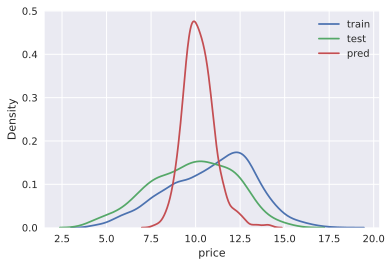

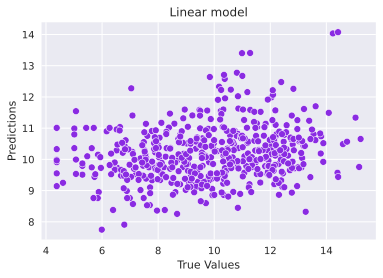

In [130]:
target_distr_linear(y_train, y_test, y_pred)   

In [131]:
def inverse_transform(feature):
    return np.expm1(feature)

calc_metrics(inverse_transform(y_test), inverse_transform(y_pred))

*** VAL **: 
MSE:   155171550304.3972
RMSE:  393918.2025552985
R2:    -0.01456431508212086
MAE:   132914.93257946902
MedAE: 28432.325793007272
------------------------------


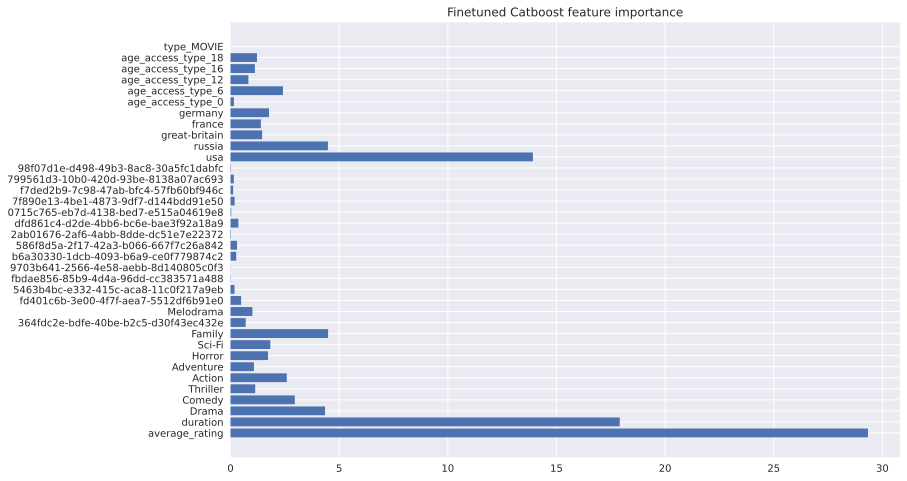

In [132]:
get_feature_imp(best_cat, train_dataset)

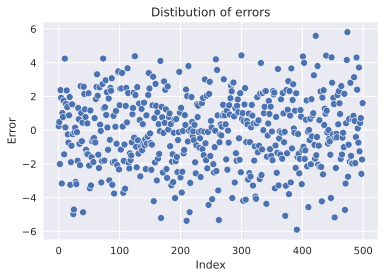

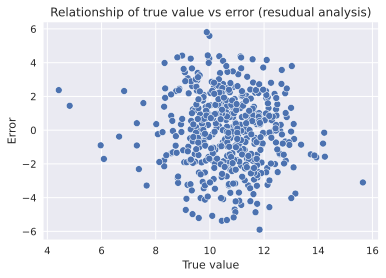

In [69]:
errors = y_test - y_pred
draw_res_analys(errors, y_pred)

# Other models

### knn imp

In [141]:
from sklearn.impute import KNNImputer

In [142]:
imputer = KNNImputer()

imputer.fit(X_train[['average_rating']])

KNNImputer()

In [143]:
train = imputer.transform(X_train[['average_rating']])
test = imputer.transform(X_test[['average_rating']])

In [144]:
X_train['average_rating'] = train

In [145]:
X_test['average_rating'] = test

# KNN Regressor

In [75]:
def target_distr_linear(train_label, test_label, predicted_dv): 
    sns.kdeplot(train_label, label='train')
    sns.kdeplot(test_label, label='test')
    sns.kdeplot(predicted_dv, label='pred')
    plt.legend()
    plt.show()

    sns.scatterplot(test_label, predicted_dv, color='blueviolet')
    plt.title('Linear model')
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.show()

In [76]:
from scipy.stats import norm

def draw_histogram(data):
    f,ax_hist = plt.subplots(1)
    sns.distplot(data, hist=True,  kde=True, rug=True, bins=10, fit=norm, ax=ax_hist);
    plt.xlabel("values")
    plt.title("Distribution") 

    mean=data.mean()

    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()

    plt.show()

In [77]:
from sklearn.inspection import permutation_importance

def get_fi_knn(model,X_train, y_train, top15=None):
    plt.figure(figsize=(25,9))
    coef_table = pd.DataFrame(list(X_train.columns)).copy()
    results = permutation_importance(model, X_train, y_train, scoring='neg_mean_absolute_error', n_repeats=1)

    importance = results.importances_mean
    coef_table.insert(len(coef_table.columns),"Coefs",np.abs(importance).transpose())

    if top15 =='yes':
        coef_table = coef_table.sort_values(by='Coefs', ascending=False)[:15]


    sns.barplot(x=0, y='Coefs', data=coef_table)
    plt.title('Feature importance')
    plt.xlabel('features')
    plt.ylabel('abs_weight')
    plt.xticks(rotation=65)
    plt.show()

In [78]:
def draw_res_analys(errors, pred):
    sns.scatterplot(list(range(len(errors))),errors);
    plt.title("Distibution of errors")
    plt.ylabel('Error');
    plt.xlabel('Index');
    plt.show();

    sns.scatterplot(pred,errors);
    plt.title('Relationship of true value vs error (resudual analysis)')
    plt.ylabel('Error');
    plt.xlabel('True value');
    plt.show();

In [79]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import KFold

In [146]:
params = [
    {
        'n_neighbors': [i for i in range(2, 50, 2)],
        'weights': ['uniform', 'distance'],
        'leaf_size' : [2,5,10,30,50]
    }
]

In [147]:
knn_reg_model = KNeighborsRegressor()

cv = KFold(n_splits=5, shuffle=True, random_state=42)
gs = RandomizedSearchCV(knn_reg_model, params, 
                  n_jobs=-1, 
                  scoring=['neg_mean_absolute_error', 'r2'], 
                  refit='neg_mean_absolute_error', 
                  cv=cv)

In [148]:
%%time
gs.fit(X_train, y_train);

CPU times: user 66.7 ms, sys: 9.24 ms, total: 76 ms
Wall time: 269 ms


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=KNeighborsRegressor(), n_jobs=-1,
                   param_distributions=[{'leaf_size': [2, 5, 10, 30, 50],
                                         'n_neighbors': [2, 4, 6, 8, 10, 12, 14,
                                                         16, 18, 20, 22, 24, 26,
                                                         28, 30, 32, 34, 36, 38,
                                                         40, 42, 44, 46, 48],
                                         'weights': ['uniform', 'distance']}],
                   refit='neg_mean_absolute_error',
                   scoring=['neg_mean_absolute_error', 'r2'])

In [149]:
gs.best_params_

{'weights': 'distance', 'n_neighbors': 46, 'leaf_size': 50}

In [150]:
knn_reg_model = KNeighborsRegressor(leaf_size=50, n_neighbors=46, weights='distance')
knn_reg_model.fit(X_train, y_train)

KNeighborsRegressor(leaf_size=50, n_neighbors=46, weights='distance')

In [168]:
pred = knn_reg_model.predict(X_test)

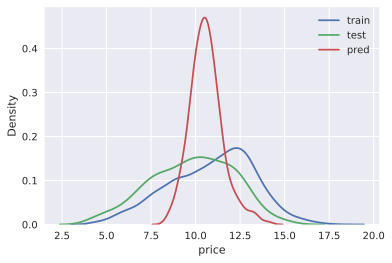

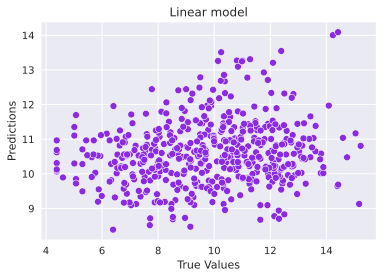

In [152]:
target_distr_linear(y_train, y_test, pred)   

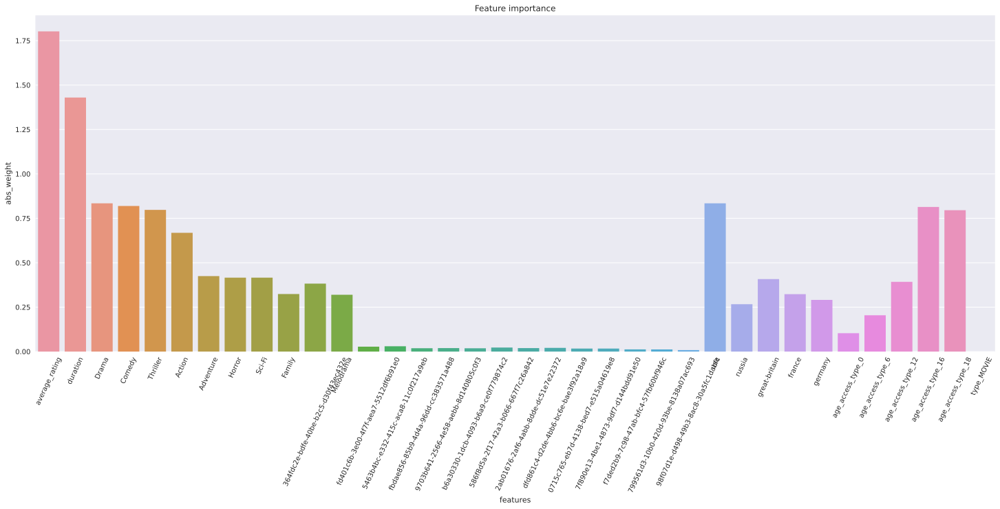

In [153]:
get_fi_knn(knn_reg_model, X_train, y_train)

**Detecting heteroscedasticity**

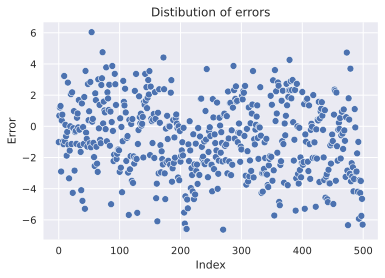

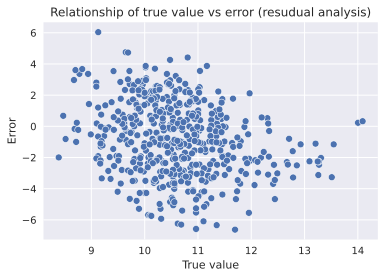

In [154]:
errors = y_test - pred
draw_res_analys(errors, pred)

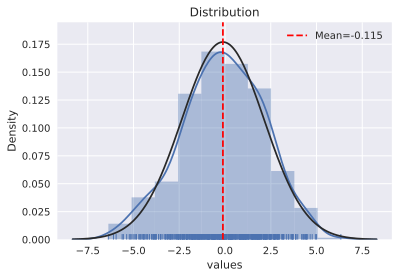

In [89]:
error = y_test - pred
draw_histogram(error)

In [169]:

calc_metrics(inverse_transform(y_test), inverse_transform(pred))

*** VAL **: 
MSE:   159247200156.48907
RMSE:  399057.8907332733
R2:    -0.04121229850814556
MAE:   147583.74360910774
MedAE: 44106.36992402267
------------------------------


## Boosting Regressor - XGBRegressor

In [92]:
def get_feature_importance(model, top15=None):
    plt.figure(figsize=(25,9))
    coef_table = pd.DataFrame(list(X_train.columns)).copy()
    coef_table.insert(len(coef_table.columns),"Coefs",np.abs(model.feature_importances_).transpose())

    if top15 =='yes':
        coef_table = coef_table.sort_values(by='Coefs', ascending=False)[:15]


    sns.barplot(x=0, y='Coefs', data=coef_table)
    plt.title('Feature importance')
    plt.xlabel('features')
    plt.ylabel('abs_weight')
    plt.xticks(rotation=65)
    plt.show()

In [93]:
!pip install xgboost

In [94]:
import xgboost as xgb

In [95]:
params = [
              {'nthread':[4], #when use hyperthread, xgboost may become slower
              'objective':['reg:squarederror'],
              'learning_rate': [.03, 0.05, .07],
              'max_depth': [5, 6, 7],
              'min_child_weight': [4],
              'subsample': [0.7],
              'colsample_bytree': [0.7],
              'n_estimators': [500, 1000]}
        ]

In [96]:
xgbr_model = xgb.XGBRegressor() 

cv = KFold(n_splits=5, shuffle=True, random_state=42)
gs = RandomizedSearchCV(xgbr_model, params, 
                  n_jobs=-1, 
                  scoring=['neg_mean_absolute_error', 'r2'], 
                  refit='neg_mean_absolute_error', 
                  cv=cv)

In [97]:
%%time
gs.fit(X_train, y_train)

CPU times: user 4.41 s, sys: 18.8 ms, total: 4.42 s
Wall time: 21min


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, gpu_id=None,
                                          grow_policy=None,
                                          importance_type=Non...
                                          num_parallel_tree=None,
                                          predictor=None, random_state=None, ...),
                   n_jobs=-1,
                   param_distributions=[{'colsample_bytree': [0.7],
                                         'learning_rate': [0.03, 0.05, 0.07],
                                         'max_depth': [5, 6, 7],
                                         'min_child_weight': [4],
                                         'n_estimators': [500, 1000],
                                         'nthread': [4],
                                         'objective': ['reg:squarederror'],
                                         'subsample': [0.7]}],
                   refit='neg_mean_absolute_error',
                   scoring=['neg_mean_absolute_error', 'r2'])

In [98]:
gs.best_params_

{'subsample': 0.7,
 'objective': 'reg:squarederror',
 'nthread': 4,
 'n_estimators': 500,
 'min_child_weight': 4,
 'max_depth': 6,
 'learning_rate': 0.03,
 'colsample_bytree': 0.7}

In [99]:
xgbr_model = xgb.XGBRegressor(colsample_bytree=0.7,
                              learning_rate=0.03,
                              max_depth=5,
                              min_child_weight=4,
                              n_estimators=500,
                              nthread=4,
                              objective ='reg:squarederror',
                              subsample=0.7) 
xgbr_model.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.7,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.03, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=5, max_leaves=0, min_child_weight=4, missing=nan,
             monotone_constraints='()', n_estimators=500, n_jobs=4, nthread=4,
             num_parallel_tree=1, predictor='auto', ...)

In [100]:
pred = xgbr_model.predict(X_test)

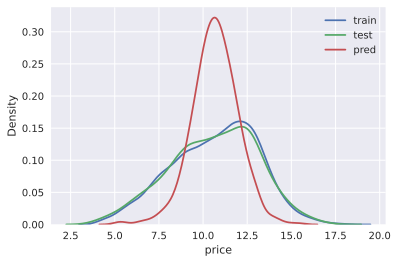

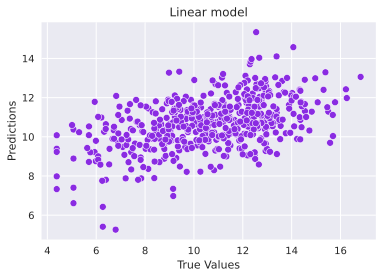

In [101]:
target_distr_linear(y_train, y_test, pred)   

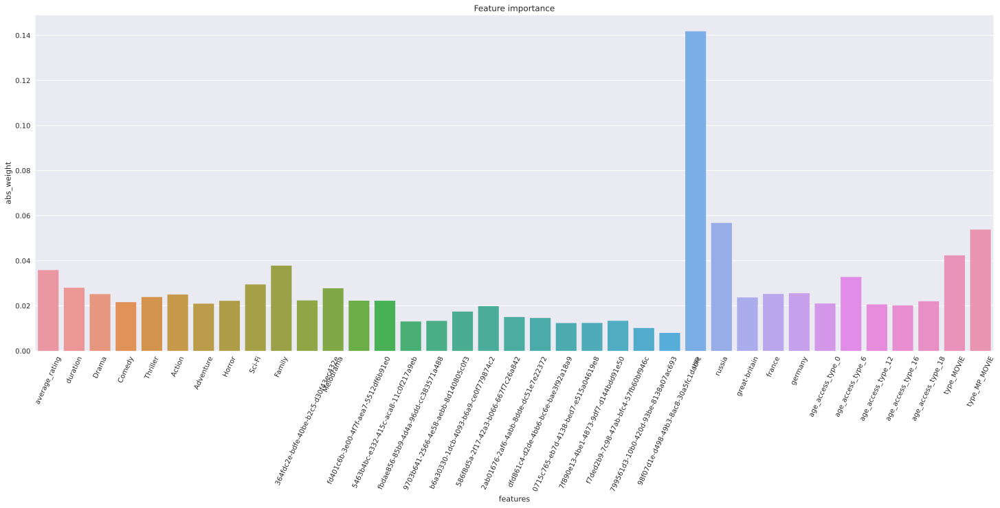

In [102]:
get_feature_importance(xgbr_model)

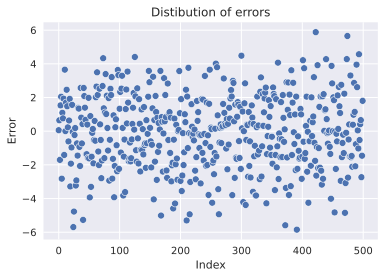

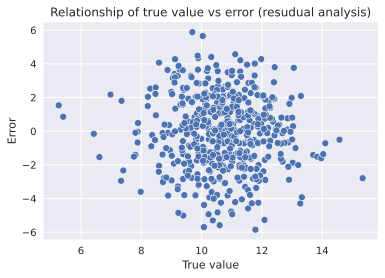

In [104]:
errors = y_test - pred
draw_res_analys(errors, pred) 

In [105]:

calc_metrics(inverse_transform(y_test), inverse_transform(y_pred))

*** VAL **: 
MSE:   2065330664343.414
RMSE:  1437125.8345543072
R2:    -0.05675216113488446
MAE:   389608.0989108528
MedAE: 56972.505835857635
------------------------------


## Random Forest

In [156]:
from sklearn.ensemble import RandomForestRegressor

In [157]:
params = [
    {
        'max_depth': range(20, 50),
        'n_estimators': range(100, 161)

    }
]

In [158]:
rf_model = RandomForestRegressor(random_state=42)

cv = KFold(n_splits=5, shuffle=True, random_state=42)
gs = RandomizedSearchCV(rf_model, params, 
                  n_jobs=-1, 
                  scoring=['neg_mean_absolute_error', 'r2'], 
                  refit='neg_mean_absolute_error', 
                  cv=cv)

In [159]:
%%time
gs.fit(X_train, y_train);

CPU times: user 2.02 s, sys: 14.5 ms, total: 2.03 s
Wall time: 10.9 s


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=RandomForestRegressor(random_state=42), n_jobs=-1,
                   param_distributions=[{'max_depth': range(20, 50),
                                         'n_estimators': range(100, 161)}],
                   refit='neg_mean_absolute_error',
                   scoring=['neg_mean_absolute_error', 'r2'])

In [160]:
gs.best_params_

{'n_estimators': 155, 'max_depth': 30}

In [161]:
rf_model = RandomForestRegressor(random_state=42, max_depth=30, n_estimators=155)
rf_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=30, n_estimators=155, random_state=42)

In [162]:
pred = rf_model.predict(X_test)

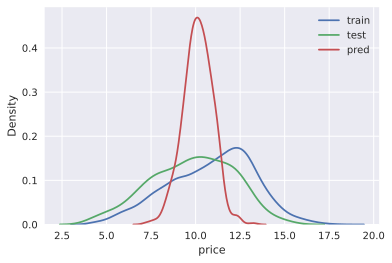

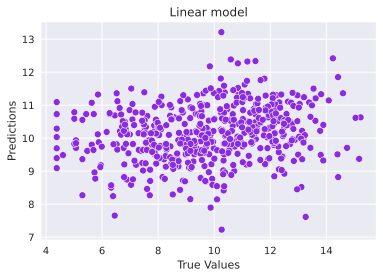

In [163]:
target_distr_linear(y_train, y_test, pred)   

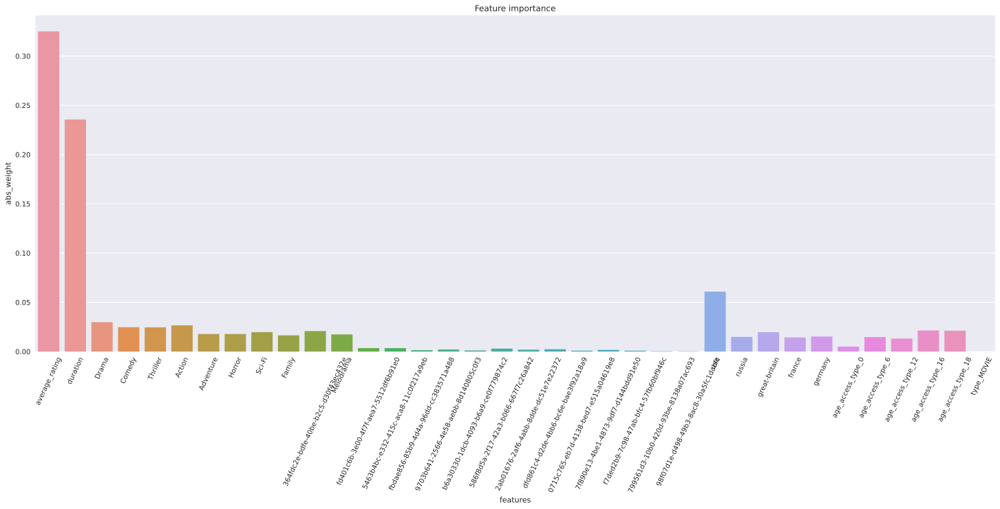

In [164]:
get_feature_importance(rf_model)

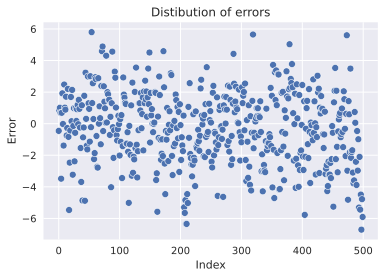

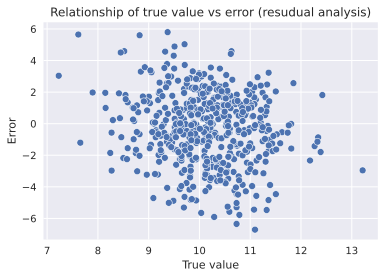

In [165]:
errors = y_test - pred

draw_res_analys(errors, pred) # 

In [167]:

calc_metrics(inverse_transform(y_test), inverse_transform(pred))

*** VAL **: 
MSE:   162501003837.8485
RMSE:  403114.1325206157
R2:    -0.06248677244949774
MAE:   133625.25625167097
MedAE: 29610.346251171177
------------------------------


## SVM Regressor

In [170]:
from sklearn.svm import LinearSVR

In [171]:
params = [
    {
        'C': [0.001,0.01,0.1,1,10,100,1000],
        'tol' : [1e-4, 1e-3]
    }
]

In [172]:
svr_model = LinearSVR(random_state=42)

cv = KFold(n_splits=5, shuffle=True, random_state=42)
gs = RandomizedSearchCV(svr_model, params, 
                  n_jobs=-1, 
                  scoring=['neg_mean_absolute_error', 'r2'], 
                  refit='neg_mean_absolute_error', 
                  cv=cv)

In [173]:
%%time
gs.fit(X_train, y_train);

CPU times: user 117 ms, sys: 121 ms, total: 238 ms
Wall time: 1.56 s


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=LinearSVR(random_state=42), n_jobs=-1,
                   param_distributions=[{'C': [0.001, 0.01, 0.1, 1, 10, 100,
                                               1000],
                                         'tol': [0.0001, 0.001]}],
                   refit='neg_mean_absolute_error',
                   scoring=['neg_mean_absolute_error', 'r2'])

In [174]:
gs.best_params_

{'tol': 0.0001, 'C': 0.1}

In [176]:
svr_model =  LinearSVR(C=0.1, tol=0.0001, random_state=42)
svr_model.fit(X_train, y_train)

LinearSVR(C=0.1, random_state=42)

In [177]:
pred = svr_model.predict(X_test)

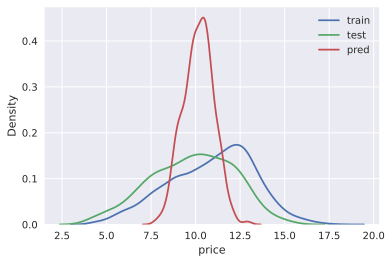

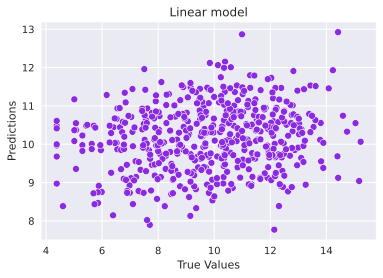

In [178]:
target_distr_linear(y_train, y_test, pred)  

In [179]:
def get_feat_imp_coef(model, top15=None):
    plt.figure(figsize=(25,9))
    coef_table = pd.DataFrame(list(X_train.columns)).copy()
    coef_table.insert(len(coef_table.columns),"Coefs",np.abs(model.coef_).transpose())

    if top15 =='yes':
        coef_table = coef_table.sort_values(by='Coefs', ascending=False)[:15]


    sns.barplot(x=0, y='Coefs', data=coef_table)
    plt.title('Feature importance')
    plt.xlabel('features')
    plt.ylabel('abs_weight')
    plt.xticks(rotation=65)
    plt.show()

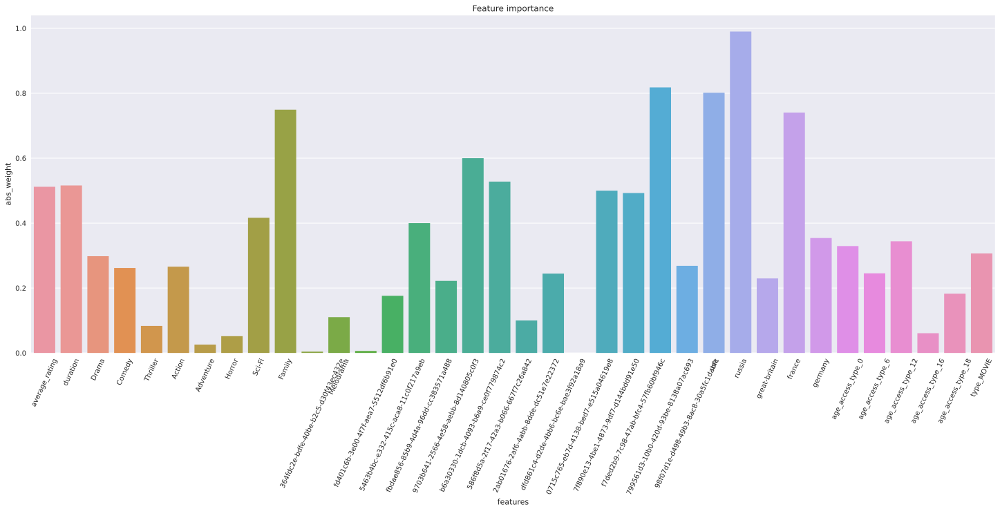

In [180]:
get_feat_imp_coef(svr_model)

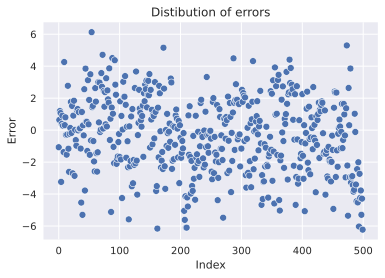

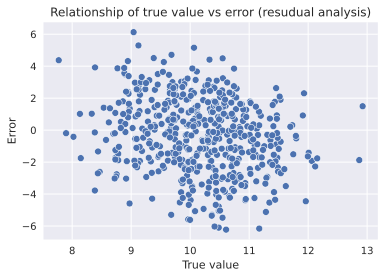

In [181]:
errors = y_test - pred
draw_res_analys(errors, pred)

In [182]:

calc_metrics(inverse_transform(y_test), inverse_transform(pred))

*** VAL **: 
MSE:   161821503193.01422
RMSE:  402270.43539516325
R2:    -0.058043966374725864
MAE:   135310.99779522288
MedAE: 33960.73809894205
------------------------------
